In [1]:
import rpy2
%load_ext rpy2.ipython
%R library(lme4)
%R library(sjPlot)
%R library(ggplot2)
%R library(readr)

import os
import sys
import math
import fminbnd
import pandas as pd
from joblib import Parallel, delayed
import scipy.stats as stats
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as ptch
import multiprocessing
import seaborn as sns
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import scipy
from scipy.stats import norm
from scipy.signal import fftconvolve
import pickle
import datetime
from statistics import mean
import brewer2mpl as b2mpl


/Users/alicexue/anaconda2/lib/python2.7/site-packages/rpy2/rinterface/__init__.py:186: RRuntimeWarning: Loading required package: Matrix

  warnings.warn(x, RRuntimeWarning)


[Link to main figures](#main_figures)

In [2]:
expId = 'MDMRTS'

_thisDir = os.path.dirname(os.path.abspath('__file__')).decode(sys.getfilesystemencoding())

_dataDir = os.path.dirname(_thisDir) # move one directory up
_dataDir = _dataDir + '/data/' + expId + '/' # move to data folder

auctionFileEnd = '_AuctionData2.csv'
choiceFileEnd = '_SceneChoiceTaskData.csv'
familiarityRatingsFileEnd = '_FamiliarityData.csv'

def get_all_subjects():
    subjects = []
    dataDir = _thisDir + '/' + expId + '/'
    
    subjectInfoFile = _dataDir + expId + '_subject_assignment_info.csv'
    df = pd.read_csv(subjectInfoFile)
    subjects = df['subjectId'].values
    return subjects

# get subjects who completed up to familiarity task
def get_subjects_w_full_data():
    subjectInfoFile = _dataDir + expId + '_subject_assignment_info.csv'
    all_subjects = get_all_subjects()
    print "total number of people who accepted the HIT",len(all_subjects)
    subjects = []
    
    subjects_to_exclude = ['MDMRTS_0060', 'MDMRTS_0025']
    
    if os.path.exists(subjectInfoFile):
        df = pd.read_csv(subjectInfoFile)
        for subject in all_subjects:
            fromMTurk = df.loc[df['subjectId'] == subject]['turkSubmitTo'] == 'https://www.mturk.com'
            completedAuction = df.loc[df['subjectId'] == subject]['completedAuction2'] 
            completedChoiceTask = df.loc[df['subjectId'] == subject]['completedSceneChoiceTask']
            if subject not in subjects_to_exclude and fromMTurk.bool() and completedAuction.bool() and completedChoiceTask.bool():
                subjects.append(subject)
    print len(subjects), 'subjects completed the auction and choice tasks.'
    return subjects

# get subjects who completed everything, including familiarity task
def get_subjects_w_all_data():
    subjectInfoFile = _dataDir + expId + '_subject_assignment_info.csv'
    all_subjects = get_all_subjects()
    print "total number of people who accepted the HIT",len(all_subjects)
    subjects = []
    
    subjects_to_exclude = ['MDMRTS_0060', 'MDMRTS_0025']
    
    if os.path.exists(subjectInfoFile):
        df = pd.read_csv(subjectInfoFile)
        for subject in all_subjects:
            fromMTurk = df.loc[df['subjectId'] == subject]['turkSubmitTo'] == 'https://www.mturk.com'
            completedAuction = df.loc[df['subjectId'] == subject]['completedAuction2'] 
            completedChoiceTask = df.loc[df['subjectId'] == subject]['completedSceneChoiceTask']
            completedFamiliarityTask = df.loc[df['subjectId'] == subject]['completedFamiliarityTask']
            if subject not in subjects_to_exclude and fromMTurk.bool() and completedAuction.bool() and completedChoiceTask.bool() and completedFamiliarityTask.bool():
                subjects.append(subject)
    print len(subjects), 'subjects completed all the tasks.'
    return subjects

In [4]:
get_subjects_w_full_data();
get_subjects_w_all_data();

total number of people who accepted the HIT 153
106 subjects completed the auction and choice tasks.
total number of people who accepted the HIT 153
104 subjects completed all the tasks.


In [3]:
def get_subject_consistency_nRsps(subjectId):
    subjectFolder = _dataDir + subjectId + '/'

    auctionFile = subjectFolder + subjectId + auctionFileEnd
    choiceFile = subjectFolder + subjectId + choiceFileEnd

    if os.path.exists(choiceFile):
        choiceData = pd.read_csv(choiceFile)

        receivedResponseClmn = choiceData['receivedResponse']

        # where stimulus 1 would be correct (consistent) choice
        stim1CorrectRsp = choiceData['stimulus1Bid'] > choiceData['stimulus2Bid']
        
        choices = choiceData['selected'] == choiceData['stimulus1']
        consistentRsps = stim1CorrectRsp == choices
        consistentRsps = consistentRsps[receivedResponseClmn == True]
        consistency = round(consistentRsps.mean(), 2)
        nResponses = receivedResponseClmn.sum()

        return [consistency, nResponses]
    return [0, 0]

def get_consistency_nRsps():
    subjects = get_subjects_w_full_data()
    all_consistency = []
    all_nRsps = []
    n = len(subjects)
    for subject in subjects:
        [consistency, nRsps] = get_subject_consistency_nRsps(subject)
        all_consistency.append(consistency)
        all_nRsps.append(nRsps)
    d = {'subject':subjects, 'consistency':all_consistency, 'nRsps':all_nRsps}
    df = pd.DataFrame(data=d)
    print
    print "Minimum Consistency Rate:\t", min(all_consistency)
    print "Maximum Consistency Rate:\t", max(all_consistency)
    print "Mean Consistency Rate:\t\t", round(np.mean(all_consistency),2), "±", round(np.std(all_consistency) / math.sqrt(n),2)
    print
    print "Minimum Number of Responses:\t", min(all_nRsps)
    print "Maximum Number of Responses:\t", max(all_nRsps)
    print "Mean Number of Responses:\t", round(np.mean(all_nRsps),2), "±", round(np.std(all_nRsps) / math.sqrt(n),2)

In [6]:
get_consistency_nRsps();

total number of people who accepted the HIT 153
106 subjects completed the auction and choice tasks.

Minimum Consistency Rate:	0.44
Maximum Consistency Rate:	0.83
Mean Consistency Rate:		0.64 ± 0.01

Minimum Number of Responses:	137
Maximum Number of Responses:	280
Mean Number of Responses:	275.17 ± 1.44


In [4]:
def get_ratings_mean_and_std(subjectId):
    subjectFolder = _dataDir + subjectId + '/'
    auctionFile = subjectFolder + subjectId + auctionFileEnd
    df = pd.read_csv(auctionFile)
    ratings = df["rating"]
    mean = np.mean(ratings)
    std = np.std(ratings)
    return mean, std

In [8]:
def get_subject_p_logistic(subjectId, zscoreRatings, printFigs):
    subjectFolder = _dataDir + subjectId + '/'
    choiceFile = subjectFolder + subjectId + choiceFileEnd
    if os.path.exists(choiceFile):
        df = pd.read_csv(choiceFile)
        
        # remove trials with no response and where RT <= 300ms
        df = df.loc[(df["receivedResponse"] == True) & (df["rt"] > 300)]
        
        rightStimRatings = df["stimulus2Bid"]
        leftStimRatings = df["stimulus1Bid"]
        
        if zscoreRatings:
            mean, std = get_ratings_mean_and_std(subjectId)
            rightStimRatings = (rightStimRatings - mean) / std
            leftStimRatings = (leftStimRatings - mean) / std
        
        delta = rightStimRatings - leftStimRatings
        choseRight = df["selected"] == df["stimulus2"]
        choseRight.replace([True],[1],inplace=True)
        choseRight.replace([False],[0],inplace=True)
        
        d = {'delta':delta, 'PRight':choseRight}
        df2 = pd.DataFrame(data=d)
        
        df2 = df2.sort_values('delta',axis=0, ascending = True) 
        df2 = df2.reset_index(drop=True)
        y = df2.rolling(window=10,min_periods=1).mean()

        if printFigs:
            plt.plot(y['delta'],y['PRight'],color='grey')
            axes = plt.gca()
            axes.set_title(subjectId)
            axes.set_xlabel(r'$\Delta$Value (Right - Left)')
            axes.set_ylabel('P(respond right)')
            axes.set_xlim(-10,10)
            axes.set_ylim(0,1)

            sns.set_style("whitegrid")
            sns.set(style="ticks")
            sns.despine(offset=5)
            plt.show()

            [consistency, nResponses] = get_subject_consistency_nRsps(subjectId)
            print "consistency:", consistency
            print "nTrials:", nResponses

        model = sm.Logit(df2["PRight"], df2["delta"])
        result = model.fit(disp=0)
        
        if printFigs:
            print result.summary()
            
        pval = result.pvalues["delta"]
        return df2, pval
        
def get_p_logistic_plots(zscoreRatings, printFigs):
    subjects = get_subjects_w_full_data()
    n = len(subjects)
    pvals = []
    for subject in subjects:
        sub_df, pval = get_subject_p_logistic(subject, zscoreRatings, printFigs)
        pvals.append(pval)
    results = {"subjectId":subjects, "p value":pvals}
    df = pd.DataFrame(data=results)
    df_sig_pval = df.loc[df['p value'] < 0.05]
    #print df_sig_pval.to_string()
    print "Of", df.shape[0], "subjects,", df_sig_pval.shape[0], "subjects had significant p values for the logistic regression."
    return df_sig_pval

total number of people who accepted the HIT 153
106 subjects completed the auction and choice tasks.


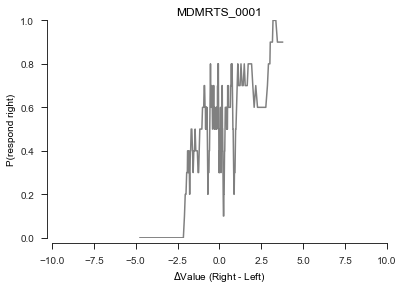

consistency: 0.6
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1063
Time:                        00:41:50   Log-Likelihood:                -173.44
converged:                       True   LL-Null:                       -194.07
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5437      0.097      5.629      0.000       0.354       0.733


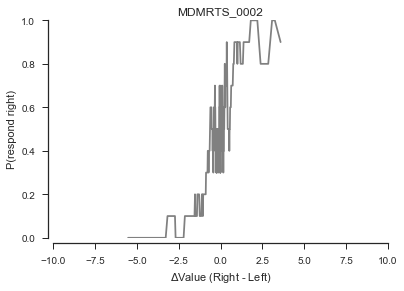

consistency: 0.71
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.2140
Time:                        00:41:51   Log-Likelihood:                -151.74
converged:                       True   LL-Null:                       -193.05
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.9849      0.148      6.647      0.000       0.694       1.275


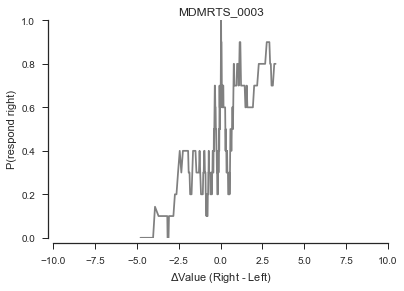

consistency: 0.66
nTrials: 277
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  277
Model:                          Logit   Df Residuals:                      276
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1021
Time:                        00:41:51   Log-Likelihood:                -171.82
converged:                       True   LL-Null:                       -191.35
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5700      0.103      5.552      0.000       0.369       0.771


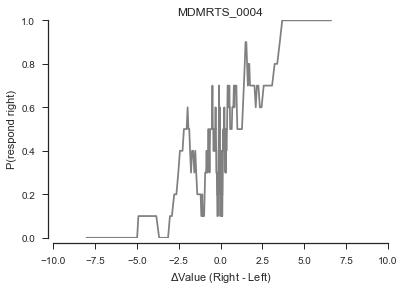

consistency: 0.65
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  263
Model:                          Logit   Df Residuals:                      262
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1636
Time:                        00:41:51   Log-Likelihood:                -150.74
converged:                       True   LL-Null:                       -180.22
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5782      0.100      5.781      0.000       0.382       0.774


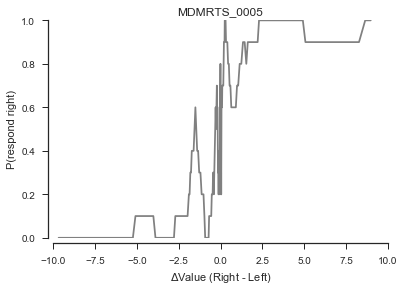

consistency: 0.73
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.2590
Time:                        00:41:52   Log-Likelihood:                -143.80
converged:                       True   LL-Null:                       -194.07
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8419      0.145      5.803      0.000       0.558       1.126


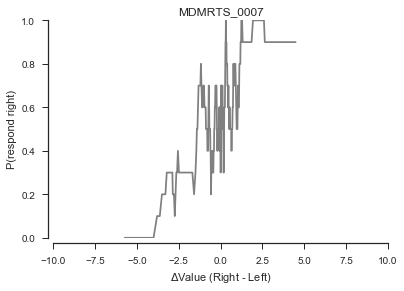

consistency: 0.65
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1095
Time:                        00:41:52   Log-Likelihood:                -168.03
converged:                       True   LL-Null:                       -188.70
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6004      0.102      5.864      0.000       0.400       0.801


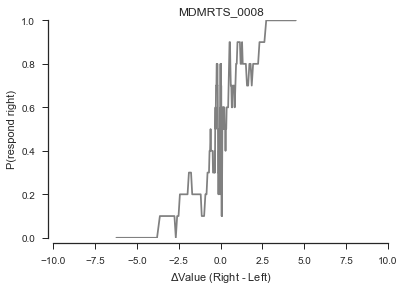

consistency: 0.66
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1503
Time:                        00:41:53   Log-Likelihood:                -164.25
converged:                       True   LL-Null:                       -193.30
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.9122      0.167      5.450      0.000       0.584       1.240


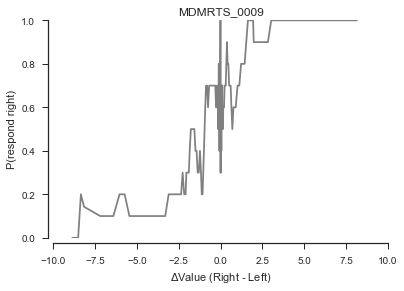

consistency: 0.64
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1721
Time:                        00:41:53   Log-Likelihood:                -152.48
converged:                       True   LL-Null:                       -184.19
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6204      0.105      5.895      0.000       0.414       0.827


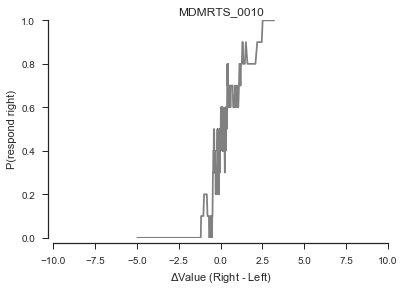

consistency: 0.75
nTrials: 253
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  253
Model:                          Logit   Df Residuals:                      252
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.2863
Time:                        00:41:53   Log-Likelihood:                -122.03
converged:                       True   LL-Null:                       -170.98
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.6674      0.252      6.619      0.000       1.174       2.161


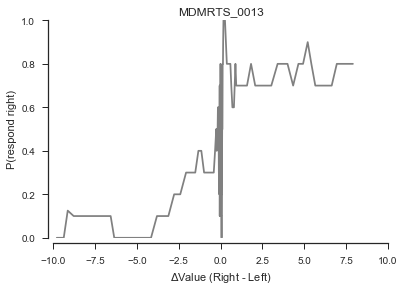

consistency: 0.58
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.08486
Time:                        00:41:54   Log-Likelihood:                -175.19
converged:                       True   LL-Null:                       -191.43
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3548      0.080      4.428      0.000       0.198       0.512


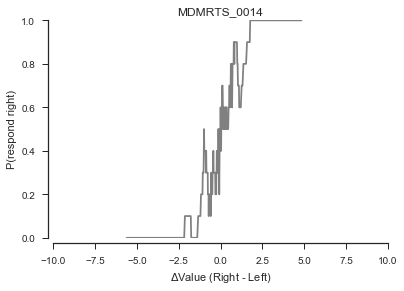

consistency: 0.78
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.3758
Time:                        00:41:54   Log-Likelihood:                -120.21
converged:                       True   LL-Null:                       -192.58
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.4797      0.205      7.219      0.000       1.078       1.881


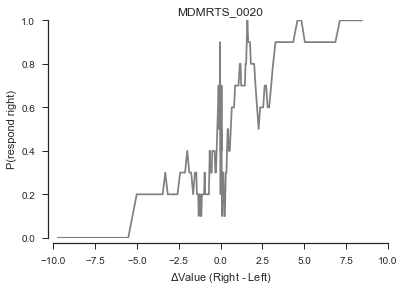

consistency: 0.6
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1763
Time:                        00:41:54   Log-Likelihood:                -159.58
converged:                       True   LL-Null:                       -193.73
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5187      0.094      5.522      0.000       0.335       0.703


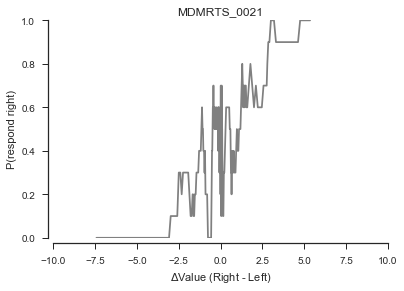

consistency: 0.62
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1394
Time:                        00:41:55   Log-Likelihood:                -163.75
converged:                       True   LL-Null:                       -190.29
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6323      0.106      5.954      0.000       0.424       0.840


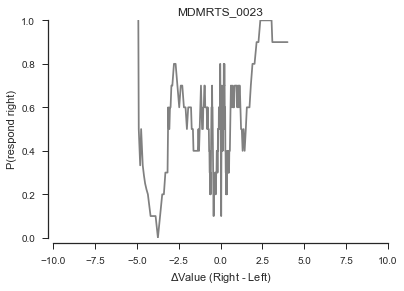

consistency: 0.57
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.03950
Time:                        00:41:55   Log-Likelihood:                -185.61
converged:                       True   LL-Null:                       -193.24
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2951      0.079      3.716      0.000       0.139       0.451


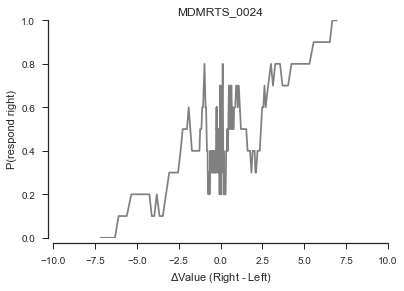

consistency: 0.59
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.08608
Time:                        00:41:55   Log-Likelihood:                -176.09
converged:                       True   LL-Null:                       -192.68
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3411      0.068      4.997      0.000       0.207       0.475


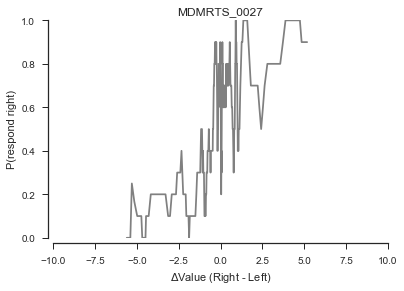

consistency: 0.67
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1567
Time:                        00:41:56   Log-Likelihood:                -162.74
converged:                       True   LL-Null:                       -192.98
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5734      0.093      6.151      0.000       0.391       0.756


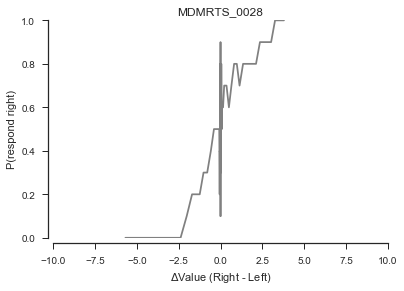

consistency: 0.52
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1115
Time:                        00:41:56   Log-Likelihood:                -169.87
converged:                       True   LL-Null:                       -191.19
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.3462      0.411      3.279      0.001       0.542       2.151


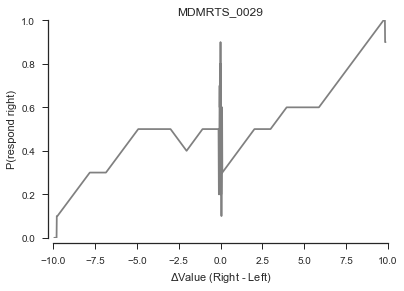

consistency: 0.57
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1106
Time:                        00:41:56   Log-Likelihood:                -172.46
converged:                       True   LL-Null:                       -193.90
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3062      0.073      4.181      0.000       0.163       0.450


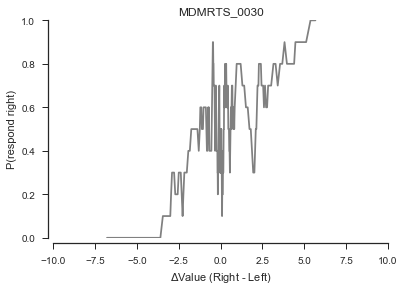

consistency: 0.58
nTrials: 275
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  275
Model:                          Logit   Df Residuals:                      274
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1001
Time:                        00:41:57   Log-Likelihood:                -171.53
converged:                       True   LL-Null:                       -190.61
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4203      0.080      5.221      0.000       0.263       0.578


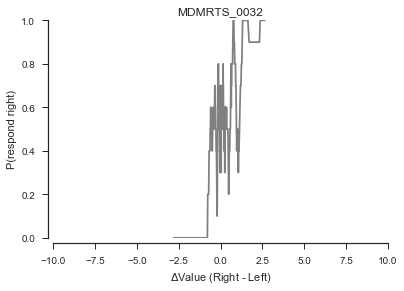

consistency: 0.66
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1923
Time:                        00:41:57   Log-Likelihood:                -155.54
converged:                       True   LL-Null:                       -192.58
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.3234      0.205      6.447      0.000       0.921       1.726


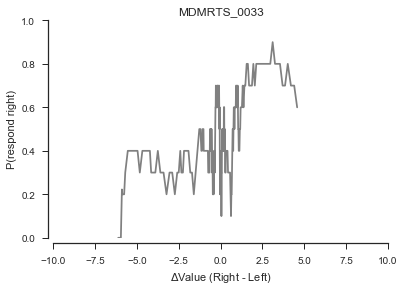

consistency: 0.56
nTrials: 275
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  263
Model:                          Logit   Df Residuals:                      262
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.02860
Time:                        00:41:57   Log-Likelihood:                -175.93
converged:                       True   LL-Null:                       -181.11
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2248      0.067      3.356      0.001       0.094       0.356


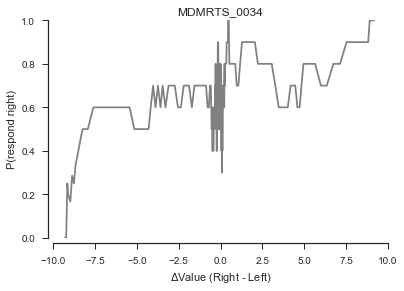

consistency: 0.58
nTrials: 270
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  269
Model:                          Logit   Df Residuals:                      268
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                -0.05663
Time:                        00:41:57   Log-Likelihood:                -178.90
converged:                       True   LL-Null:                       -169.31
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.1503      0.042      3.586      0.000       0.068       0.233


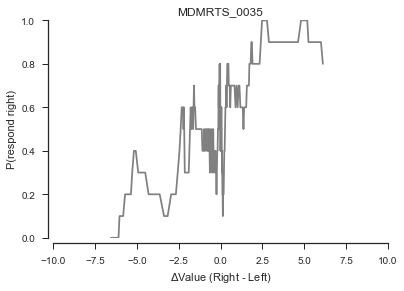

consistency: 0.6
nTrials: 277
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.09435
Time:                        00:41:58   Log-Likelihood:                -171.78
converged:                       True   LL-Null:                       -189.67
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3569      0.067      5.331      0.000       0.226       0.488


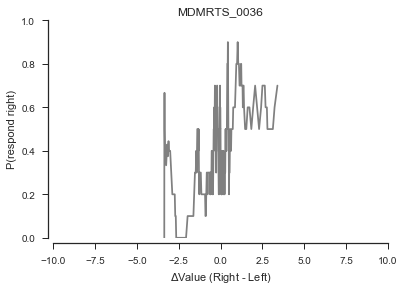

consistency: 0.58
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.03573
Time:                        00:41:58   Log-Likelihood:                -183.49
converged:                       True   LL-Null:                       -190.29
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4319      0.101      4.270      0.000       0.234       0.630


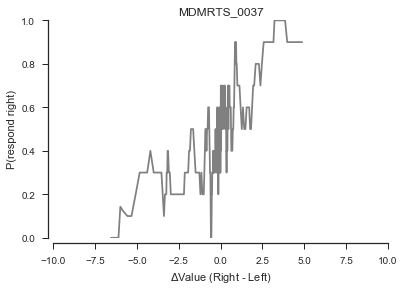

consistency: 0.67
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1095
Time:                        00:41:58   Log-Likelihood:                -172.09
converged:                       True   LL-Null:                       -193.24
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4540      0.082      5.511      0.000       0.293       0.615


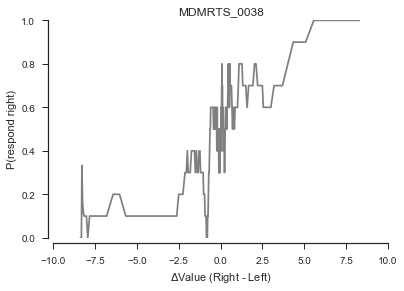

consistency: 0.68
nTrials: 255
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  255
Model:                          Logit   Df Residuals:                      254
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1489
Time:                        00:41:59   Log-Likelihood:                -150.36
converged:                       True   LL-Null:                       -176.66
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4268      0.083      5.137      0.000       0.264       0.590


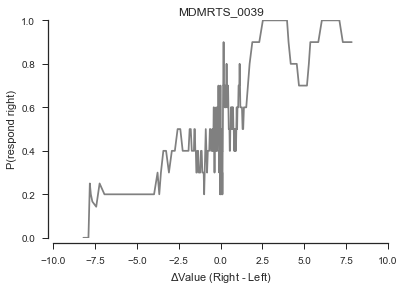

consistency: 0.62
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1008
Time:                        00:41:59   Log-Likelihood:                -171.92
converged:                       True   LL-Null:                       -191.19
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3246      0.063      5.125      0.000       0.200       0.449


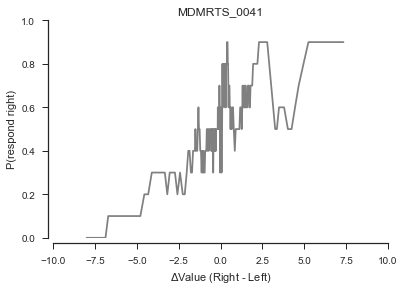

consistency: 0.65
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1060
Time:                        00:41:59   Log-Likelihood:                -172.87
converged:                       True   LL-Null:                       -193.37
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3524      0.067      5.295      0.000       0.222       0.483


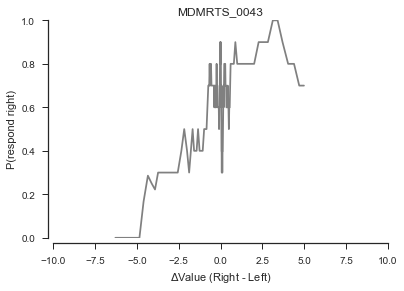

consistency: 0.52
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  139
Model:                          Logit   Df Residuals:                      138
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                -0.01352
Time:                        00:42:00   Log-Likelihood:                -92.598
converged:                       True   LL-Null:                       -91.363
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2680      0.107      2.507      0.012       0.059       0.478


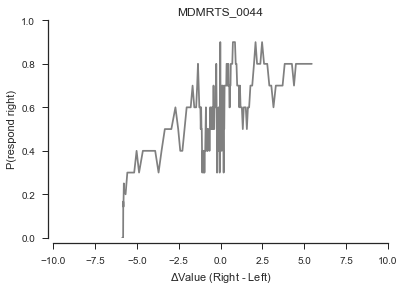

consistency: 0.57
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  255
Model:                          Logit   Df Residuals:                      254
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.02351
Time:                        00:42:00   Log-Likelihood:                -168.70
converged:                       True   LL-Null:                       -172.76
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2532      0.068      3.706      0.000       0.119       0.387


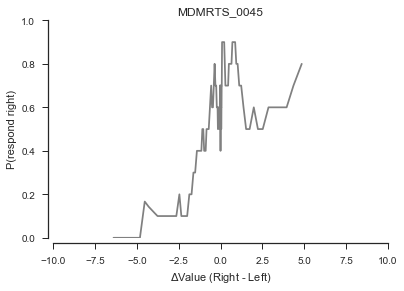

consistency: 0.61
nTrials: 137
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  137
Model:                          Logit   Df Residuals:                      136
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.06274
Time:                        00:42:00   Log-Likelihood:                -87.764
converged:                       True   LL-Null:                       -93.639
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4183      0.132      3.170      0.002       0.160       0.677


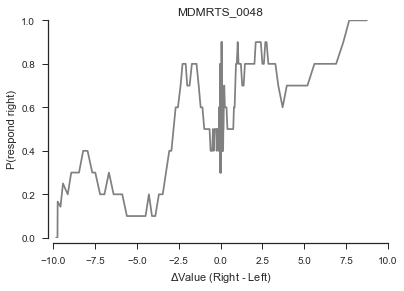

consistency: 0.62
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.04872
Time:                        00:42:00   Log-Likelihood:                -180.36
converged:                       True   LL-Null:                       -189.59
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2401      0.055      4.403      0.000       0.133       0.347


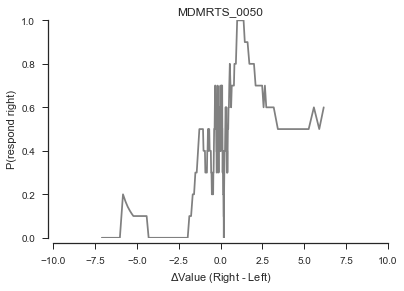

consistency: 0.62
nTrials: 268
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  268
Model:                          Logit   Df Residuals:                      267
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.06568
Time:                        00:42:01   Log-Likelihood:                -171.77
converged:                       True   LL-Null:                       -183.85
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3678      0.081      4.529      0.000       0.209       0.527


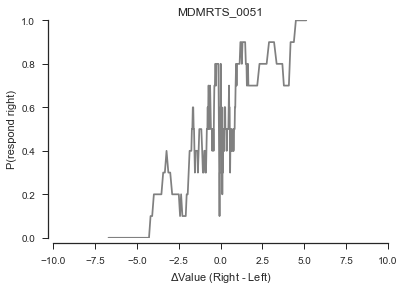

consistency: 0.62
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1245
Time:                        00:42:01   Log-Likelihood:                -169.62
converged:                       True   LL-Null:                       -193.73
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4829      0.084      5.722      0.000       0.318       0.648


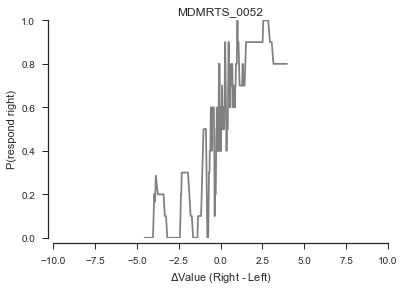

consistency: 0.7
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1823
Time:                        00:42:01   Log-Likelihood:                -157.96
converged:                       True   LL-Null:                       -193.17
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8324      0.127      6.531      0.000       0.583       1.082


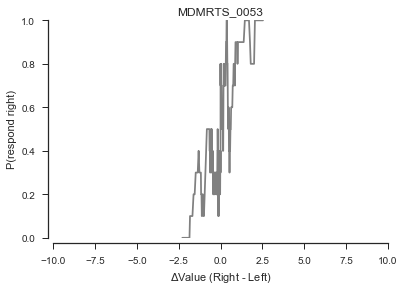

consistency: 0.72
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1836
Time:                        00:42:01   Log-Likelihood:                -157.29
converged:                       True   LL-Null:                       -192.67
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.3690      0.210      6.512      0.000       0.957       1.781


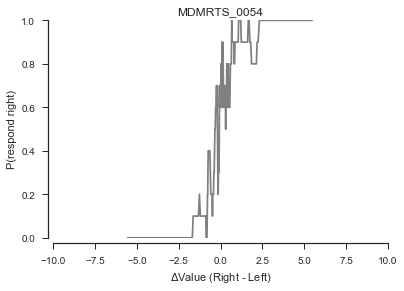

consistency: 0.81
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.4362
Time:                        00:42:02   Log-Likelihood:                -107.02
converged:                       True   LL-Null:                       -189.81
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.7798      0.263      6.755      0.000       1.263       2.296


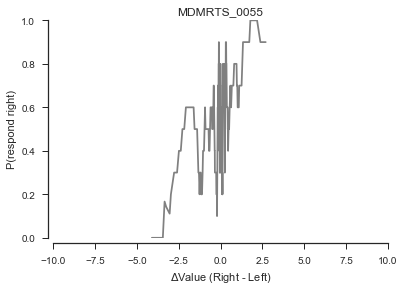

consistency: 0.56
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.02927
Time:                        00:42:02   Log-Likelihood:                -186.26
converged:                       True   LL-Null:                       -191.88
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4847      0.140      3.468      0.001       0.211       0.759


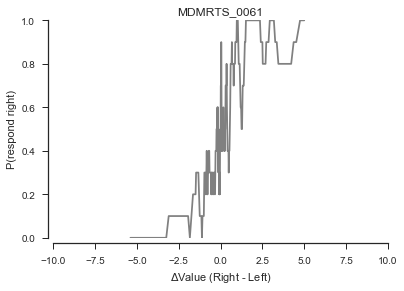

consistency: 0.75
nTrials: 270
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  270
Model:                          Logit   Df Residuals:                      269
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.2432
Time:                        00:42:02   Log-Likelihood:                -141.50
converged:                       True   LL-Null:                       -186.96
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.9631      0.145      6.644      0.000       0.679       1.247


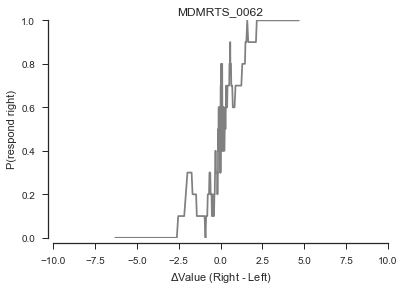

consistency: 0.75
nTrials: 277
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  277
Model:                          Logit   Df Residuals:                      276
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.3322
Time:                        00:42:03   Log-Likelihood:                -128.22
converged:                       True   LL-Null:                       -191.99
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.3938      0.222      6.268      0.000       0.958       1.830


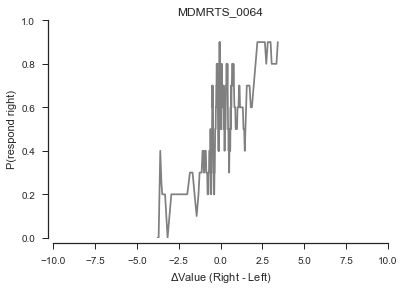

consistency: 0.6
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.05757
Time:                        00:42:03   Log-Likelihood:                -180.96
converged:                       True   LL-Null:                       -192.01
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5322      0.118      4.520      0.000       0.301       0.763


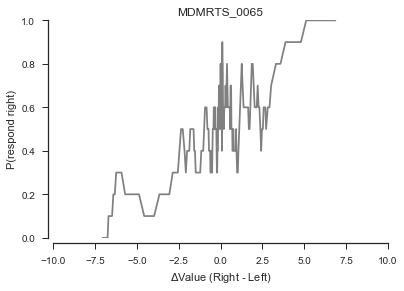

consistency: 0.63
nTrials: 267
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  266
Model:                          Logit   Df Residuals:                      265
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1029
Time:                        00:42:03   Log-Likelihood:                -163.89
converged:                       True   LL-Null:                       -182.68
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3507      0.067      5.227      0.000       0.219       0.482


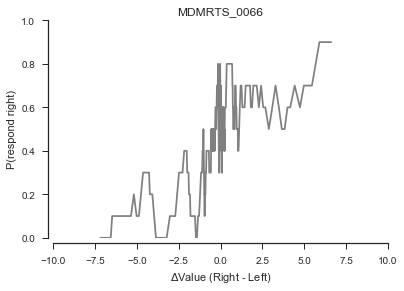

consistency: 0.64
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1191
Time:                        00:42:03   Log-Likelihood:                -168.68
converged:                       True   LL-Null:                       -191.48
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3939      0.070      5.591      0.000       0.256       0.532


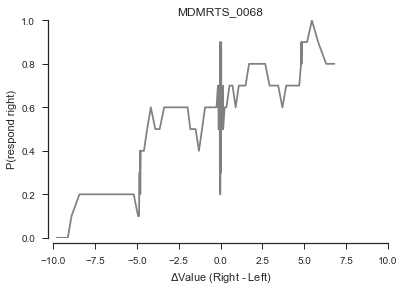

consistency: 0.59
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.05701
Time:                        00:42:04   Log-Likelihood:                -181.16
converged:                       True   LL-Null:                       -192.11
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2158      0.051      4.261      0.000       0.117       0.315


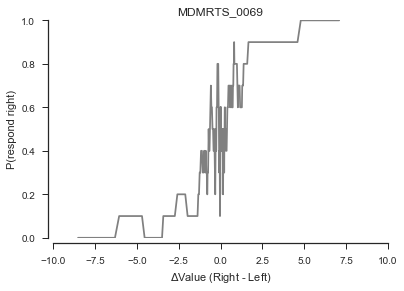

consistency: 0.69
nTrials: 272
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  272
Model:                          Logit   Df Residuals:                      271
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.2303
Time:                        00:42:04   Log-Likelihood:                -144.43
converged:                       True   LL-Null:                       -187.65
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.7421      0.130      5.690      0.000       0.486       0.998


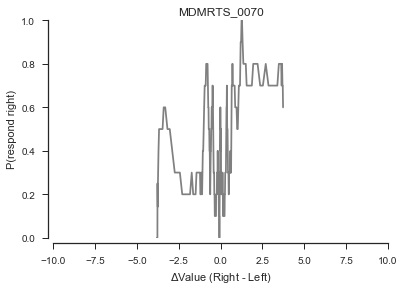

consistency: 0.55
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  248
Model:                          Logit   Df Residuals:                      247
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.01114
Time:                        00:42:04   Log-Likelihood:                -167.67
converged:                       True   LL-Null:                       -169.56
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2452      0.087      2.804      0.005       0.074       0.417


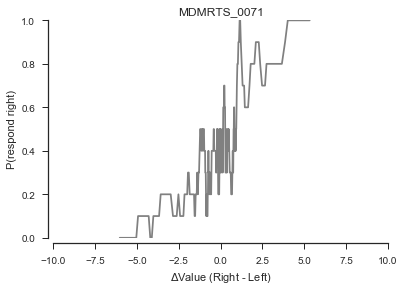

consistency: 0.68
nTrials: 275
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  275
Model:                          Logit   Df Residuals:                      274
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1680
Time:                        00:42:04   Log-Likelihood:                -154.93
converged:                       True   LL-Null:                       -186.23
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6294      0.100      6.285      0.000       0.433       0.826


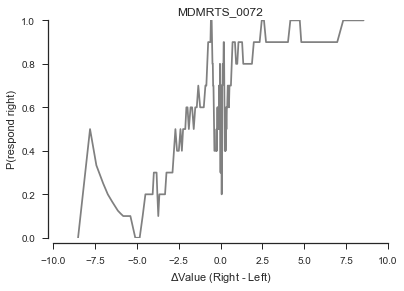

consistency: 0.61
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.09340
Time:                        00:42:05   Log-Likelihood:                -167.48
converged:                       True   LL-Null:                       -184.73
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4027      0.074      5.427      0.000       0.257       0.548


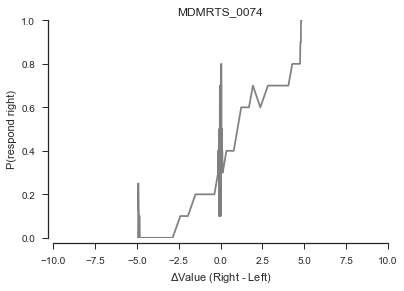

consistency: 0.58
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.07922
Time:                        00:42:05   Log-Likelihood:                -174.41
converged:                       True   LL-Null:                       -189.41
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5449      0.122      4.467      0.000       0.306       0.784


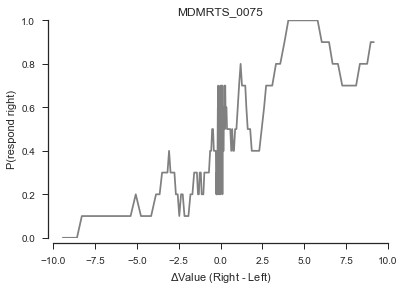

consistency: 0.63
nTrials: 273
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  273
Model:                          Logit   Df Residuals:                      272
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1012
Time:                        00:42:05   Log-Likelihood:                -168.28
converged:                       True   LL-Null:                       -187.23
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3275      0.066      4.953      0.000       0.198       0.457


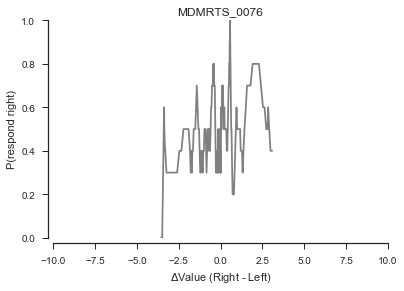

consistency: 0.54
nTrials: 275
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  179
Model:                          Logit   Df Residuals:                      178
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                0.007831
Time:                        00:42:06   Log-Likelihood:                -123.08
converged:                       True   LL-Null:                       -124.05
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.1466      0.105      1.399      0.162      -0.059       0.352


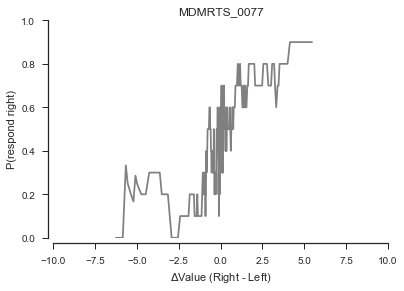

consistency: 0.67
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1034
Time:                        00:42:06   Log-Likelihood:                -173.38
converged:                       True   LL-Null:                       -193.37
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4773      0.089      5.384      0.000       0.304       0.651


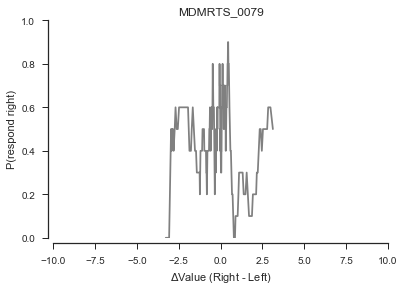

consistency: 0.5
nTrials: 277
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  245
Model:                          Logit   Df Residuals:                      244
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:              -0.0008885
Time:                        00:42:06   Log-Likelihood:                -169.63
converged:                       True   LL-Null:                       -169.48
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta         -0.0617      0.099     -0.623      0.533      -0.256       0.133


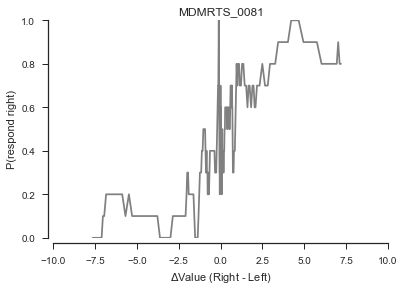

consistency: 0.66
nTrials: 267
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  267
Model:                          Logit   Df Residuals:                      266
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1363
Time:                        00:42:06   Log-Likelihood:                -158.84
converged:                       True   LL-Null:                       -183.90
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4003      0.072      5.577      0.000       0.260       0.541


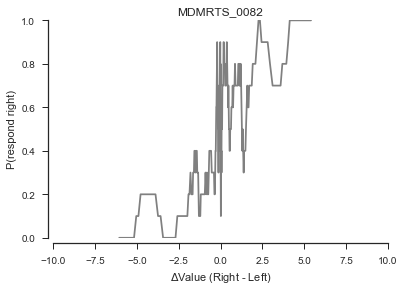

consistency: 0.67
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1813
Time:                        00:42:07   Log-Likelihood:                -157.67
converged:                       True   LL-Null:                       -192.58
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6227      0.099      6.273      0.000       0.428       0.817


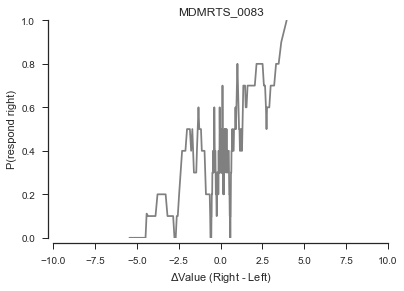

consistency: 0.59
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.04108
Time:                        00:42:07   Log-Likelihood:                -179.82
converged:                       True   LL-Null:                       -187.52
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4444      0.096      4.619      0.000       0.256       0.633


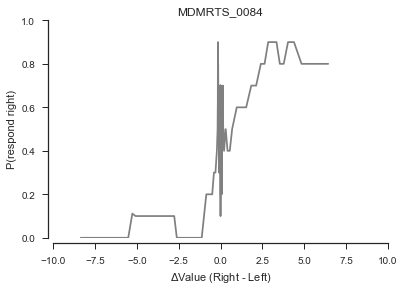

consistency: 0.55
nTrials: 268
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  268
Model:                          Logit   Df Residuals:                      267
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.07239
Time:                        00:42:07   Log-Likelihood:                -171.14
converged:                       True   LL-Null:                       -184.50
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5435      0.141      3.846      0.000       0.267       0.820


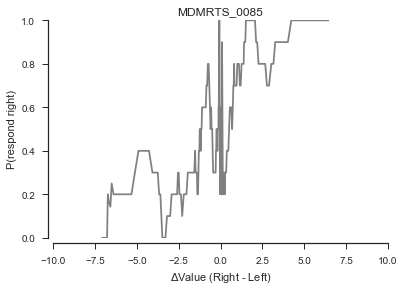

consistency: 0.64
nTrials: 277
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  277
Model:                          Logit   Df Residuals:                      276
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1552
Time:                        00:42:08   Log-Likelihood:                -161.76
converged:                       True   LL-Null:                       -191.48
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4634      0.077      6.016      0.000       0.312       0.614


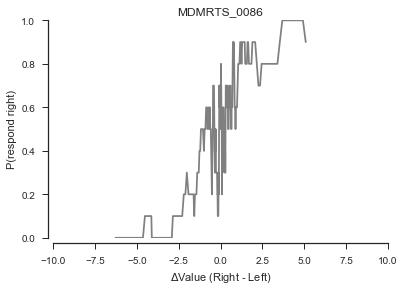

consistency: 0.69
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.2077
Time:                        00:42:08   Log-Likelihood:                -152.66
converged:                       True   LL-Null:                       -192.69
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.7103      0.111      6.421      0.000       0.493       0.927


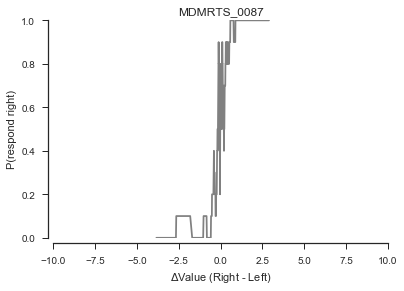

consistency: 0.83
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.4603
Time:                        00:42:08   Log-Likelihood:                -103.50
converged:                       True   LL-Null:                       -191.76
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          3.1732      0.441      7.199      0.000       2.309       4.037


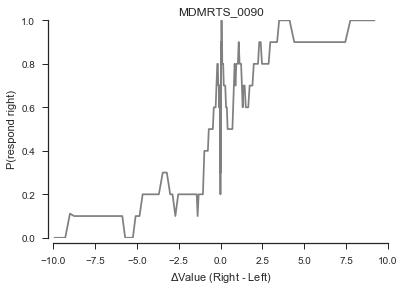

consistency: 0.67
nTrials: 270
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  270
Model:                          Logit   Df Residuals:                      269
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1658
Time:                        00:42:08   Log-Likelihood:                -155.08
converged:                       True   LL-Null:                       -185.90
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5010      0.095      5.277      0.000       0.315       0.687


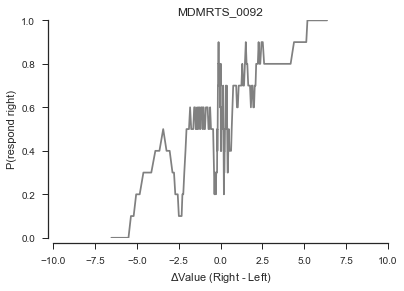

consistency: 0.62
nTrials: 268
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  268
Model:                          Logit   Df Residuals:                      267
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1331
Time:                        00:42:09   Log-Likelihood:                -158.70
converged:                       True   LL-Null:                       -183.06
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4463      0.077      5.782      0.000       0.295       0.598


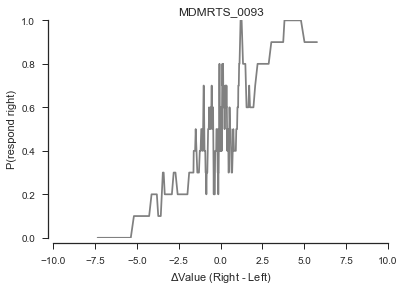

consistency: 0.65
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1308
Time:                        00:42:09   Log-Likelihood:                -168.68
converged:                       True   LL-Null:                       -194.07
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4907      0.086      5.694      0.000       0.322       0.660


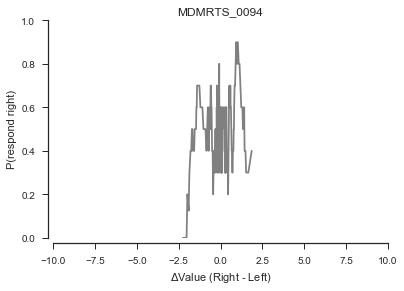

consistency: 0.51
nTrials: 275
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  274
Model:                          Logit   Df Residuals:                      273
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                0.002068
Time:                        00:42:09   Log-Likelihood:                -189.41
converged:                       True   LL-Null:                       -189.81
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.1573      0.157      1.005      0.315      -0.150       0.464


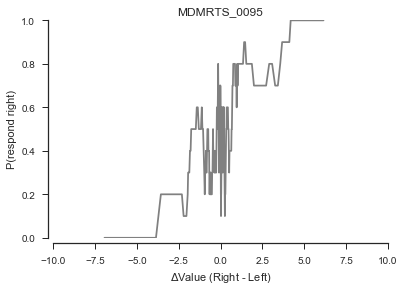

consistency: 0.66
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.2094
Time:                        00:42:09   Log-Likelihood:                -152.57
converged:                       True   LL-Null:                       -192.98
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6540      0.107      6.136      0.000       0.445       0.863


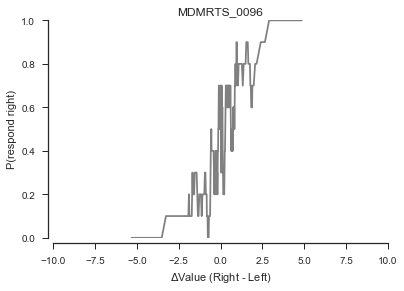

consistency: 0.71
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.2530
Time:                        00:42:10   Log-Likelihood:                -144.34
converged:                       True   LL-Null:                       -193.22
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.0110      0.155      6.532      0.000       0.708       1.314


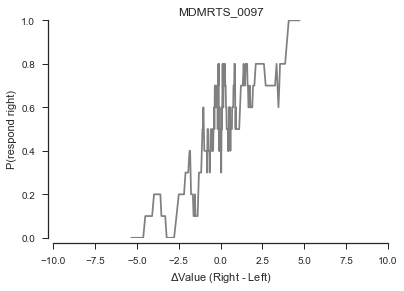

consistency: 0.64
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1390
Time:                        00:42:10   Log-Likelihood:                -166.95
converged:                       True   LL-Null:                       -193.90
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5493      0.091      6.022      0.000       0.371       0.728


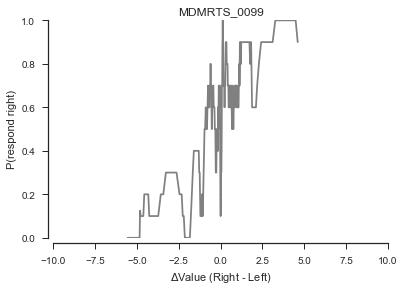

consistency: 0.68
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1452
Time:                        00:42:10   Log-Likelihood:                -164.52
converged:                       True   LL-Null:                       -192.47
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6059      0.099      6.110      0.000       0.412       0.800


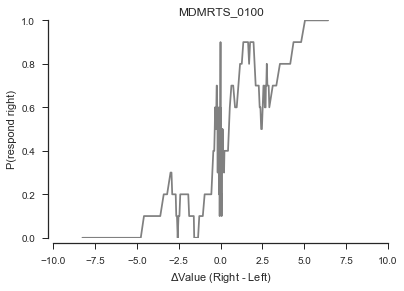

consistency: 0.67
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1824
Time:                        00:42:11   Log-Likelihood:                -155.85
converged:                       True   LL-Null:                       -190.61
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6204      0.100      6.182      0.000       0.424       0.817


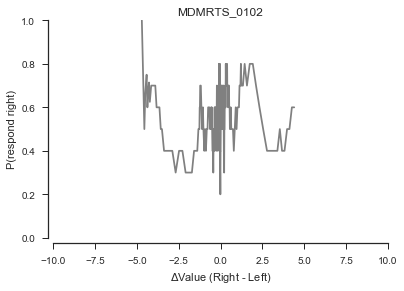

consistency: 0.51
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  256
Model:                          Logit   Df Residuals:                      255
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                -0.01142
Time:                        00:42:11   Log-Likelihood:                -177.44
converged:                       True   LL-Null:                       -175.44
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.0055      0.080      0.069      0.945      -0.151       0.162


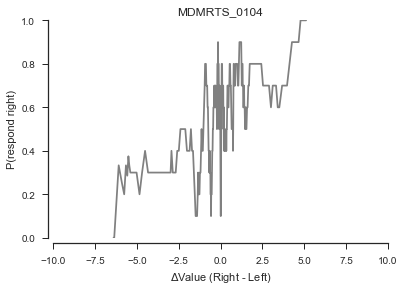

consistency: 0.6
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.05937
Time:                        00:42:11   Log-Likelihood:                -178.80
converged:                       True   LL-Null:                       -190.09
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3441      0.073      4.706      0.000       0.201       0.487


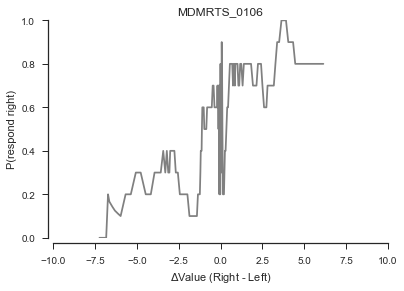

consistency: 0.62
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.07010
Time:                        00:42:12   Log-Likelihood:                -179.94
converged:                       True   LL-Null:                       -193.50
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3571      0.079      4.516      0.000       0.202       0.512


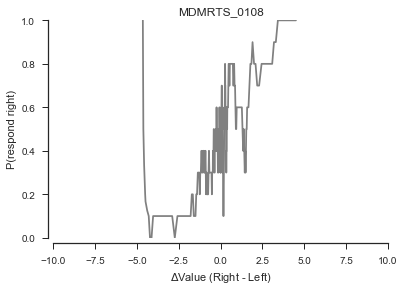

consistency: 0.66
nTrials: 273
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  271
Model:                          Logit   Df Residuals:                      270
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1476
Time:                        00:42:12   Log-Likelihood:                -159.84
converged:                       True   LL-Null:                       -187.53
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6730      0.115      5.847      0.000       0.447       0.899


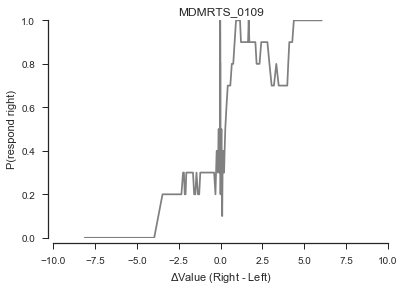

consistency: 0.6
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1298
Time:                        00:42:12   Log-Likelihood:                -164.43
converged:                       True   LL-Null:                       -188.95
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6659      0.126      5.302      0.000       0.420       0.912


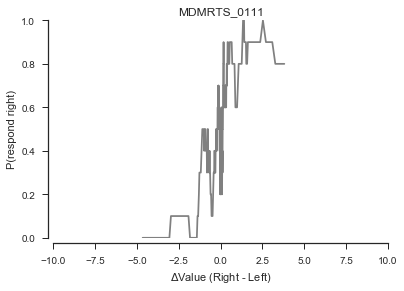

consistency: 0.69
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  277
Model:                          Logit   Df Residuals:                      276
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1908
Time:                        00:42:13   Log-Likelihood:                -155.36
converged:                       True   LL-Null:                       -191.99
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.0472      0.175      6.000      0.000       0.705       1.389


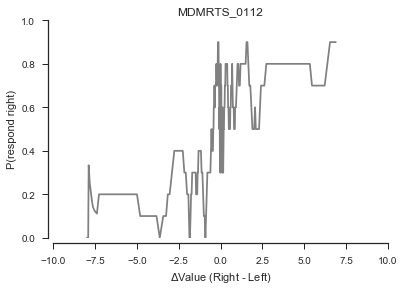

consistency: 0.64
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1004
Time:                        00:42:13   Log-Likelihood:                -174.44
converged:                       True   LL-Null:                       -193.90
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3317      0.063      5.245      0.000       0.208       0.456


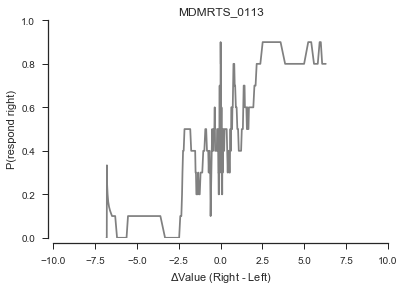

consistency: 0.64
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1021
Time:                        00:42:13   Log-Likelihood:                -173.28
converged:                       True   LL-Null:                       -192.98
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3727      0.072      5.209      0.000       0.232       0.513


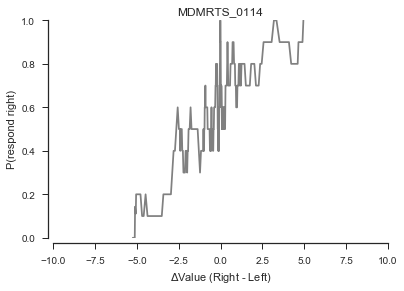

consistency: 0.63
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.08366
Time:                        00:42:13   Log-Likelihood:                -174.37
converged:                       True   LL-Null:                       -190.29
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4070      0.075      5.446      0.000       0.261       0.553


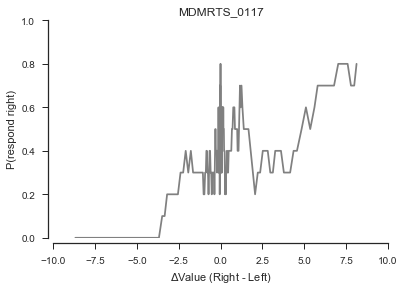

consistency: 0.57
nTrials: 277
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  277
Model:                          Logit   Df Residuals:                      276
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.03069
Time:                        00:42:14   Log-Likelihood:                -181.53
converged:                       True   LL-Null:                       -187.28
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2151      0.053      4.070      0.000       0.112       0.319


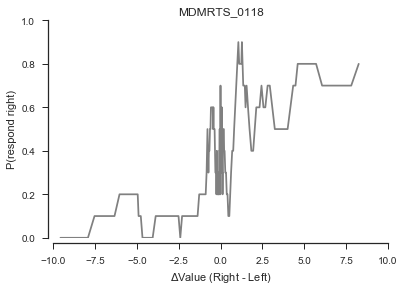

consistency: 0.65
nTrials: 272
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  272
Model:                          Logit   Df Residuals:                      271
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.08688
Time:                        00:42:14   Log-Likelihood:                -165.65
converged:                       True   LL-Null:                       -181.41
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3456      0.066      5.204      0.000       0.215       0.476


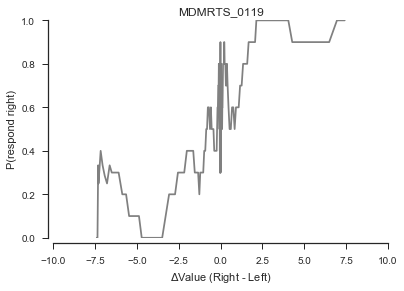

consistency: 0.67
nTrials: 237
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  237
Model:                          Logit   Df Residuals:                      236
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1175
Time:                        00:42:14   Log-Likelihood:                -142.13
converged:                       True   LL-Null:                       -161.05
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4711      0.097      4.881      0.000       0.282       0.660


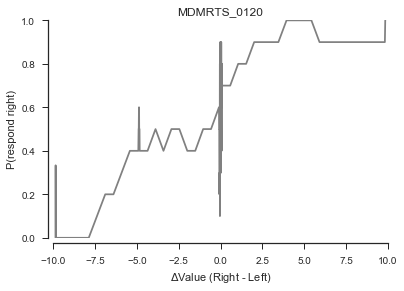

consistency: 0.59
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1020
Time:                        00:42:14   Log-Likelihood:                -173.51
converged:                       True   LL-Null:                       -193.22
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2590      0.053      4.900      0.000       0.155       0.363


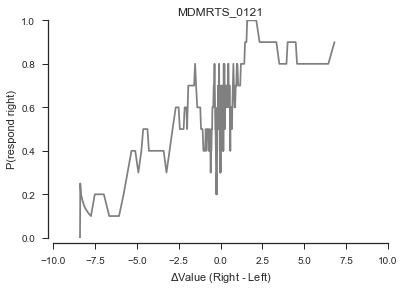

consistency: 0.61
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.04281
Time:                        00:42:15   Log-Likelihood:                -181.12
converged:                       True   LL-Null:                       -189.22
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2625      0.059      4.458      0.000       0.147       0.378


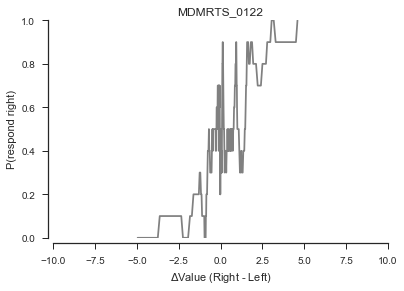

consistency: 0.66
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1880
Time:                        00:42:15   Log-Likelihood:                -156.46
converged:                       True   LL-Null:                       -192.68
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.7490      0.117      6.426      0.000       0.521       0.977


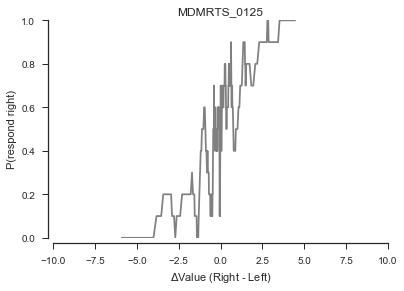

consistency: 0.72
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.2121
Time:                        00:42:15   Log-Likelihood:                -152.92
converged:                       True   LL-Null:                       -194.08
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8703      0.134      6.490      0.000       0.607       1.133


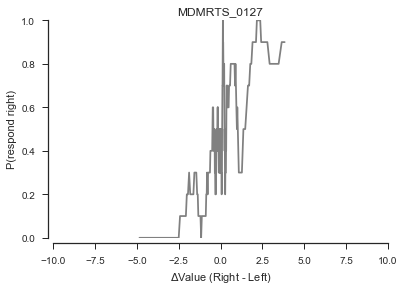

consistency: 0.65
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1344
Time:                        00:42:15   Log-Likelihood:                -167.24
converged:                       True   LL-Null:                       -193.22
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8545      0.151      5.673      0.000       0.559       1.150


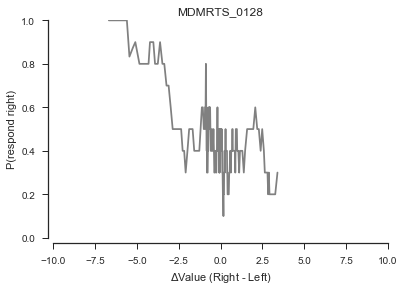

consistency: 0.44
nTrials: 267
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  221
Model:                          Logit   Df Residuals:                      220
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.02790
Time:                        00:42:16   Log-Likelihood:                -147.94
converged:                       True   LL-Null:                       -152.19
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta         -0.2493      0.081     -3.064      0.002      -0.409      -0.090


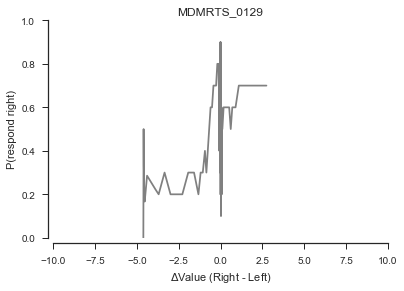

consistency: 0.53
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.01013
Time:                        00:42:16   Log-Likelihood:                -190.92
converged:                       True   LL-Null:                       -192.87
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3030      0.149      2.035      0.042       0.011       0.595


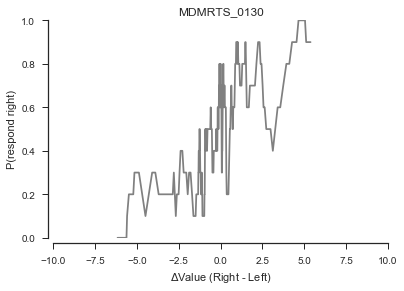

consistency: 0.67
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1174
Time:                        00:42:16   Log-Likelihood:                -171.27
converged:                       True   LL-Null:                       -194.05
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4312      0.076      5.645      0.000       0.282       0.581


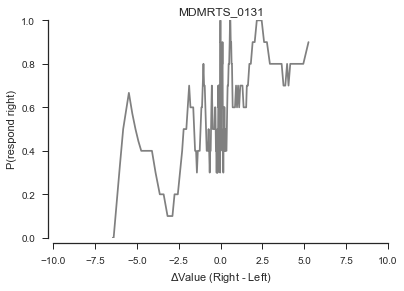

consistency: 0.61
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  275
Model:                          Logit   Df Residuals:                      274
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.02105
Time:                        00:42:16   Log-Likelihood:                -182.65
converged:                       True   LL-Null:                       -186.58
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2991      0.083      3.617      0.000       0.137       0.461


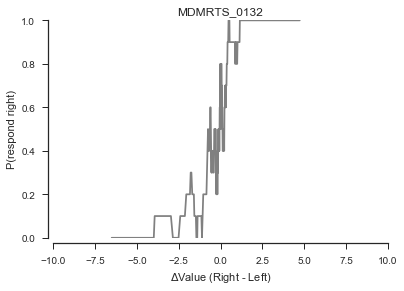

consistency: 0.78
nTrials: 278
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  278
Model:                          Logit   Df Residuals:                      277
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.3618
Time:                        00:42:16   Log-Likelihood:                -122.42
converged:                       True   LL-Null:                       -191.82
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.5602      0.224      6.963      0.000       1.121       1.999


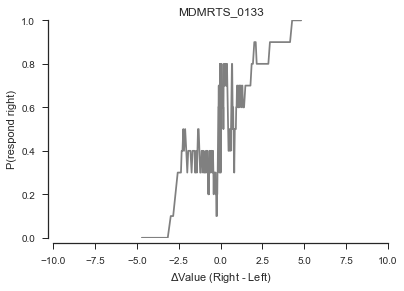

consistency: 0.66
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1347
Time:                        00:42:17   Log-Likelihood:                -166.89
converged:                       True   LL-Null:                       -192.87
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6369      0.111      5.735      0.000       0.419       0.855


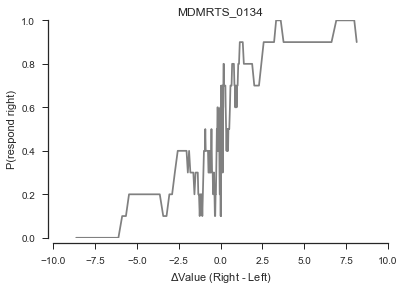

consistency: 0.67
nTrials: 276
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  276
Model:                          Logit   Df Residuals:                      275
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1736
Time:                        00:42:17   Log-Likelihood:                -157.88
converged:                       True   LL-Null:                       -191.05
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.4889      0.088      5.541      0.000       0.316       0.662


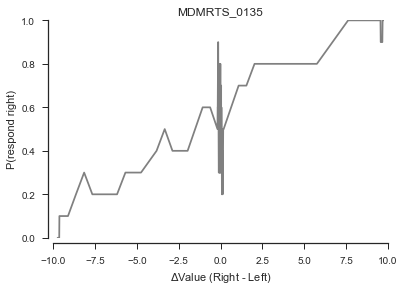

consistency: 0.56
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1123
Time:                        00:42:17   Log-Likelihood:                -171.78
converged:                       True   LL-Null:                       -193.50
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2925      0.063      4.633      0.000       0.169       0.416


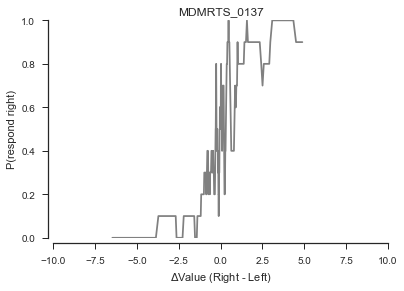

consistency: 0.73
nTrials: 266
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  266
Model:                          Logit   Df Residuals:                      265
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.2379
Time:                        00:42:17   Log-Likelihood:                -140.05
converged:                       True   LL-Null:                       -183.77
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.9315      0.143      6.519      0.000       0.651       1.212


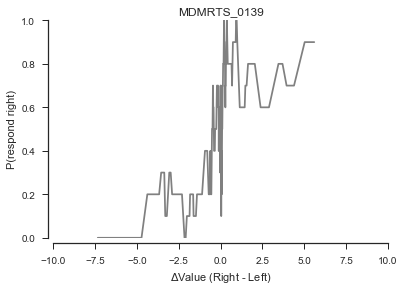

consistency: 0.67
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1413
Time:                        00:42:18   Log-Likelihood:                -165.93
converged:                       True   LL-Null:                       -193.24
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5920      0.108      5.465      0.000       0.380       0.804


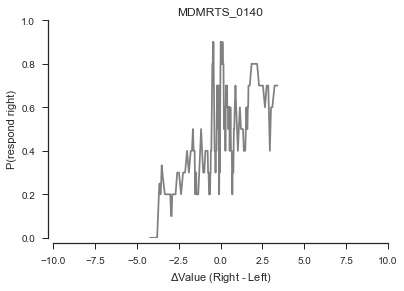

consistency: 0.58
nTrials: 277
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  253
Model:                          Logit   Df Residuals:                      252
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.03695
Time:                        00:42:18   Log-Likelihood:                -168.73
converged:                       True   LL-Null:                       -175.21
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3364      0.097      3.452      0.001       0.145       0.527


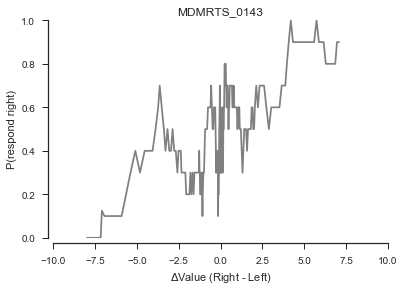

consistency: 0.62
nTrials: 275
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  275
Model:                          Logit   Df Residuals:                      274
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.08703
Time:                        00:42:18   Log-Likelihood:                -174.01
converged:                       True   LL-Null:                       -190.60
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2878      0.057      5.007      0.000       0.175       0.400


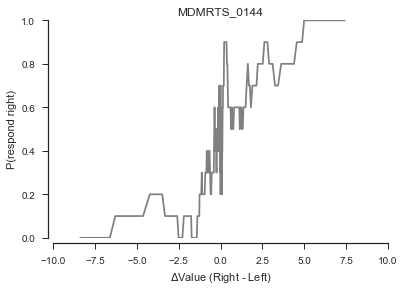

consistency: 0.69
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.2281
Time:                        00:42:18   Log-Likelihood:                -149.03
converged:                       True   LL-Null:                       -193.05
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6941      0.117      5.947      0.000       0.465       0.923


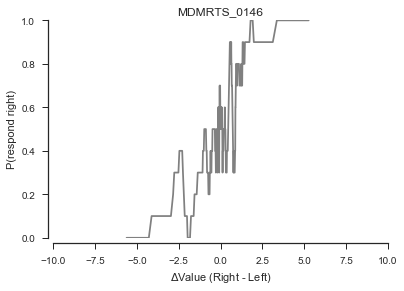

consistency: 0.7
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.2414
Time:                        00:42:18   Log-Likelihood:                -147.22
converged:                       True   LL-Null:                       -194.07
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8270      0.126      6.580      0.000       0.581       1.073


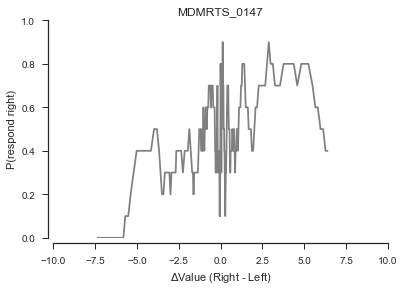

consistency: 0.61
nTrials: 275
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  275
Model:                          Logit   Df Residuals:                      274
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.04353
Time:                        00:42:19   Log-Likelihood:                -181.69
converged:                       True   LL-Null:                       -189.96
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2049      0.052      3.932      0.000       0.103       0.307


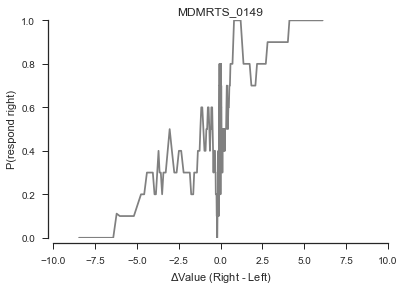

consistency: 0.65
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1235
Time:                        00:42:19   Log-Likelihood:                -168.53
converged:                       True   LL-Null:                       -192.27
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5030      0.092      5.464      0.000       0.323       0.683


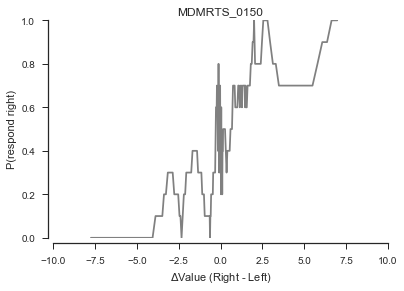

consistency: 0.63
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.1734
Time:                        00:42:20   Log-Likelihood:                -158.93
converged:                       True   LL-Null:                       -192.27
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5804      0.100      5.792      0.000       0.384       0.777


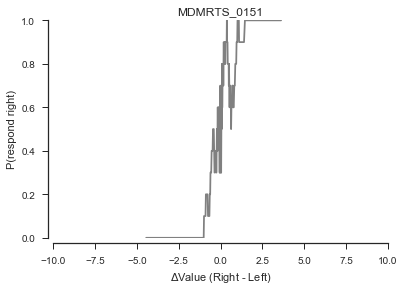

consistency: 0.8
nTrials: 277
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  277
Model:                          Logit   Df Residuals:                      276
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.4379
Time:                        00:42:20   Log-Likelihood:                -106.54
converged:                       True   LL-Null:                       -189.52
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.3850      0.348      6.846      0.000       1.702       3.068


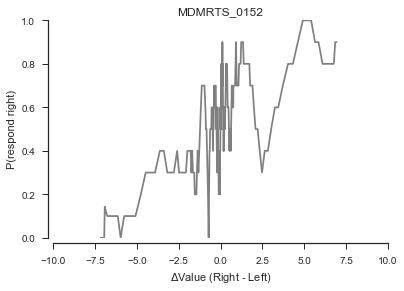

consistency: 0.66
nTrials: 280
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  280
Model:                          Logit   Df Residuals:                      279
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                 0.09838
Time:                        00:42:20   Log-Likelihood:                -174.57
converged:                       True   LL-Null:                       -193.62
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.3555      0.070      5.060      0.000       0.218       0.493


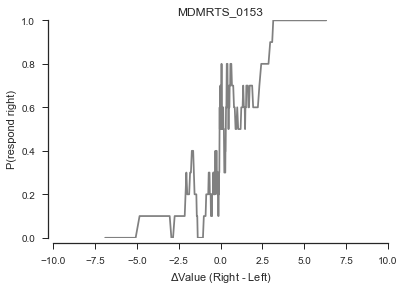

consistency: 0.74
nTrials: 279
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  279
Model:                          Logit   Df Residuals:                      278
Method:                           MLE   Df Model:                            0
Date:                Thu, 17 May 2018   Pseudo R-squ.:                  0.2476
Time:                        00:42:21   Log-Likelihood:                -144.52
converged:                       True   LL-Null:                       -192.08
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8067      0.127      6.347      0.000       0.558       1.056
Of 106 subjects, 102 subjects had significant p values for the logistic regression.


In [9]:
df_sig_pval = get_p_logistic_plots(zscoreRatings=False, printFigs=True)

In [6]:
def get_subject_rt(subjectId, zscoreRatings, printFigs):
    subjectFolder = _dataDir + subjectId + '/'
    choiceFile = subjectFolder + subjectId + choiceFileEnd
    if os.path.exists(choiceFile):
        df = pd.read_csv(choiceFile)
        
        # remove trials with no response and where RT <= 300ms
        df = df.loc[(df["receivedResponse"] == True) & (df["rt"] > 300)]
        
        rightStimRatings = df["stimulus2Bid"]
        leftStimRatings = df["stimulus1Bid"]
        
        if zscoreRatings:
            mean, std = get_ratings_mean_and_std(subjectId)
            rightStimRatings = (rightStimRatings - mean) / std
            leftStimRatings = (leftStimRatings - mean) / std
        
        delta = rightStimRatings - leftStimRatings
        rt = df["rt"]
        
        d = {'delta':delta, 'RT':rt}
        df2 = pd.DataFrame(data=d)
        df2 = df2.sort_values('delta',axis=0, ascending = True) 
        df2 = df2.reset_index(drop=True)
        y = df2.rolling(window=10,min_periods=1).mean()

        if printFigs:
            plt.plot(y['delta'],y['RT'],color='grey')
            axes = plt.gca()
            axes.set_title(subjectId)
            axes.set_xlabel(r'$\Delta$Value (Right - Left)')
            axes.set_ylabel('RT (ms)')
            axes.set_xlim(-10,10)

            sns.set_style("whitegrid")
            sns.set(style="ticks")
            sns.despine(offset=5)
            plt.show()

            [consistency, nResponses] = get_subject_consistency_nRsps(subjectId)
            print "consistency:", consistency
            print "nTrials:", nResponses
        
        return df2
        
def get_rt_plots(zscoreRatings, printFigs):
    subjects = get_subjects_w_full_data()
    n = len(subjects)
    for subject in subjects:
        get_subject_rt(subject, zscoreRatings, printFigs)

total number of people who accepted the HIT 153
106 subjects completed the auction and choice tasks.


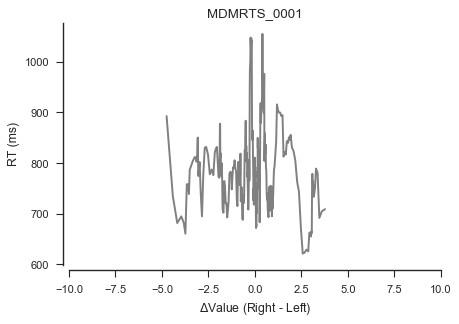

consistency: 0.6
nTrials: 280


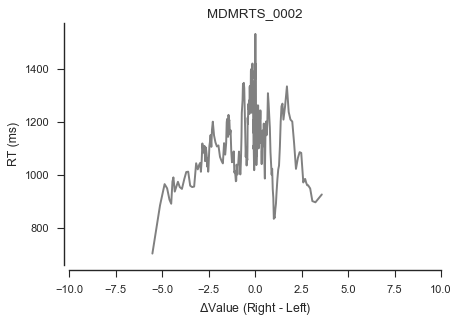

consistency: 0.71
nTrials: 280


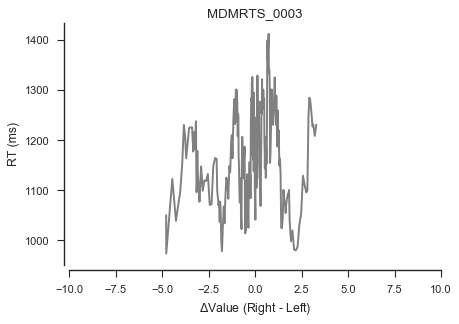

consistency: 0.66
nTrials: 277


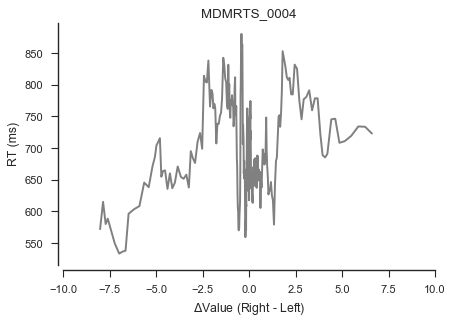

consistency: 0.65
nTrials: 280


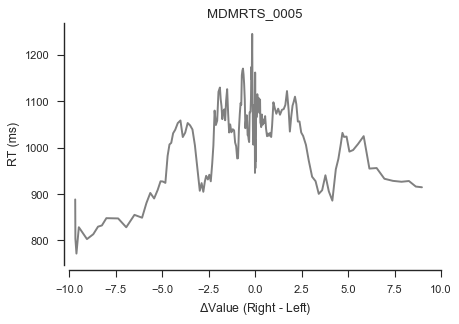

consistency: 0.73
nTrials: 280


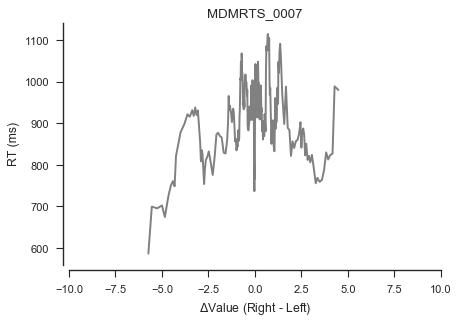

consistency: 0.65
nTrials: 279


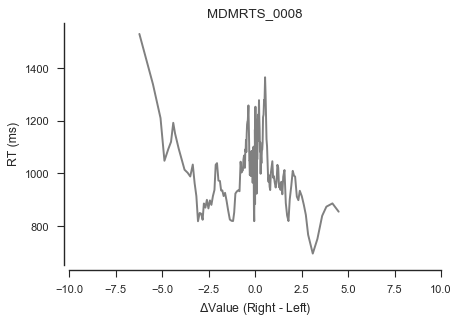

consistency: 0.66
nTrials: 279


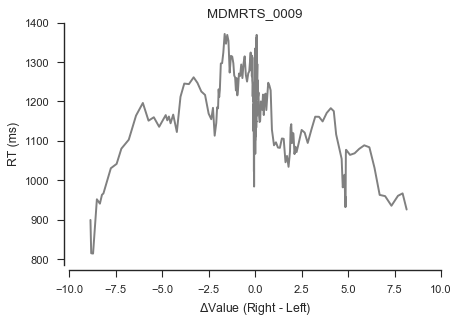

consistency: 0.64
nTrials: 280


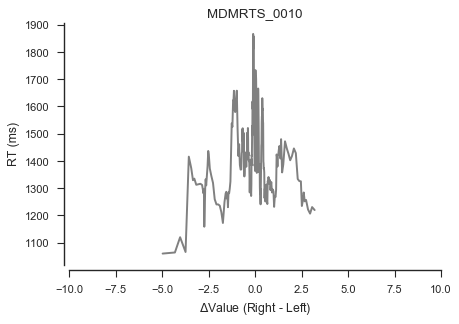

consistency: 0.75
nTrials: 253


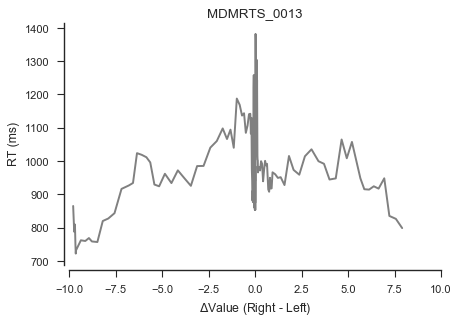

consistency: 0.58
nTrials: 279


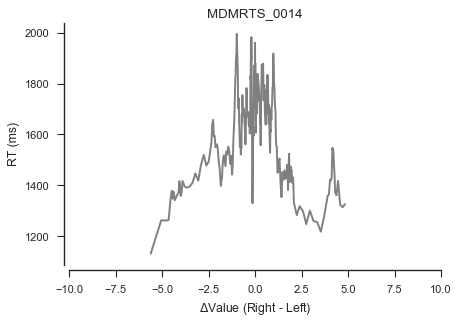

consistency: 0.78
nTrials: 278


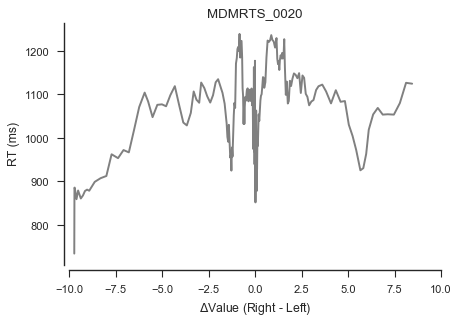

consistency: 0.6
nTrials: 280


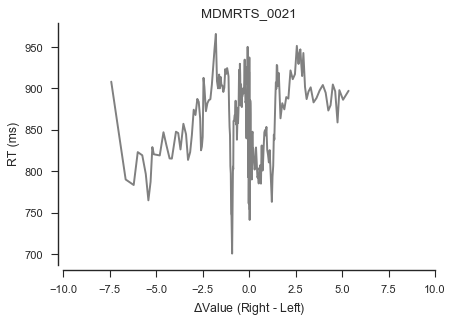

consistency: 0.62
nTrials: 280


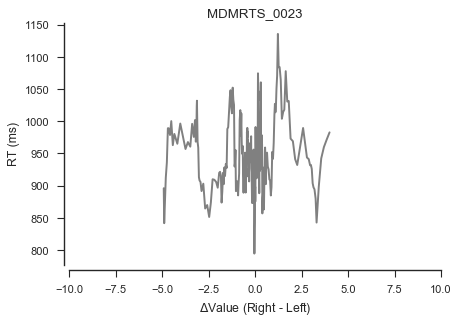

consistency: 0.57
nTrials: 280


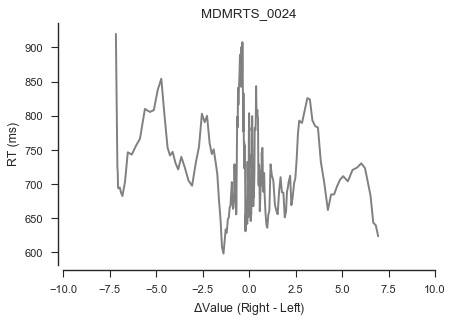

consistency: 0.59
nTrials: 280


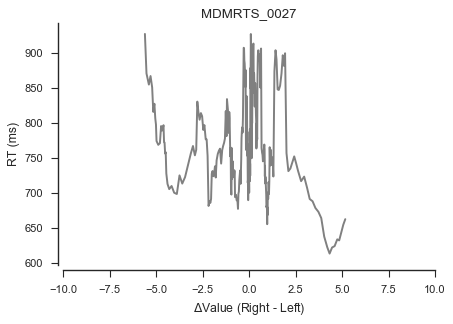

consistency: 0.67
nTrials: 279


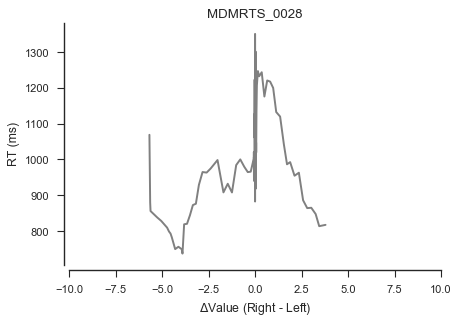

consistency: 0.52
nTrials: 279


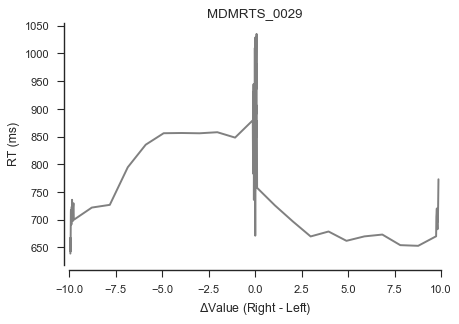

consistency: 0.57
nTrials: 280


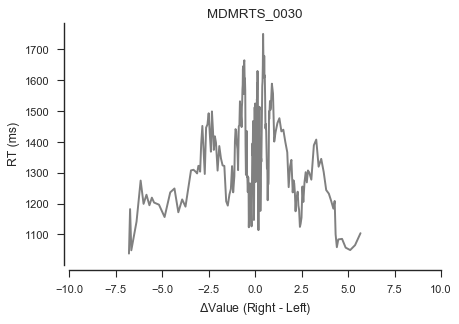

consistency: 0.58
nTrials: 275


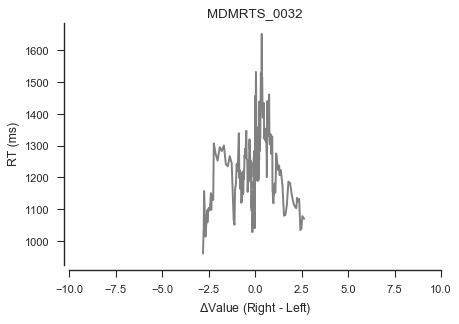

consistency: 0.66
nTrials: 278


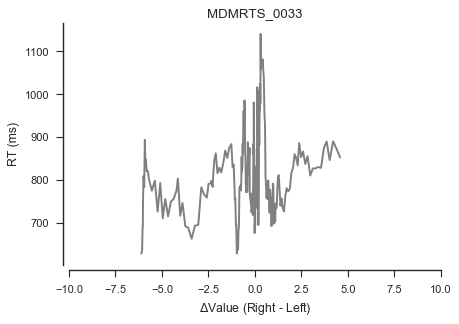

consistency: 0.56
nTrials: 275


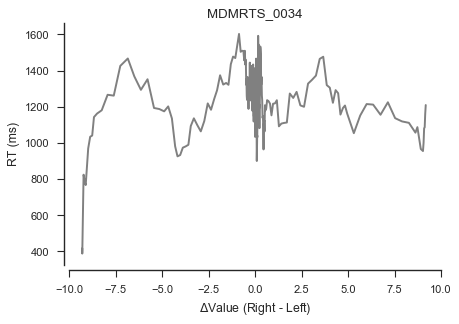

consistency: 0.58
nTrials: 270


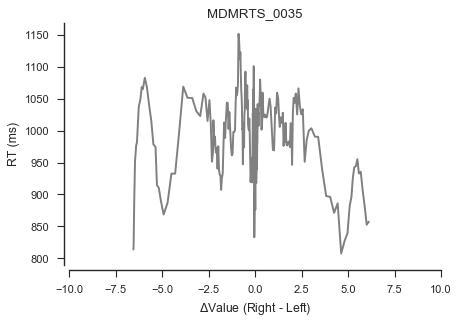

consistency: 0.6
nTrials: 277


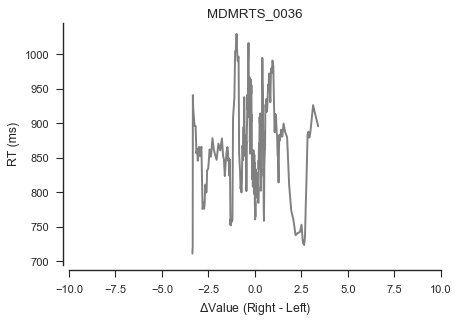

consistency: 0.58
nTrials: 280


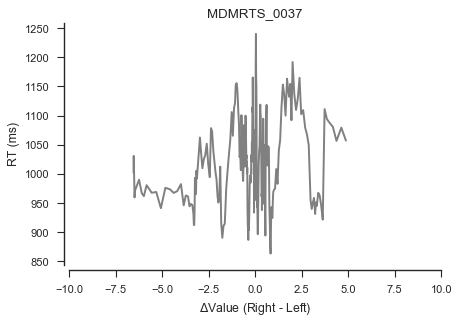

consistency: 0.67
nTrials: 279


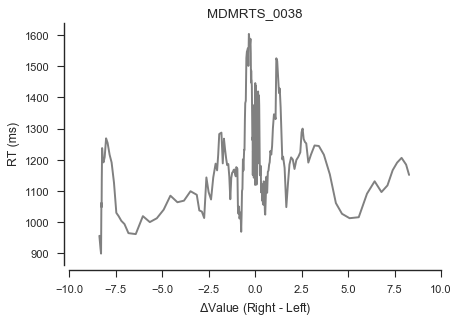

consistency: 0.68
nTrials: 255


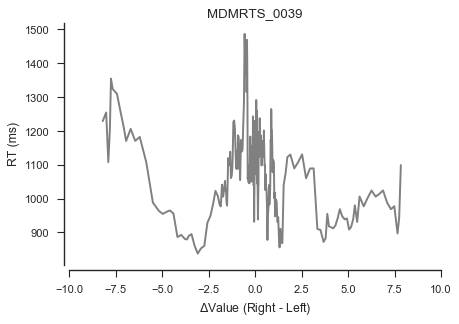

consistency: 0.62
nTrials: 276


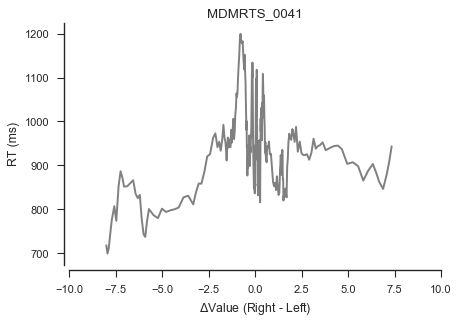

consistency: 0.65
nTrials: 280


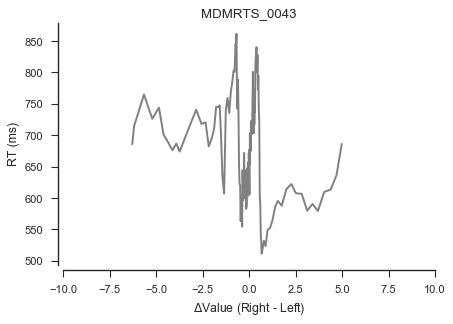

consistency: 0.52
nTrials: 279


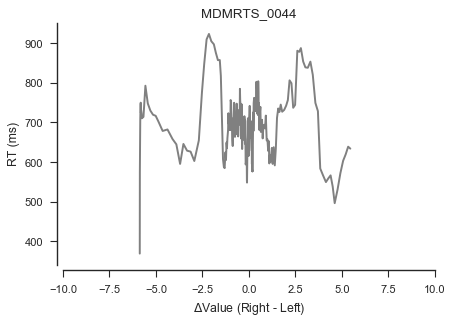

consistency: 0.57
nTrials: 278


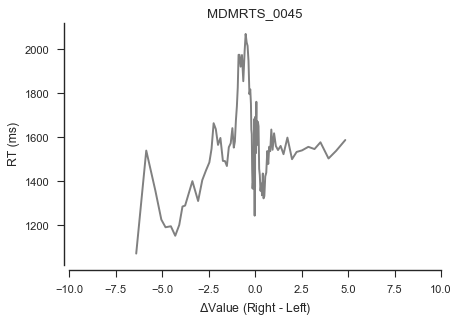

consistency: 0.61
nTrials: 137


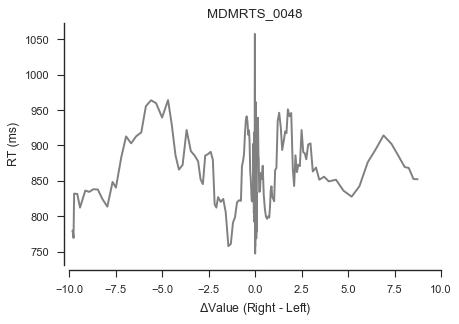

consistency: 0.62
nTrials: 280


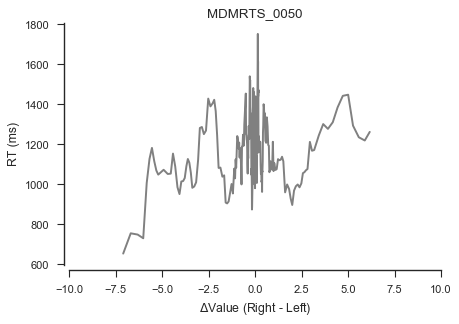

consistency: 0.62
nTrials: 268


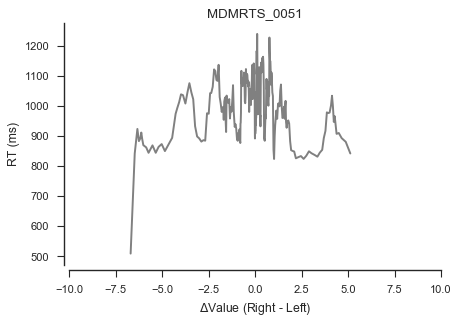

consistency: 0.62
nTrials: 280


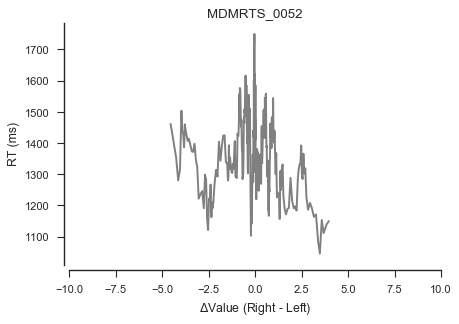

consistency: 0.7
nTrials: 279


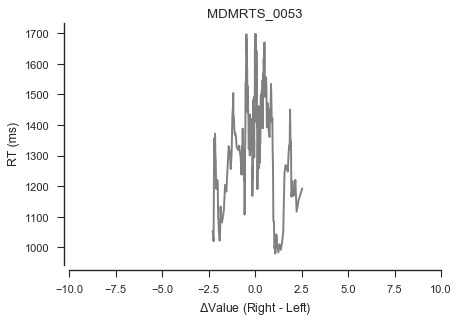

consistency: 0.72
nTrials: 278


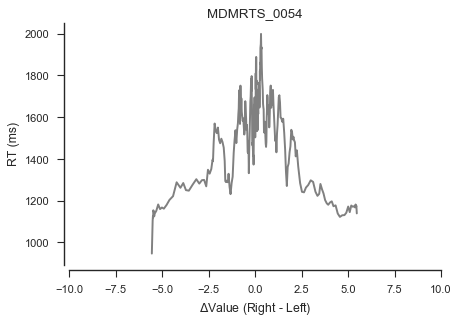

consistency: 0.81
nTrials: 278


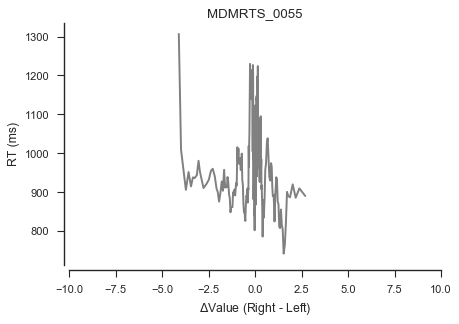

consistency: 0.56
nTrials: 279


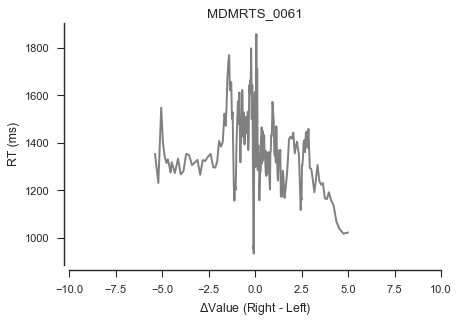

consistency: 0.75
nTrials: 270


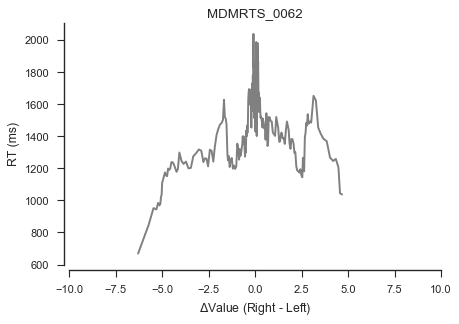

consistency: 0.75
nTrials: 277


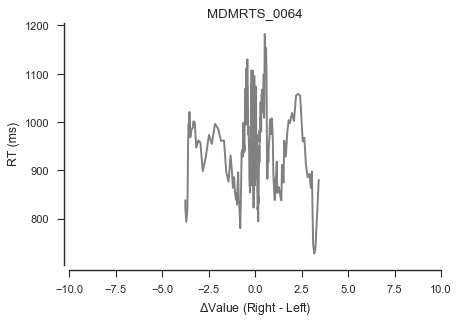

consistency: 0.6
nTrials: 280


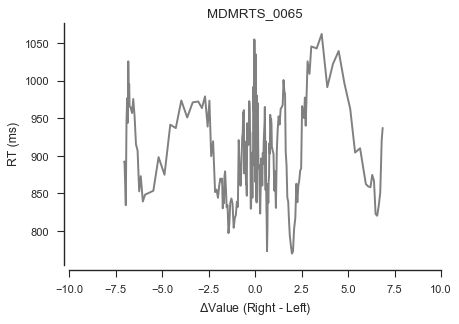

consistency: 0.63
nTrials: 267


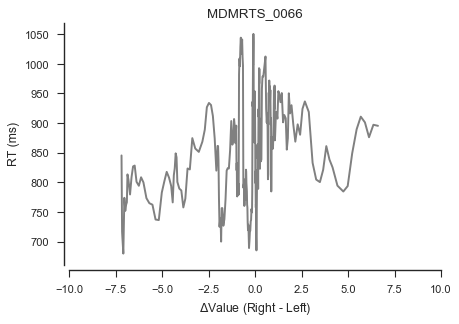

consistency: 0.64
nTrials: 280


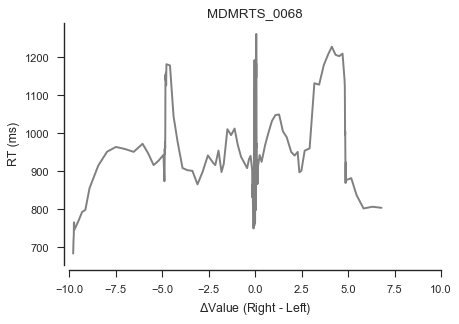

consistency: 0.59
nTrials: 278


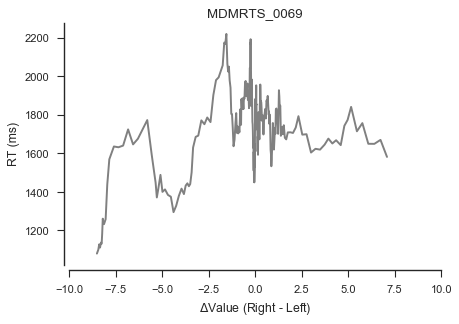

consistency: 0.69
nTrials: 272


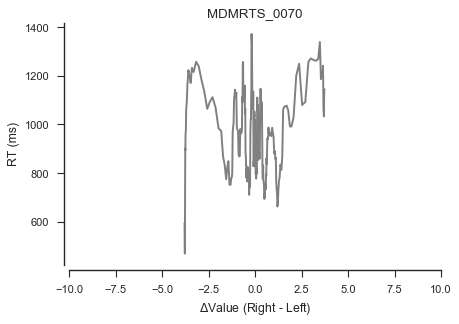

consistency: 0.55
nTrials: 276


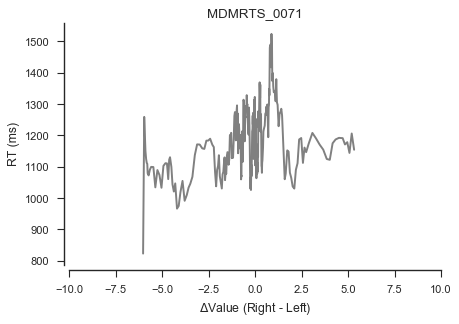

consistency: 0.68
nTrials: 275


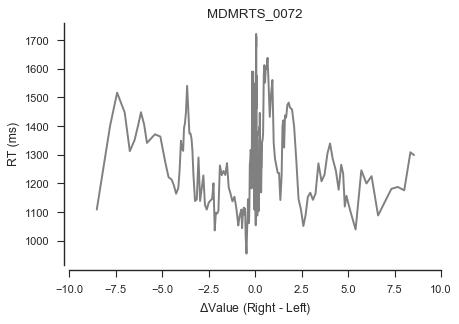

consistency: 0.61
nTrials: 276


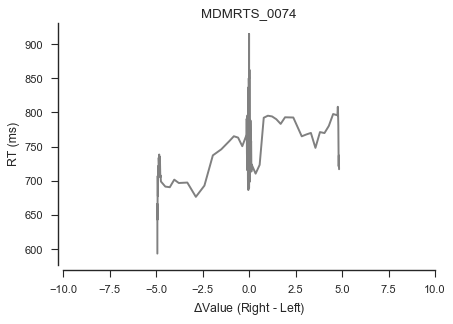

consistency: 0.58
nTrials: 279


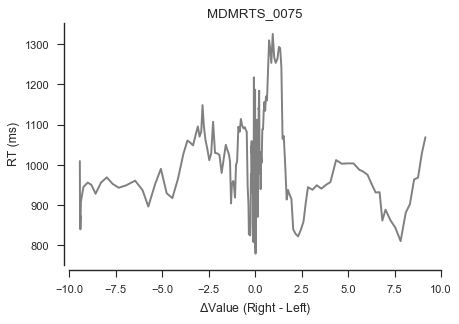

consistency: 0.63
nTrials: 273


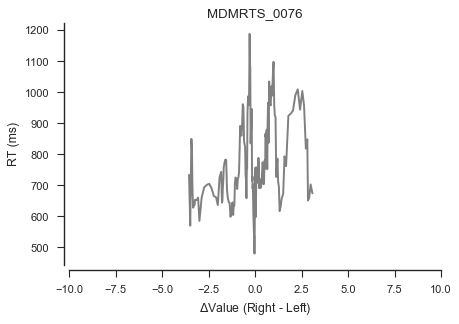

consistency: 0.54
nTrials: 275


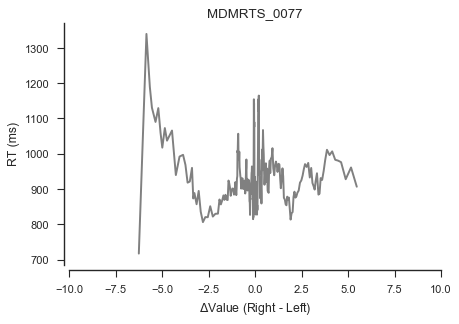

consistency: 0.67
nTrials: 280


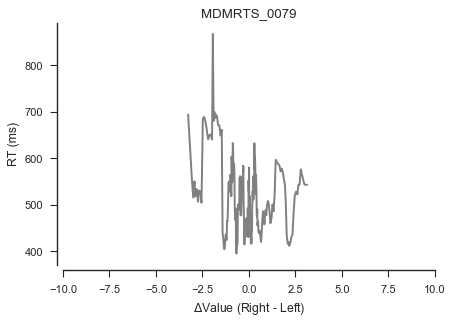

consistency: 0.5
nTrials: 277


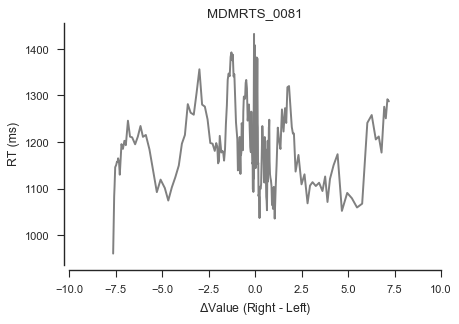

consistency: 0.66
nTrials: 267


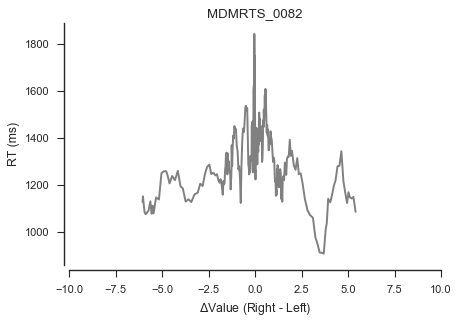

consistency: 0.67
nTrials: 278


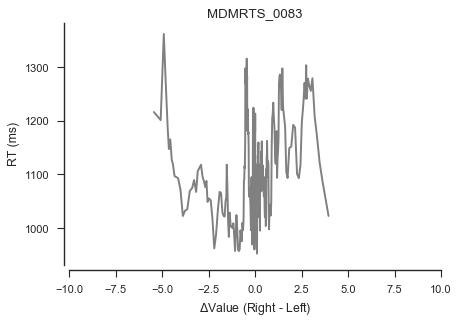

consistency: 0.59
nTrials: 279


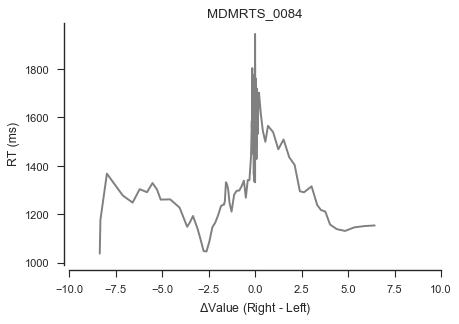

consistency: 0.55
nTrials: 268


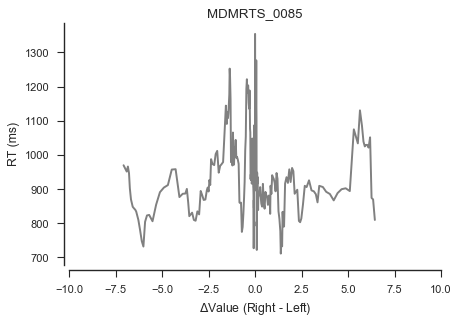

consistency: 0.64
nTrials: 277


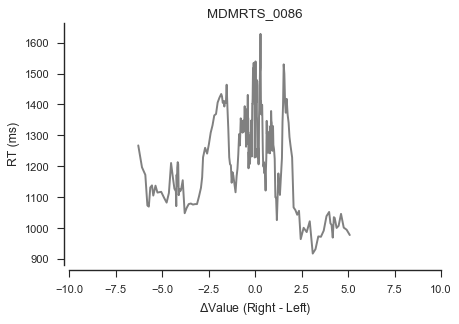

consistency: 0.69
nTrials: 278


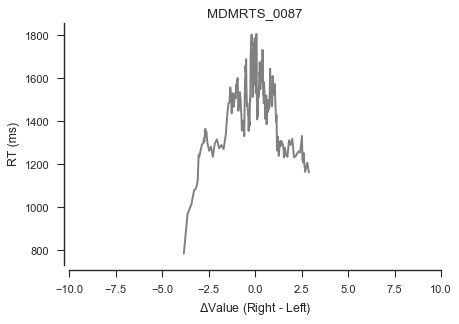

consistency: 0.83
nTrials: 280


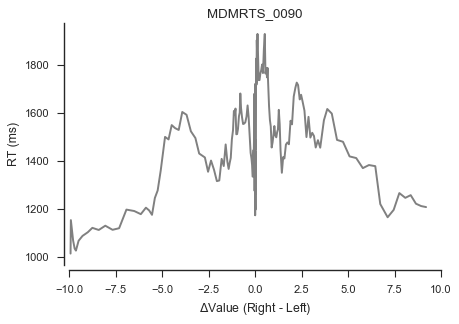

consistency: 0.67
nTrials: 270


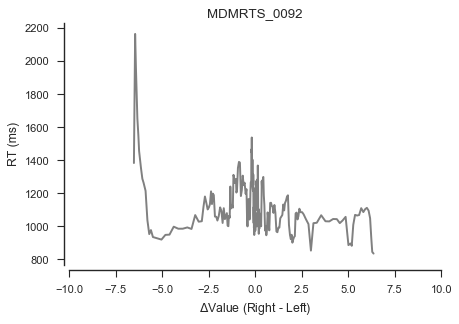

consistency: 0.62
nTrials: 268


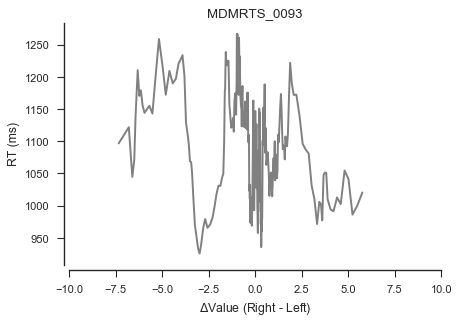

consistency: 0.65
nTrials: 280


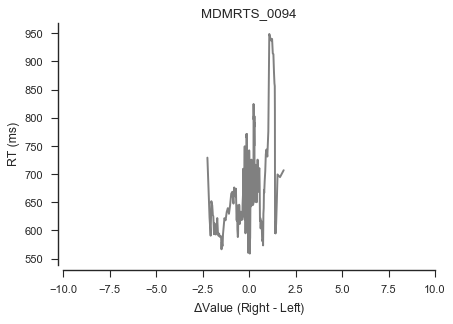

consistency: 0.51
nTrials: 275


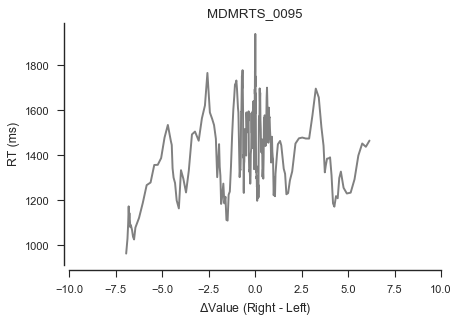

consistency: 0.66
nTrials: 279


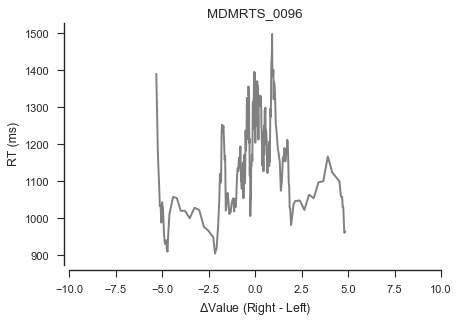

consistency: 0.71
nTrials: 280


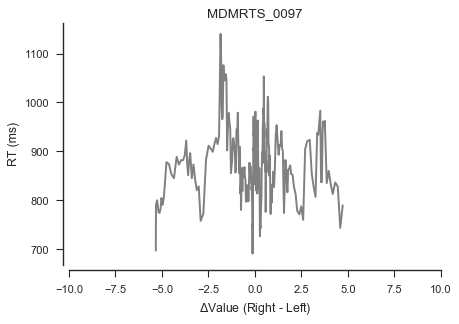

consistency: 0.64
nTrials: 280


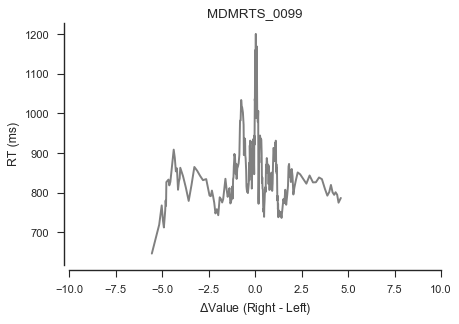

consistency: 0.68
nTrials: 280


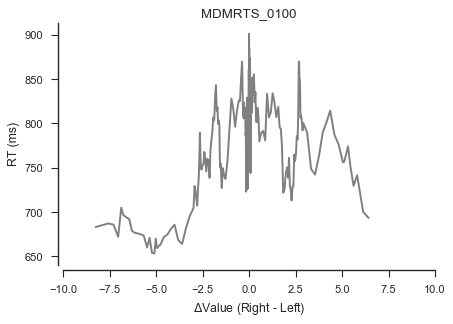

consistency: 0.67
nTrials: 278


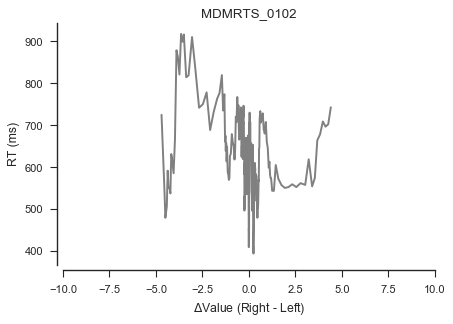

consistency: 0.51
nTrials: 276


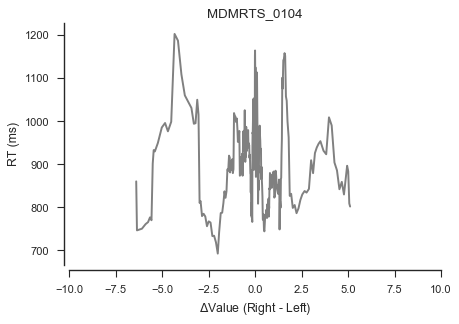

consistency: 0.6
nTrials: 279


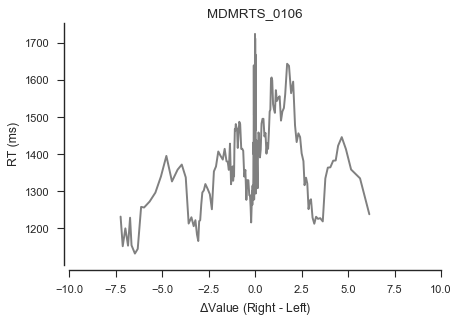

consistency: 0.62
nTrials: 280


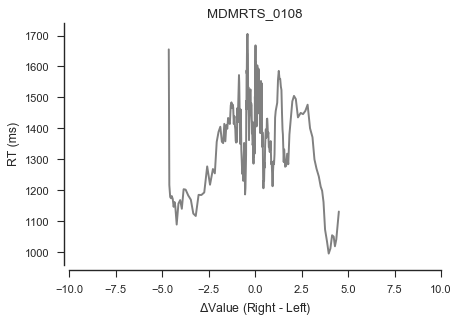

consistency: 0.66
nTrials: 273


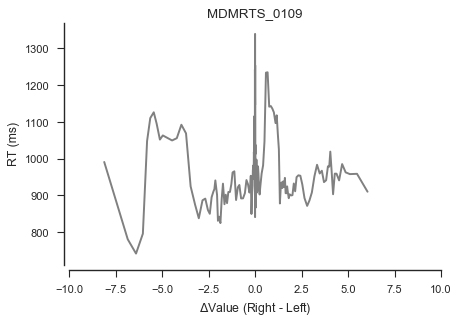

consistency: 0.6
nTrials: 276


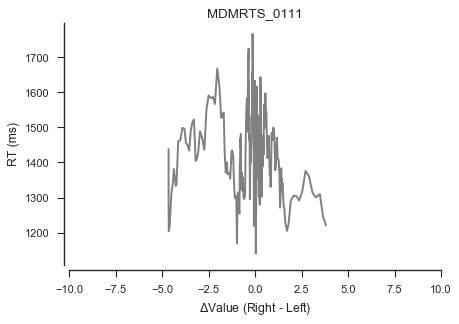

consistency: 0.69
nTrials: 278


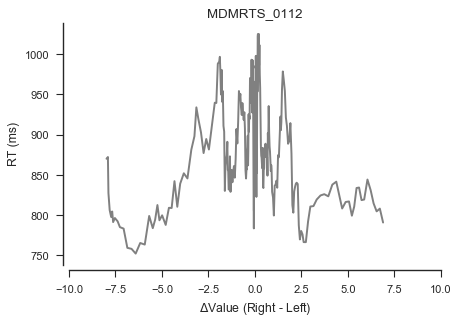

consistency: 0.64
nTrials: 280


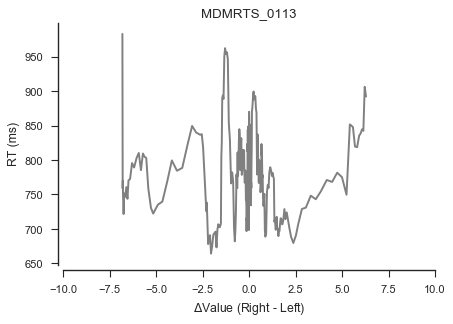

consistency: 0.64
nTrials: 279


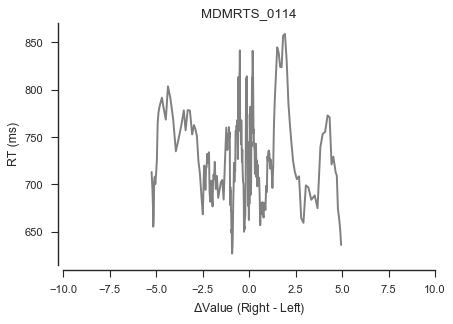

consistency: 0.63
nTrials: 280


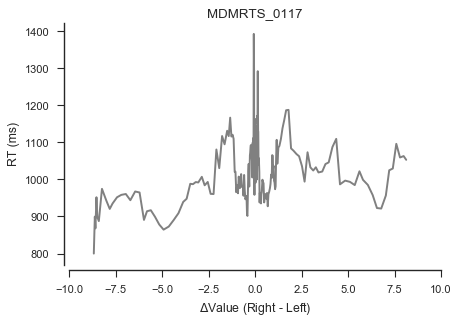

consistency: 0.57
nTrials: 277


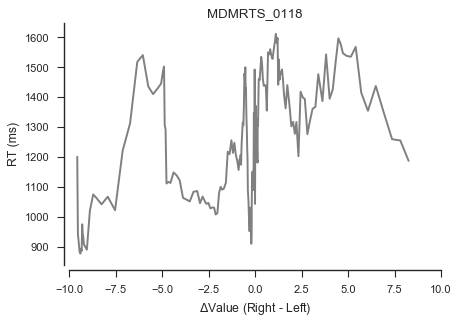

consistency: 0.65
nTrials: 272


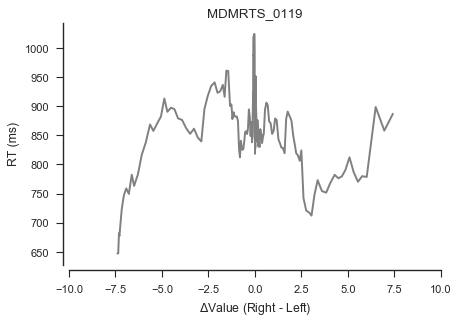

consistency: 0.67
nTrials: 237


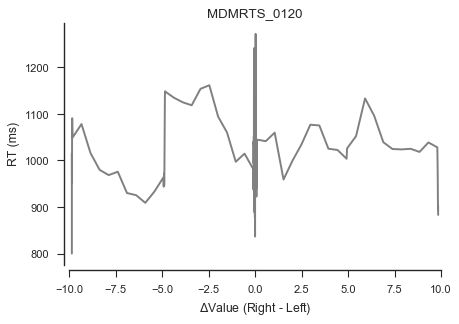

consistency: 0.59
nTrials: 280


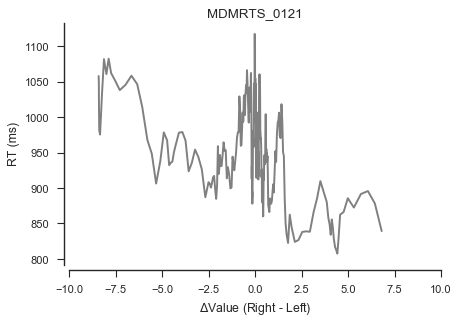

consistency: 0.61
nTrials: 280


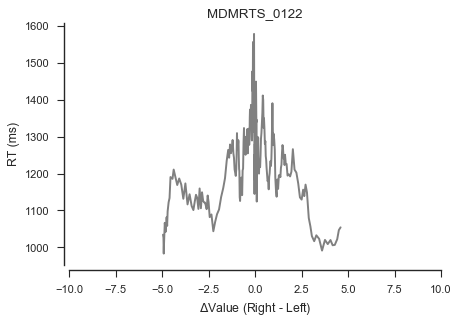

consistency: 0.66
nTrials: 280


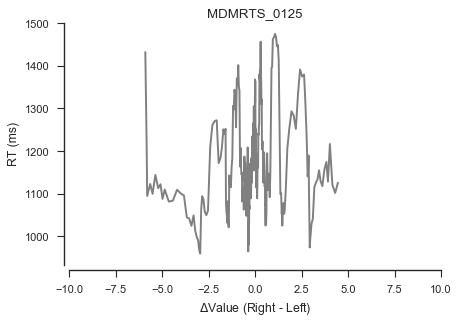

consistency: 0.72
nTrials: 280


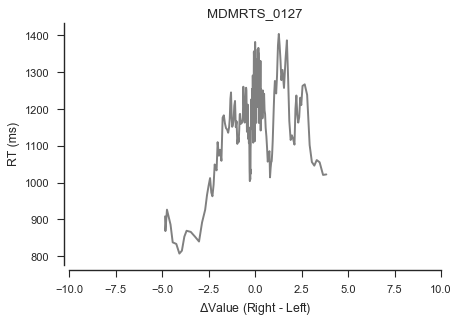

consistency: 0.65
nTrials: 280


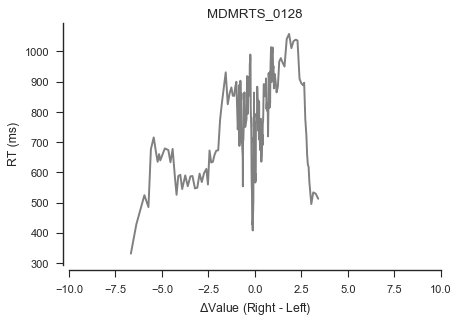

consistency: 0.44
nTrials: 267


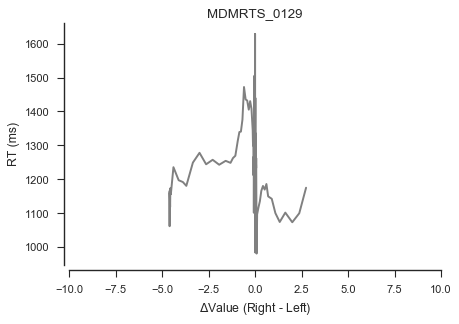

consistency: 0.53
nTrials: 279


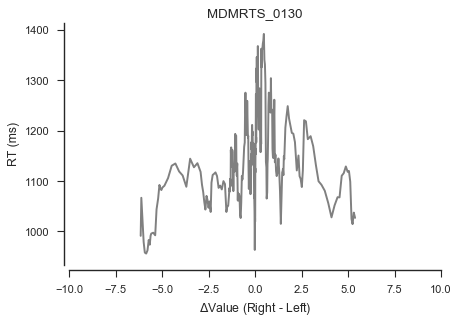

consistency: 0.67
nTrials: 280


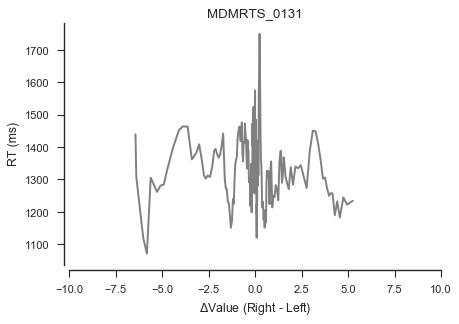

consistency: 0.61
nTrials: 280


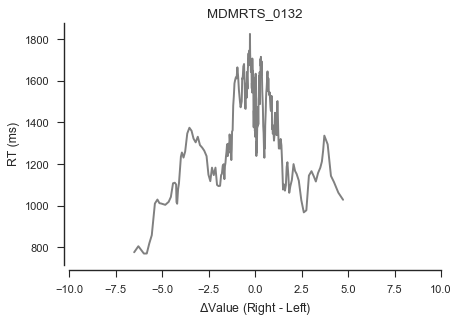

consistency: 0.78
nTrials: 278


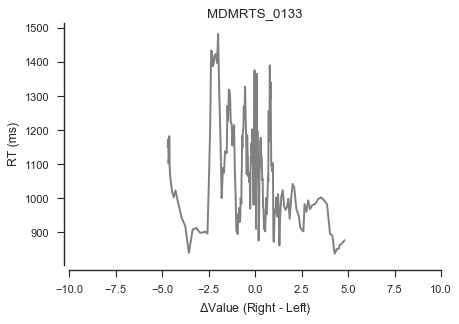

consistency: 0.66
nTrials: 279


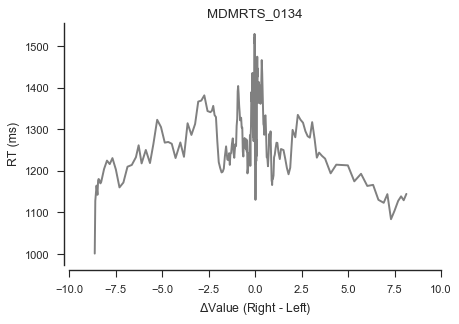

consistency: 0.67
nTrials: 276


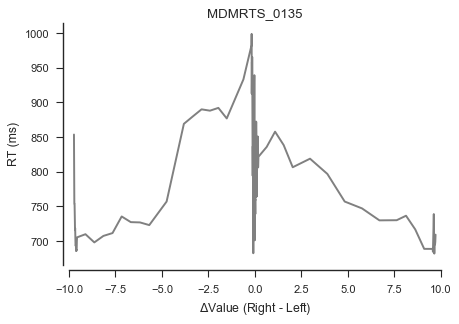

consistency: 0.56
nTrials: 280


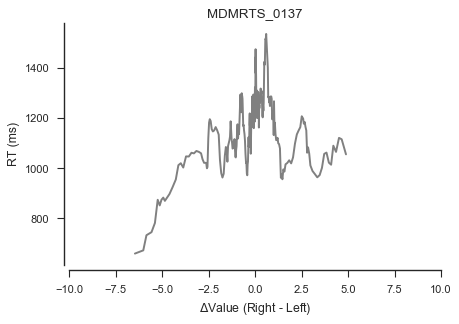

consistency: 0.73
nTrials: 266


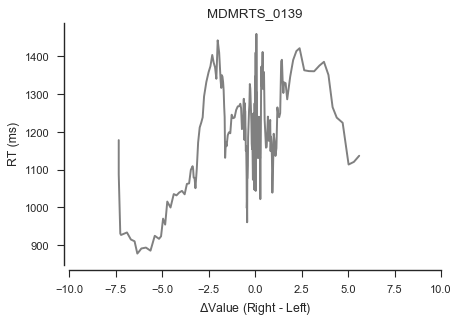

consistency: 0.67
nTrials: 279


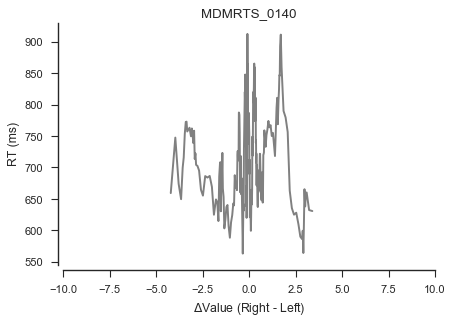

consistency: 0.58
nTrials: 277


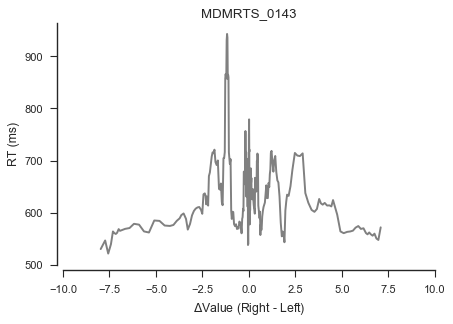

consistency: 0.62
nTrials: 275


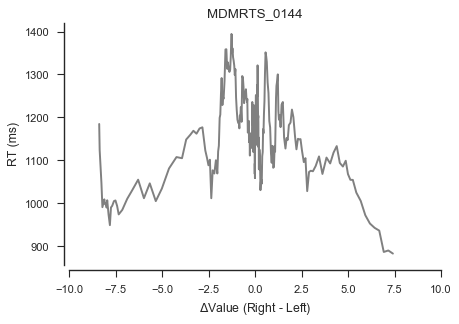

consistency: 0.69
nTrials: 280


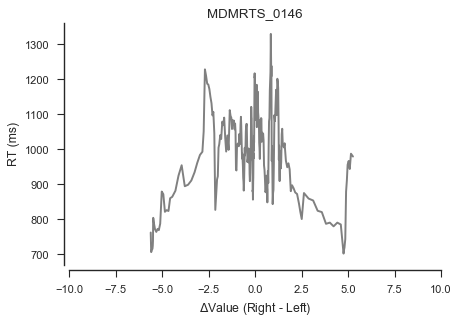

consistency: 0.7
nTrials: 280


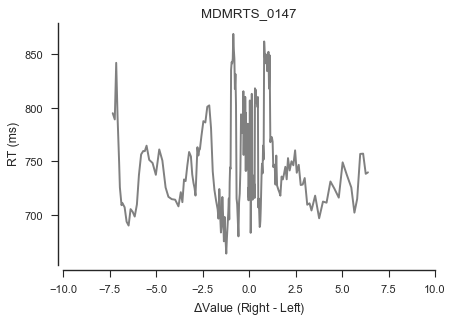

consistency: 0.61
nTrials: 275


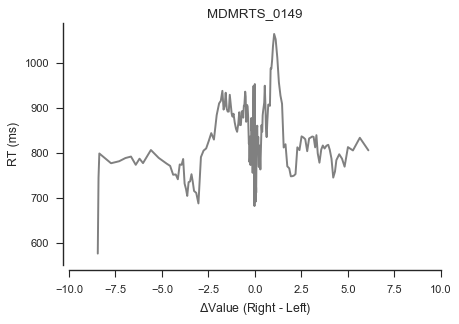

consistency: 0.65
nTrials: 279


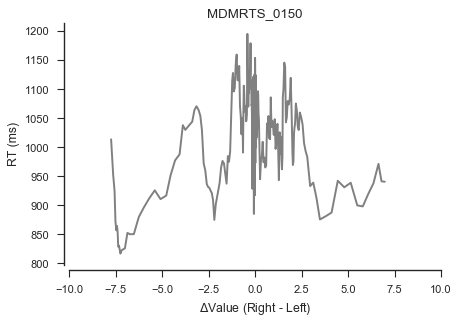

consistency: 0.63
nTrials: 279


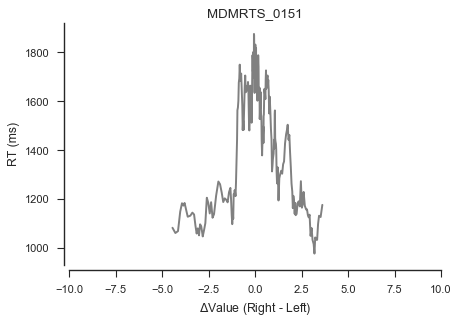

consistency: 0.8
nTrials: 277


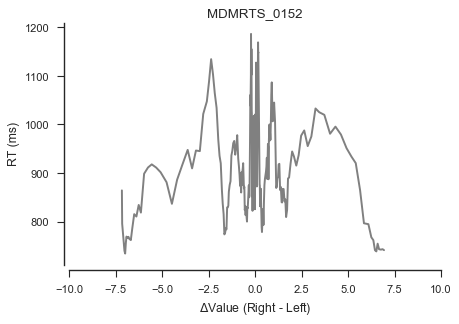

consistency: 0.66
nTrials: 280


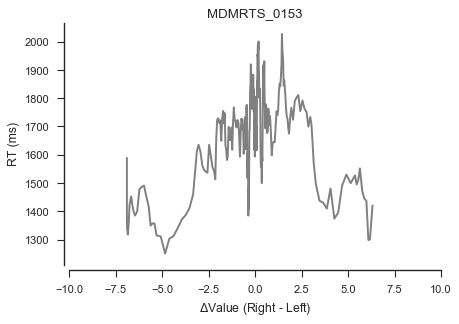

consistency: 0.74
nTrials: 279


In [77]:
get_rt_plots(zscoreRatings=False, printFigs=True)

In [7]:
def get_cleaned_data(df, zscoreRatings):
    # remove trials with no response and where RT <= 300ms
    df = df.loc[(df["receivedResponse"] == True) & (df["rt"] > 300)]

    rightStimRatings = df["stimulus2Bid"]
    leftStimRatings = df["stimulus1Bid"]

    if zscoreRatings:
        subjectId = df['subjectId'].values[0]
        mean, std = get_ratings_mean_and_std(subjectId)
        rightStimRatings = (rightStimRatings - mean) / std
        leftStimRatings = (leftStimRatings - mean) / std

    delta = rightStimRatings - leftStimRatings
    rt = df["rt"]
    choseRight = df["selected"] == df["stimulus2"]
    choseRight.replace([True],[1],inplace=True)
    choseRight.replace([False],[0],inplace=True)

    d = {'delta':delta, 'PRight':choseRight, 'RT':rt}

    df2 = pd.DataFrame(data=d)

    df2 = df2.sort_values('delta',axis=0, ascending = True) 
    df2 = df2.reset_index(drop=True)
    return df2

In [8]:
def get_subject_p_logistic_by_familiarity(subjectId, zscoreRatings, printFigs):
    subjectFolder = _dataDir + subjectId + '/'
    choiceFile = subjectFolder + subjectId + choiceFileEnd
    if os.path.exists(choiceFile):
        df = pd.read_csv(choiceFile)
        familiar_df = df.loc[df['sceneStimulusStatus'] == 'familiar']
        novel_df = df.loc[df['sceneStimulusStatus'] == 'novel']
        
        familiar_df2 = get_cleaned_data(familiar_df, zscoreRatings)
        familiar_y = familiar_df2.rolling(window=10,min_periods=1).mean()
        
        novel_df2 = get_cleaned_data(novel_df, zscoreRatings)
        novel_y = novel_df2.rolling(window=10,min_periods=1).mean()
        
        delta_max = max(np.append(familiar_y['delta'], novel_y['delta'])) + .5
        delta_min = min(np.append(familiar_y['delta'], novel_y['delta'])) - .5
        
        if printFigs:
            plt.rcParams['figure.dpi'] = 80
            fig = plt.figure()
            
            ax_choice = fig.add_subplot(1, 2, 1)
            ax_choice.plot(familiar_y['delta'],familiar_y['PRight'],color='grey')
            ax_choice.set_title(subjectId + ' Familiar')
            ax_choice.set_xlabel(r'$\Delta$Value (Right - Left)')
            ax_choice.set_ylabel('P(respond right)')
            ax_choice.set_xlim(delta_min,delta_max)
            ax_choice.set_ylim(0,1)
            
            ax_choice = fig.add_subplot(1, 2, 2)
            ax_choice.plot(novel_y['delta'],novel_y['PRight'],color='grey')
            ax_choice.set_title(subjectId + ' Novel')
            ax_choice.set_xlabel(r'$\Delta$Value (Right - Left)')
            ax_choice.set_ylabel('P(respond right)')
            ax_choice.set_xlim(delta_min,delta_max)
            ax_choice.set_ylim(0,1)
            
            sns.set_style("whitegrid")
            sns.set(style="ticks")
            sns.despine(offset=5)
            
            plt.tight_layout()
            plt.show()
            
            print "nFamiliarTrials: ", len(familiar_y)
            print "nNovelTrials: ", len(novel_y)
            print

        model = sm.Logit(familiar_df2["PRight"], familiar_df2["delta"])
        result = model.fit(disp=0)
        
        """
        if printFigs:
            print result.summary()
        """
        pval = result.pvalues["delta"]
        
        return familiar_df2, novel_df2, pval
        
def get_p_logistic_plots_by_familiarity(zscoreRatings, printFigs):
    subjects = get_subjects_w_full_data()
    n = len(subjects)
    pvals = []
    for subject in subjects:
        sub_fam_df, sub_nov_df, pval = get_subject_p_logistic_by_familiarity(subject, zscoreRatings, printFigs)
        pvals.append(pval)
    results = {"subjectId":subjects, "p value":pvals}
    df = pd.DataFrame(data=results)
    df_sig_pval = df.loc[df['p value'] < 0.05]
    #print df_sig_pval.to_string()
    print "Of", df.shape[0], "subjects,", df_sig_pval.shape[0], "subjects had significant p values for the logistic regression."
    return df_sig_pval

total number of people who accepted the HIT 153
106 subjects completed the auction and choice tasks.


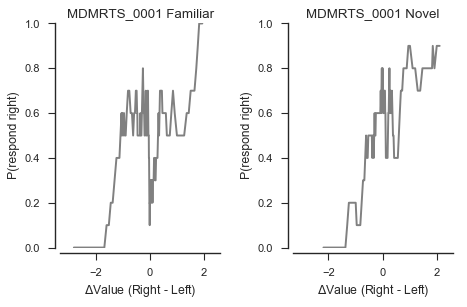

nFamiliarTrials:  140
nNovelTrials:  140



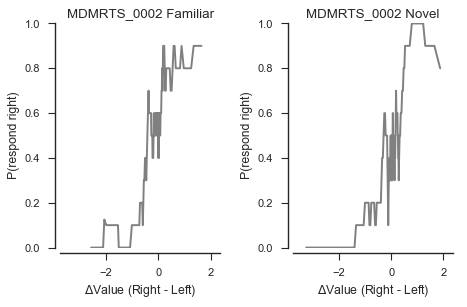

nFamiliarTrials:  140
nNovelTrials:  140



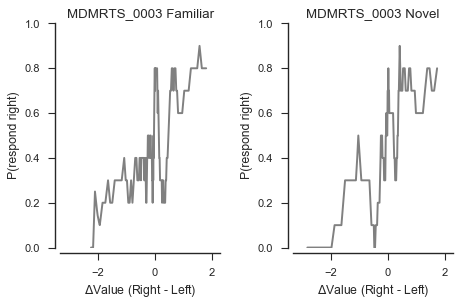

nFamiliarTrials:  139
nNovelTrials:  138



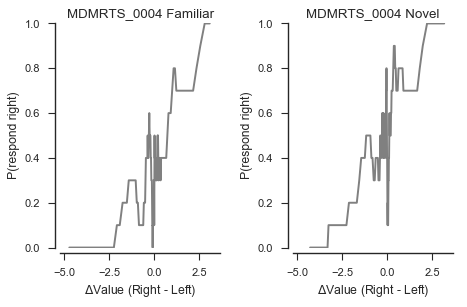

nFamiliarTrials:  131
nNovelTrials:  132



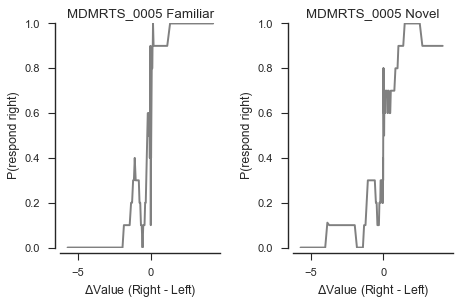

nFamiliarTrials:  140
nNovelTrials:  140



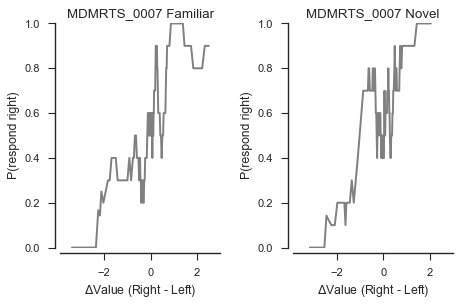

nFamiliarTrials:  139
nNovelTrials:  140



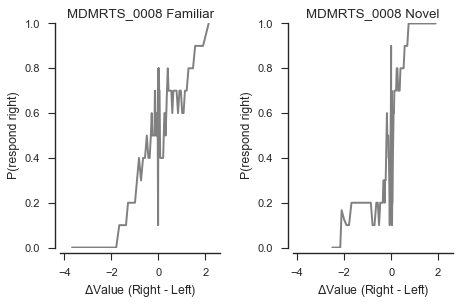

nFamiliarTrials:  140
nNovelTrials:  139



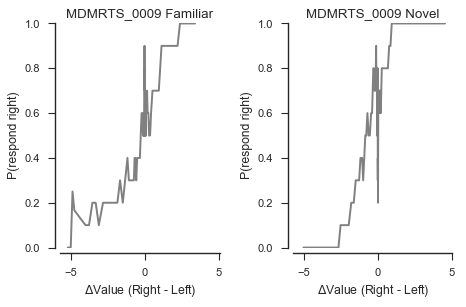

nFamiliarTrials:  140
nNovelTrials:  140



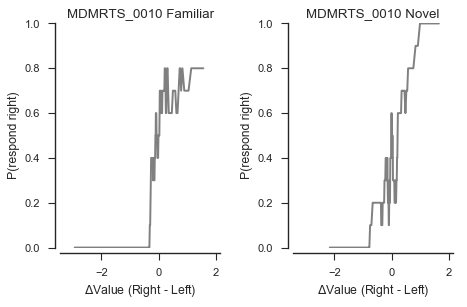

nFamiliarTrials:  126
nNovelTrials:  127



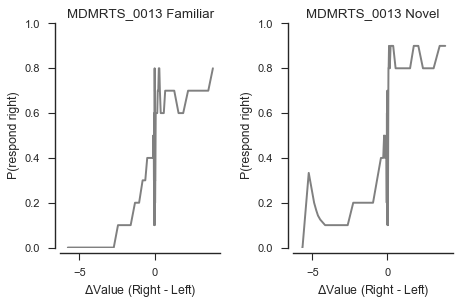

nFamiliarTrials:  139
nNovelTrials:  140



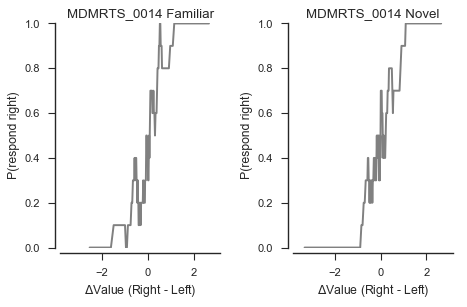

nFamiliarTrials:  139
nNovelTrials:  139



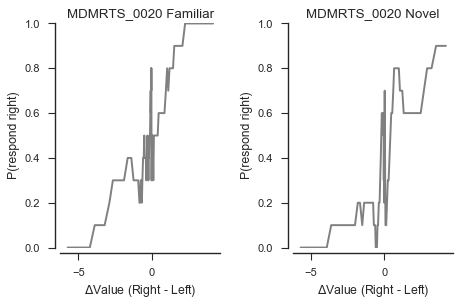

nFamiliarTrials:  140
nNovelTrials:  140



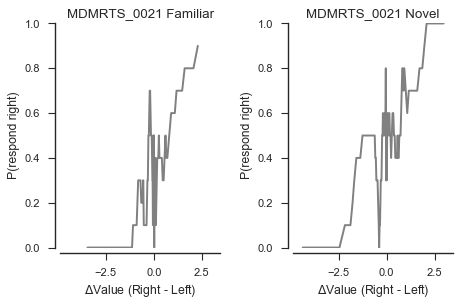

nFamiliarTrials:  140
nNovelTrials:  140



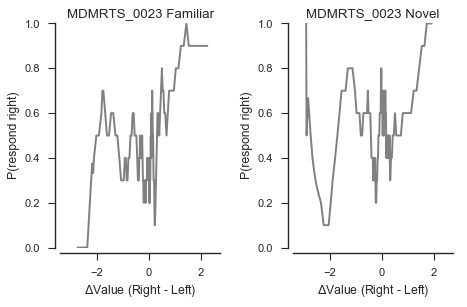

nFamiliarTrials:  140
nNovelTrials:  139



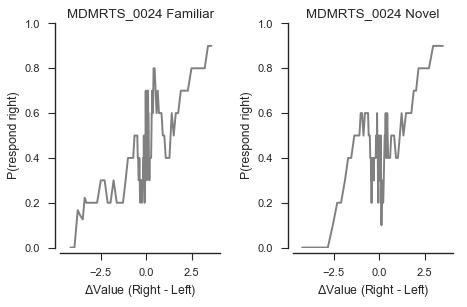

nFamiliarTrials:  140
nNovelTrials:  140



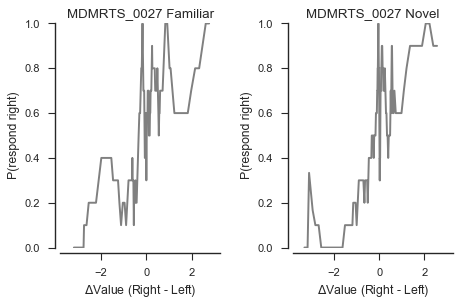

nFamiliarTrials:  140
nNovelTrials:  139



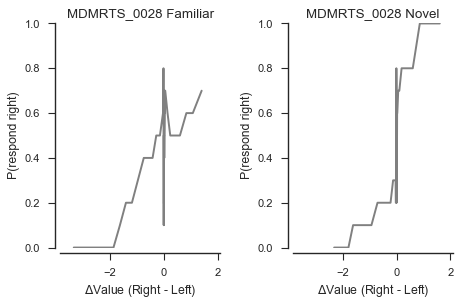

nFamiliarTrials:  140
nNovelTrials:  139



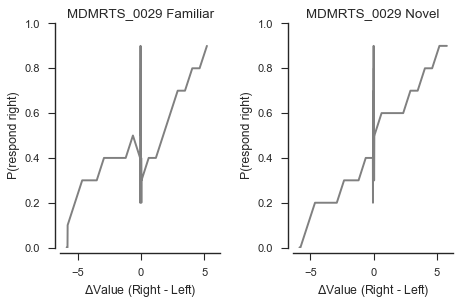

nFamiliarTrials:  140
nNovelTrials:  140



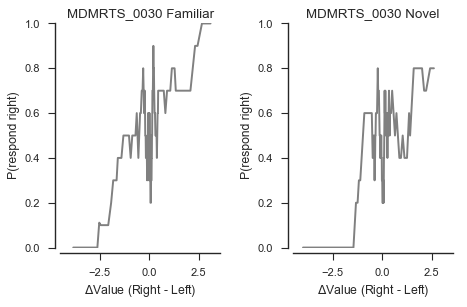

nFamiliarTrials:  140
nNovelTrials:  135



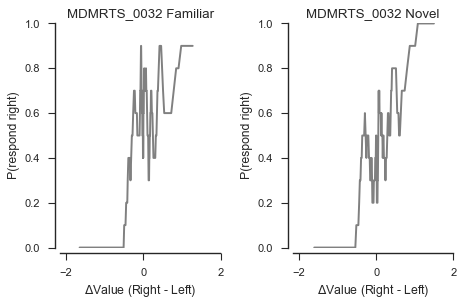

nFamiliarTrials:  139
nNovelTrials:  139



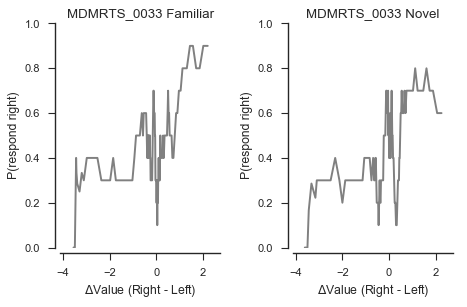

nFamiliarTrials:  131
nNovelTrials:  132



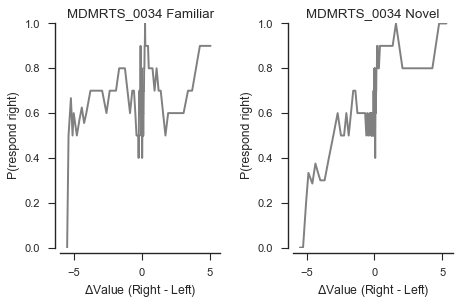

nFamiliarTrials:  134
nNovelTrials:  135



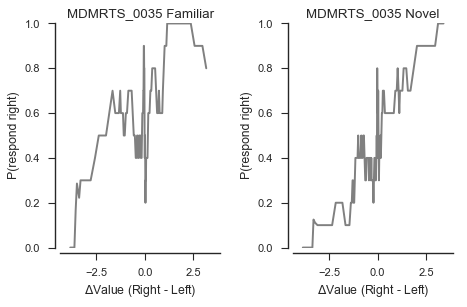

nFamiliarTrials:  137
nNovelTrials:  139



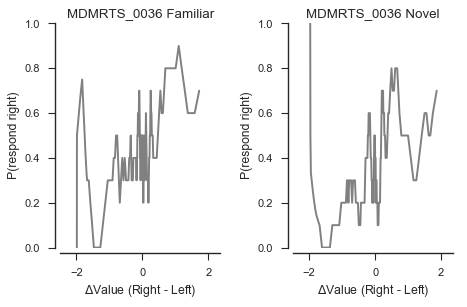

nFamiliarTrials:  140
nNovelTrials:  140



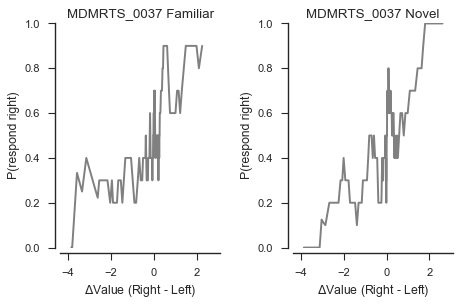

nFamiliarTrials:  139
nNovelTrials:  140



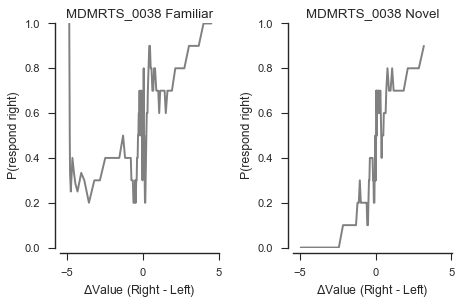

nFamiliarTrials:  132
nNovelTrials:  123



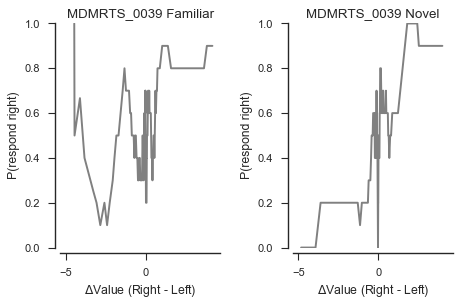

nFamiliarTrials:  137
nNovelTrials:  139



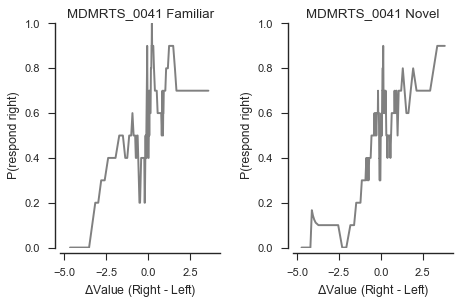

nFamiliarTrials:  140
nNovelTrials:  140



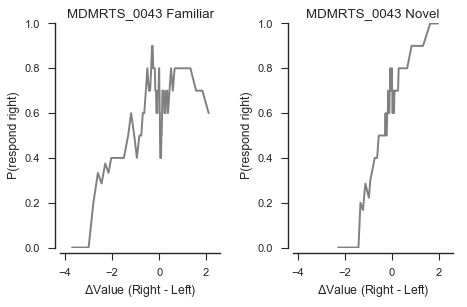

nFamiliarTrials:  78
nNovelTrials:  61



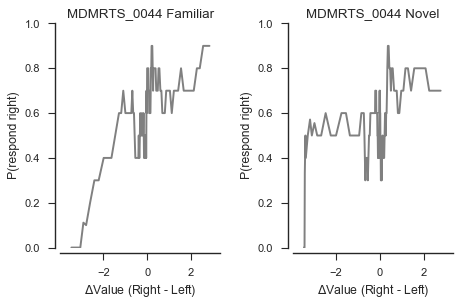

nFamiliarTrials:  131
nNovelTrials:  124



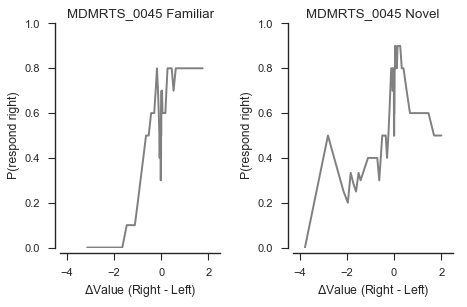

nFamiliarTrials:  71
nNovelTrials:  66



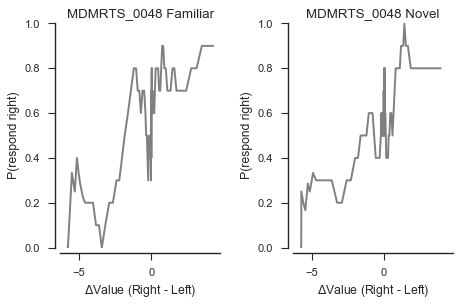

nFamiliarTrials:  140
nNovelTrials:  140



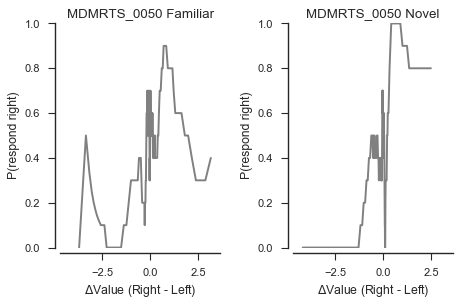

nFamiliarTrials:  135
nNovelTrials:  133



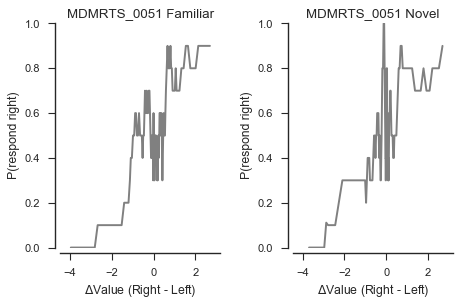

nFamiliarTrials:  140
nNovelTrials:  140



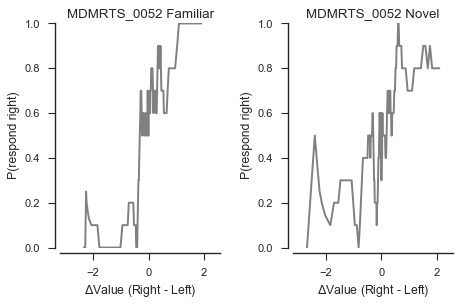

nFamiliarTrials:  140
nNovelTrials:  139



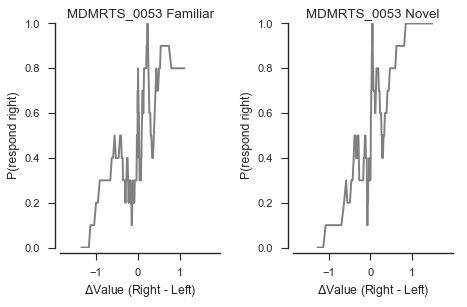

nFamiliarTrials:  139
nNovelTrials:  139



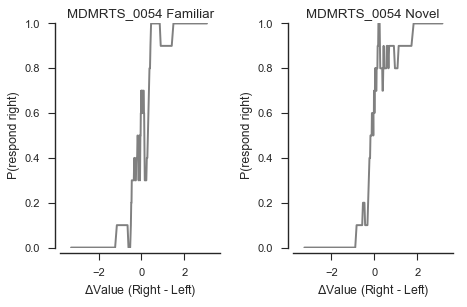

nFamiliarTrials:  139
nNovelTrials:  139



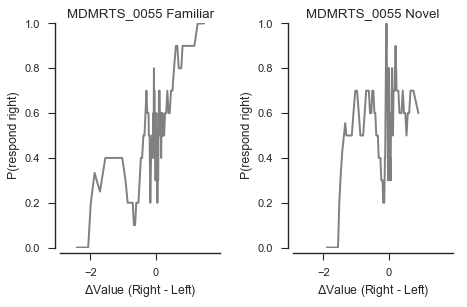

nFamiliarTrials:  140
nNovelTrials:  139



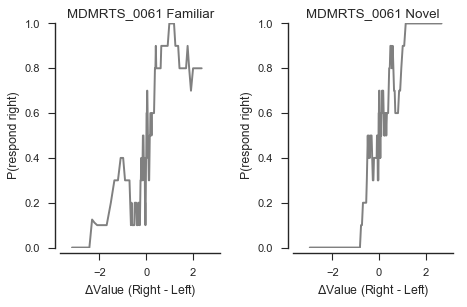

nFamiliarTrials:  137
nNovelTrials:  133



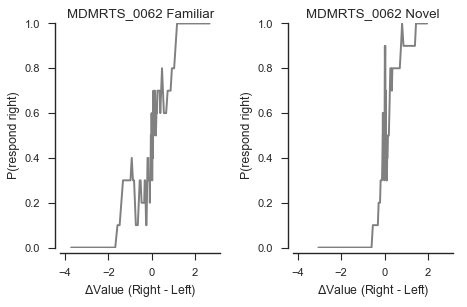

nFamiliarTrials:  138
nNovelTrials:  139



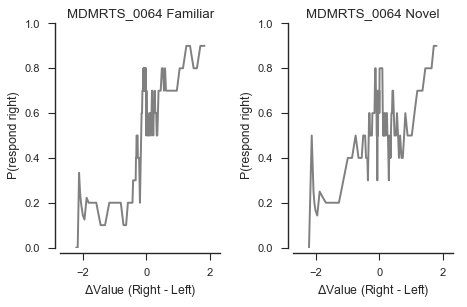

nFamiliarTrials:  140
nNovelTrials:  140



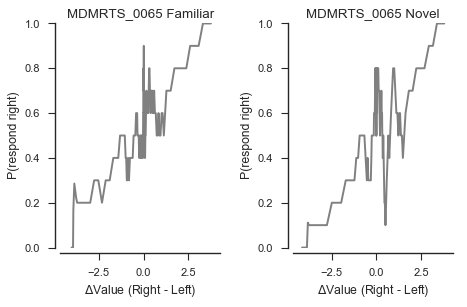

nFamiliarTrials:  132
nNovelTrials:  134



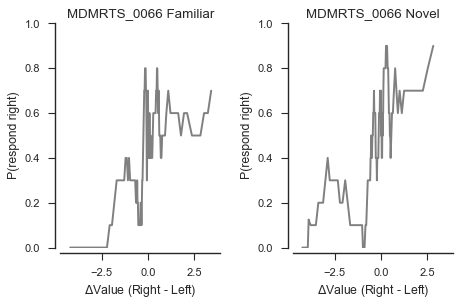

nFamiliarTrials:  140
nNovelTrials:  138



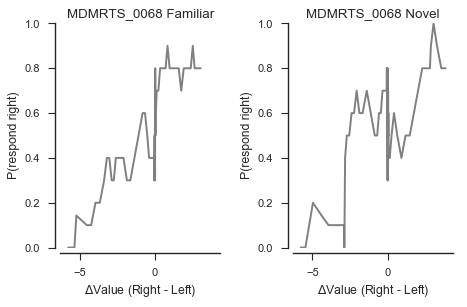

nFamiliarTrials:  139
nNovelTrials:  139



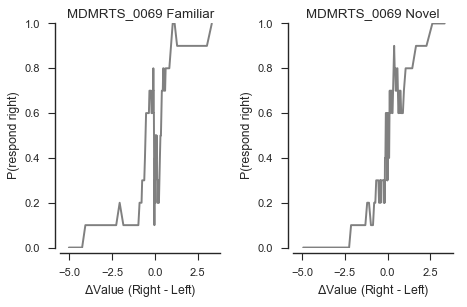

nFamiliarTrials:  136
nNovelTrials:  136



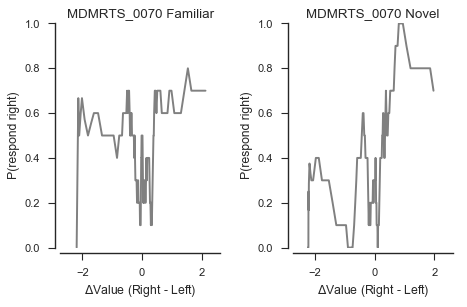

nFamiliarTrials:  129
nNovelTrials:  119



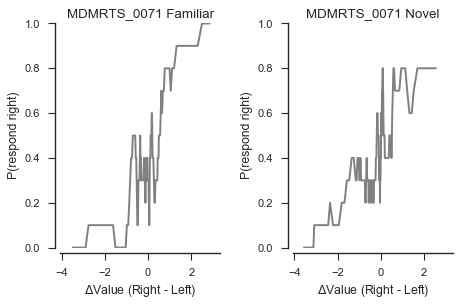

nFamiliarTrials:  138
nNovelTrials:  137



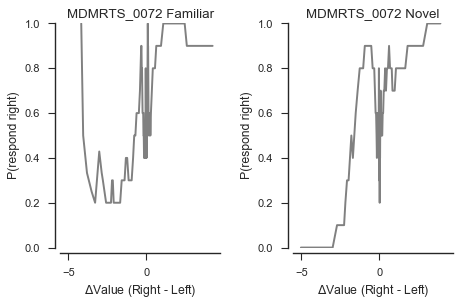

nFamiliarTrials:  139
nNovelTrials:  137



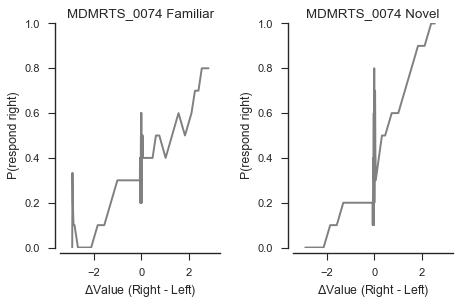

nFamiliarTrials:  140
nNovelTrials:  139



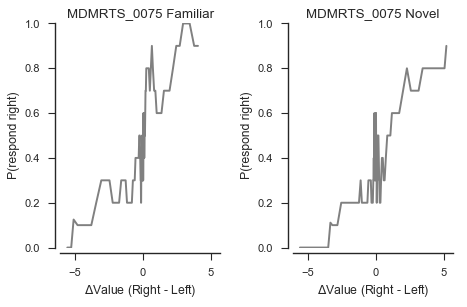

nFamiliarTrials:  138
nNovelTrials:  135



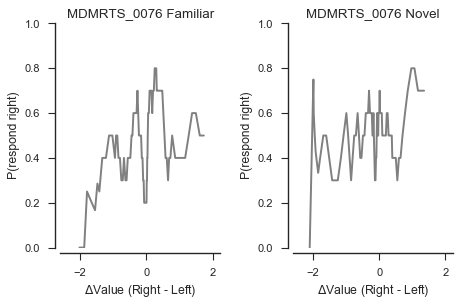

nFamiliarTrials:  90
nNovelTrials:  89



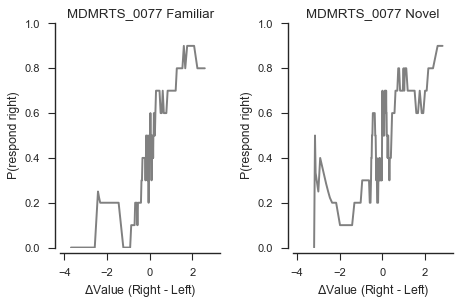

nFamiliarTrials:  140
nNovelTrials:  140



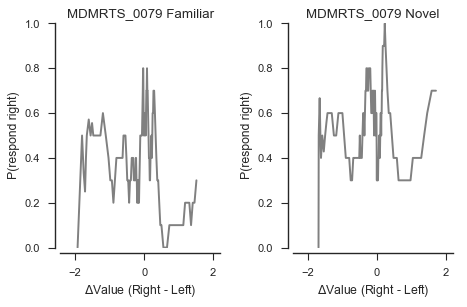

nFamiliarTrials:  121
nNovelTrials:  124



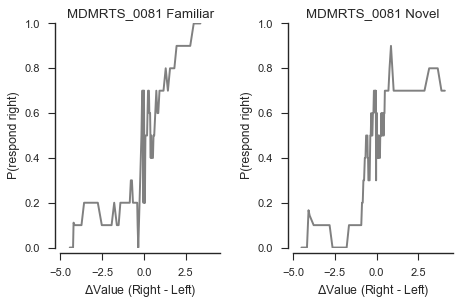

nFamiliarTrials:  134
nNovelTrials:  133



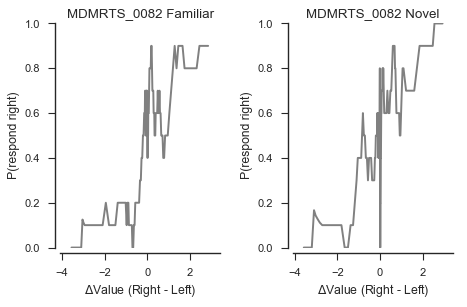

nFamiliarTrials:  139
nNovelTrials:  139



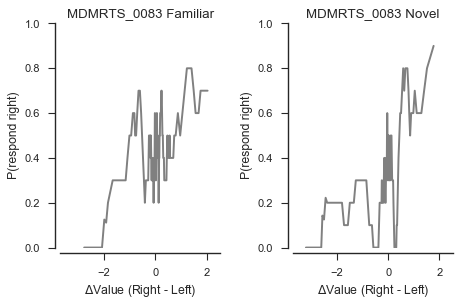

nFamiliarTrials:  139
nNovelTrials:  140



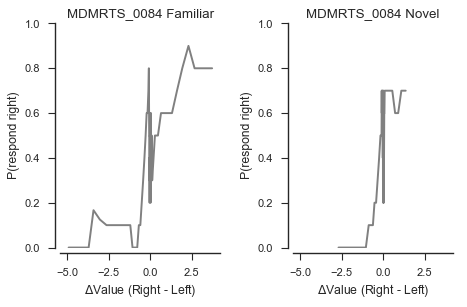

nFamiliarTrials:  135
nNovelTrials:  133



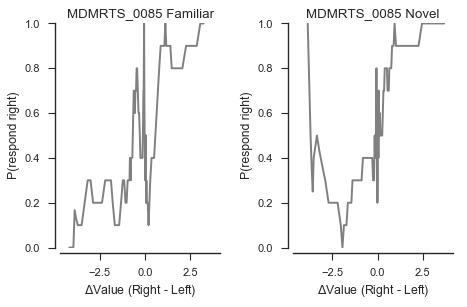

nFamiliarTrials:  138
nNovelTrials:  139



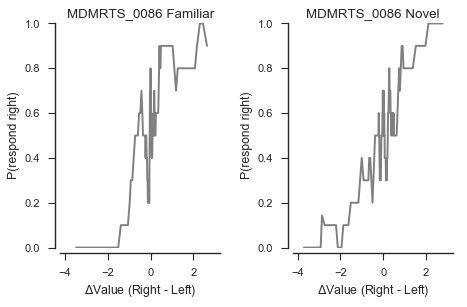

nFamiliarTrials:  138
nNovelTrials:  140



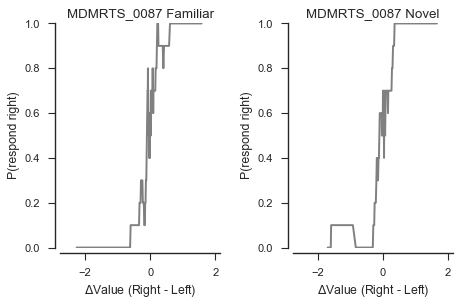

nFamiliarTrials:  140
nNovelTrials:  140



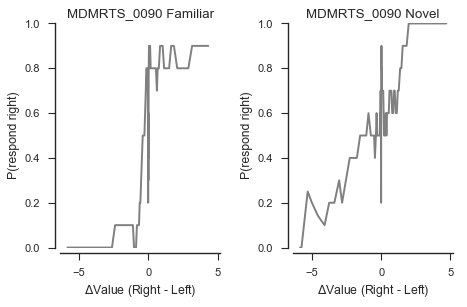

nFamiliarTrials:  136
nNovelTrials:  134



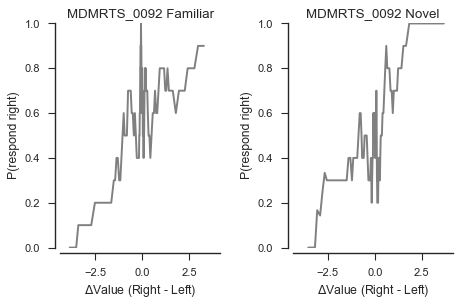

nFamiliarTrials:  132
nNovelTrials:  136



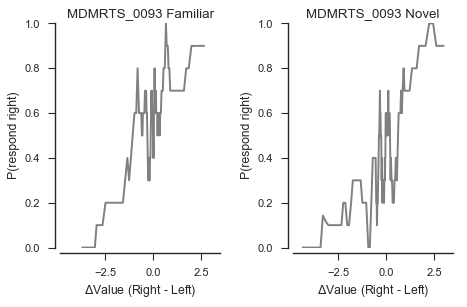

nFamiliarTrials:  140
nNovelTrials:  140



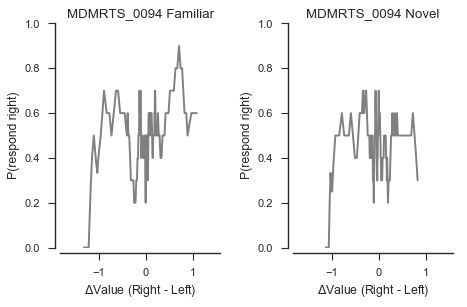

nFamiliarTrials:  136
nNovelTrials:  138



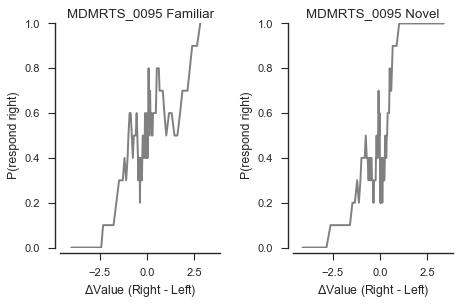

nFamiliarTrials:  139
nNovelTrials:  140



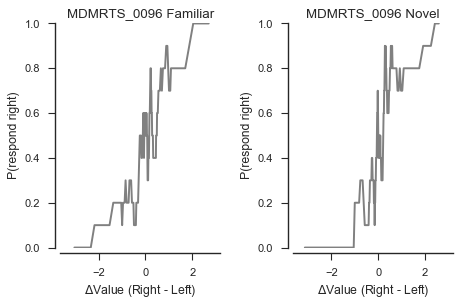

nFamiliarTrials:  140
nNovelTrials:  140



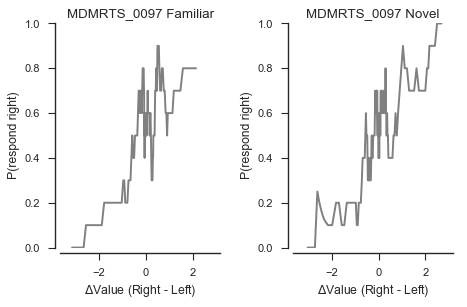

nFamiliarTrials:  140
nNovelTrials:  140



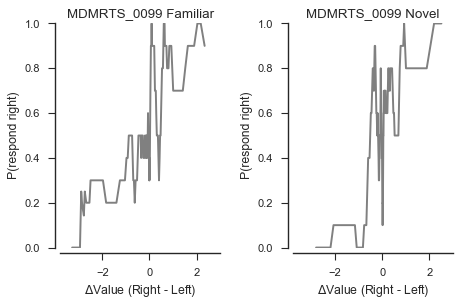

nFamiliarTrials:  140
nNovelTrials:  140



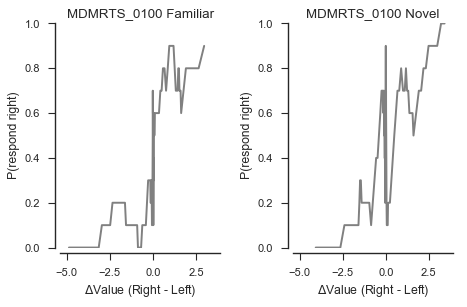

nFamiliarTrials:  139
nNovelTrials:  139



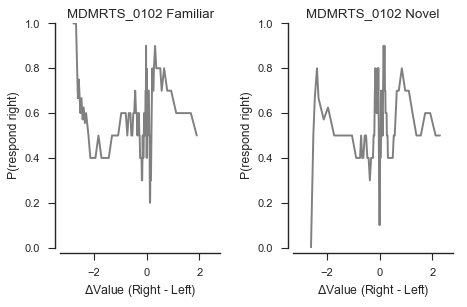

nFamiliarTrials:  127
nNovelTrials:  129



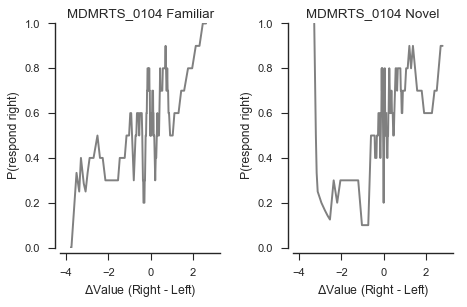

nFamiliarTrials:  139
nNovelTrials:  139



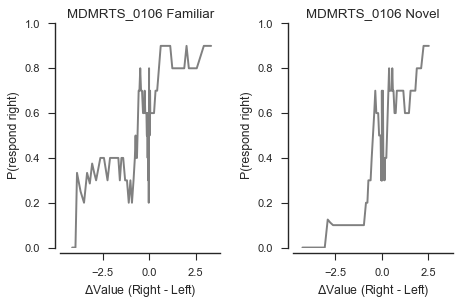

nFamiliarTrials:  140
nNovelTrials:  140



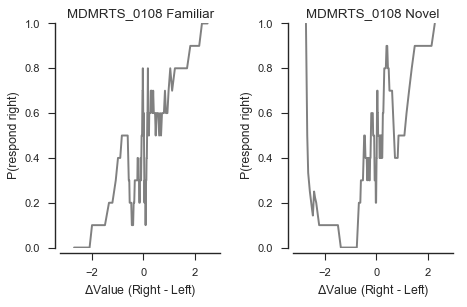

nFamiliarTrials:  137
nNovelTrials:  134



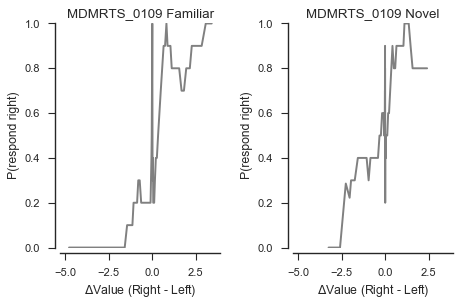

nFamiliarTrials:  140
nNovelTrials:  136



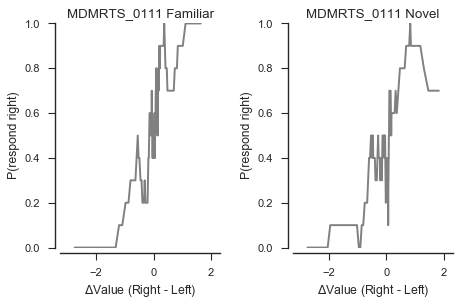

nFamiliarTrials:  138
nNovelTrials:  139



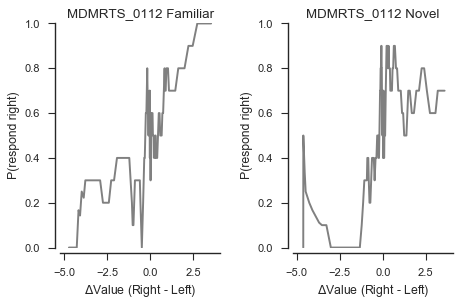

nFamiliarTrials:  140
nNovelTrials:  140



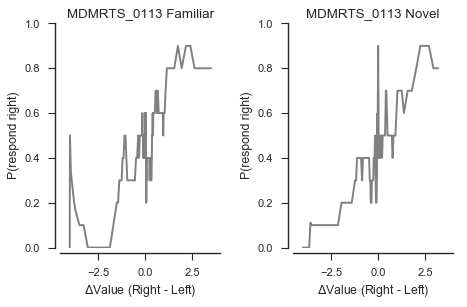

nFamiliarTrials:  140
nNovelTrials:  139



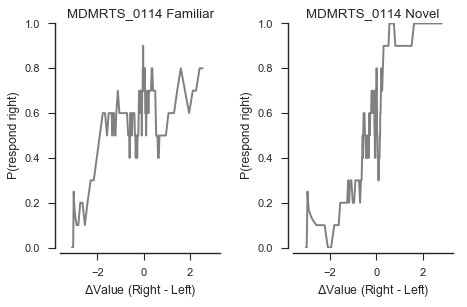

nFamiliarTrials:  140
nNovelTrials:  140



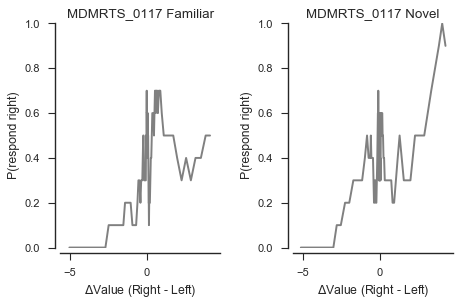

nFamiliarTrials:  137
nNovelTrials:  140



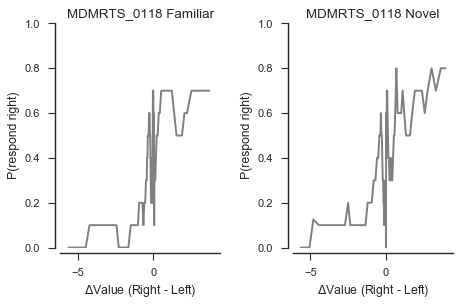

nFamiliarTrials:  138
nNovelTrials:  134



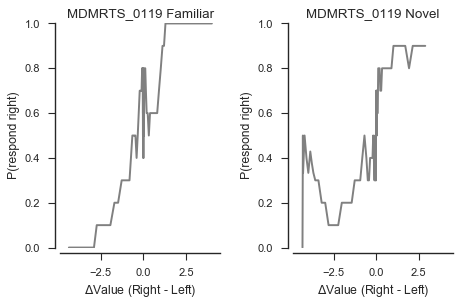

nFamiliarTrials:  116
nNovelTrials:  121



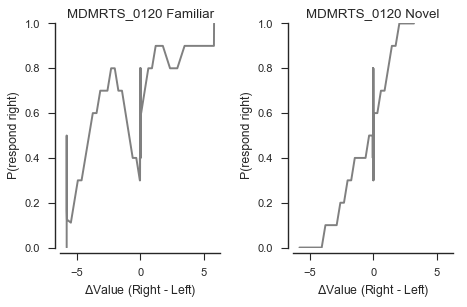

nFamiliarTrials:  140
nNovelTrials:  140



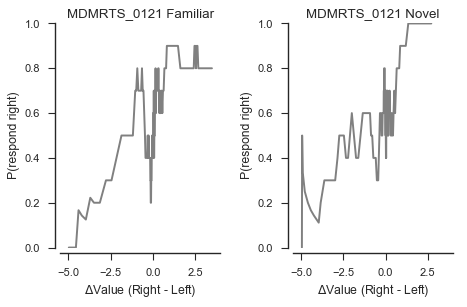

nFamiliarTrials:  140
nNovelTrials:  140



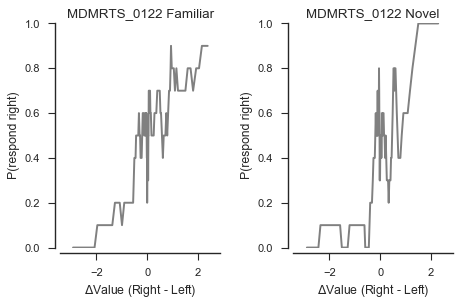

nFamiliarTrials:  140
nNovelTrials:  140



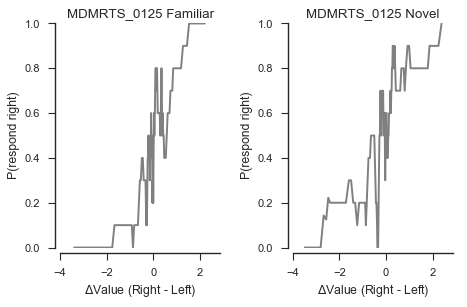

nFamiliarTrials:  140
nNovelTrials:  140



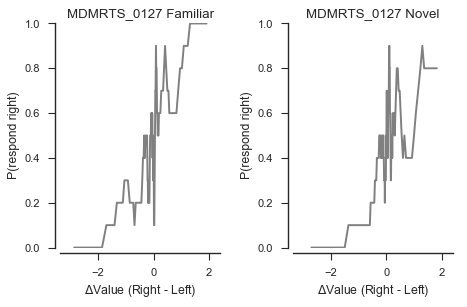

nFamiliarTrials:  140
nNovelTrials:  140



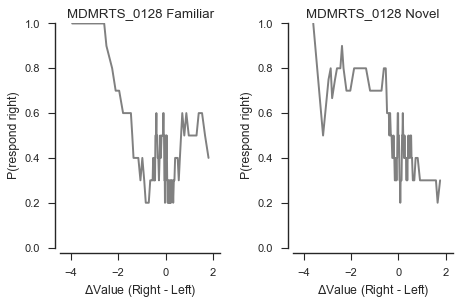

nFamiliarTrials:  117
nNovelTrials:  104



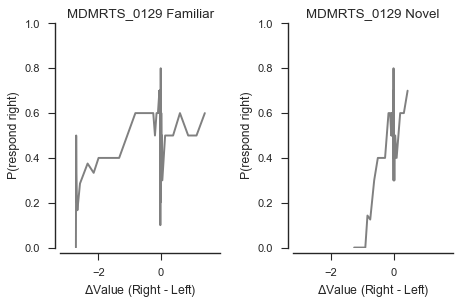

nFamiliarTrials:  140
nNovelTrials:  139



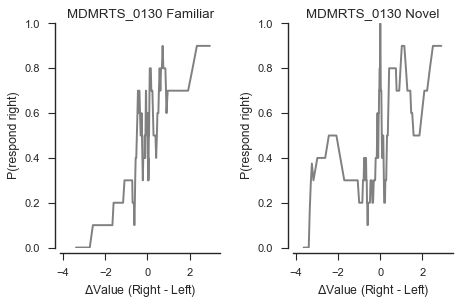

nFamiliarTrials:  140
nNovelTrials:  140



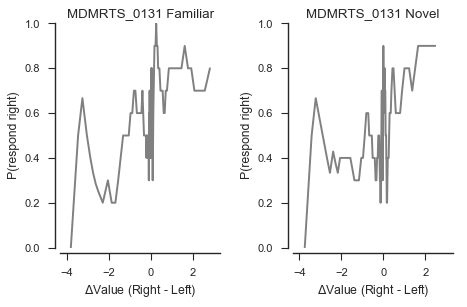

nFamiliarTrials:  139
nNovelTrials:  136



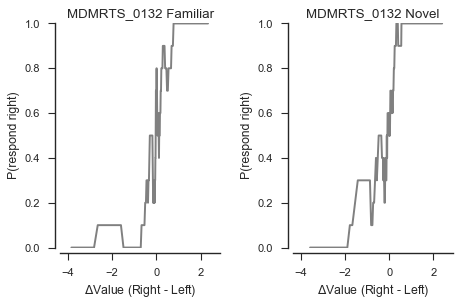

nFamiliarTrials:  139
nNovelTrials:  139



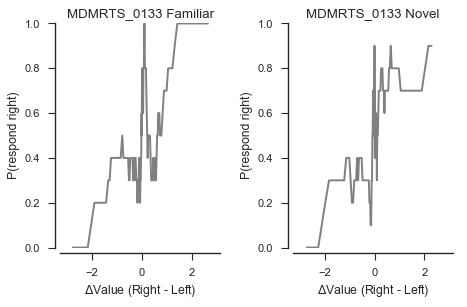

nFamiliarTrials:  140
nNovelTrials:  139



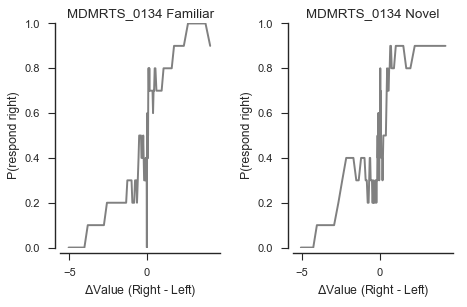

nFamiliarTrials:  137
nNovelTrials:  139



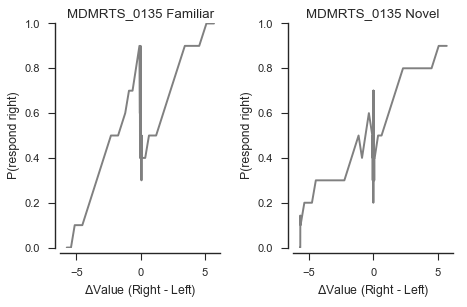

nFamiliarTrials:  140
nNovelTrials:  140



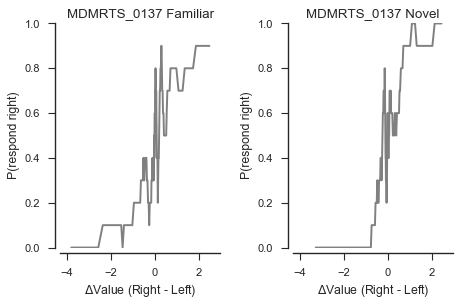

nFamiliarTrials:  136
nNovelTrials:  130



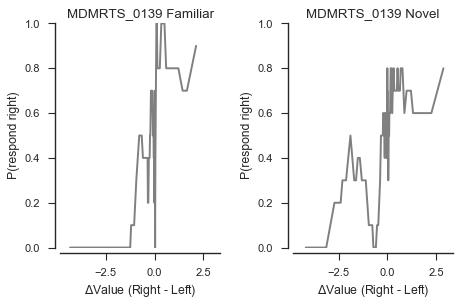

nFamiliarTrials:  139
nNovelTrials:  140



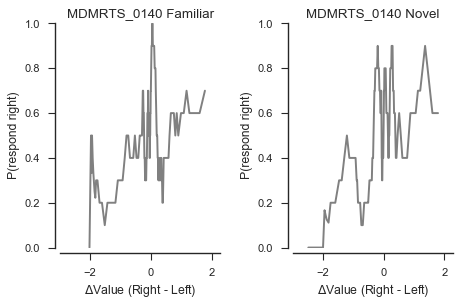

nFamiliarTrials:  126
nNovelTrials:  127



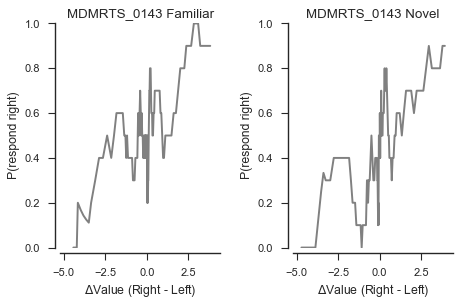

nFamiliarTrials:  139
nNovelTrials:  136



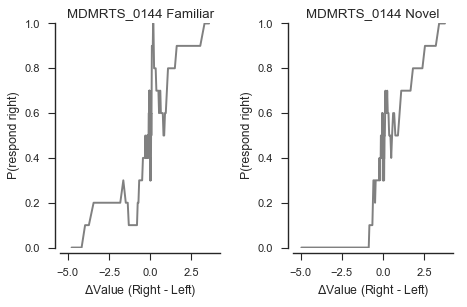

nFamiliarTrials:  140
nNovelTrials:  140



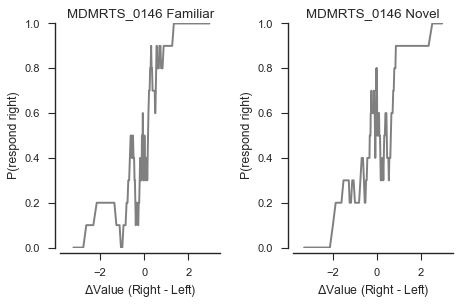

nFamiliarTrials:  140
nNovelTrials:  140



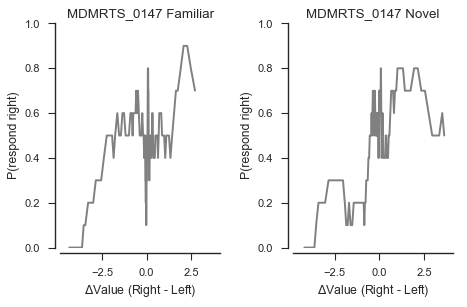

nFamiliarTrials:  137
nNovelTrials:  138



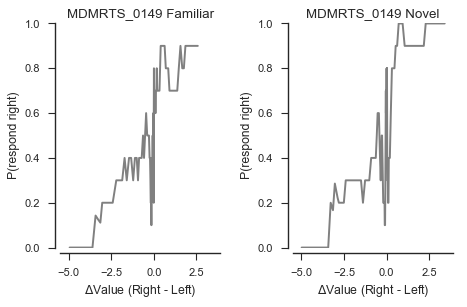

nFamiliarTrials:  139
nNovelTrials:  140



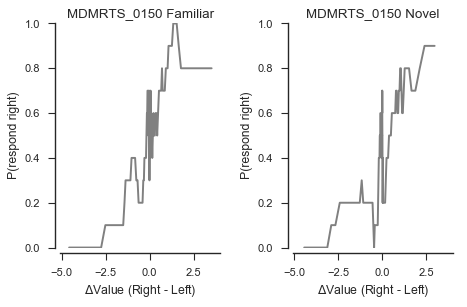

nFamiliarTrials:  139
nNovelTrials:  140



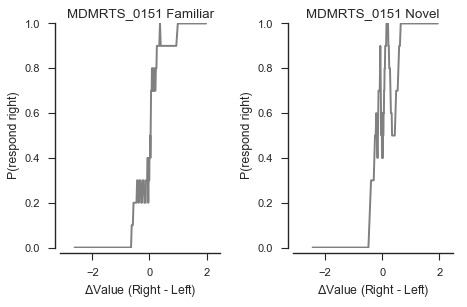

nFamiliarTrials:  140
nNovelTrials:  137



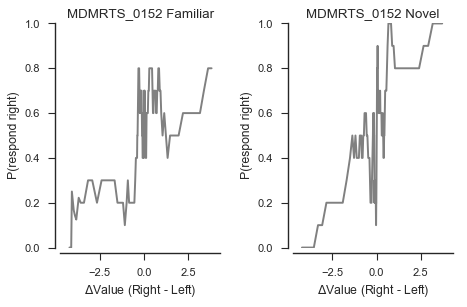

nFamiliarTrials:  140
nNovelTrials:  140



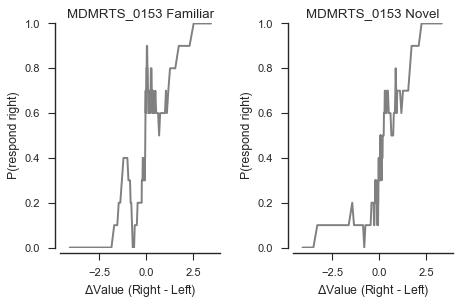

nFamiliarTrials:  140
nNovelTrials:  139

Of 106 subjects, 97 subjects had significant p values for the logistic regression.


In [79]:
get_p_logistic_plots_by_familiarity(zscoreRatings=True, printFigs=True);

In [9]:
def get_subject_rt_by_familiarity(subjectId, zscoreRatings, printFigs):
    subjectFolder = _dataDir + subjectId + '/'
    choiceFile = subjectFolder + subjectId + choiceFileEnd
    if os.path.exists(choiceFile):
        df = pd.read_csv(choiceFile)
        familiar_df = df.loc[df['sceneStimulusStatus'] == 'familiar']
        novel_df = df.loc[df['sceneStimulusStatus'] == 'novel']
        
        familiar_df2 = get_cleaned_data(familiar_df, zscoreRatings)
        familiar_y = familiar_df2.rolling(window=10,min_periods=1).mean()
        
        novel_df2 = get_cleaned_data(novel_df, zscoreRatings)
        novel_y = novel_df2.rolling(window=10,min_periods=1).mean()
        
        delta_max = max(np.append(familiar_y['delta'], novel_y['delta'])) + .5
        delta_min = min(np.append(familiar_y['delta'], novel_y['delta'])) - .5
        
        rt_max = max(np.append(familiar_y['RT'], novel_y['RT'])) + .5
        rt_min = min(np.append(familiar_y['RT'], novel_y['RT'])) - .5
        
        if printFigs:
            plt.rcParams['figure.dpi'] = 80
            fig = plt.figure()
            ax_rt = fig.add_subplot(1, 2, 1)
            ax_rt.plot(familiar_y['delta'],familiar_y['RT'],color='grey')
            ax_rt.set_title(subjectId + ' Familiar')
            ax_rt.set_xlabel(r'$\Delta$Value (Right - Left)')
            ax_rt.set_ylabel('RT (ms)')
            ax_rt.set_xlim(delta_min,delta_max)
            ax_rt.set_ylim(rt_min,rt_max)
            
            ax_rt = fig.add_subplot(1, 2, 2)
            ax_rt.plot(novel_y['delta'],novel_y['RT'],color='grey')
            ax_rt.set_title(subjectId + ' Novel')
            ax_rt.set_xlabel(r'$\Delta$Value (Right - Left)')
            ax_rt.set_ylabel('RT (ms)')
            ax_rt.set_xlim(delta_min,delta_max)
            ax_rt.set_ylim(rt_min,rt_max)
            
            sns.set_style("whitegrid")
            sns.set(style="ticks")
            sns.despine(offset=5)
            
            plt.tight_layout()
            plt.show()
            
            print "nFamiliarTrials: ", len(familiar_y)
            print "nNovelTrials: ", len(novel_y)
            print
        
            print 'mean RT in familiar condition:', mean(familiar_y['RT'])
            print 'mean RT novel condition:', mean(novel_y['RT'])
            print 
            print 'median RT in familiar condition:', np.median(familiar_y['RT'])
            print 'median RT novel condition:', np.median(novel_y['RT'])
            print
        return familiar_df2, novel_df2
        
def get_rt_plots_by_familiarity(zscoreRatings, printFigs):
    subjects = get_subjects_w_full_data()
    n = len(subjects)
    pvals = []
    for subject in subjects:
        sub_fam_df, sub_nov_df = get_subject_rt_by_familiarity(subject, zscoreRatings, printFigs)

total number of people who accepted the HIT 153
105 subjects completed the auction and choice tasks.


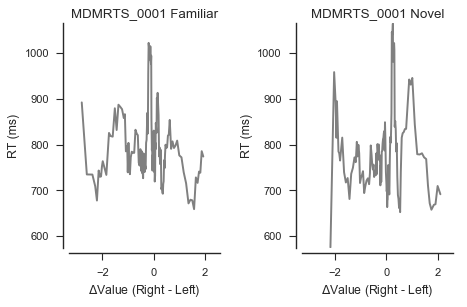

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 796.15363719
mean RT novel condition: 781.654121593

median RT in familiar condition: 784.174999985
median RT novel condition: 767.275000003



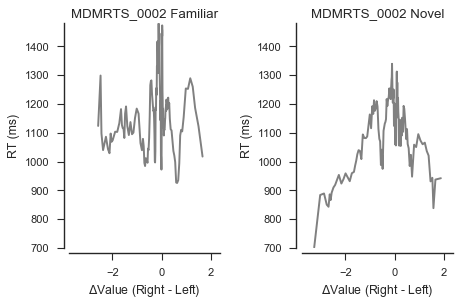

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1162.15046485
mean RT novel condition: 1099.87053288

median RT in familiar condition: 1148.8
median RT novel condition: 1114.9



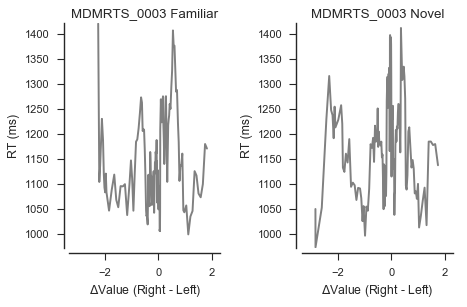

nFamiliarTrials:  139
nNovelTrials:  138

mean RT in familiar condition: 1146.06342926
mean RT novel condition: 1187.00285542

median RT in familiar condition: 1125.3
median RT novel condition: 1184.55



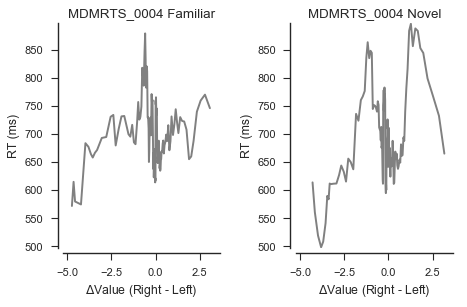

nFamiliarTrials:  131
nNovelTrials:  132

mean RT in familiar condition: 699.915133891
mean RT novel condition: 691.129608584

median RT in familiar condition: 689.599999983
median RT novel condition: 672.099999996



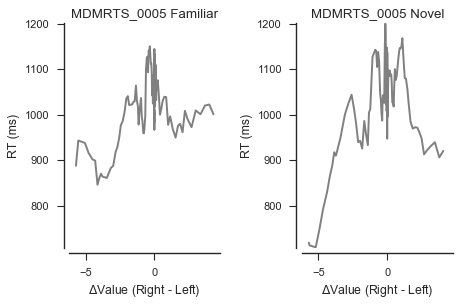

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1028.3244059
mean RT novel condition: 1035.58268594

median RT in familiar condition: 1030.675
median RT novel condition: 1048.475



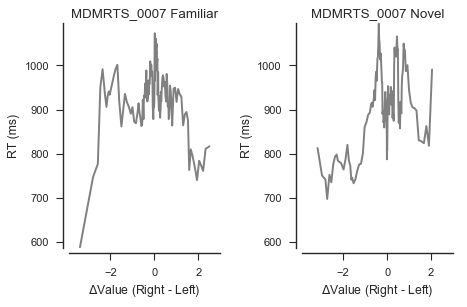

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 927.003267957
mean RT novel condition: 903.218838152

median RT in familiar condition: 929.78
median RT novel condition: 908.58



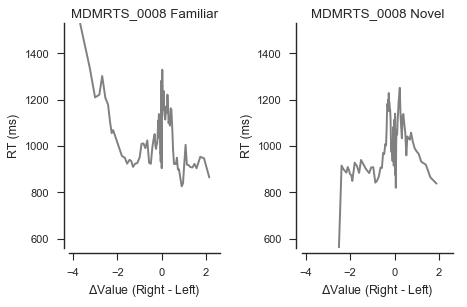

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 1064.10607226
mean RT novel condition: 1006.09317289

median RT in familiar condition: 1062.25999998
median RT novel condition: 1011.68999998



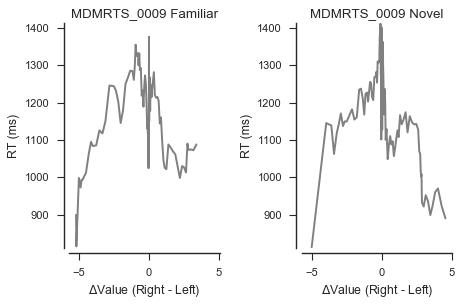

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1166.73379251
mean RT novel condition: 1177.13290816

median RT in familiar condition: 1187.09999999
median RT novel condition: 1188.25000001



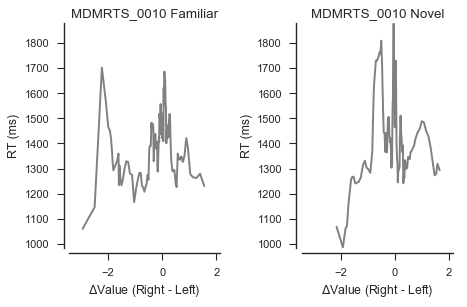

nFamiliarTrials:  126
nNovelTrials:  127

mean RT in familiar condition: 1391.22165533
mean RT novel condition: 1436.70350581

median RT in familiar condition: 1395.55
median RT novel condition: 1409.1



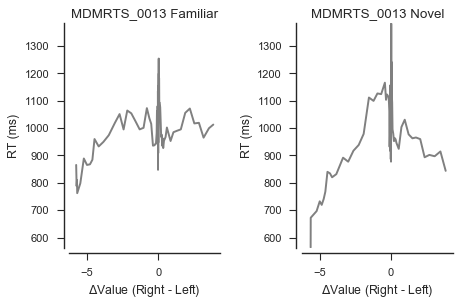

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 1017.08790053
mean RT novel condition: 1021.87163746

median RT in familiar condition: 1012.60000002
median RT novel condition: 1010.66999998



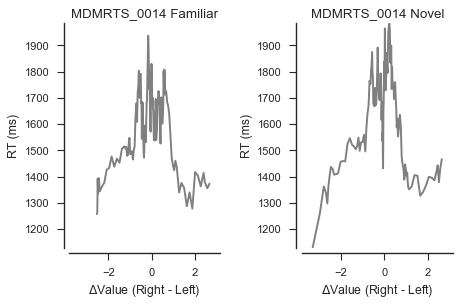

nFamiliarTrials:  139
nNovelTrials:  139

mean RT in familiar condition: 1585.14601948
mean RT novel condition: 1625.04610454

median RT in familiar condition: 1584.23000001
median RT novel condition: 1667.81999995



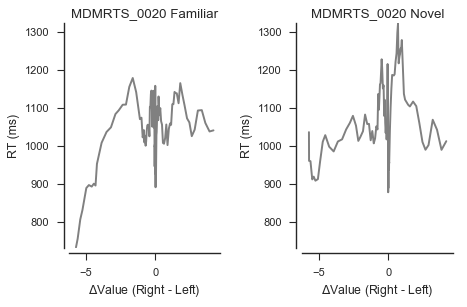

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1031.20830499
mean RT novel condition: 1064.42095805

median RT in familiar condition: 1040.2
median RT novel condition: 1050.6



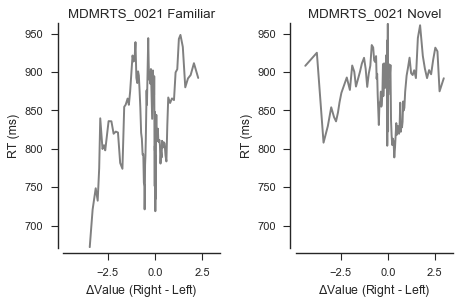

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 828.712602041
mean RT novel condition: 878.544586168

median RT in familiar condition: 821.8
median RT novel condition: 887.5



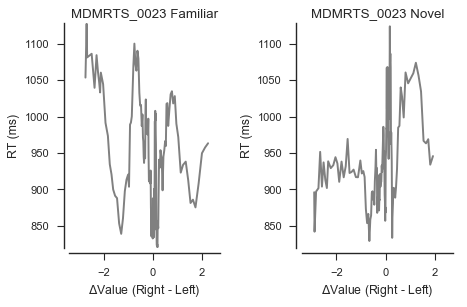

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 948.050451814
mean RT novel condition: 946.893313636

median RT in familiar condition: 946.445000002
median RT novel condition: 931.709999998



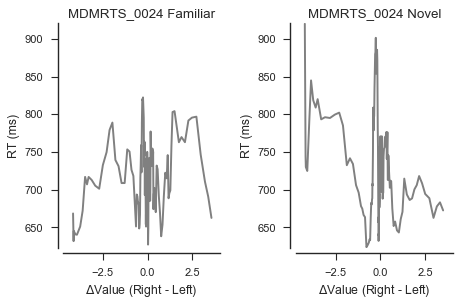

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 713.947045351
mean RT novel condition: 732.82411678

median RT in familiar condition: 709.72
median RT novel condition: 720.665



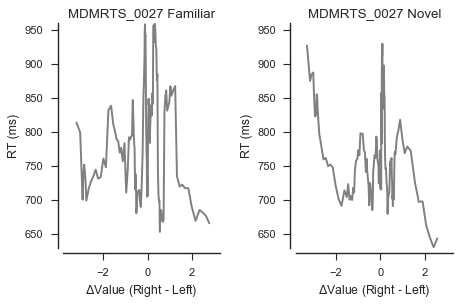

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 784.782458333
mean RT novel condition: 760.480532431

median RT in familiar condition: 783.665000005
median RT novel condition: 750.439999986



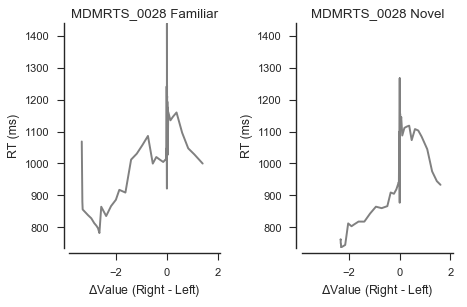

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 1105.02416667
mean RT novel condition: 1014.22644056

median RT in familiar condition: 1122.88500001
median RT novel condition: 1022.05



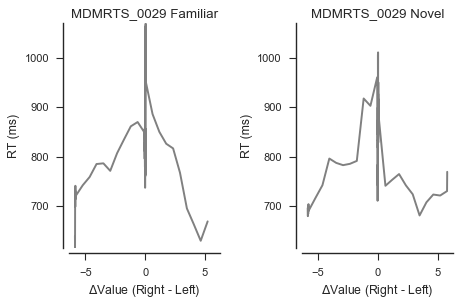

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 832.09329649
mean RT novel condition: 830.211975625

median RT in familiar condition: 825.400000004
median RT novel condition: 836.549999996



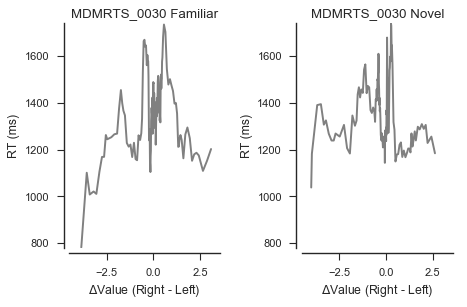

nFamiliarTrials:  140
nNovelTrials:  135

mean RT in familiar condition: 1347.02471655
mean RT novel condition: 1357.33183422

median RT in familiar condition: 1353.1
median RT novel condition: 1324.0



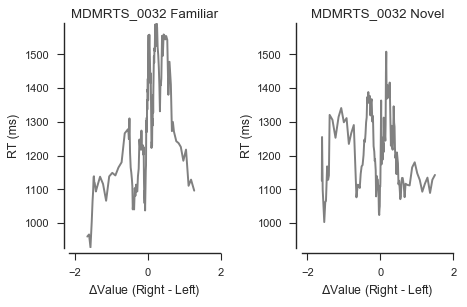

nFamiliarTrials:  139
nNovelTrials:  139

mean RT in familiar condition: 1280.18909958
mean RT novel condition: 1213.92643371

median RT in familiar condition: 1269.5
median RT novel condition: 1204.32



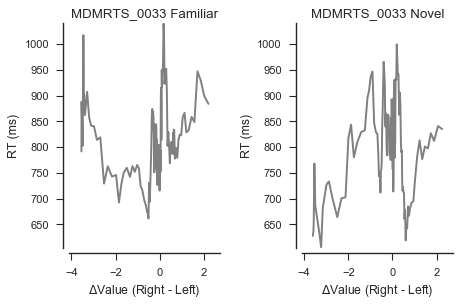

nFamiliarTrials:  131
nNovelTrials:  132

mean RT in familiar condition: 819.309028536
mean RT novel condition: 803.570838447

median RT in familiar condition: 809.180000011
median RT novel condition: 809.975000002



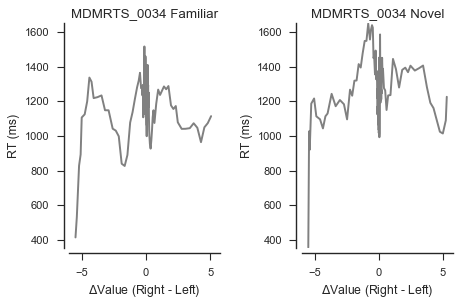

nFamiliarTrials:  134
nNovelTrials:  135

mean RT in familiar condition: 1189.60446281
mean RT novel condition: 1256.89408583

median RT in familiar condition: 1206.65
median RT novel condition: 1235.6



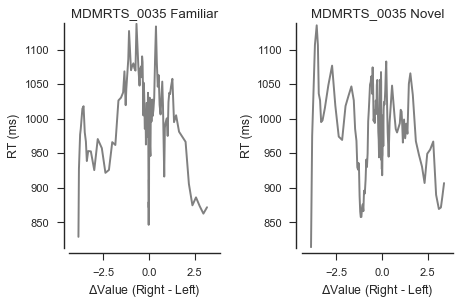

nFamiliarTrials:  137
nNovelTrials:  139

mean RT in familiar condition: 987.976529371
mean RT novel condition: 986.2663926

median RT in familiar condition: 994.9
median RT novel condition: 994.2



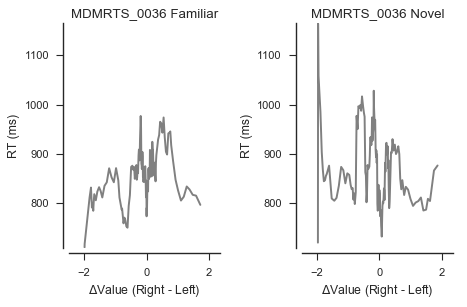

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 855.140793651
mean RT novel condition: 866.433409297

median RT in familiar condition: 856.424999999
median RT novel condition: 855.75722222



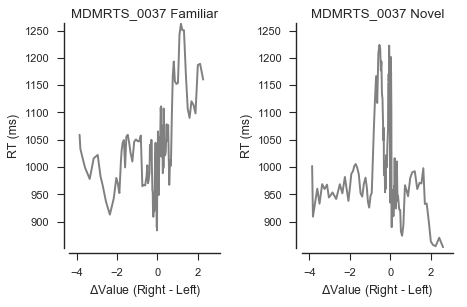

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 1028.3993134
mean RT novel condition: 1009.82360062

median RT in familiar condition: 1022.26
median RT novel condition: 982.869999998



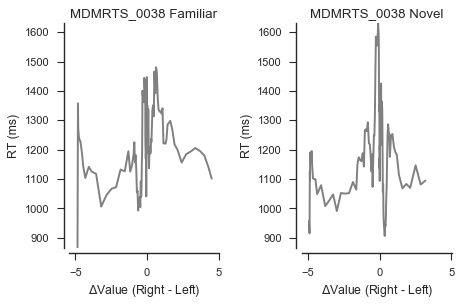

nFamiliarTrials:  132
nNovelTrials:  123

mean RT in familiar condition: 1228.0285558
mean RT novel condition: 1207.05787295

median RT in familiar condition: 1221.53
median RT novel condition: 1189.74



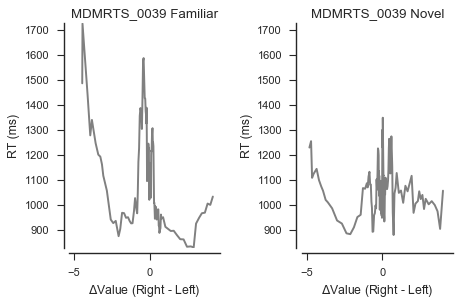

nFamiliarTrials:  137
nNovelTrials:  139

mean RT in familiar condition: 1102.26785714
mean RT novel condition: 1077.14928343

median RT in familiar condition: 1083.6
median RT novel condition: 1066.70000001



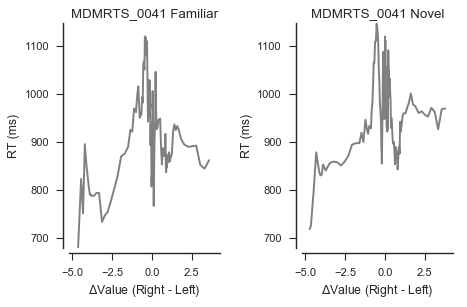

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 910.028200114
mean RT novel condition: 961.941261336

median RT in familiar condition: 916.150000004
median RT novel condition: 959.900000001



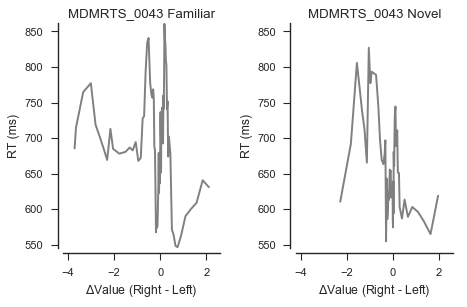

nFamiliarTrials:  78
nNovelTrials:  61

mean RT in familiar condition: 693.682562066
mean RT novel condition: 660.393819946

median RT in familiar condition: 689.949999995
median RT novel condition: 651.440000022



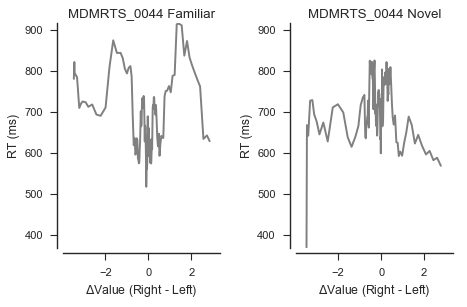

nFamiliarTrials:  131
nNovelTrials:  124

mean RT in familiar condition: 683.474429299
mean RT novel condition: 697.180573155

median RT in familiar condition: 664.85
median RT novel condition: 697.175000001



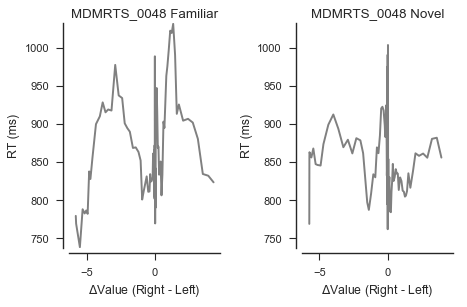

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 860.598139168
mean RT novel condition: 859.737835596

median RT in familiar condition: 849.249999999
median RT novel condition: 855.44999998



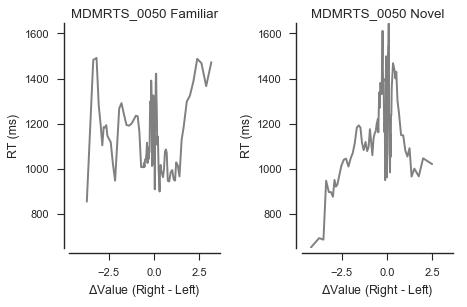

nFamiliarTrials:  135
nNovelTrials:  133

mean RT in familiar condition: 1148.56881158
mean RT novel condition: 1200.40145513

median RT in familiar condition: 1137.49
median RT novel condition: 1187.85



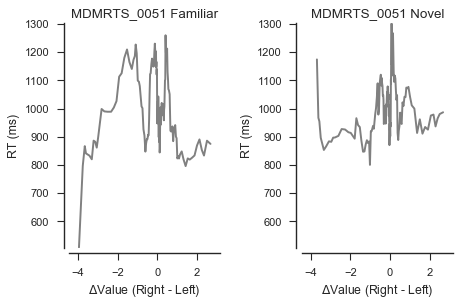

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 993.655017009
mean RT novel condition: 1001.90599972

median RT in familiar condition: 988.545000002
median RT novel condition: 977.100000003



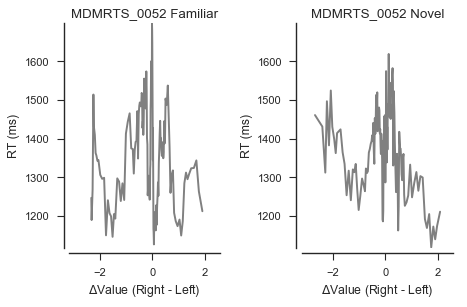

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 1361.6046335
mean RT novel condition: 1373.08263389

median RT in familiar condition: 1356.50125
median RT novel condition: 1382.3



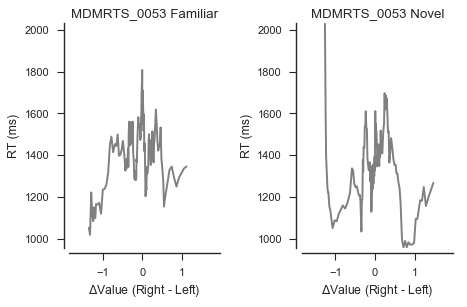

nFamiliarTrials:  139
nNovelTrials:  139

mean RT in familiar condition: 1413.623216
mean RT novel condition: 1329.93209204

median RT in familiar condition: 1414.67
median RT novel condition: 1331.72



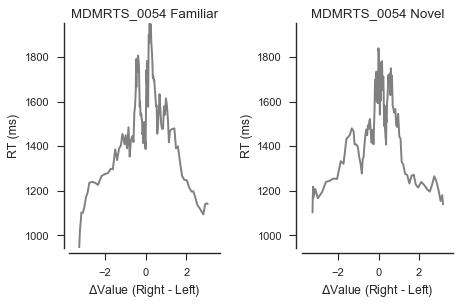

nFamiliarTrials:  139
nNovelTrials:  139

mean RT in familiar condition: 1491.92895969
mean RT novel condition: 1491.35995775

median RT in familiar condition: 1479.2
median RT novel condition: 1494.8



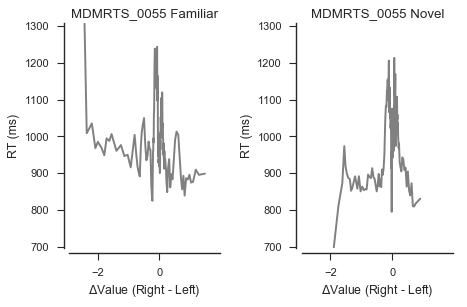

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 991.621588151
mean RT novel condition: 974.622843724

median RT in familiar condition: 971.565000003
median RT novel condition: 964.739999999



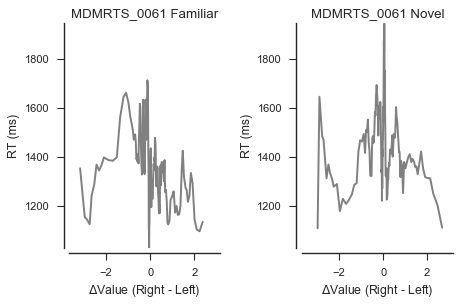

nFamiliarTrials:  137
nNovelTrials:  133

mean RT in familiar condition: 1349.65190389
mean RT novel condition: 1435.44412132

median RT in familiar condition: 1341.23
median RT novel condition: 1419.67



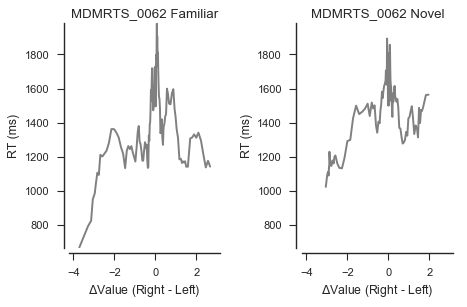

nFamiliarTrials:  138
nNovelTrials:  139

mean RT in familiar condition: 1422.1984866
mean RT novel condition: 1514.66783545

median RT in familiar condition: 1393.53
median RT novel condition: 1544.9



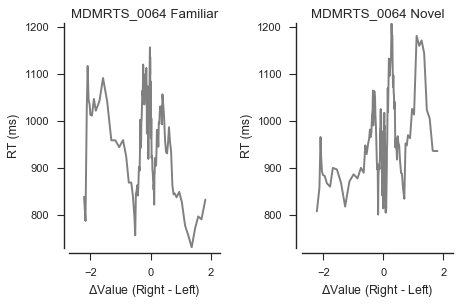

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 966.53979195
mean RT novel condition: 955.998056403

median RT in familiar condition: 975.434999998
median RT novel condition: 947.830000005



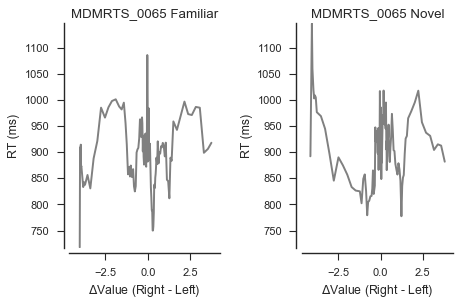

nFamiliarTrials:  132
nNovelTrials:  134

mean RT in familiar condition: 906.721575877
mean RT novel condition: 914.627067045

median RT in familiar condition: 905.750000001
median RT novel condition: 918.400000001



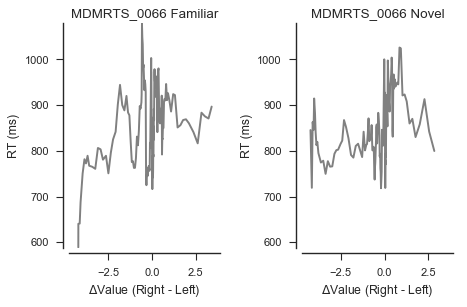

nFamiliarTrials:  140
nNovelTrials:  138

mean RT in familiar condition: 851.461874714
mean RT novel condition: 848.983241318

median RT in familiar condition: 858.429999999
median RT novel condition: 840.885000004



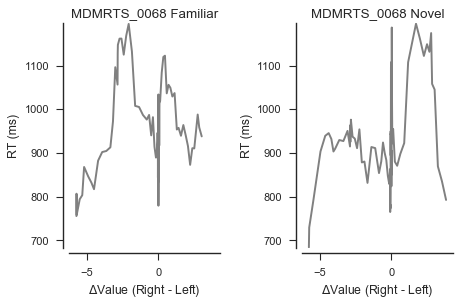

nFamiliarTrials:  139
nNovelTrials:  139

mean RT in familiar condition: 939.511527919
mean RT novel condition: 945.555501313

median RT in familiar condition: 920.759999999
median RT novel condition: 931.949999994



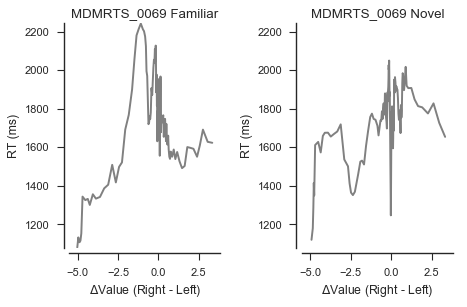

nFamiliarTrials:  136
nNovelTrials:  136

mean RT in familiar condition: 1725.27953811
mean RT novel condition: 1703.68571282

median RT in familiar condition: 1746.26500002
median RT novel condition: 1746.33499999



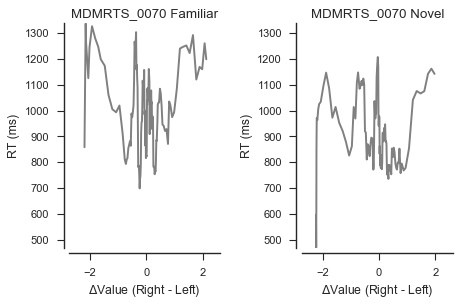

nFamiliarTrials:  129
nNovelTrials:  119

mean RT in familiar condition: 1008.00802295
mean RT novel condition: 905.223565093

median RT in familiar condition: 1016.56
median RT novel condition: 880.31



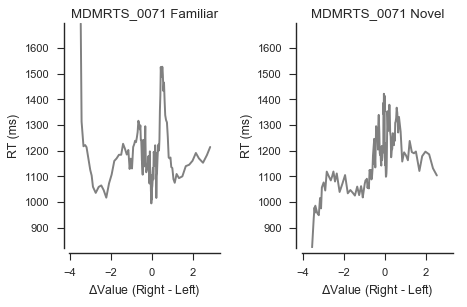

nFamiliarTrials:  138
nNovelTrials:  137

mean RT in familiar condition: 1193.82202697
mean RT novel condition: 1179.25926283

median RT in familiar condition: 1169.85500001
median RT novel condition: 1181.89



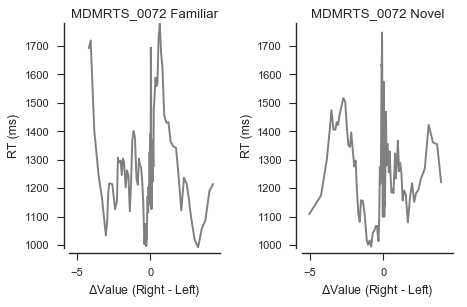

nFamiliarTrials:  139
nNovelTrials:  137

mean RT in familiar condition: 1286.61505966
mean RT novel condition: 1303.70871104

median RT in familiar condition: 1265.08999999
median RT novel condition: 1285.07



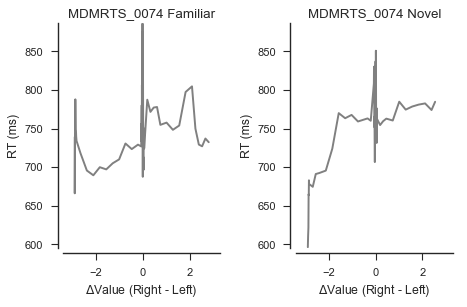

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 770.60050853
mean RT novel condition: 762.315070828

median RT in familiar condition: 764.829166719
median RT novel condition: 765.030000079



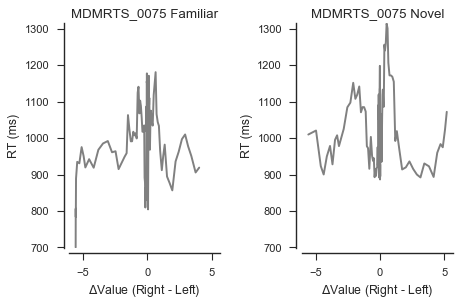

nFamiliarTrials:  138
nNovelTrials:  135

mean RT in familiar condition: 988.497944557
mean RT novel condition: 1021.22531922

median RT in familiar condition: 990.805000003
median RT novel condition: 1007.56666667



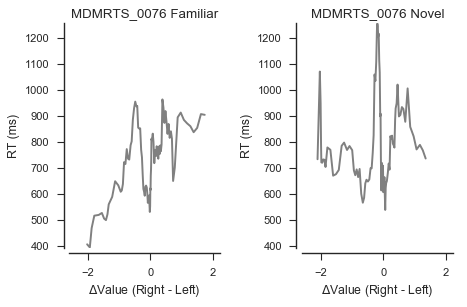

nFamiliarTrials:  90
nNovelTrials:  89

mean RT in familiar condition: 725.954973545
mean RT novel condition: 794.419783307

median RT in familiar condition: 742.65
median RT novel condition: 757.4



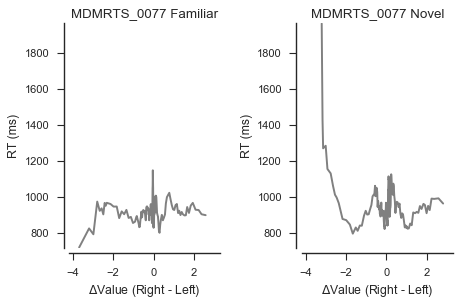

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 921.204848925
mean RT novel condition: 958.631871882

median RT in familiar condition: 913.670000003
median RT novel condition: 929.315000004



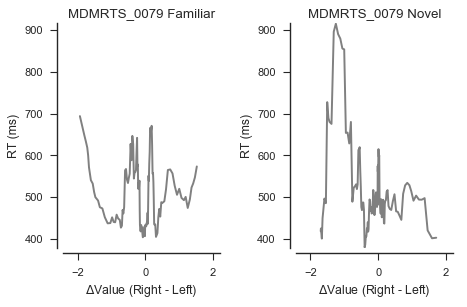

nFamiliarTrials:  121
nNovelTrials:  124

mean RT in familiar condition: 507.409563164
mean RT novel condition: 520.425483231

median RT in familiar condition: 498.6
median RT novel condition: 490.5



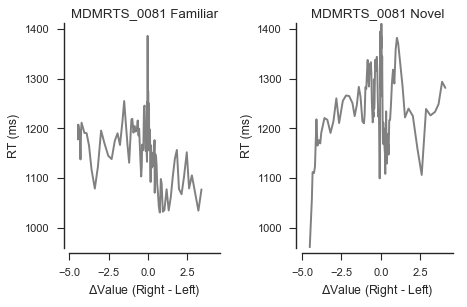

nFamiliarTrials:  134
nNovelTrials:  133

mean RT in familiar condition: 1172.54511934
mean RT novel condition: 1249.12700203

median RT in familiar condition: 1174.855
median RT novel condition: 1247.58



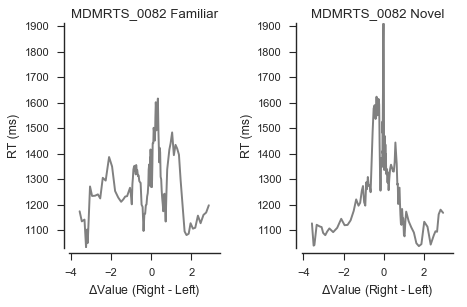

nFamiliarTrials:  139
nNovelTrials:  139

mean RT in familiar condition: 1305.83735669
mean RT novel condition: 1324.75128326

median RT in familiar condition: 1298.9
median RT novel condition: 1320.87



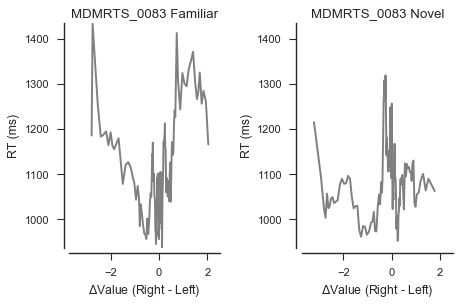

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 1104.52418066
mean RT novel condition: 1100.4531661

median RT in familiar condition: 1079.1
median RT novel condition: 1090.65



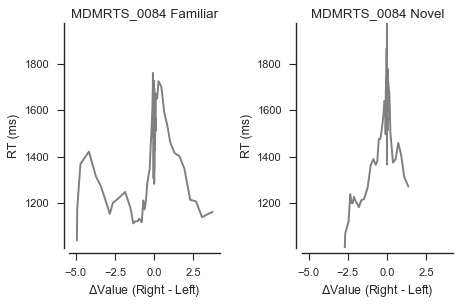

nFamiliarTrials:  135
nNovelTrials:  133

mean RT in familiar condition: 1452.92749559
mean RT novel condition: 1567.79340912

median RT in familiar condition: 1471.4
median RT novel condition: 1589.9



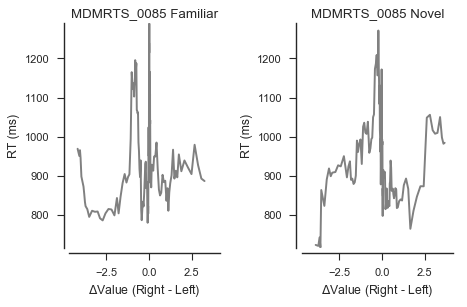

nFamiliarTrials:  138
nNovelTrials:  139

mean RT in familiar condition: 952.714015411
mean RT novel condition: 945.74542937

median RT in familiar condition: 919.099999999
median RT novel condition: 926.700000002



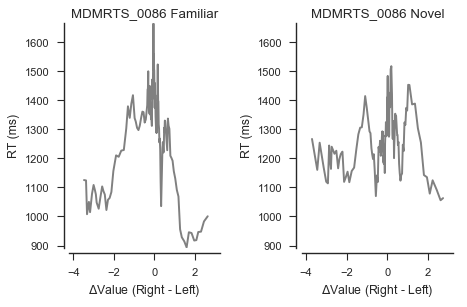

nFamiliarTrials:  138
nNovelTrials:  140

mean RT in familiar condition: 1271.75020445
mean RT novel condition: 1275.94947846

median RT in familiar condition: 1312.40999998
median RT novel condition: 1277.93000002



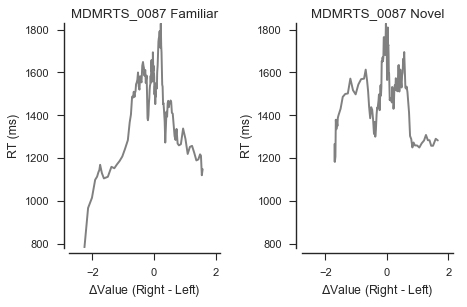

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1455.02992573
mean RT novel condition: 1515.70334439

median RT in familiar condition: 1502.69999999
median RT novel condition: 1517.3



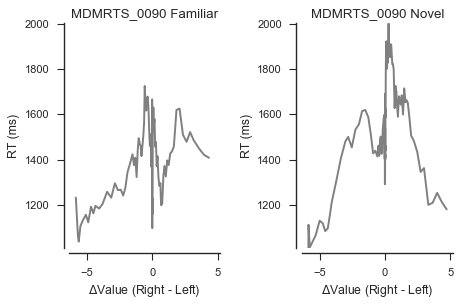

nFamiliarTrials:  136
nNovelTrials:  134

mean RT in familiar condition: 1379.81541696
mean RT novel condition: 1520.48168651

median RT in familiar condition: 1396.33
median RT novel condition: 1524.40999999



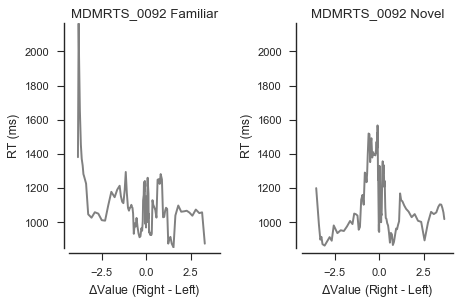

nFamiliarTrials:  132
nNovelTrials:  136

mean RT in familiar condition: 1109.24292118
mean RT novel condition: 1140.84715161

median RT in familiar condition: 1077.16
median RT novel condition: 1098.495



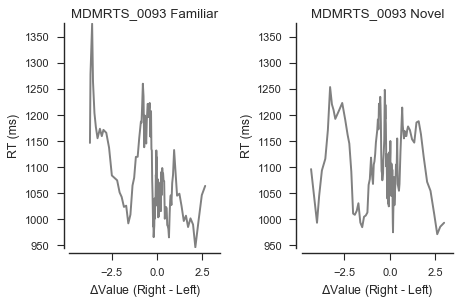

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1082.17436026
mean RT novel condition: 1109.78407653

median RT in familiar condition: 1064.035
median RT novel condition: 1102.065



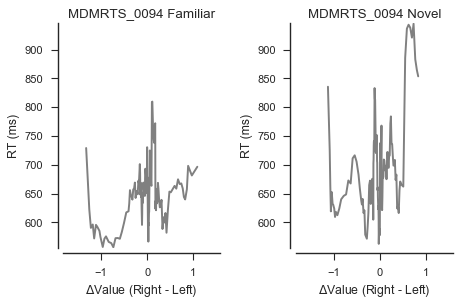

nFamiliarTrials:  136
nNovelTrials:  138

mean RT in familiar condition: 649.986319737
mean RT novel condition: 690.604575568

median RT in familiar condition: 649.255000002
median RT novel condition: 678.285000002



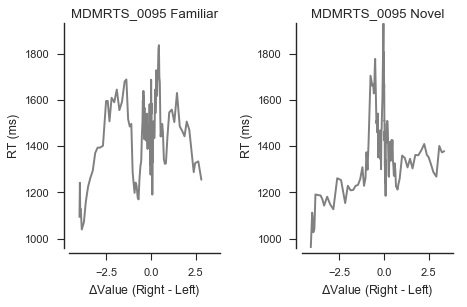

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 1446.16062379
mean RT novel condition: 1406.75622676

median RT in familiar condition: 1464.90999999
median RT novel condition: 1374.71499999



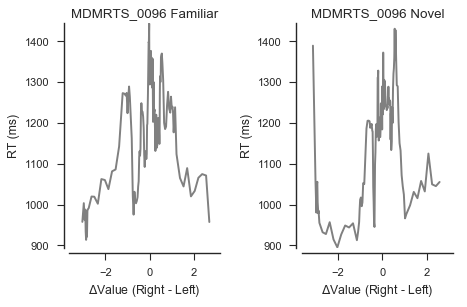

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1185.66762302
mean RT novel condition: 1158.52020096

median RT in familiar condition: 1199.29500001
median RT novel condition: 1189.85499999



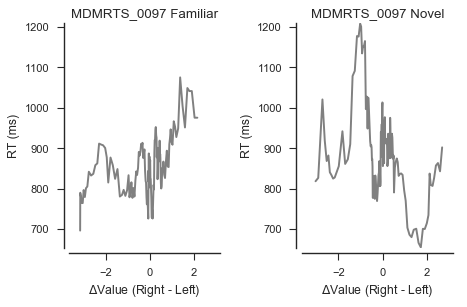

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 852.926233562
mean RT novel condition: 885.694499716

median RT in familiar condition: 845.710000004
median RT novel condition: 874.510000002



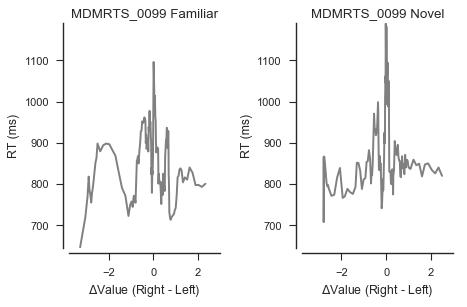

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 856.578452948
mean RT novel condition: 880.407203798

median RT in familiar condition: 850.865
median RT novel condition: 850.945



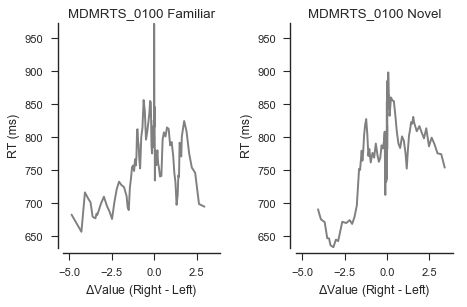

nFamiliarTrials:  139
nNovelTrials:  139

mean RT in familiar condition: 784.191515359
mean RT novel condition: 779.45616935

median RT in familiar condition: 788.8
median RT novel condition: 782.3



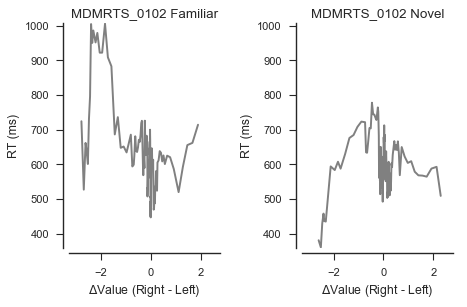

nFamiliarTrials:  127
nNovelTrials:  129

mean RT in familiar condition: 631.640487439
mean RT novel condition: 601.286065891

median RT in familiar condition: 620.829999997
median RT novel condition: 598.649999998



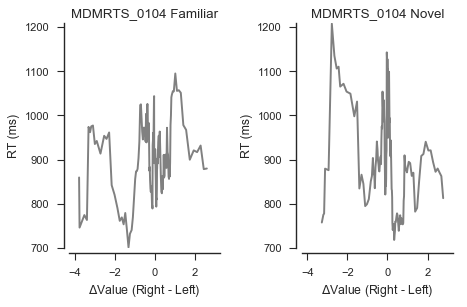

nFamiliarTrials:  139
nNovelTrials:  139

mean RT in familiar condition: 904.033114935
mean RT novel condition: 906.880065089

median RT in familiar condition: 906.450000021
median RT novel condition: 887.030000007



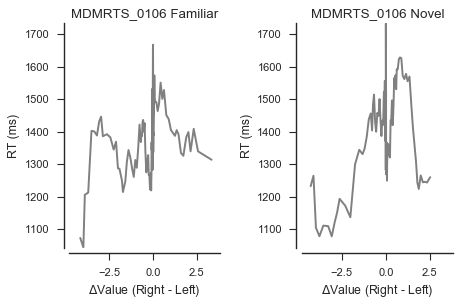

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1404.27288861
mean RT novel condition: 1413.48758702

median RT in familiar condition: 1394.94000002
median RT novel condition: 1432.09



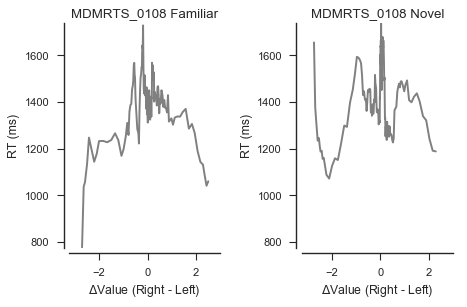

nFamiliarTrials:  137
nNovelTrials:  134

mean RT in familiar condition: 1370.42206784
mean RT novel condition: 1400.96053512

median RT in familiar condition: 1386.85
median RT novel condition: 1399.315



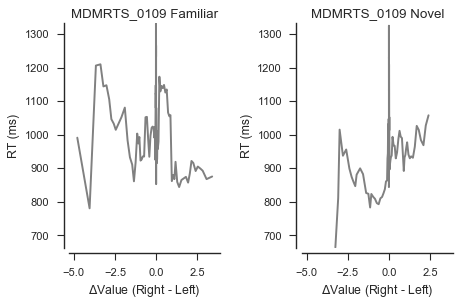

nFamiliarTrials:  140
nNovelTrials:  136

mean RT in familiar condition: 1017.36591837
mean RT novel condition: 1001.41351249

median RT in familiar condition: 1013.10000001
median RT novel condition: 978.349999979



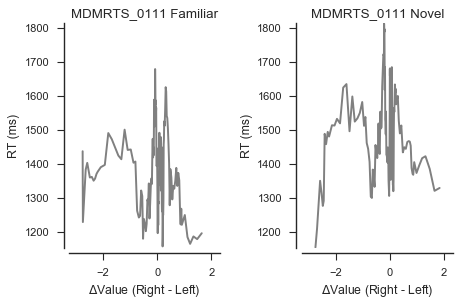

nFamiliarTrials:  138
nNovelTrials:  139

mean RT in familiar condition: 1367.70299632
mean RT novel condition: 1483.79185509

median RT in familiar condition: 1361.05
median RT novel condition: 1467.8



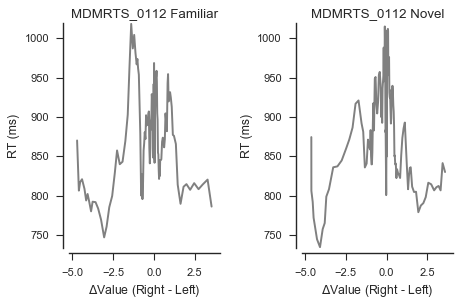

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 875.240471089
mean RT novel condition: 879.75706094

median RT in familiar condition: 874.019999997
median RT novel condition: 880.815



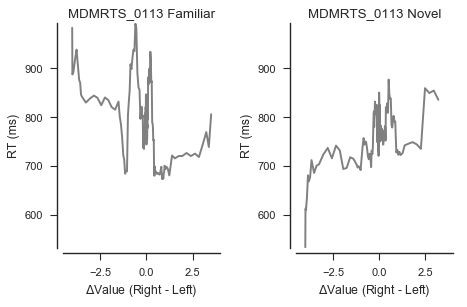

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 792.518926883
mean RT novel condition: 762.120392274

median RT in familiar condition: 792.600000021
median RT novel condition: 765.790000022



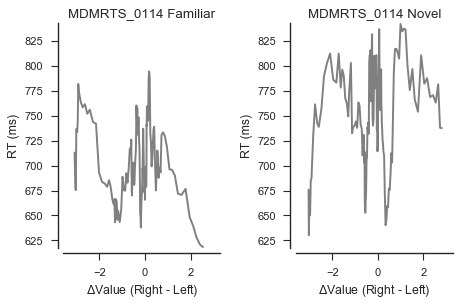

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 702.856727891
mean RT novel condition: 754.145620462

median RT in familiar condition: 696.200000009
median RT novel condition: 760.766249992



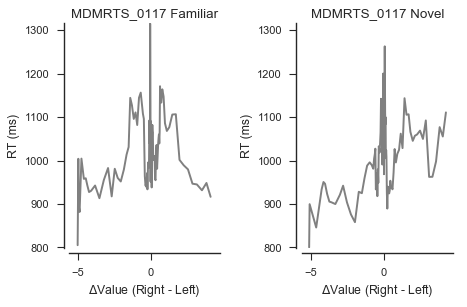

nFamiliarTrials:  137
nNovelTrials:  140

mean RT in familiar condition: 1035.7198992
mean RT novel condition: 1037.9644898

median RT in familiar condition: 1032.7
median RT novel condition: 1039.6



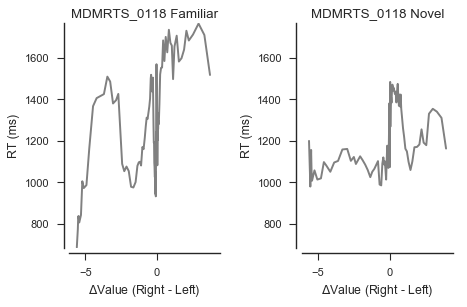

nFamiliarTrials:  138
nNovelTrials:  134

mean RT in familiar condition: 1278.68511876
mean RT novel condition: 1210.11447199

median RT in familiar condition: 1268.76
median RT novel condition: 1166.935



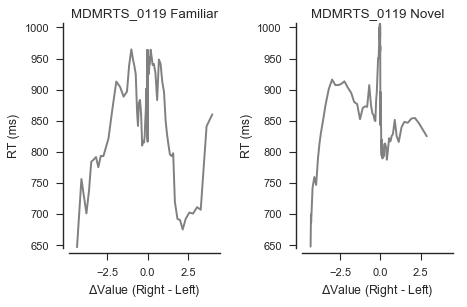

nFamiliarTrials:  116
nNovelTrials:  121

mean RT in familiar condition: 867.004946633
mean RT novel condition: 873.470320082

median RT in familiar condition: 888.549999995
median RT novel condition: 872.500000009



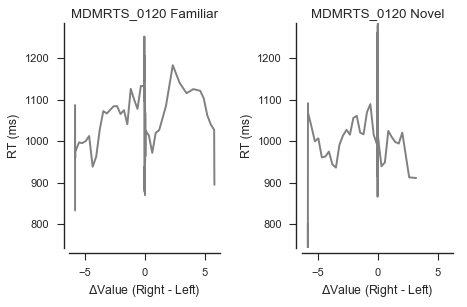

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1016.13475736
mean RT novel condition: 1036.78131483

median RT in familiar condition: 1002.75389152
median RT novel condition: 1021.87067815



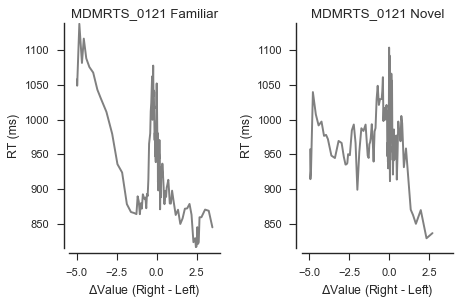

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 940.685096373
mean RT novel condition: 978.755008221

median RT in familiar condition: 926.755000001
median RT novel condition: 972.600000005



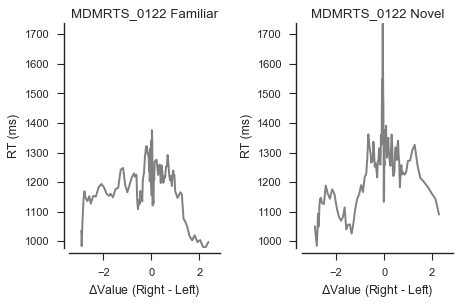

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1201.96236706
mean RT novel condition: 1271.84987982

median RT in familiar condition: 1214.7
median RT novel condition: 1266.12499999



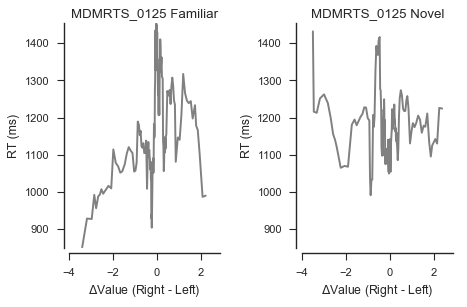

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1167.64637755
mean RT novel condition: 1167.85092687

median RT in familiar condition: 1145.0
median RT novel condition: 1165.6



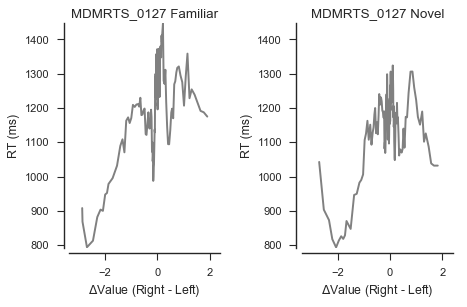

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1201.82463861
mean RT novel condition: 1142.44740788

median RT in familiar condition: 1216.15499999
median RT novel condition: 1167.27000001



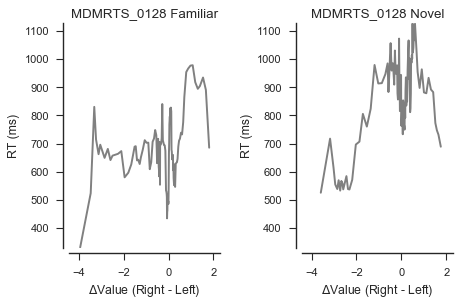

nFamiliarTrials:  117
nNovelTrials:  104

mean RT in familiar condition: 670.025876072
mean RT novel condition: 858.71100387

median RT in familiar condition: 663.609999977
median RT novel condition: 884.32



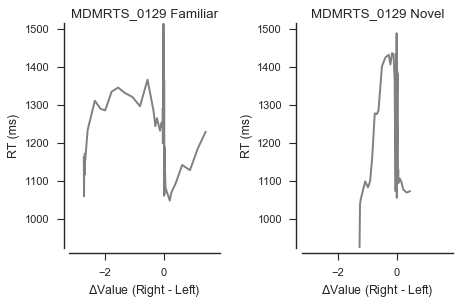

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 1246.44030357
mean RT novel condition: 1248.01862082

median RT in familiar condition: 1249.24999999
median RT novel condition: 1251.71000002



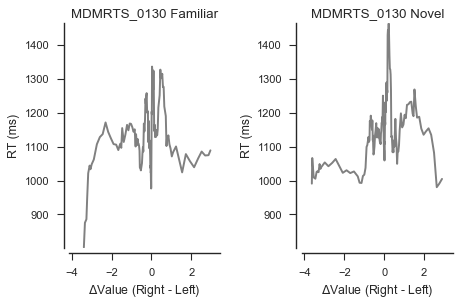

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1132.06782596
mean RT novel condition: 1143.98958617

median RT in familiar condition: 1121.8
median RT novel condition: 1134.1



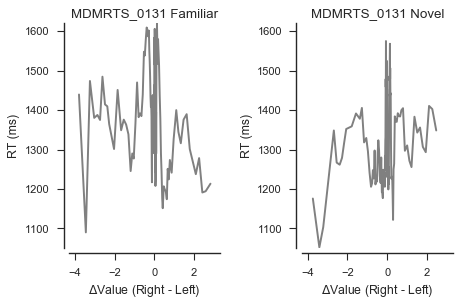

nFamiliarTrials:  139
nNovelTrials:  136

mean RT in familiar condition: 1382.95250914
mean RT novel condition: 1321.89741772

median RT in familiar condition: 1381.04000001
median RT novel condition: 1311.635



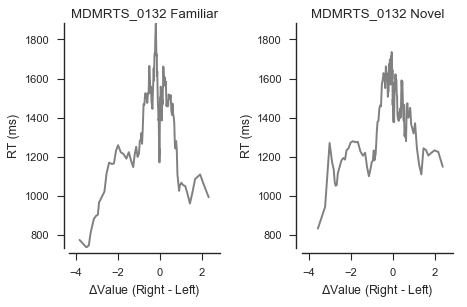

nFamiliarTrials:  139
nNovelTrials:  139

mean RT in familiar condition: 1364.93050988
mean RT novel condition: 1412.12369818

median RT in familiar condition: 1441.6
median RT novel condition: 1412.5



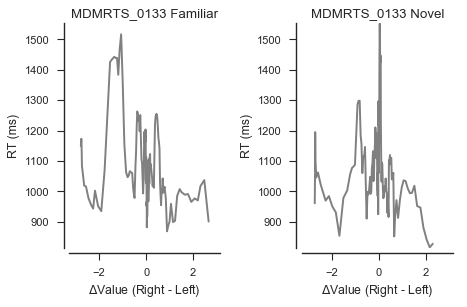

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 1084.80361454
mean RT novel condition: 1093.31132186

median RT in familiar condition: 1055.02625
median RT novel condition: 1061.0705



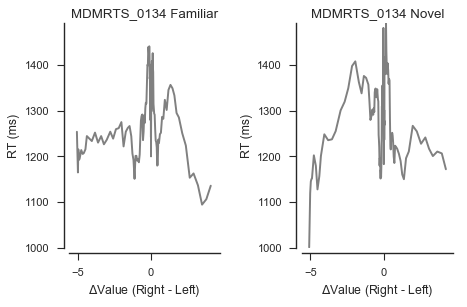

nFamiliarTrials:  137
nNovelTrials:  139

mean RT in familiar condition: 1286.49408527
mean RT novel condition: 1286.41104545

median RT in familiar condition: 1279.89999999
median RT novel condition: 1286.20000001



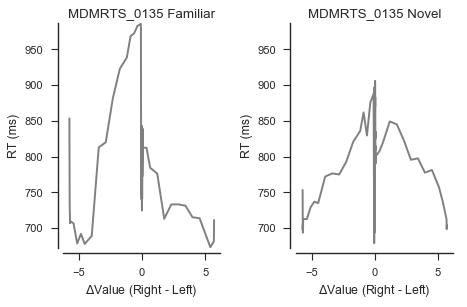

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 790.737814059
mean RT novel condition: 790.901842403

median RT in familiar condition: 789.370000001
median RT novel condition: 793.324999999



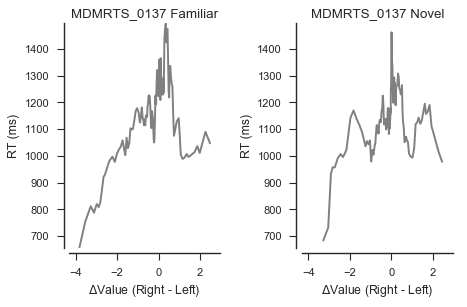

nFamiliarTrials:  136
nNovelTrials:  130

mean RT in familiar condition: 1169.5877982
mean RT novel condition: 1142.65603571

median RT in familiar condition: 1180.23
median RT novel condition: 1134.145



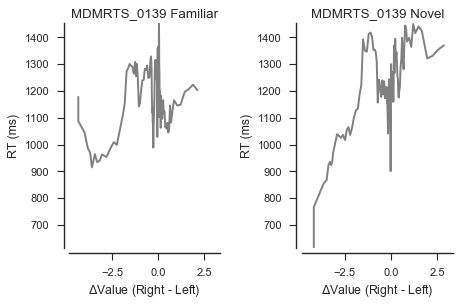

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 1187.64054471
mean RT novel condition: 1198.28807823

median RT in familiar condition: 1194.4
median RT novel condition: 1215.3



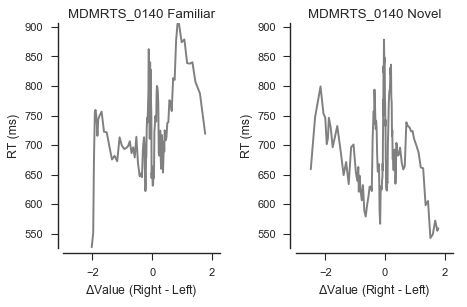

nFamiliarTrials:  126
nNovelTrials:  127

mean RT in familiar condition: 726.454069523
mean RT novel condition: 693.895365282

median RT in familiar condition: 716.232305556
median RT novel condition: 687.6915



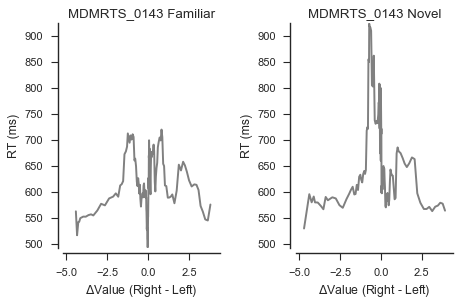

nFamiliarTrials:  139
nNovelTrials:  136

mean RT in familiar condition: 615.057936508
mean RT novel condition: 663.061344538

median RT in familiar condition: 610.799999999
median RT novel condition: 635.600000002



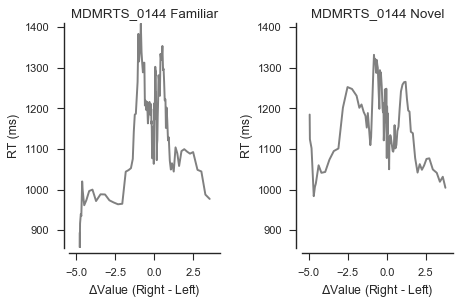

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 1145.7606644
mean RT novel condition: 1164.90898186

median RT in familiar condition: 1146.285
median RT novel condition: 1170.65499999



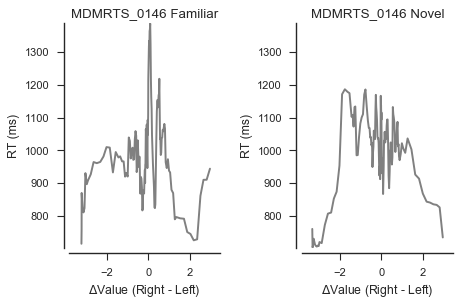

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 992.606364512
mean RT novel condition: 994.401164116

median RT in familiar condition: 979.475
median RT novel condition: 1019.625



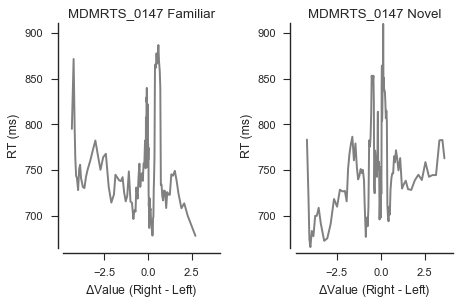

nFamiliarTrials:  137
nNovelTrials:  138

mean RT in familiar condition: 750.448610243
mean RT novel condition: 753.79975241

median RT in familiar condition: 742.15
median RT novel condition: 744.814999992



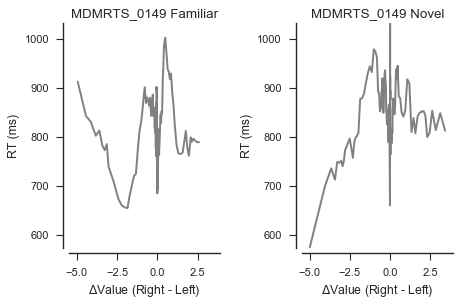

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 802.775660906
mean RT novel condition: 833.747863664

median RT in familiar condition: 791.290000011
median RT novel condition: 840.760000021



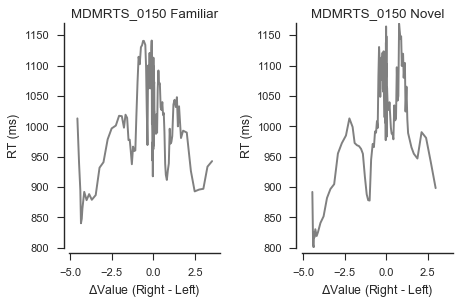

nFamiliarTrials:  139
nNovelTrials:  140

mean RT in familiar condition: 1008.14067603
mean RT novel condition: 1021.28530045

median RT in familiar condition: 1006.99999999
median RT novel condition: 1027.70000001



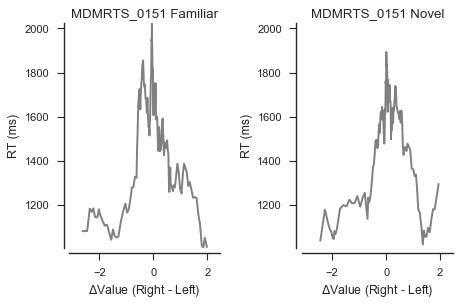

nFamiliarTrials:  140
nNovelTrials:  137

mean RT in familiar condition: 1455.40028912
mean RT novel condition: 1474.39829394

median RT in familiar condition: 1457.145
median RT novel condition: 1538.6



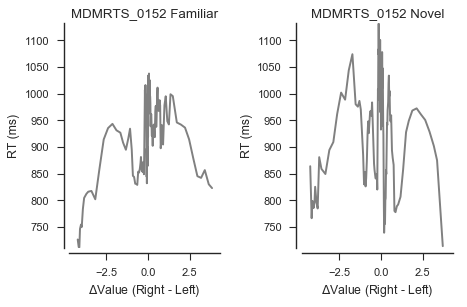

nFamiliarTrials:  140
nNovelTrials:  140

mean RT in familiar condition: 915.548133787
mean RT novel condition: 934.311739513

median RT in familiar condition: 921.775
median RT novel condition: 949.965



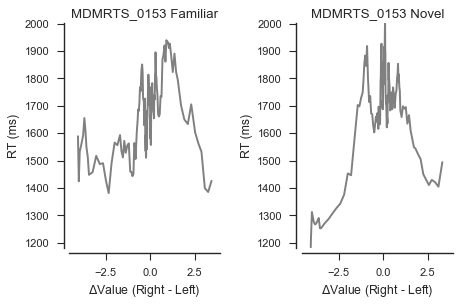

nFamiliarTrials:  140
nNovelTrials:  139

mean RT in familiar condition: 1664.06519841
mean RT novel condition: 1674.52012961

median RT in familiar condition: 1667.85
median RT novel condition: 1698.5



In [62]:
get_rt_plots_by_familiarity(zscoreRatings=True, printFigs=True)

In [10]:
def get_mean_rt_barplot_by_familiarity(zscoreRatings):
    subjects = get_subjects_w_full_data()
    n = len(subjects)
    pvals = []
    df = pd.DataFrame()
    
    rtLowerInFamiliarCondition = 0
    
    for subject in subjects:
        sub_fam_df, sub_nov_df = get_subject_rt_by_familiarity(subject, zscoreRatings, printFigs=False)
        
        fam = sub_fam_df['RT'].values
        nov = sub_nov_df['RT'].values
        
        if sub_fam_df.mean(axis=0)['RT'] < sub_nov_df.mean(axis=0)['RT']:
            rtLowerInFamiliarCondition += 1
        
        subjectN = int(subject[-4:])
        d = pd.DataFrame.from_dict(data={"Subject": subjectN, "Scene Condition":"familiar", "RT (ms)":fam})
        df = pd.concat([df, d])
        d = pd.DataFrame.from_dict(data={"Subject": subjectN, "Scene Condition":"novel", "RT (ms)":nov})
        df = pd.concat([df, d])
    
    rtLowerInFamiliarCondition = float(rtLowerInFamiliarCondition)/n
    print "RT was lower in the familiar condition for", rtLowerInFamiliarCondition*100, "% of subjects"
    """
    plt.rcParams['figure.dpi'] = 100
    fig = plt.figure()
    ax = sns.barplot(x="Subject", y="RT (ms)", hue="Scene Condition", data=df, ci="sd", errwidth=1.5)
    ax.set_title('Mean RT in Food Choice Task')
    plt.show()
    """

In [14]:
get_mean_rt_barplot_by_familiarity(zscoreRatings=True)

total number of people who accepted the HIT 153
106 subjects completed the auction and choice tasks.
RT was lower in the familiar condition for 60.3773584906 % of subjects


In [7]:
def getfoodsubdf(subjectId, zscoreRatings):
    subjectFolder = _dataDir + subjectId + '/'

    auctionFile = subjectFolder + subjectId + auctionFileEnd
    choiceFile = subjectFolder + subjectId + choiceFileEnd

    if os.path.exists(choiceFile):
        df = pd.read_csv(choiceFile)
        
        rightStimRatings = df["stimulus2Bid"]
        leftStimRatings = df["stimulus1Bid"]
        
        if zscoreRatings:
            mean, std = get_ratings_mean_and_std(subjectId)
            df["stimulus2Bid"] = (rightStimRatings - mean) / std
            df["stimulus1Bid"] = (leftStimRatings - mean) / std
            df["delta"] = df["stimulus2Bid"] - df["stimulus1Bid"]

        df = df.loc[(df["receivedResponse"] == True) & (df["rt"] > 300)]
        
        choices = df['selected'] == df['stimulus2']
        subdf = df[['subjectId','delta','stimulus1','stimulus2','stimulus1Bid','stimulus2Bid','rt','sceneStimulusStatus']]
        subdf.columns = ['subjid','deltaval','ImageLeft','ImageRight','bidLeft','bidRight','RT','sceneStimulusStatus']

        subdf.loc[:,'choseright'] = choices
        
        return subdf

def getfoodcsv(zscoreRatings):
    df_sig_pval = get_p_logistic_plots(zscoreRatings=False, printFigs=False)
    subjects = df_sig_pval['subjectId'].values
    outputDir = _thisDir + '/output/'
    food = pd.DataFrame()
    for i in range(0,len(subjects)):
        subject = subjects[i]
        df = getfoodsubdf(subject, zscoreRatings)
        food = pd.concat([food, df])
    food.reset_index(inplace=True, drop=True)
    if not os.path.exists(_thisDir + '/output'):
        os.mkdir(_thisDir + '/output/')
    if zscoreRatings:
        food.to_csv(_thisDir + '/output/food_zscoredratings.csv')
    else:
        food.to_csv(_thisDir + '/output/food.csv')

In [71]:
getfoodcsv(zscoreRatings=True)
getfoodcsv(zscoreRatings=False)

total number of people who accepted the HIT 153
106 subjects completed the auction and choice tasks.
Of 106 subjects, 102 subjects had significant p values for the logistic regression.
total number of people who accepted the HIT 153
106 subjects completed the auction and choice tasks.
Of 106 subjects, 102 subjects had significant p values for the logistic regression.


In [22]:
def getRunningMeanData(data):
    df=pd.DataFrame(data,columns=['stim_strength','rt','ci','subj','deltaval'])  
    df['ci']=df['ci'].astype('bool')
    df['rt']=df['rt'].astype('float64')
    
    dfsorted=df.sort_values('deltaval', ascending=True)
    
    #running mean of choices
    meanprop = pd.Series.rolling(dfsorted['ci'],100,min_periods=1).mean()

    #chose right or chose left
    cr=dfsorted[dfsorted['ci']==1]
    cl=dfsorted[dfsorted['ci']==0]
    
    #running mean of rt
    meanrt_lo = pd.Series.rolling(cl['rt'],50,min_periods=1).mean()
    meanrt_up = pd.Series.rolling(cr['rt'],50,min_periods=1).mean()
    meanrt_both = pd.Series.rolling(dfsorted['rt'],100,min_periods=1).mean()
    return dfsorted, meanprop, meanrt_both

In [9]:
def plotFoodDataRunningMean(fam_data, nov_data):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 3) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    Returns
    -------

    """

    plt.rcParams['figure.dpi'] = 90
    fig = plt.figure()

    fam_dfsorted, fam_meanprop, fam_meanrt_both = getRunningMeanData(fam_data)
    nov_dfsorted, nov_meanprop, nov_meanrt_both = getRunningMeanData(nov_data)
    
    ax_choice = fig.add_subplot(1, 2, 1)
    ax_choice.add_line(
        plt.Line2D(fam_dfsorted['deltaval'], fam_meanprop, color='xkcd:pale red'))
    ax_choice.add_line(
        plt.Line2D(nov_dfsorted['deltaval'], nov_meanprop, color='xkcd:denim blue'))

    ax_choice.set_xlim((-6, 6))
    ax_choice.set_ylim((-0.01, 1.01))
    ax_choice.set_xlabel('DeltaValue (Right - Left)')
    ax_choice.set_ylabel('P(respond Right)')
    plt.title('Choices')

    ax_rt = fig.add_subplot(1, 2, 2)
    ax_rt.add_line(
        plt.Line2D(fam_dfsorted['deltaval'], fam_meanrt_both, color='xkcd:pale red', label='familiar'))
    ax_rt.add_line(
        plt.Line2D(nov_dfsorted['deltaval'], nov_meanrt_both, color='xkcd:denim blue', label='novel'))
  
    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Reaction time (ms) preceded by scenes')
    plt.title('RT')
    
    ax_rt.set_xlim((-6, 6))
    ax_rt.set_ylim(600, 1350)
    
    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Mean reaction times (ms)')
    
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    sns.despine(offset=5, trim=True)
    plt.tight_layout()
    plt.show()


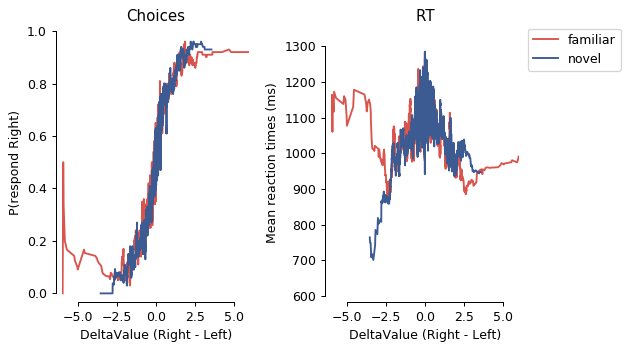

In [43]:
# Plot food data for familiar scenes
food=pd.read_csv(_thisDir + '/output/food_zscoredratings.csv')
food['deltavalrnd']=food['deltaval'].round(1)
food = food.loc[food['sceneStimulusStatus'] == 'familiar']
datafood=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright']])
fam_datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['deltaval']])

# Plot food data for novel scenes
food=pd.read_csv(_thisDir + '/output/food_zscoredratings.csv')
food['deltavalrnd']=food['deltaval'].round(1)
food = food.loc[food['sceneStimulusStatus'] == 'novel']
datafood=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright']])
nov_datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['deltaval']])
plotFoodDataRunningMean(fam_datafoodplot, nov_datafoodplot)

In [76]:
def binFoodData():
    zscoreRatings = True
    printFigs = False
    df_sig_pval = get_p_logistic_plots(zscoreRatings=False, printFigs=False)
    subjects = df_sig_pval['subjectId'].values

    fam_df = pd.DataFrame()
    nov_df = pd.DataFrame()

    for subject in subjects:
        sub_df_fam, sub_df_nov, pval = get_subject_p_logistic_by_familiarity(subject, zscoreRatings, printFigs)
        sub_df_fam.columns = ['ChoseRight','RT','Delta']
        sub_df_nov.columns = ['ChoseRight','RT','Delta']
        """
        sub_rt_df_fam, sub_rt_df_nov = get_subject_rt_by_familiarity(subject, zscoreRatings, printFigs)["RT"]/1000
        sub_df_fam = pd.concat([sub_df_fam,sub_rt_df_fam], axis = 1)
        sub_df_nov = pd.concat([sub_df_nov,sub_rt_df_nov], axis = 1)
        """
        sub_df_fam['SubjectID'] = subject
        sub_df_nov['SubjectID'] = subject

        # bin delta values
        for i in range(0,2):
            if i == 0:
                sub_df = sub_df_fam
                df = fam_df
            else:
                sub_df = sub_df_nov
                df = nov_df
            sub_food = sub_df
            deltabins = pd.qcut(sub_food['Delta'], 14, duplicates = 'drop')
            sub_food = sub_food.set_index(deltabins)
            sub_food['DeltaRnd'] = sub_food['Delta']
            j = 0
            for interval in deltabins.unique():
                foodbin = sub_food.loc[interval]['DeltaRnd']
                foodbinmean = foodbin.mean()
                sub_food.loc[interval, 'DeltaRnd'] = foodbinmean
                sub_food.loc[interval, 'BinN'] = j
                j+=1
            sub_df = sub_food.reset_index(drop=True)
            sub_df.columns = ['choseright', 'RT', 'deltaval', 'subjid', 'deltavalrnd', 'binN']
            df = pd.concat([df,sub_df], axis = 0)
            df.columns = ['choseright', 'RT', 'deltaval', 'subjid', 'deltavalrnd', 'binN']
            if i == 0:
                sub_df_fam = sub_df
                fam_df = df
            else:
                sub_df_nov = sub_df
                nov_df = df

    return fam_df, nov_df

In [95]:
def sortedFunc(x, y, func):
    unique_y = np.sort(np.unique(y))
    ny = len(unique_y)

    out_x = np.empty(ny)
    counts_y = np.empty(ny)
    for i, j in zip(range(ny), unique_y):
        out_x[i] = getattr(np, func)(np.array(x)[np.array(y) == j])
        counts_y[i] = np.sum(np.array(y) == j)

    return(np.column_stack([unique_y, out_x, counts_y]))

In [96]:
def getBinnedDataForPlotting(data):
    stim_strengths, rt, ci, subj, binN = data[:, 0], data[:, 1], data[:, 2], data[:, 3], data[:,4]
    
    ustim_strengths = np.unique(stim_strengths)
    meanprop = sortedFunc(ci, binN, 'mean')[:, 1]
    
    df=pd.DataFrame(data,columns=['stim_strength','rt','ci','subj','binN'])  
    df['ci']=df['ci'].astype('bool')
    df['rt']=df['rt'].astype('float64')
    df['stim_strength']=df['stim_strength'].astype('float64')
    
    bin_numbers = df['binN'].unique()
    binvalues=df.groupby('binN',as_index=False).median()['stim_strength']
    
    smean = df.groupby(['subj','binN'],as_index=False).mean()
    semprop = smean.groupby('binN').sem()['ci']
    
    #chose right or chose left
    cr=df[df['ci']==1]
    cl=df[df['ci']==0]
    
    #means per participant per stim_strenght
    scrmeans=cr.groupby(['subj','binN'],as_index=False).mean()
    sclmeans=cl.groupby(['subj','binN'],as_index=False).mean()
    bothmeans=df.groupby(['subj','binN'],as_index=False).mean()
    del sclmeans['ci'] 
    del scrmeans['ci'] 
    del bothmeans['ci']     
    
    meanrt_lo=cl.groupby(['binN'],as_index=False).mean()['rt']
    meanrt_up=cr.groupby(['binN'],as_index=False).mean()['rt']
    meanrt_both=df.groupby(['binN'],as_index=False).mean()['rt']
    
    semrt_lo=sclmeans.groupby('binN').sem()['rt']
    semrt_up=scrmeans.groupby('binN').sem()['rt']
    semrt_both=df.groupby('binN').sem()['rt']
    
    return bin_numbers, meanprop, semprop, meanrt_both, semrt_both, binvalues

In [185]:
def plotFoodData(fam_data, nov_data):
    """
    Plot raw behavioral data 

    Parameters
    ----------
    data : 2D array of shape (N, 4) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    Returns
    -------

    """

    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors

    fig = plt.figure()
    
    ax_choice = fig.add_subplot(1, 2, 1)
    plt.title('Choices')
    #ax_choice.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_choice.set_ylim((-0.01, 1.01))
    ax_choice.set_xlabel('DeltaValue (Right - Left)')
    ax_choice.set_ylabel('P(respond Right)')

    ax_rt = fig.add_subplot(1, 2, 2)
    plt.title('RT')

    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Reaction time (ms)')

    bin_numbers, meanprop, semprop, meanrt_both, semrt_both, binvalues = getBinnedDataForPlotting(fam_data)
    ax_choice.errorbar(binvalues, meanprop, yerr=semprop, color='xkcd:pale red',
                       linestyle='None', capsize=0, marker='o',label="familiar")
    ax_rt.errorbar(binvalues, meanrt_both, yerr=semrt_both,
                   color='xkcd:pale red', linestyle='None', marker='o', capsize=0, label="familiar")
    
    bin_numbers, meanprop, semprop, meanrt_both, semrt_both, binvalues = getBinnedDataForPlotting(nov_data)
    ax_choice.errorbar(binvalues, meanprop, yerr=semprop, color='xkcd:denim blue',
                       linestyle='None', capsize=0, marker='o',label="novel")
    ax_rt.errorbar(binvalues, meanrt_both, yerr=semrt_both,
                   color='xkcd:denim blue', linestyle='None', marker='o', capsize=0, label="novel")
    
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    sns.despine(offset=5, trim=True)
    plt.tight_layout()
    plt.show()

In [132]:
def getDataFoodPlot(food):
    food['deltavalrnd']=food['deltavalrnd'].round(1)
    datafood=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright']])
    datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['binN']])
    return datafoodplot

In [133]:
[fam_food,nov_food]=binFoodData()

total number of people who accepted the HIT 153
106 subjects completed the auction and choice tasks.
Of 106 subjects, 102 subjects had significant p values for the logistic regression.


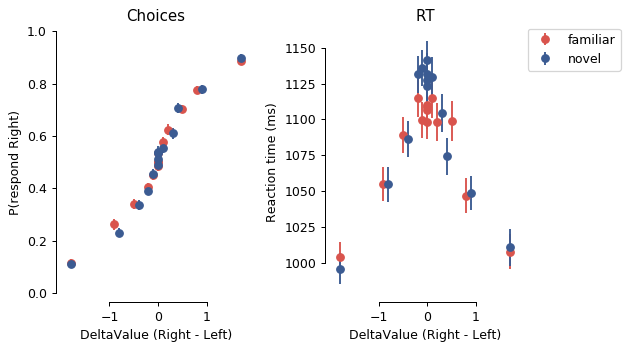

In [186]:
fam_foodplot = getDataFoodPlot(fam_food)
nov_foodplot = getDataFoodPlot(nov_food)

plotFoodData(fam_foodplot,nov_foodplot)

In [3]:
food=pd.read_csv(_thisDir + '/output/food.csv')
food=food.assign(absdeltaval=food['deltaval'].abs())

In [15]:
%%R -i food
food=read_table('food.csv',header=T,sep=',')
food$absdeltaval=abs(food$deltaval)
## compare the model using python's statsmodels to R's lme4
foodrtmod=lmer(RT ~ absdeltaval * sceneStimulusStatus + (1|subjid), data=food)
save(foodrtmod,file='foodrtmod.RData')
print(summary(foodrtmod))
sjp.int(foodrtmod,type='eff',show.ci=T)




Error in read_table("food.csv", header = T, sep = ",") : 
  unused arguments (header = T, sep = ",")


/Users/alicexue/anaconda2/lib/python2.7/site-packages/rpy2/rinterface/__init__.py:186: RRuntimeWarning: Error in read_table("food.csv", header = T, sep = ",") : 
  unused arguments (header = T, sep = ",")

  warnings.warn(x, RRuntimeWarning)


## Main Figures
<a id='main_figures'></a>

Linear mixed model fit by REML ['lmerMod']
Formula: RT ~ absdeltaval * sceneStimulusStatus + (1 | subjid)
   Data: food

REML criterion at convergence: 399892.5

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.4960 -0.6270 -0.1559  0.4353  6.2820 

Random effects:
 Groups   Name        Variance Std.Dev.
 subjid   (Intercept)  63401   251.8   
 Residual             103737   322.1   
Number of obs: 27760, groups:  subjid, 102

Fixed effects:
                                     Estimate Std. Error t value
(Intercept)                          1113.181     25.165   44.23
absdeltaval                           -59.625      4.036  -14.77
sceneStimulusStatusnovel               18.661      4.867    3.83
absdeltaval:sceneStimulusStatusnovel  -17.277      5.880   -2.94

Correlation of Fixed Effects:
            (Intr) absdlt scnStS
absdeltaval -0.082              
scnStmlsStt -0.095  0.423       
absdltvl:SS  0.056 -0.686 -0.607
Generalized linear mixed model fit by maximum likelih

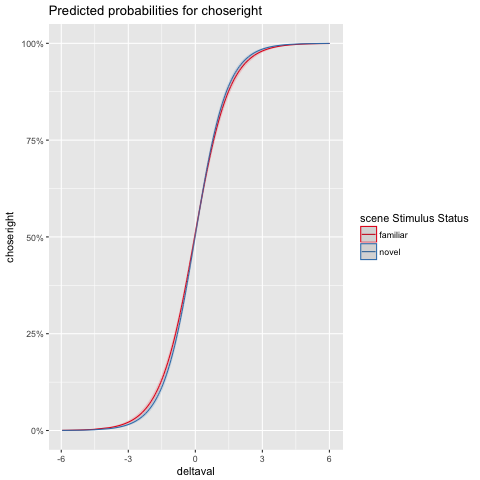

In [9]:
%%R 
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/food_zscoredratings.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
food$absdeltaval=abs(food$deltaval)

foodchmod=glmer(choseright ~ deltaval * sceneStimulusStatus + (1|subjid), family='binomial', data=food)
print(summary(foodchmod))
plot_model(foodchmod,type='eff',show.ci=T, show.values=T,p.kr=FALSE, terms=c('deltaval','sceneStimulusStatus'))



Linear mixed model fit by REML ['lmerMod']
Formula: RT ~ absdeltaval * sceneStimulusStatus + (1 | subjid)
   Data: food

REML criterion at convergence: 399892.5

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.4960 -0.6270 -0.1559  0.4353  6.2820 

Random effects:
 Groups   Name        Variance Std.Dev.
 subjid   (Intercept)  63401   251.8   
 Residual             103737   322.1   
Number of obs: 27760, groups:  subjid, 102

Fixed effects:
                                     Estimate Std. Error t value
(Intercept)                          1113.181     25.165   44.23
absdeltaval                           -59.625      4.036  -14.77
sceneStimulusStatusnovel               18.661      4.867    3.83
absdeltaval:sceneStimulusStatusnovel  -17.277      5.880   -2.94

Correlation of Fixed Effects:
            (Intr) absdlt scnStS
absdeltaval -0.082              
scnStmlsStt -0.095  0.423       
absdltvl:SS  0.056 -0.686 -0.607


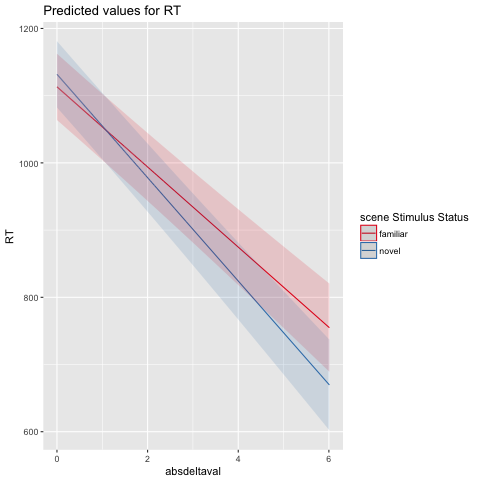

In [11]:
%%R 
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/food_zscoredratings.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
food$absdeltaval=abs(food$deltaval)

foodrtmod=lmer(RT ~ absdeltaval * sceneStimulusStatus + (1|subjid), data=food)
print(summary(foodrtmod))
plot_model(foodrtmod,type='eff',show.ci=T, show.values=T,p.kr=FALSE,terms=c('absdeltaval','sceneStimulusStatus'))


In [5]:
food=pd.read_csv(_thisDir + '/output/food_zscoredratings.csv')
# RT mixed effects linear model
food=food.assign(absdeltaval=food['deltaval'].abs())
food['choseright']=food['choseright'].values.astype('int')

foodmd = smf.mixedlm('RT ~ absdeltaval * sceneStimulusStatus', food, groups=food['subjid'])
foodmdf = foodmd.fit()
print(foodmdf.summary())

                           Mixed Linear Model Regression Results
Model:                       MixedLM            Dependent Variable:            RT          
No. Observations:            27760              Method:                        REML        
No. Groups:                  102                Scale:                         103737.3413 
Min. group size:             137                Likelihood:                    -199946.2341
Max. group size:             280                Converged:                     Yes         
Mean group size:             272.2                                                         
-------------------------------------------------------------------------------------------
                                           Coef.   Std.Err.    z    P>|z|  [0.025   0.975] 
-------------------------------------------------------------------------------------------
Intercept                                 1113.181   25.167  44.233 0.000 1063.855 1162.506
sceneStimulusSt

## Familiarity Ratings Analyses

In [33]:
def getsubfamiliarityratingsdf(subjectId):
    subjectFolder = _dataDir + subjectId + '/'

    familiarityFile = subjectFolder + subjectId + familiarityRatingsFileEnd

    if os.path.exists(familiarityFile):
        df = pd.read_csv(familiarityFile)
        subdf = df[['subjectId','stimulus1','rating']]
        subdf.columns = ['subjid','food','rating']
        return subdf

def getfamiliarityratings(printFig):
    subjects = get_subjects_w_all_data()
    familiarity_ratings = pd.DataFrame()
    
    for subject in subjects:
        df = getsubfamiliarityratingsdf(subject)
        #df['rating'] = (df['rating'] - df['rating'].mean()) / df['rating'].std()
        familiarity_ratings = pd.concat([familiarity_ratings, df])
    familiarity_ratings.reset_index(inplace=True, drop=True)
    
    if printFig:
        allratings = familiarity_ratings.groupby('food',as_index=False).median()

        #ratingssem = ratings.groupby('food').sem()['rating'].values    
        #allratings['sem'] = ratingssem

        allratings.sort_values('rating', ascending=True, inplace=True)
        allratings.reset_index(inplace=True, drop=True)

        #print "Mean Rating:", allratings['rating'].mean(), "±", allratings['rating'].std()
        #print allratings

        plt.rcParams['figure.dpi'] = 140
        fig = plt.figure()

        ax = sns.barplot(x="food", y="rating", data=allratings, color='xkcd:denim blue')
        ax.set_title('Median Food Familiarity Rating')
        plt.xticks(rotation=90)
        ax.set_ylim(0,10)
        ax.tick_params(labelsize=5)
        plt.show()
    return familiarity_ratings
    

total number of people who accepted the HIT 153
104 subjects completed all the tasks.


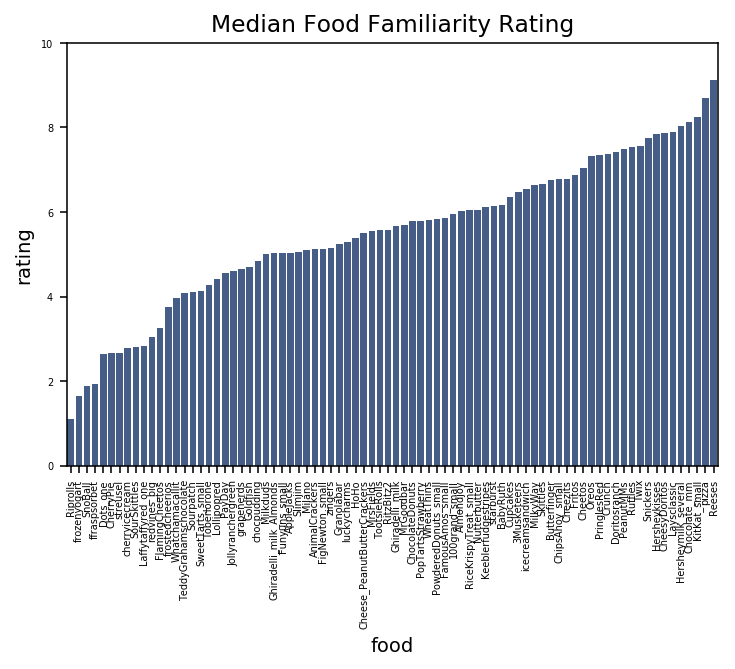

In [34]:
getfamiliarityratings(printFig=True);

In [6]:
familiarityratings = getfamiliarityratings(printFig=False);
food = pd.read_csv('./output/food_zscoredratings.csv')

total number of people who accepted the HIT 153
104 subjects completed all the tasks.


In [16]:
def getsubauctionratingsdf(subjectId):
    subjectFolder = _dataDir + subjectId + '/'

    familiarityFile = subjectFolder + subjectId + auctionFileEnd

    if os.path.exists(familiarityFile):
        df = pd.read_csv(familiarityFile)
        subdf = df[['subjectId','stimulus1','rating']]
        subdf.columns = ['subjid','food','rating']
        return subdf

def getauctionratings(printFig):
    subjects = get_subjects_w_all_data()
    familiarity_ratings = pd.DataFrame()
    
    for subject in subjects:
        df = getsubauctionratingsdf(subject)
        #df['rating'] = (df['rating'] - df['rating'].mean()) / df['rating'].std()
        familiarity_ratings = pd.concat([familiarity_ratings, df])
    familiarity_ratings.reset_index(inplace=True, drop=True)
    
    if printFig:
        allratings = familiarity_ratings.groupby('food',as_index=False).median()

        #ratingssem = ratings.groupby('food').sem()['rating'].values    
        #allratings['sem'] = ratingssem

        allratings.sort_values('rating', ascending=True, inplace=True)
        allratings.reset_index(inplace=True, drop=True)

        #print "Mean Rating:", allratings['rating'].mean(), "±", allratings['rating'].std()
        #print allratings

        plt.rcParams['figure.dpi'] = 140
        fig = plt.figure()

        ax = sns.barplot(x="food", y="rating", data=allratings, color='xkcd:denim blue')
        ax.set_title('Median Food Auction Rating')
        plt.xticks(rotation=90)
        ax.set_ylim(0,10)
        ax.tick_params(labelsize=5)
        plt.show()
    return familiarity_ratings

total number of people who accepted the HIT 153
104 subjects completed all the tasks.


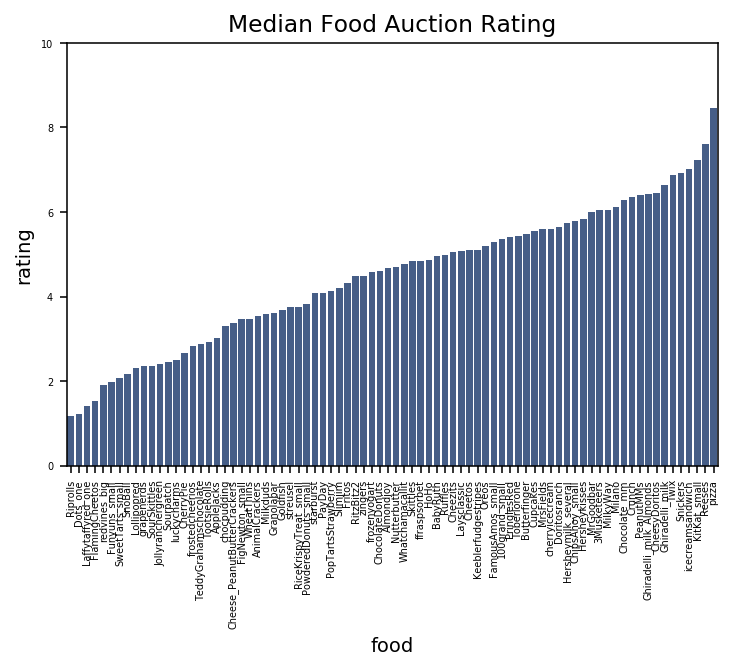

In [17]:
getauctionratings(printFig=True);

In [5]:
food = pd.read_csv('./output/food_zscoredratings.csv')
left = food.groupby('ImageLeft')
"""
plt.rcParams['figure.dpi'] = 140
fig = plt.figure()

ax = sns.barplot(x="food", y="rating", data=allratings, color='xkcd:denim blue')
ax.set_title('Median Food Familiarity Rating')
plt.xticks(rotation=90)
ax.set_ylim(0,10)
ax.tick_params(labelsize=5)
plt.show()
"""

Index([u'Unnamed: 0', u'subjid', u'deltaval', u'ImageLeft', u'ImageRight',
       u'bidLeft', u'bidRight', u'RT', u'sceneStimulusStatus', u'choseright'],
      dtype='object')


'\nplt.rcParams[\'figure.dpi\'] = 140\nfig = plt.figure()\n\nax = sns.barplot(x="food", y="rating", data=allratings, color=\'xkcd:denim blue\')\nax.set_title(\'Median Food Familiarity Rating\')\nplt.xticks(rotation=90)\nax.set_ylim(0,10)\nax.tick_params(labelsize=5)\nplt.show()\n'

2 of the 104 subjects who completed all of the tasks didn't have significant performance logistics

In [23]:
familiarityratings.columns = ['subjid','ImageLeft','ImageLeftFamiliarity']
df = food.merge(familiarityratings,left_on=['subjid','ImageLeft'],right_on=['subjid','ImageLeft'])
familiarityratings.columns = ['subjid','ImageRight','ImageRightFamiliarity']
df = df.merge(familiarityratings,left_on=['subjid','ImageRight'],right_on=['subjid','ImageRight'])
df['familiarityDelta'] = df['ImageRightFamiliarity'] - df['ImageLeftFamiliarity']
df.to_csv('./output/food_zscoredratings_with_food_familiarityratings.csv')

N=100 here because 2 of the 102 subjects with significant performance logistics didn't complete the familiarity ratings

In [12]:
%%R 
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/food_zscoredratings_with_food_familiarityratings.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
food$absdeltaval=abs(food$deltaval)

foodchmod=glmer(choseright ~ deltaval * sceneStimulusStatus + familiarityDelta + (1|subjid), family='binomial', data=food)
print(summary(foodchmod))

Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: choseright ~ deltaval * sceneStimulusStatus + familiarityDelta +  
    (1 | subjid)
   Data: food

     AIC      BIC   logLik deviance df.resid 
 31676.5  31725.8 -15832.3  31664.5    27222 

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-20.6177  -0.8455   0.1459   0.8393  13.2342 

Random effects:
 Groups Name        Variance Std.Dev.
 subjid (Intercept) 0.04565  0.2136  
Number of obs: 27228, groups:  subjid, 100

Fixed effects:
                                   Estimate Std. Error z value Pr(>|z|)    
(Intercept)                        0.047483   0.028682    1.66   0.0978 .  
deltaval                           1.064248   0.034499   30.85   <2e-16 ***
sceneStimulusStatusnovel          -0.025132   0.027136   -0.93   0.3544    
familiarityDelta                   0.163567   0.004837   33.82   <2e-16 ***
deltaval:sceneStimulusStatusnovel

In [15]:
%%R 
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/food_zscoredratings_with_food_familiarityratings.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
food$absdeltaval=abs(food$deltaval)
food$absfamiliaritydelta=abs(food$familiarityDelta)

foodrtmod=lmer(RT ~ absdeltaval * sceneStimulusStatus + absfamiliaritydelta + (1|subjid), data=food)
print(summary(foodrtmod))

Linear mixed model fit by REML ['lmerMod']
Formula: RT ~ absdeltaval * sceneStimulusStatus + absfamiliaritydelta +  
    (1 | subjid)
   Data: food

REML criterion at convergence: 392123.7

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.5188 -0.6258 -0.1551  0.4382  6.3701 

Random effects:
 Groups   Name        Variance Std.Dev.
 subjid   (Intercept)  63415   251.8   
 Residual             103349   321.5   
Number of obs: 27228, groups:  subjid, 100

Fixed effects:
                                      Estimate Std. Error t value
(Intercept)                          1117.0654    25.4873   43.83
absdeltaval                           -55.1068     4.1843  -13.17
sceneStimulusStatusnovel               19.8603     4.9202    4.04
absfamiliaritydelta                    -3.8822     0.9199   -4.22
absdeltaval:sceneStimulusStatusnovel  -18.3299     5.9734   -3.07

Correlation of Fixed Effects:
            (Intr) absdlt scnStS absfml
absdeltaval -0.067                     
scnStm

In [20]:
def getsubfoodratingsdf(subjectId):
    subjectFolder = _dataDir + subjectId + '/'

    auctionFile = subjectFolder + subjectId + auctionFileEnd

    if os.path.exists(auctionFile):
        df = pd.read_csv(auctionFile)
        subdf = df[['subjectId','stimulus1','rating']]
        subdf.columns = ['subjid','food','rating']
        return subdf

In [2]:
def getfamiliarityratings():
    subjects = get_subjects_w_all_data()
    df = pd.DataFrame()
    
    for subject in subjects:
        familiarity_df = getsubfamiliarityratingsdf(subject)
        familiarity_df.columns = ['subjid','food','familiarity']
        ratings_df = getsubfoodratingsdf(subject)
        familiarity_df.sort_values('food', ascending=True, inplace=True)
        ratings_df.sort_values('food', ascending=True, inplace=True)
        
        familiarity_df.reset_index(inplace=True, drop=True)
        ratings_df.reset_index(inplace=True, drop=True)
        
        assert (ratings_df['subjid'].values == familiarity_df['subjid'].values).mean() == 1.0
        assert (ratings_df['food'].values == familiarity_df['food'].values).mean() == 1.0
        
        sub_df = ratings_df
        sub_df['familiarity'] = familiarity_df['familiarity'].values
        df = pd.concat([df, sub_df])
        
    df.reset_index(inplace=True, drop=True)
    foodmd = smf.mixedlm('rating ~ familiarity', df, groups=df['subjid'])
    foodmdf = foodmd.fit()
    print(foodmdf.summary())
    

In [74]:
getfamiliarityratings()

total number of people who accepted the HIT 153
104 subjects completed all the tasks.
          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: rating     
No. Observations: 8320    Method:             REML       
No. Groups:       104     Scale:              4.9722     
Min. group size:  80      Likelihood:         -18658.7226
Max. group size:  80      Converged:          Yes        
Mean group size:  80.0                                   
---------------------------------------------------------
                Coef. Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------
Intercept       1.095    0.143  7.679 0.000  0.816  1.375
familiarity     0.638    0.009 71.841 0.000  0.621  0.656
groups RE       1.816    0.118                           



## Compile food data into csv

In [4]:
def getfoodsubdf(subjectId, zscoreRatings):
    subjectFolder = _dataDir + subjectId + '/'

    auctionFile = subjectFolder + subjectId + auctionFileEnd
    choiceFile = subjectFolder + subjectId + choiceFileEnd

    if os.path.exists(choiceFile):
        df = pd.read_csv(choiceFile)
        
        rightStimRatings = df["stimulus2Bid"]
        leftStimRatings = df["stimulus1Bid"]
        
        if zscoreRatings:
            mean, std = get_ratings_mean_and_std(subjectId)
            df["stimulus2Bid"] = (rightStimRatings - mean) / std
            df["stimulus1Bid"] = (leftStimRatings - mean) / std
            df["delta"] = df["stimulus2Bid"] - df["stimulus1Bid"]

        df = df.loc[(df["receivedResponse"] == True) & (df["rt"] > 300)]
        
        choices = df['selected'] == df['stimulus2']
        subdf = df[['subjectId','delta','stimulus1','stimulus2','stimulus1Bid','stimulus2Bid','rt','sceneStimulusStatus']]
        subdf.columns = ['subjid','deltaval','ImageLeft','ImageRight','bidLeft','bidRight','RT','sceneStimulusStatus']

        subdf.loc[:,'choseright'] = choices
        
        return subdf

def getfoodcsv(zscoreRatings):
    df_sig_pval = get_p_logistic_plots(zscoreRatings=False, printFigs=False)
    subjects = df_sig_pval['subjectId'].values
    outputDir = _thisDir + '/output/'
    food = pd.DataFrame()
    for i in range(0,len(subjects)):
        subject = subjects[i]
        df = getfoodsubdf(subject, zscoreRatings)
        food = pd.concat([food, df])
    food.reset_index(inplace=True, drop=True)
    familiar_food=food.loc[food['sceneStimulusStatus']=='familisar']
    familiar_food.reset_index(inplace=True, drop=True)
    novel_food=food.loc[food['sceneStimulusStatus']=='novel']
    novel_food.reset_index(inplace=True, drop=True)
    if not os.path.exists(_thisDir + '/output'):
        os.mkdir(_thisDir + '/output/')
    if zscoreRatings:
        food.to_csv(_thisDir + '/output/food_zscoredratings.csv')
        familiar_food.to_csv(_thisDir + '/output/familiar_food_zscoredratings.csv')
        novel_food.to_csv(_thisDir + '/output/novel_food_zscoredratings.csv')
    else:
        food.to_csv(_thisDir + '/output/food.csv')
        familiar_food.to_csv(_thisDir + '/output/familiar_food.csv')
        novel_food.to_csv(_thisDir + '/output/novel_food.csv')


In [18]:
getfoodcsv(zscoreRatings=True)
getfoodcsv(zscoreRatings=False)

total number of people who accepted the HIT 153
106 subjects completed the auction and choice tasks.
Of 106 subjects, 102 subjects had significant p values for the logistic regression.


/Users/alicexue/anaconda2/lib/python2.7/site-packages/pandas/core/indexing.py:362: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[key] = _infer_fill_value(value)
/Users/alicexue/anaconda2/lib/python2.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


total number of people who accepted the HIT 153
106 subjects completed the auction and choice tasks.
Of 106 subjects, 102 subjects had significant p values for the logistic regression.


## DDM fits

In [6]:
def discretize(theta, stim_strengths, tmax, dt):
    """
    Utility function that sets up the grid on which to do density propagation
    and also computes some additional required quantities

    Parameters
    ----------
    theta : 9 element list or array containing the DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    stim_strengths : array of unique stimulus strength for which to do
                     propagation

    tmax : float, maximum time for which to propagate

    dt : float, temporal resolution, in seconds, to use when propagating

    Returns
    -------
    drifts : array of shape (nd,) when nd is the number of drifts

    t : array of shape (nt,) where nt is the number of time points;
        vector of time points

    Bup : array of shape (nt,) where nt is the number of time points;
          vector of upper bounds, one value per each time bin

    Blo : array of shape (nt,) where nt is the number of time points;
          vector of lower bounds, one value per each time bin

    y : array of shape (ng,) where ng is the number of grid points
        over which to compute Gaussian density;
        these are the grid points to which y0 corresponds

    yinit : array of shape (ng,) where ng is the number of grid points
            over which to compute Gaussian density;
            these are the  actual initial density values

    """

    k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta

    # time
    tmax = tmax + .3
    t = np.arange(0, tmax, dt)

    # bounds
    Bup = B0 * (t == t)
    s = t > Bdel

    #exponential
    Bup[s] = B0 * np.exp(-B2 * (t[s] - Bdel))
    Blo = -Bup

    # drift rate
    drifts = k * (stim_strengths + stim_strength_bias)
    
    # max unsigned drift
    md = np.max(np.abs(drifts))
    sm = md * dt + np.sqrt(dt) * 4
    y = np.linspace(np.min(Blo) - sm, np.max(Bup) + sm, 512)
    yinit = 0 * y

    i1 = np.where(y >= y0)[0][0]
    i2 = np.where(y <= y0)[0][-1]

    if i1 == i2:
        yinit[i1] = 1
    else:
        w2 = np.abs(y[i1] - y0)
        w1 = np.abs(y[i2] - y0)

        w1 = w1 / (w1 + w2)
        w2 = (1 - w1)
        yinit[i1] = w1
        yinit[i2] = w2

    drifts = drifts[np.newaxis, :]
    t = t.reshape(-1, 1)
    Bup = Bup.reshape(-1, 1)
    Blo = Blo.reshape(-1, 1)
    y = y.reshape(-1, 1)
    yinit = yinit.reshape(-1, 1)
    return drifts, t, Bup, Blo, y, yinit

In [7]:
def plotFoodsubDataWithFit(f_data, f_theta, n_data, n_theta, subjid, bindata, dt=.0005):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 3) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    theta : 9 element list or array containing the fitted DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    subjid : subject id
    
    bindata : if True, plots mean with std error bars; if False, plots raw data

    dt : float, temporal resolution, in seconds, to use when propagating
         the stimulus strengths to visualize (for plotting only)

    Returns
    -------

    """

    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors
    
    plt.rcParams['figure.dpi'] = 90
    fig = plt.figure()
    
    plt.suptitle(subjid)
    
    """ Familiar """
    sceneStimulusStatus='familiar'
    data=f_data
    theta=f_theta
    k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta
    stim_strengths, rt, ci, deltaval = data[:, 0], data[:, 1], data[:, 2], data[:, 3]
    
    stim_strengths = stim_strengths.astype("complex") ** plaw
    ustim_strengths = np.unique(stim_strengths)
    stim_strengths_to_propagate = np.linspace(
        np.min(ustim_strengths), np.max(ustim_strengths), 51)

    drifts, t, Bup, Blo, y, yinit = discretize(
        theta, stim_strengths_to_propagate, np.max(rt), dt)

    D = propagate(drifts, t, Bup, Blo, y, yinit)

    df=pd.DataFrame(data,columns=['stim_strength','rt','ci','deltaval'])  
    df['ci']=df['ci'].astype('bool')
    df['rt']=df['rt'].astype('float64')
    df['stim_strength']=stim_strengths
    
    dfsorted=df.sort_values('deltaval', ascending=True)
    
    #running mean of choices
    meanprop = pd.Series.rolling(dfsorted['ci'],10,min_periods=1).mean()

    # predicted proportions
    predprop = D['up']['p'][:]

    #chose right or chose left
    cr=dfsorted[dfsorted['ci']==1]
    cl=dfsorted[dfsorted['ci']==0]
    
    #running mean of rt
    meanrt_lo = pd.Series.rolling(cl['rt'],10,min_periods=1).mean()
    meanrt_up = pd.Series.rolling(cr['rt'],10,min_periods=1).mean()
    meanrt_both = pd.Series.rolling(dfsorted['rt'],10,min_periods=1).mean()

    predrt_up = D['up']['mean_t'][0] + tnd
    predrt_lo = D['lo']['mean_t'][0] + tnd
    predrt_both=D['both']['mean_t'][0] + tnd
    
    ax_choice = fig.add_subplot(1, 2, 1)
    plt.title('Value-based choice')
    if bindata:
        meanbindata, stdbindata = get_binned_data(subjid, sceneStimulusStatus)
        ax_choice.plot(meanbindata['DeltaRnd'].values,meanbindata['Choice'].values,'o',color='xkcd:pale red')
        #ax_choice.errorbar(meanbindata['DeltaRnd'].values,meanbindata['Choice'].values,yerr=stdbindata['Choice'].values,fmt='o',color='grey')
    else: 
        ax_choice.add_line(
            plt.Line2D(dfsorted['deltaval'], meanprop, color='xkcd:pale red'))
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate, predprop, color='xkcd:pale red'))
    
    ax_rt = fig.add_subplot(1, 2, 2)
    plt.title('Value-based RT')
    if bindata:
        meanbindata, stdbindata = get_binned_data(subjid, sceneStimulusStatus)
        ax_rt.plot(meanbindata['DeltaRnd'].values,meanbindata['RT'].values,'o',color='xkcd:pale red', label='familiar')
        #ax_rt.errorbar(meanbindata['DeltaRnd'].values,meanbindata['RT'].values,yerr=stdbindata['RT'].values,fmt='o',color='grey')
    else:
        ax_rt.add_line(
        plt.Line2D(dfsorted['deltaval'], meanrt_both, color='xkcd:pale red', label='familiar'))

    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate, predrt_both,
        color='xkcd:pale red', marker='None'))
    
    """ Novel """
    sceneStimulusStatus='novel'
    data=n_data
    theta=n_theta
    k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta
    stim_strengths, rt, ci, deltaval = data[:, 0], data[:, 1], data[:, 2], data[:, 3]
    
    stim_strengths = stim_strengths.astype("complex") ** plaw
    ustim_strengths = np.unique(stim_strengths)
    stim_strengths_to_propagate = np.linspace(
        np.min(ustim_strengths), np.max(ustim_strengths), 51)

    drifts, t, Bup, Blo, y, yinit = discretize(
        theta, stim_strengths_to_propagate, np.max(rt), dt)

    D = propagate(drifts, t, Bup, Blo, y, yinit)

    df=pd.DataFrame(data,columns=['stim_strength','rt','ci','deltaval'])  
    df['ci']=df['ci'].astype('bool')
    df['rt']=df['rt'].astype('float64')
    df['stim_strength']=stim_strengths
    
    dfsorted=df.sort_values('deltaval', ascending=True)
    
    #running mean of choices
    meanprop = pd.Series.rolling(dfsorted['ci'],10,min_periods=1).mean()

    # predicted proportions
    predprop = D['up']['p'][:]

    #chose right or chose left
    cr=dfsorted[dfsorted['ci']==1]
    cl=dfsorted[dfsorted['ci']==0]
    
    #running mean of rt
    meanrt_lo = pd.Series.rolling(cl['rt'],10,min_periods=1).mean()
    meanrt_up = pd.Series.rolling(cr['rt'],10,min_periods=1).mean()
    meanrt_both = pd.Series.rolling(dfsorted['rt'],10,min_periods=1).mean()

    predrt_up = D['up']['mean_t'][0] + tnd
    predrt_lo = D['lo']['mean_t'][0] + tnd
    predrt_both=D['both']['mean_t'][0] + tnd
    
    if bindata:
        meanbindata, stdbindata = get_binned_data(subjid, sceneStimulusStatus)
        ax_choice.plot(meanbindata['DeltaRnd'].values,meanbindata['Choice'].values,'o',color='xkcd:denim blue')
        #ax_choice.errorbar(meanbindata['DeltaRnd'].values,meanbindata['Choice'].values,yerr=stdbindata['Choice'].values,fmt='o',color='grey')
    else: 
        ax_choice.add_line(
            plt.Line2D(dfsorted['deltaval'], meanprop, color='xkcd:denim blue'))
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate, predprop, color='xkcd:denim blue'))

    xdata = stim_strengths_to_propagate
    
    ax_choice.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_choice.set_ylim((-0.01, 1.01))
    ax_choice.set_xlabel('DeltaValue (Right - Left)')
    ax_choice.set_ylabel('P(respond Right)')
    
    if bindata:
        meanbindata, stdbindata = get_binned_data(subjid, sceneStimulusStatus)
        ax_rt.plot(meanbindata['DeltaRnd'].values,meanbindata['RT'].values,'o',color='xkcd:denim blue', label='novel')
        #ax_rt.errorbar(meanbindata['DeltaRnd'].values,meanbindata['RT'].values,yerr=stdbindata['RT'].values,fmt='o',color='grey')
    else:
        ax_rt.add_line(
        plt.Line2D(dfsorted['deltaval'], meanrt_both, color='xkcd:denim blue', label='novel'))

    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate, predrt_both,
        color='xkcd:denim blue', marker='None'))

    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Reaction time (s)')
    
    ax_rt.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_rt.set_ylim(np.nanmin(np.concatenate([meanrt_up, meanrt_lo])) * .75,
                   np.nanmax(np.concatenate([meanrt_up, meanrt_lo])) * 1.1)
    
    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Mean reaction times (s)')

    sns.despine(offset=5, trim=True)
    #plt.tight_layout()
    
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    plt.show()

In [8]:
def propagate(drifts, t, Bup, Blo, y, y0, notabs_flag=False):
    """
    Given a set of drift rates and bounds, compute various quantities
    that characterize the behavior of the drift-diffusion process

    Parameters
    ----------
    drifts : 2D array of shape (1, nd) where nd is the number of drift rates;
             this is a row vector of drifts

    t : 2D array of shape (nt, 1) where nt is the number of time points;
        this is a column vector of time points

    Bup : 2D array of shape (nt, 1) where nt is the number of time points;
          this is a column vector of upper bounds, one value per each time bin

    Blo : 2D array of shape (nt, 1) where nt is the number of time points;
          this is a column vector of lower bounds, one value per each time bin

    y : 2D array of shape (ng, 1) where ng is the number of grid points
        over which to compute Gaussian density; this is a column vector
        of grid points to which y0 corresponds

    y0 : 2D array of shape (ng, 1) where ng is the number of grid points
         over which to compute Gaussian density; this is a column vector
         of actual initial density values

    notabs_flag : boolean, whether to store the not absorbed portion of density

    Returns
    -------
    D : dictionary, contains for each unique stimulus strengh the probability
        of hitting the upper or lower bound, the mean reaction times for the
        two bounds, and the cumulative distribution of reaction times for the
        two bounds (and the not absored densities if requested)

    """
    
    nd = drifts.shape[1]
    nt = t.shape[0]
    dt = t[1, 0] - t[0, 0]
    ny = y.shape[0]

    D = {}
    D['bounds'] = np.column_stack([Bup, Blo])
    D['drifts'] = drifts

    # create fft of zero mean, unit variance gaussian
    kk = np.tile(np.atleast_2d(np.concatenate(
        [np.arange(0, ny / 2 + 1), np.arange(-ny / 2 + 1, 0)])).T, [1, nd])
    omega = 2 * np.pi * kk / (np.max(y) - np.min(y))
    E1 = np.exp(-0.5 * dt * np.power(omega, 2))
    D['up'] = {}
    D['lo'] = {}
    D['both'] = {}
    if notabs_flag:
        D['notabs'] = {}

    D['up']['pdf_t'] = np.zeros([nt, nd])
    D['lo']['pdf_t'] = np.zeros([nt, nd])
    D['both']['pdf_t'] = np.zeros([nt, nd])
    if notabs_flag:
        D['notabs']['pdf'] = np.zeros([nd, ny, nt])

    # U is initial state, one column for each drift rate
    U = np.tile(y0, [1, nd])

    # shift mean of zero mean, unit variance gaussian by drift
    E2 = E1 * np.exp(-1j * omega * np.tile(drifts, [ny, 1]) * dt)

    # prepare the values to propagate for vectorization
    y = np.tile(y, [1, nd])
    p_threshold = .00001
    for i in range(nt):
        # fft current pdf
        Ufft = np.fft.fft(U, axis=0)

        # convolve with gaussian with drift in the frequency domain
        Ufft = E2 * Ufft

        # turn back into time domain
        U = np.real(np.fft.ifft(Ufft, axis=0))
        U = np.clip(U, 0, np.inf)

        D['up']['pdf_t'][i, :] = np.sum(U * (y >= Bup[i]), axis=0)
        D['lo']['pdf_t'][i, :] = np.sum(U * (y <= Blo[i]), axis=0)
        D['both']['pdf_t'][i, :] = np.sum(U * ((y <= Blo[i]) | (y >= Bup[i])), axis=0)

        # keep only density within bounds
        U *= np.logical_and(y > Blo[i], y < Bup[i])

        # store not absorbed density if requested
        if notabs_flag:
            D['notabs']['pdf'][:, :, i] = U.T

        if np.sum(np.sum(U, axis=0) < p_threshold) == nd:
            break

    D['t'] = t

    D['up']['p'] = np.sum(D['up']['pdf_t'], axis=0)
    D['lo']['p'] = np.sum(D['lo']['pdf_t'], axis=0)
    D['both']['p'] = np.sum(D['both']['pdf_t'], axis=0)

    D['up']['mean_t'] = np.dot(t.T, D['up']['pdf_t']) / D['up']['p']
    D['lo']['mean_t'] = np.dot(t.T, D['lo']['pdf_t']) / D['lo']['p']
    D['both']['mean_t'] = np.dot(t.T, D['both']['pdf_t']) / D['both']['p']

    D['up']['cdf_t'] = np.cumsum(D['up']['pdf_t'], axis=0)
    D['lo']['cdf_t'] = np.cumsum(D['lo']['pdf_t'], axis=0)
    D['both']['cdf_t'] = np.cumsum(D['both']['pdf_t'], axis=0)
    return D

In [9]:
def get_binned_data(subject,sceneStimulusStatus):
    outputDir = _thisDir + '/output'
    datafoodfile = outputDir + '/' + subject + '/' + subject + '_' + sceneStimulusStatus + '_datafood.pickle'
    if not os.path.exists(datafoodfile):
        print "Data file does not exist"
        sys.exit(-1)
    with open(datafoodfile, 'rb') as handle:
        datafoodsub = pickle.load(handle)
    
    df = pd.DataFrame(data = datafoodsub)

    df.columns = ['DeltaRnd', 'RT', 'Choice', 'Delta']
    
    bins = df['DeltaRnd'].unique()
    
    allmeanbindata = []
    allstdbindata = []
    
    meanchoice = df['Choice'].mean()
    meanrt = df['RT'].mean()
    
    for deltabin in bins:
        bindata = df.loc[df['DeltaRnd'] == deltabin]
        meanbindata = bindata.mean(axis = 0)
        tmp = bindata
        tmp.loc[:,'Choice'] = tmp['Choice'] - meanbindata['Choice'] + meanchoice
        tmp.loc[:,'RT'] = tmp['RT'] - meanbindata['RT'] + meanrt
        stdbindata = tmp.std(axis = 0)
        allmeanbindata.append(meanbindata)
        allstdbindata.append(stdbindata)
    
    m_bindf = pd.DataFrame(data = allmeanbindata)
    std_bindf = pd.DataFrame(data = allstdbindata)
    return m_bindf, std_bindf

In [10]:
def get_fit_data_and_plot(subject, outputDir):
    
    print 'subject:', subject
    sceneStimulusStatus = 'familiar'
    with open(outputDir + '/' + subject + '/' + subject + '_' + sceneStimulusStatus + '_datafood.pickle', 'rb') as handle:
        f_datafoodsub = pickle.load(handle)
    
    with open(outputDir + '/' + subject + '/' + subject + '_' + sceneStimulusStatus + '_foodfopt.pickle', 'rb') as handle:
        f_foodfoptsub = pickle.load(handle)
        print sceneStimulusStatus, "foodfoptsub:", f_foodfoptsub

    with open(outputDir + '/' + subject + '/' + subject + '_' + sceneStimulusStatus + '_thetafood.pickle', 'rb') as handle:
        f_thetafoodsub = pickle.load(handle)
        print sceneStimulusStatus, "thetafoodsub:", f_thetafoodsub
    
    sceneStimulusStatus = 'novel'
    with open(outputDir + '/' + subject + '/' + subject + '_' + sceneStimulusStatus + '_datafood.pickle', 'rb') as handle:
        n_datafoodsub = pickle.load(handle)

    with open(outputDir + '/' + subject + '/' + subject + '_' + sceneStimulusStatus + '_foodfopt.pickle', 'rb') as handle:
        n_foodfoptsub = pickle.load(handle)
        print sceneStimulusStatus, "foodfoptsub:", n_foodfoptsub

    with open(outputDir + '/' + subject + '/' + subject + '_' + sceneStimulusStatus + '_thetafood.pickle', 'rb') as handle:
        n_thetafoodsub = pickle.load(handle)
        print sceneStimulusStatus, "thetafoodsub:", n_thetafoodsub
        
    
    # k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta
    s = subject
    plotFoodsubDataWithFit(f_datafoodsub, f_thetafoodsub, n_datafoodsub, n_thetafoodsub, s, True, dt=.005)
    #outputfit(datafoodsub, thetafoodsub, s, 'food', dt=.0005)

total number of people who accepted the HIT 153
106 subjects completed the auction and choice tasks.
Of 106 subjects, 102 subjects had significant p values for the logistic regression.
subject: MDMRTS_0001
familiar foodfoptsub: 1124.6454402710647
familiar thetafoodsub: [ 1.06432377  0.54910196  0.64856413  0.07813245  0.49698735  0.05806216
 -0.08597691  0.          1.30908815]
novel foodfoptsub: 1103.9456978542585
novel thetafoodsub: [1.14234281 0.53640528 2.85242661 0.05275928 0.49718761 0.03949461
 0.03836692 0.         0.99790228]


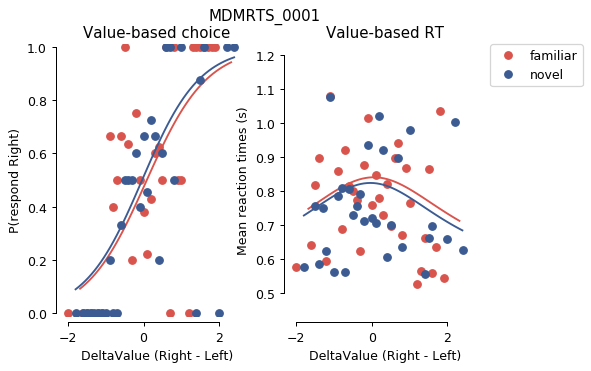

subject: MDMRTS_0002
familiar foodfoptsub: 1178.8992752579009
familiar thetafoodsub: [1.45091642 0.80183964 0.20932103 0.2554859  0.64360944 0.11678049
 0.07635712 0.         0.8306502 ]
novel foodfoptsub: 1164.7730389755357
novel thetafoodsub: [ 1.23280127  0.9202656   0.41597609  0.7596023   0.53206964  0.06116889
 -0.08585578  0.          0.87206022]


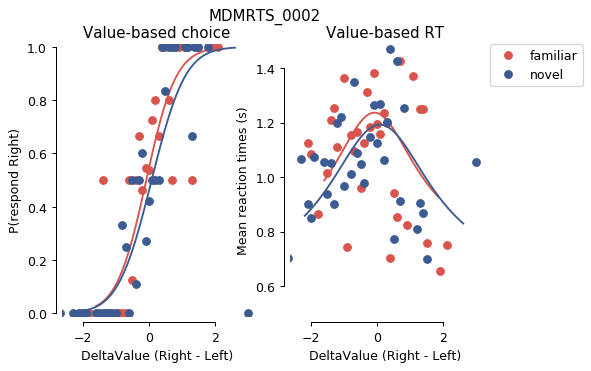

subject: MDMRTS_0003
familiar foodfoptsub: 1160.2710324707086
familiar thetafoodsub: [ 0.63292963  0.88882344  0.02860043  0.47473519  0.63265132  0.04068022
 -0.13035777  0.          1.04906715]
novel foodfoptsub: 1162.8498306316983
novel thetafoodsub: [ 0.90490344  0.72596895  0.01477643  0.02422902  0.68979856  0.05526405
 -0.12355579  0.          0.83378365]


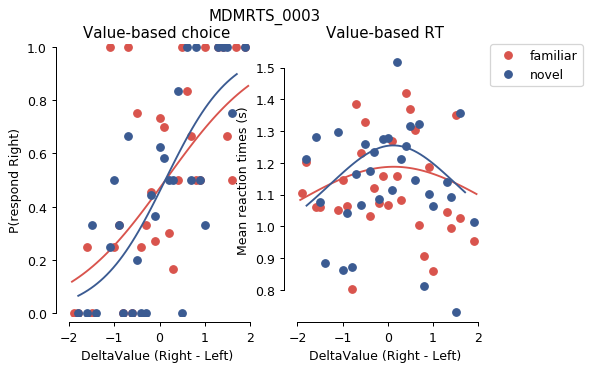

subject: MDMRTS_0004
familiar foodfoptsub: 1020.6830015332164
familiar thetafoodsub: [ 1.44874088  0.5         3.15733462  1.59240838  0.47346424  0.06963226
 -0.2         0.          0.97292123]
novel foodfoptsub: 1032.3067864234415
novel thetafoodsub: [1.4837181  0.50639779 1.26929063 0.26335749 0.44836966 0.0609372
 0.03427535 0.         1.10807313]


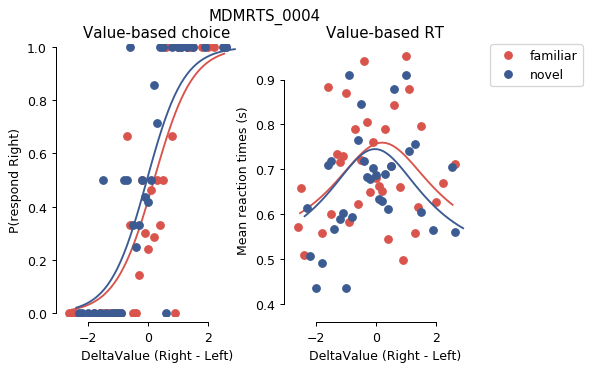

subject: MDMRTS_0005
familiar foodfoptsub: 1091.957812627845
familiar thetafoodsub: [ 3.24708082  0.58661878  0.0620469   0.83006737  0.80421688  0.12522166
 -0.00990413  0.          0.81013357]
novel foodfoptsub: 1101.661539851818
novel thetafoodsub: [2.6360566  0.50224667 0.1070813  0.35001196 0.83044951 0.12528717
 0.09256947 0.         1.02787041]


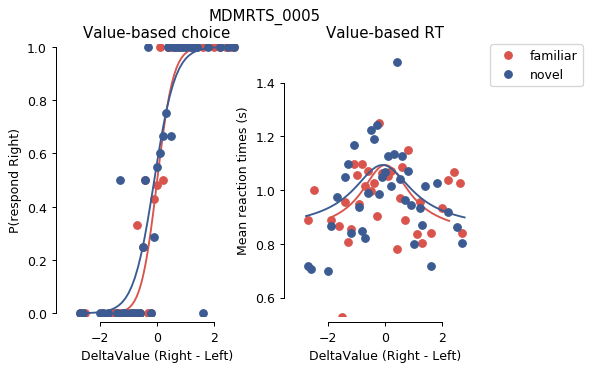

subject: MDMRTS_0007
familiar foodfoptsub: 1126.8501392858689
familiar thetafoodsub: [1.65156386e+00 5.00000000e-01 1.17866540e+00 7.91519258e-04
 6.92239495e-01 1.49244178e-01 8.00523663e-02 0.00000000e+00
 7.29437787e-01]
novel foodfoptsub: 1128.109276098491
novel thetafoodsub: [1.03053432 0.5029413  1.11145933 0.13941205 0.66569613 0.11229913
 0.07885339 0.         0.96370552]


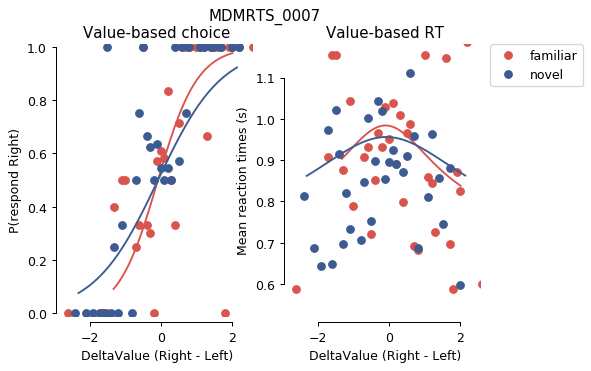

subject: MDMRTS_0008
familiar foodfoptsub: 1196.4481280724353
familiar thetafoodsub: [0.61223369 0.73954208 0.84793418 0.01501552 0.51408771 0.0776404
 0.05126536 0.         1.25830766]
novel foodfoptsub: 1160.5461761070078
novel thetafoodsub: [ 1.39564061  0.7616388   0.79361579  0.91139869  0.50317529  0.05395813
 -0.01582946  0.          0.74319723]


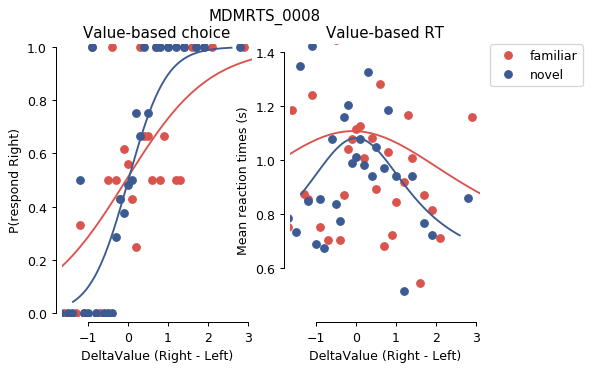

subject: MDMRTS_0009
familiar foodfoptsub: 1147.1475643623994
familiar thetafoodsub: [1.59104034 0.74074809 0.3124953  0.6804107  0.74810016 0.08892706
 0.19180337 0.         0.78713728]
novel foodfoptsub: 1129.9914105826083
novel thetafoodsub: [1.90454777 0.96270132 0.49228859 1.32857784 0.61505724 0.01969213
 0.07245804 0.         0.72639192]


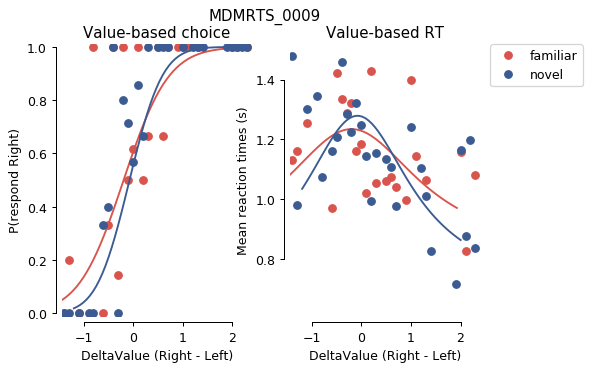

subject: MDMRTS_0010
familiar foodfoptsub: 1046.620667604204
familiar thetafoodsub: [ 1.58515502  0.74285986  1.07433549  0.00248115  0.90320583  0.08123378
 -0.12715149  0.          0.79290717]
novel foodfoptsub: 1064.9899251545594
novel thetafoodsub: [ 1.92626115  0.69129199  0.25044527  0.00324649  1.03471214  0.18115011
 -0.18823546  0.          1.13613235]


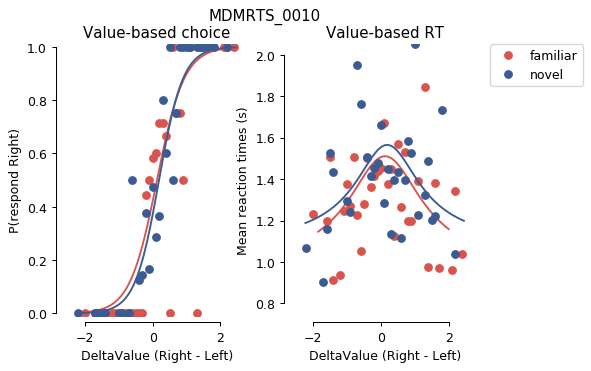

subject: MDMRTS_0013
familiar foodfoptsub: 1154.4156422836054
familiar thetafoodsub: [ 0.849034    0.60159476  3.1206417   1.6648566   0.66701359  0.11925796
 -0.2         0.          0.94198005]
novel foodfoptsub: 1166.6288342859325
novel thetafoodsub: [ 1.28375597  0.66069502  1.2970208   0.34026006  0.60151248  0.07523246
 -0.15464559  0.          0.79951186]


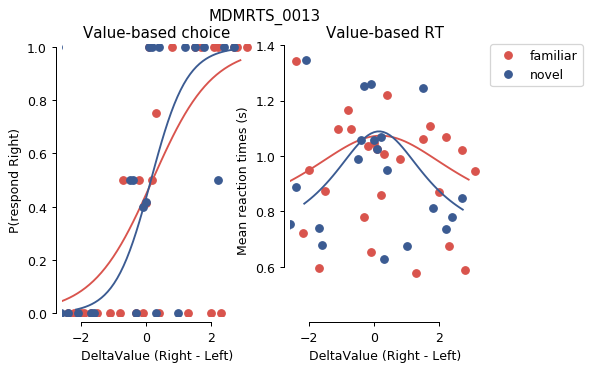

subject: MDMRTS_0014
familiar foodfoptsub: 1173.363752889908
familiar thetafoodsub: [ 1.99796289  0.94212632  0.49863103  0.67141901  1.01086752  0.19678365
 -0.08289041  0.          0.82225715]
novel foodfoptsub: 1178.2644463690285
novel thetafoodsub: [1.79892645e+00 9.68581522e-01 3.10928024e-01 4.09126535e-01
 1.03014788e+00 1.76002307e-01 1.48545880e-03 0.00000000e+00
 9.06222873e-01]


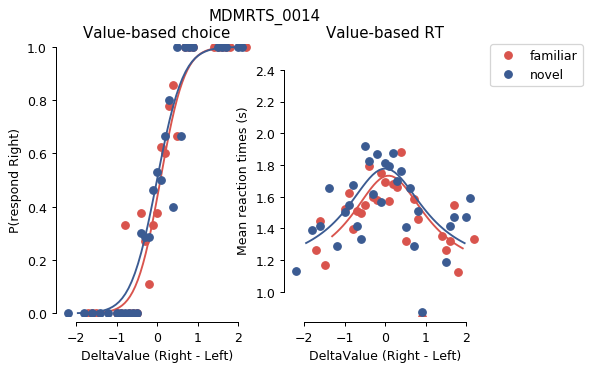

subject: MDMRTS_0020
familiar foodfoptsub: 1128.454558876584
familiar thetafoodsub: [1.55819141 0.5        2.93121728 0.03812247 0.81233875 0.14922913
 0.01211383 0.         1.03302609]
novel foodfoptsub: 1134.8553331969429
novel thetafoodsub: [ 1.45402561  0.56290573  2.72381586  1.23387858  0.76687371  0.10671071
 -0.2         0.          0.83454327]


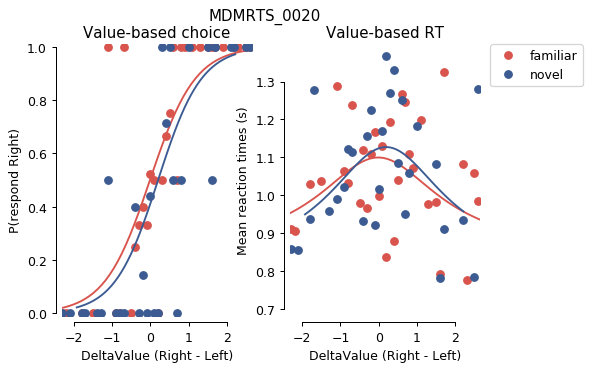

subject: MDMRTS_0021
familiar foodfoptsub: 1072.4212772167941
familiar thetafoodsub: [ 1.57443921  0.5         3.44565523  0.47719815  0.61805707  0.06166477
 -0.2         0.          0.95485343]
novel foodfoptsub: 1086.1524369295141
novel thetafoodsub: [ 1.12693183  0.5         2.2706472   0.04297849  0.67035071  0.07920623
 -0.01735272  0.          0.94430831]


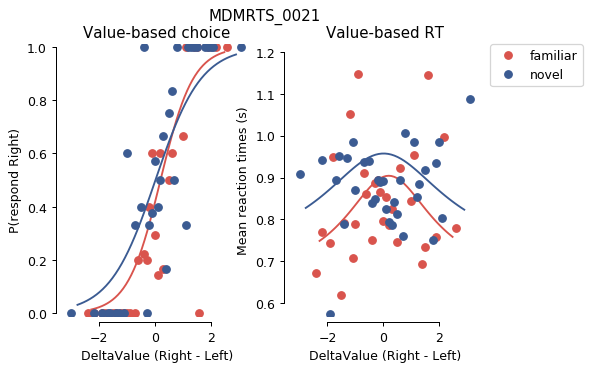

subject: MDMRTS_0023
familiar foodfoptsub: 1113.2867353719612
familiar thetafoodsub: [ 0.7643055   0.50324808  0.25624164  0.39712253  0.69851867  0.08051242
 -0.01693628  0.          1.39210447]
novel foodfoptsub: 1110.5210935143195
novel thetafoodsub: [1.09948708 0.5        1.37860327 0.00232286 0.70643359 0.09247304
 0.06562957 0.         1.43417442]


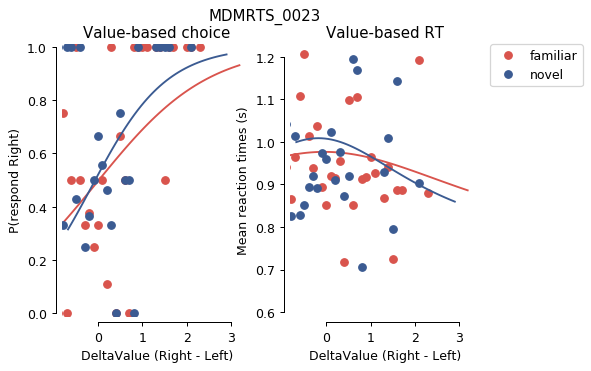

subject: MDMRTS_0024
familiar foodfoptsub: 1077.1423826070377
familiar thetafoodsub: [ 1.03060356  0.5         2.05632606  0.7110624   0.47452977  0.01822781
 -0.2         0.          1.24342268]
novel foodfoptsub: 1074.0613979452
novel thetafoodsub: [ 1.29244971  0.5         2.81821867  0.00475792  0.49774512  0.03034254
 -0.2         0.          1.35855776]


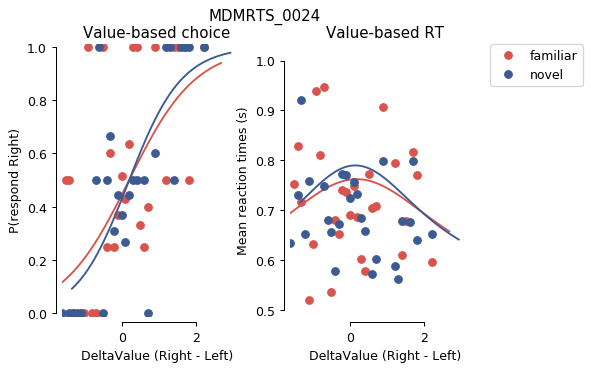

subject: MDMRTS_0027
familiar foodfoptsub: 1082.0541051096734
familiar thetafoodsub: [1.63040371 0.51117019 1.45205308 0.25443164 0.53083944 0.03092424
 0.12051948 0.         0.84918647]
novel foodfoptsub: 1058.7600456250652
novel thetafoodsub: [2.03604496e+00 5.00000000e-01 7.93998556e-01 9.10213271e-04
 5.35051524e-01 4.17684640e-02 7.64236349e-02 0.00000000e+00
 7.69664146e-01]


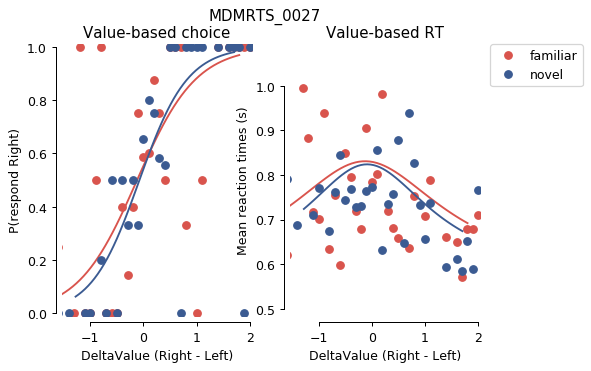

subject: MDMRTS_0028
familiar foodfoptsub: 1164.1806238738614
familiar thetafoodsub: [ 0.91354877  0.70075528  3.22557576  2.99618097  0.65012778  0.05697641
 -0.19999879  0.          1.28932069]
novel foodfoptsub: 1122.3502255177068
novel thetafoodsub: [ 1.38742909  0.6361841   1.3387832   0.24735817  0.63624277  0.0209319
 -0.10632652  0.          0.97183284]


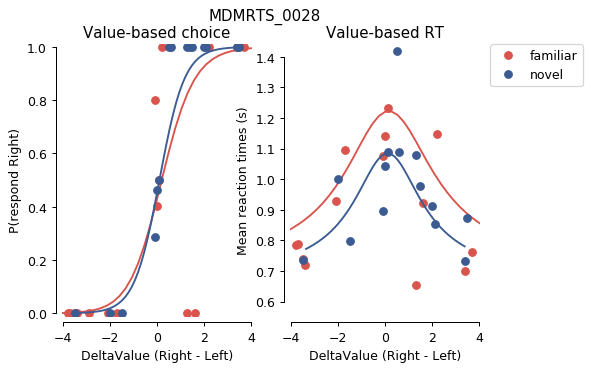

subject: MDMRTS_0029
familiar foodfoptsub: 1100.1136948076255
familiar thetafoodsub: [1.2582673  0.53411735 1.49116164 0.11126695 0.55935061 0.04410584
 0.10029464 0.         1.22571722]
novel foodfoptsub: 1121.9343725881931
novel thetafoodsub: [ 1.02368792  0.57174307  1.25245201  0.15903544  0.51450269  0.04246553
 -0.0166787   0.          0.97929933]


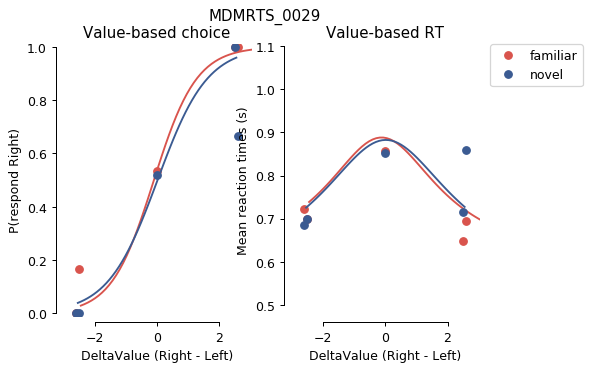

subject: MDMRTS_0030
familiar foodfoptsub: 1216.74443533042
familiar thetafoodsub: [9.58744264e-01 7.16789210e-01 8.07211074e-01 5.32160582e-05
 8.53380093e-01 1.95049177e-01 3.67438855e-02 0.00000000e+00
 1.21404614e+00]
novel foodfoptsub: 1160.4749831607228
novel thetafoodsub: [ 0.82470378  0.74182141  0.86238699  0.50370273  0.8343892   0.12981797
 -0.08263562  0.          1.24008838]


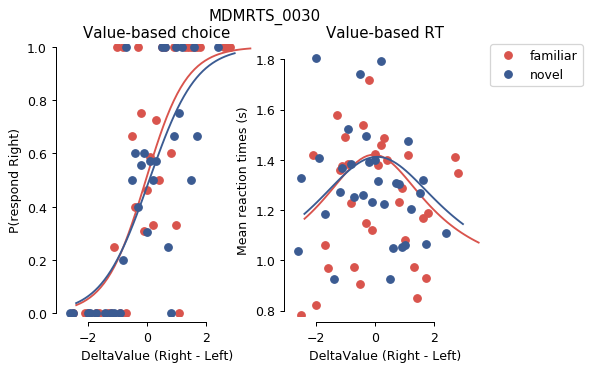

subject: MDMRTS_0032
familiar foodfoptsub: 1184.8142666138115
familiar thetafoodsub: [0.95284019 0.95995876 0.34133983 0.38407442 0.60528264 0.01255617
 0.04707404 0.         1.08965659]
novel foodfoptsub: 1159.8743338109314
novel thetafoodsub: [ 1.69649897  0.63163689  3.49765639  0.04209648  0.8457811   0.15612365
 -0.2         0.          0.69213161]


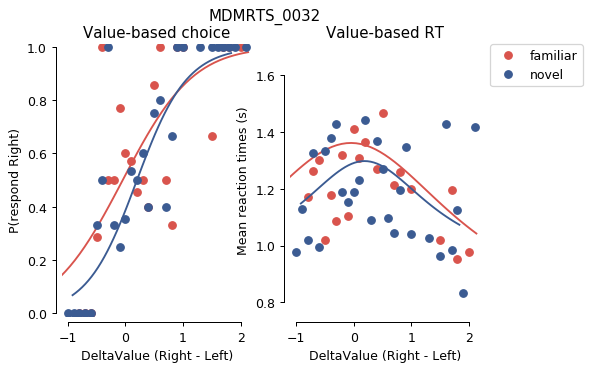

subject: MDMRTS_0033
familiar foodfoptsub: 1075.655285620968
familiar thetafoodsub: [ 1.11724486  0.52191324  2.24036204  0.12571296  0.54012372  0.12198089
 -0.2         0.          0.60123182]
novel foodfoptsub: 1093.104909999763
novel thetafoodsub: [ 0.64904759  0.54478352  1.21822002  0.48062959  0.50476083  0.124871
 -0.18749544  0.          0.85235382]


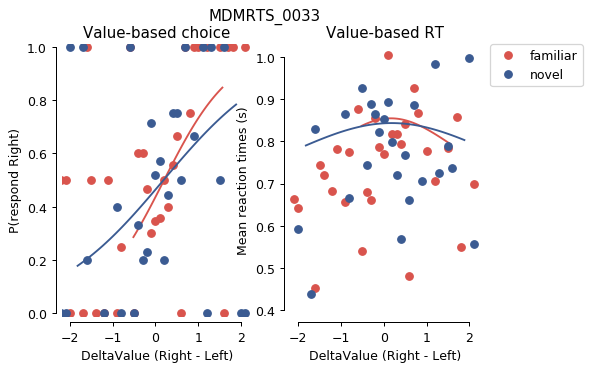

subject: MDMRTS_0034
familiar foodfoptsub: 1190.4127241656904
familiar thetafoodsub: [0.53541221 0.81003212 1.34253998 0.67347004 0.57007307 0.19768464
 0.19972603 0.         1.49688868]
novel foodfoptsub: 1215.2886056614507
novel thetafoodsub: [0.45881032 1.10506868 0.74064071 0.38941445 0.30325009 0.09216095
 0.11008843 0.         1.2195955 ]


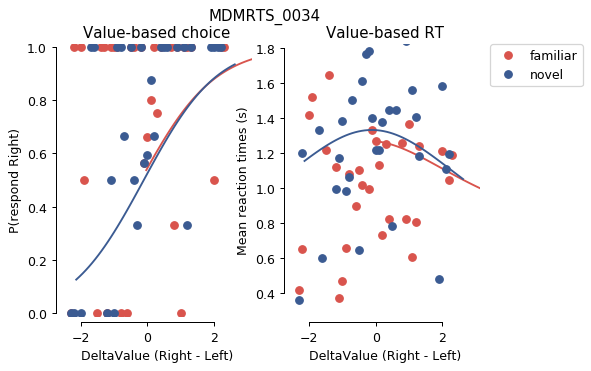

subject: MDMRTS_0035
familiar foodfoptsub: 1083.4780760941162
familiar thetafoodsub: [1.08142736 0.52105657 0.35789421 0.0198191  0.71458444 0.04378426
 0.1981501  0.         1.31621174]
novel foodfoptsub: 1097.4277949414327
novel thetafoodsub: [ 1.41297855  0.54871585  2.83400039  0.05516217  0.69524673  0.04563535
 -0.03889319  0.          1.29081834]


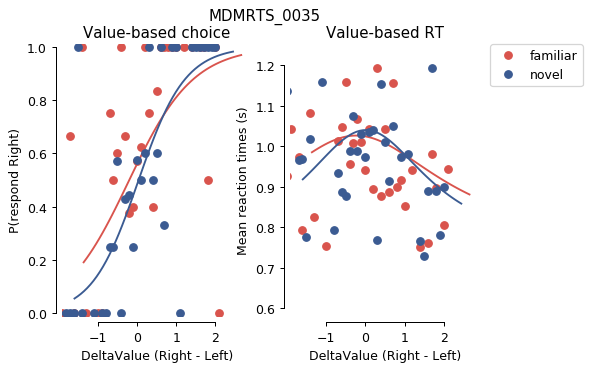

subject: MDMRTS_0036
familiar foodfoptsub: 1096.2790481973109
familiar thetafoodsub: [ 0.9560999   0.5         2.73626806  0.67679783  0.63539417  0.07387089
 -0.2         0.          0.85925417]
novel foodfoptsub: 1105.5402767029643
novel thetafoodsub: [ 0.93046577  0.5         3.38453349  0.8139571   0.62609345  0.07438758
 -0.2         0.          0.88015012]


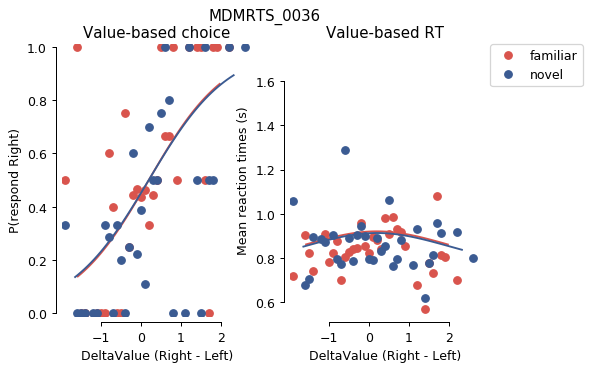

subject: MDMRTS_0037
familiar foodfoptsub: 1122.2778497370632
familiar thetafoodsub: [ 0.89047696  0.55607516  1.81544746  0.02109206  0.72436169  0.05445243
 -0.19980087  0.          0.70498053]
novel foodfoptsub: 1115.7185891111865
novel thetafoodsub: [ 1.41092411  0.60345304  1.40572947  0.55400442  0.65932474  0.00175712
 -0.16990816  0.          1.37418029]


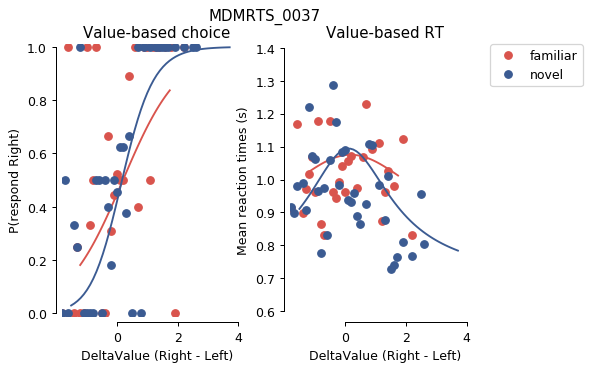

subject: MDMRTS_0038
familiar foodfoptsub: 1126.476314368652
familiar thetafoodsub: [ 0.71010292  0.8464362   0.35104561  0.34660445  0.61911138  0.00461426
 -0.06130717  0.          1.44497096]
novel foodfoptsub: 2.7311486405778854e-14
novel thetafoodsub: [ 1.44506509e+00  1.10408051e+00  1.55530438e-02  4.65270085e-01
  5.57000001e-01  1.55035100e-09 -1.03133082e-01  0.00000000e+00
  7.44383897e-01]


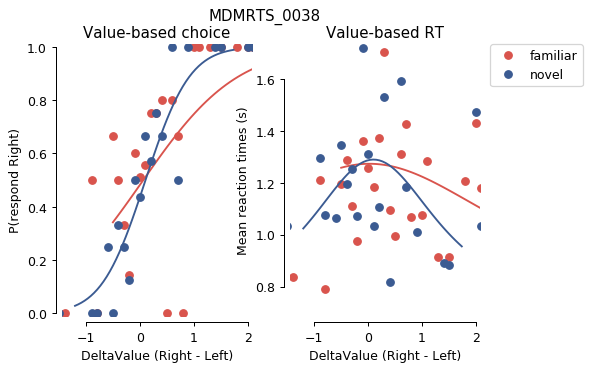

subject: MDMRTS_0039
familiar foodfoptsub: 1155.5710516252898
familiar thetafoodsub: [0.52090755 0.69314473 1.01505334 0.01306594 0.60023433 0.02622888
 0.12915083 0.         1.36490951]
novel foodfoptsub: 1173.5481330957575
novel thetafoodsub: [ 1.08219005  0.74376244  2.71437561  0.88950002  0.55402049  0.04233632
 -0.16070606  0.          0.7192369 ]


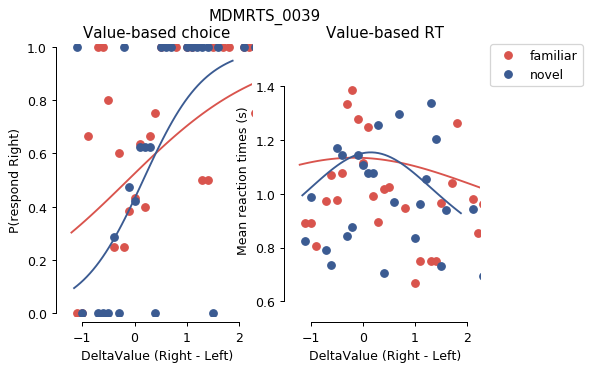

subject: MDMRTS_0041
familiar foodfoptsub: 1118.411013063123
familiar thetafoodsub: [0.77493638 0.7182854  0.1272108  0.67593225 0.53012784 0.0040093
 0.1855683  0.         1.0814609 ]
novel foodfoptsub: 1122.5166690113754
novel thetafoodsub: [1.32312728e+00 5.00000000e-01 2.78655441e+00 5.97814746e-03
 7.28861014e-01 1.11918942e-01 8.47126178e-04 0.00000000e+00
 9.43213920e-01]


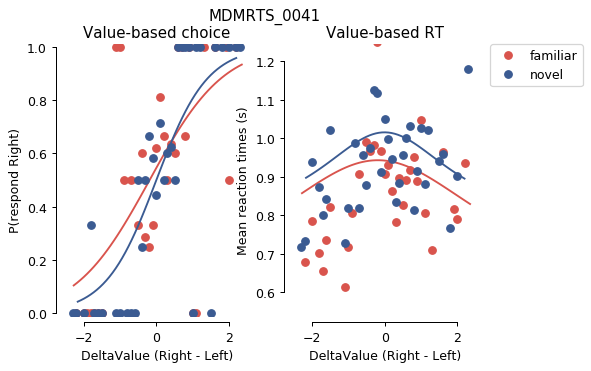

subject: MDMRTS_0043
familiar foodfoptsub: 636.4311946380334
familiar thetafoodsub: [ 0.76129169  0.68332453  0.26346316  0.68322178  0.30052392  0.04707609
 -0.19753551  0.          0.25527801]
novel foodfoptsub: 489.30797193056554
novel thetafoodsub: [1.35596405 0.55261336 2.72967501 0.43418656 0.36404783 0.07612233
 0.2        0.         0.68733953]


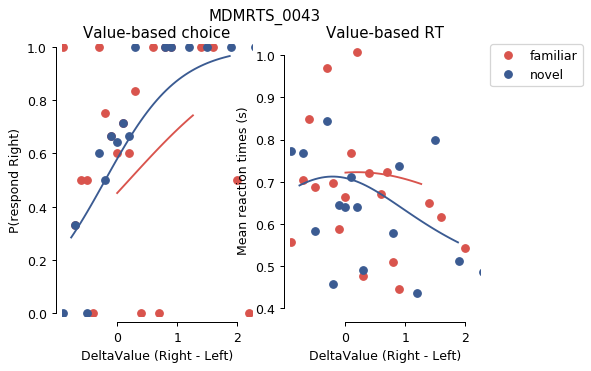

subject: MDMRTS_0044
familiar foodfoptsub: 1059.8164917561498
familiar thetafoodsub: [1.05162635 0.5        0.69006042 0.00524212 0.44274355 0.13806848
 0.2        0.         1.21165123]
novel foodfoptsub: 1019.644763182442
novel thetafoodsub: [0.68118843 0.50032034 0.05697849 0.07657028 0.44712173 0.14340749
 0.19985694 0.         1.43034474]


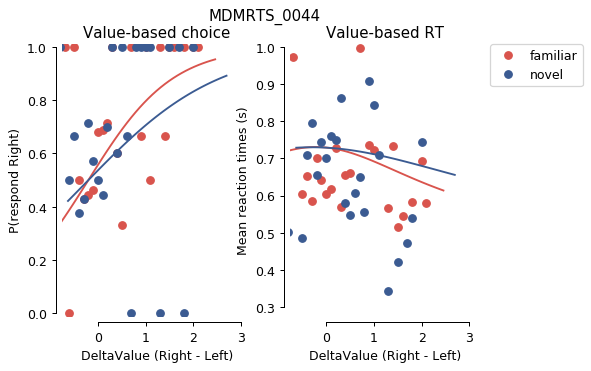

subject: MDMRTS_0045
familiar foodfoptsub: 620.0427425762731
familiar thetafoodsub: [ 4.58989055e-01  2.55789091e+00  9.69430753e-05  8.17402650e-01
  3.34260472e-01  3.81010258e-03 -9.74755491e-02  0.00000000e+00
  8.82423585e-01]
novel foodfoptsub: 588.9303876846246
novel thetafoodsub: [0.27170065 1.1551974  0.77480017 0.65679198 0.61623812 0.04209752
 0.13299746 0.         0.33084518]


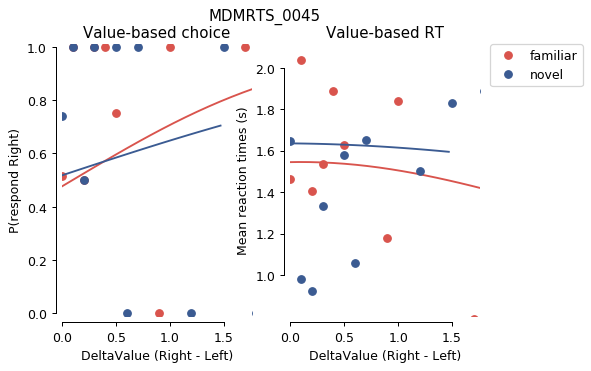

subject: MDMRTS_0048
familiar foodfoptsub: 3.108624468950439e-14
familiar thetafoodsub: [8.90781623e-01 5.01419229e-01 1.58386142e+00 3.55872782e-04
 6.18000000e-01 3.53778496e-09 1.98982593e-01 0.00000000e+00
 1.19342600e+00]
novel foodfoptsub: 1093.3793404319551
novel thetafoodsub: [0.88942311 0.50012494 0.33350131 0.60588114 0.62255253 0.05464794
 0.12123724 0.         1.33601765]


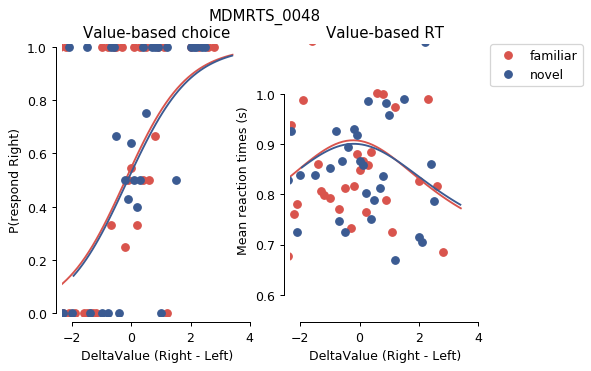

subject: MDMRTS_0050
familiar foodfoptsub: 2.997602166487923e-14
familiar thetafoodsub: [ 2.41304453e-01  8.35403609e-01  1.66276524e+00  2.49662424e+00
  4.61000000e-01  1.82786001e-09 -6.92250063e-02  0.00000000e+00
  7.89156827e-01]
novel foodfoptsub: 1143.4118485314095
novel thetafoodsub: [ 1.00650611  0.87107493  1.77968875  1.51070734  0.52603437  0.00358819
 -0.01188382  0.          1.00055407]


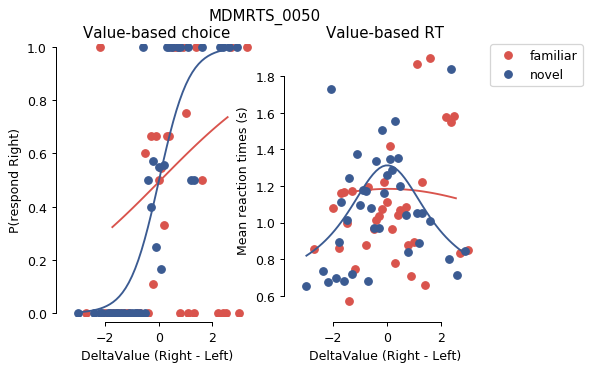

subject: MDMRTS_0051
familiar foodfoptsub: 1162.1459357013562
familiar thetafoodsub: [1.16174252e+00 6.66193512e-01 9.36706680e-01 5.94695985e-05
 5.72933314e-01 7.17855160e-02 3.00707630e-02 0.00000000e+00
 1.23482557e+00]
novel foodfoptsub: 1149.0924637359499
novel thetafoodsub: [1.11081542 0.57440207 1.16148414 0.00225573 0.67601154 0.10451042
 0.13306561 0.         1.0518558 ]


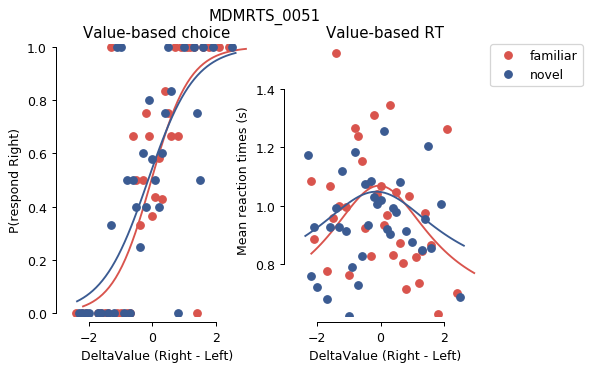

subject: MDMRTS_0052
familiar foodfoptsub: 1185.1824159581686
familiar thetafoodsub: [1.28889957 0.85237966 1.08425085 0.80497675 0.75359948 0.0738698
 0.19356209 0.         0.89644585]
novel foodfoptsub: 1211.7589732109177
novel thetafoodsub: [ 0.97481751  0.83285333  1.25836221  0.41107905  0.71793687  0.09744609
 -0.07052532  0.          0.68000184]


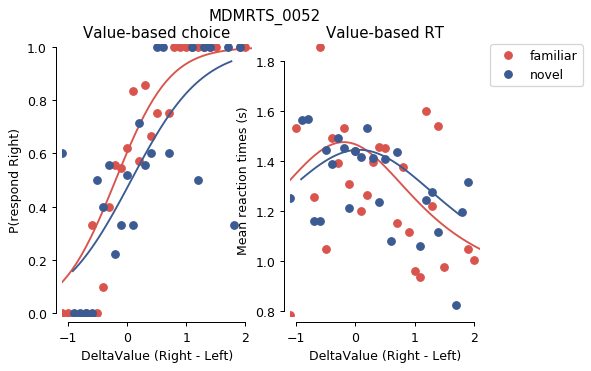

subject: MDMRTS_0053
familiar foodfoptsub: 1215.762232772065
familiar thetafoodsub: [ 0.83827685  1.03130149  0.83924738  0.68931836  0.59845465  0.04600952
 -0.08655514  0.          0.82380604]
novel foodfoptsub: 1191.091526186079
novel thetafoodsub: [ 1.01060218  1.15098804  0.34032175  0.48338094  0.53065685  0.02507304
 -0.0262317   0.          0.80518458]


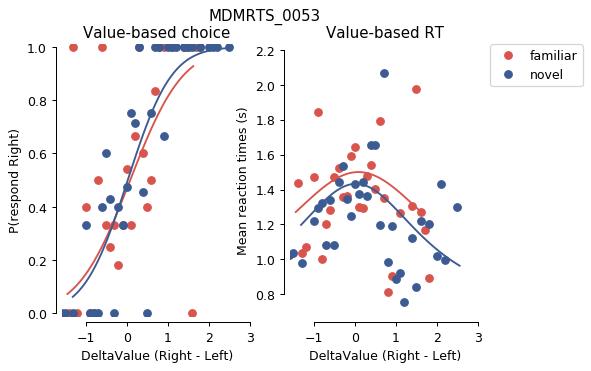

subject: MDMRTS_0054
familiar foodfoptsub: 1146.1100106311449
familiar thetafoodsub: [2.62382365 1.18966804 0.17186595 0.53019838 0.86533738 0.12705499
 0.0124589  0.         1.04079693]
novel foodfoptsub: 1152.5247952136483
novel thetafoodsub: [2.9974905  0.81334394 1.32794327 0.09855312 1.00137198 0.14769417
 0.05868212 0.         0.94520344]


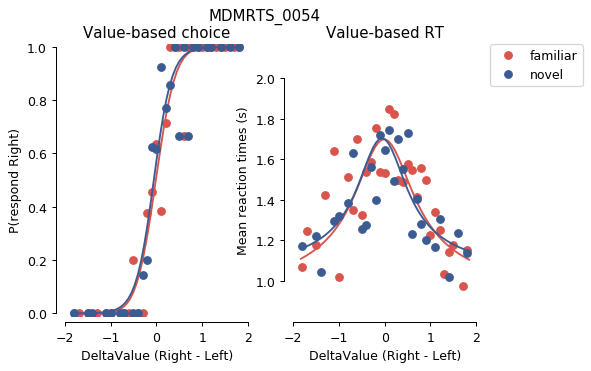

subject: MDMRTS_0055
familiar foodfoptsub: 1155.5951972091343
familiar thetafoodsub: [0.779143   0.64580319 0.66971314 0.01200849 0.57284065 0.04326162
 0.14412928 0.         1.35959752]
novel foodfoptsub: 1161.0810638153573
novel thetafoodsub: [0.4179755  0.56987794 3.453219   0.52481563 0.63519162 0.11738777
 0.2        0.         1.33578541]


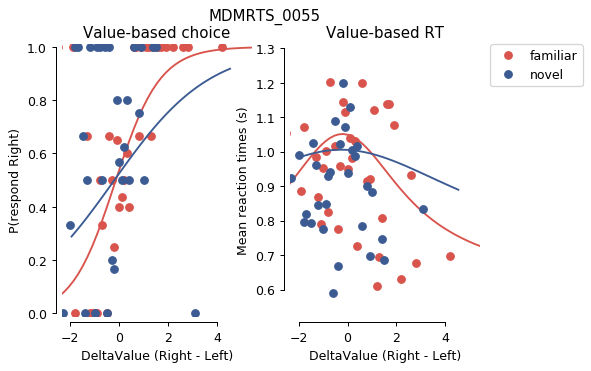

subject: MDMRTS_0061
familiar foodfoptsub: 1185.1424700468006
familiar thetafoodsub: [ 1.28637626  0.84465891  1.51226218  0.76031181  0.70225278  0.09861388
 -0.09868405  0.          0.66775563]
novel foodfoptsub: 2.953193245502917e-14
novel thetafoodsub: [1.20623337e+00 1.02962342e+00 8.41014292e-01 4.90678832e-01
 6.57499999e-01 1.16494874e-09 2.13124907e-03 0.00000000e+00
 1.22030505e+00]


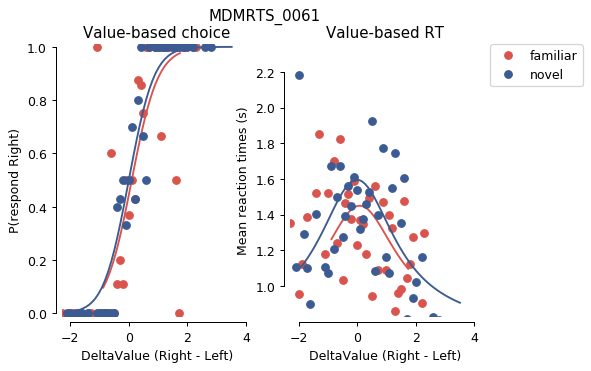

subject: MDMRTS_0062
familiar foodfoptsub: 1185.6130451769136
familiar thetafoodsub: [ 1.42594047  1.76607285  0.50636587  0.71672261  0.30139692  0.01458237
 -0.10217414  0.          0.75023481]
novel foodfoptsub: 1201.7642816339112
novel thetafoodsub: [ 1.55193737  1.19657364  0.67296602  0.81757505  0.69961331  0.19956694
 -0.02158378  0.          0.9076184 ]


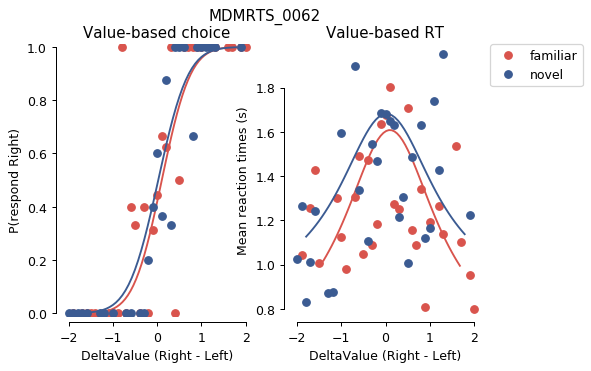

subject: MDMRTS_0064
familiar foodfoptsub: 1151.1427532672724
familiar thetafoodsub: [1.0592217  0.5948183  1.10119839 1.22084634 0.6153532  0.08872799
 0.1404646  0.         0.79432337]
novel foodfoptsub: 1163.4834293616236
novel thetafoodsub: [0.53069365 0.60339319 1.05801402 0.37145467 0.58939748 0.09061587
 0.19899125 0.         1.12752156]


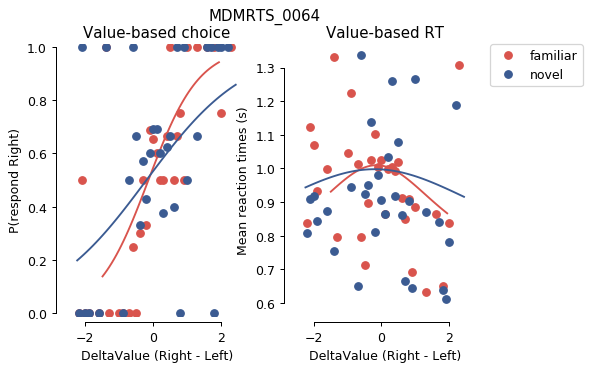

subject: MDMRTS_0065
familiar foodfoptsub: 1056.3468032735182
familiar thetafoodsub: [0.87937509 0.53394775 1.25004393 0.12523423 0.6261561  0.06579239
 0.19329563 0.         1.00513279]
novel foodfoptsub: 1070.4637993890287
novel thetafoodsub: [0.90356699 0.53157119 0.42755613 0.52163542 0.63936728 0.07818863
 0.19895303 0.         1.20806045]


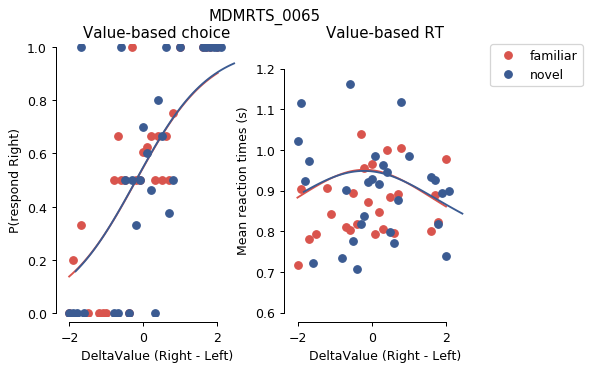

subject: MDMRTS_0066
familiar foodfoptsub: 1122.861331728067
familiar thetafoodsub: [ 1.04944882  0.55256825  2.93662533  1.88901171  0.5586266   0.06228329
 -0.2         0.          0.97159325]
novel foodfoptsub: 1097.867426846878
novel thetafoodsub: [ 1.37573463  0.54500254  2.95592418  0.08572991  0.55822342  0.05249298
 -0.0254132   0.          0.78198405]


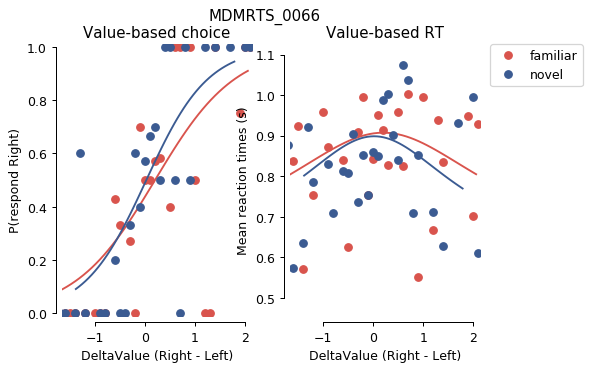

subject: MDMRTS_0068
familiar foodfoptsub: 1142.4821780092384
familiar thetafoodsub: [0.72797858 0.63633428 0.19328093 0.26773819 0.57636135 0.0805944
 0.11996739 0.         1.26445348]
novel foodfoptsub: 1160.3266665522533
novel thetafoodsub: [0.46207527 0.65291191 1.3437114  0.09730715 0.5136567  0.04150834
 0.12684335 0.         0.99693732]


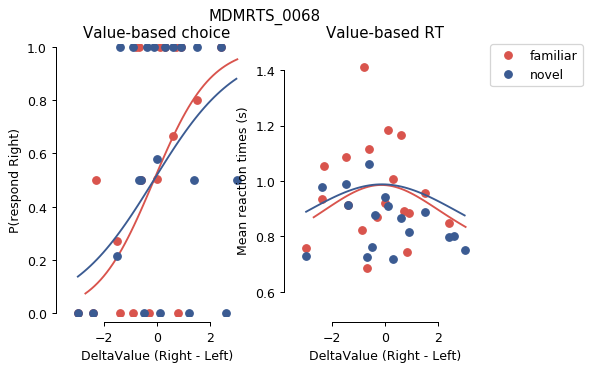

subject: MDMRTS_0069
familiar foodfoptsub: 1194.7956491347575
familiar thetafoodsub: [ 0.81976058  2.10471611  0.24038803  0.68033869  0.50606634  0.07187689
 -0.01397742  0.          0.97955551]
novel foodfoptsub: 1186.8176550676046
novel thetafoodsub: [ 1.01084299  2.25593381  0.19293527  0.7920548   0.55129331  0.15821774
 -0.14965691  0.          0.7615312 ]


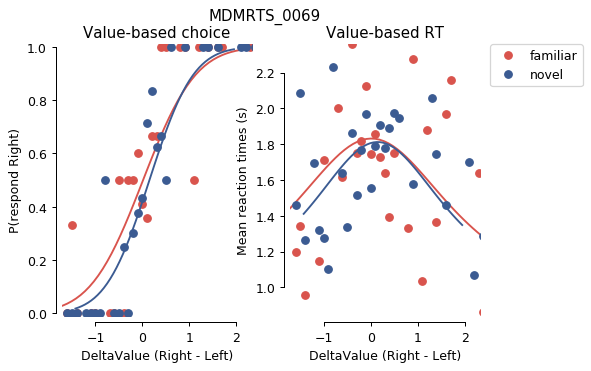

subject: MDMRTS_0070
familiar foodfoptsub: 1111.809730266004
familiar thetafoodsub: [ 0.23640837  0.71338002  1.55171018  0.07205925  0.48229406  0.08158475
 -0.19104734  0.          1.47007019]
novel foodfoptsub: 1011.5787827191456
novel thetafoodsub: [ 0.82205652  0.67705559  1.70748351  0.19856783  0.46934934  0.11305495
 -0.19953187  0.          0.66654536]


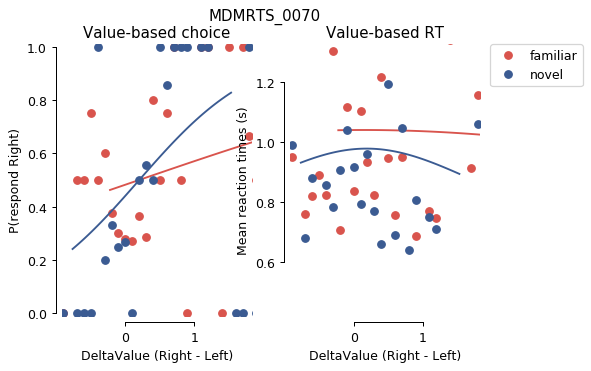

subject: MDMRTS_0071
familiar foodfoptsub: 1158.2290422164156
familiar thetafoodsub: [ 1.35353670e+00  6.96721950e-01  8.33013497e-01  7.42155623e-05
  7.46813199e-01  1.20271970e-01 -2.00000000e-01  0.00000000e+00
  8.11379888e-01]
novel foodfoptsub: 1144.5957866532472
novel thetafoodsub: [ 1.41930479  0.65793138  3.19065578  0.18635252  0.77596761  0.11846498
 -0.1542971   0.          1.25724276]


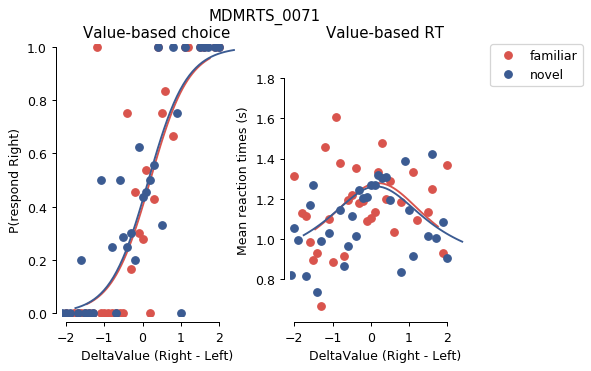

subject: MDMRTS_0072
familiar foodfoptsub: 1218.0309965893398
familiar thetafoodsub: [0.83881017 0.89305881 0.72468032 0.12733448 0.5519796  0.06194424
 0.15164643 0.         0.67098721]
novel foodfoptsub: 3.0420110874729296e-14
novel thetafoodsub: [5.71649952e-01 1.02567877e+00 4.66401548e-01 2.06020764e-01
 4.36500001e-01 7.20443438e-10 1.99852249e-01 0.00000000e+00
 7.18704321e-01]


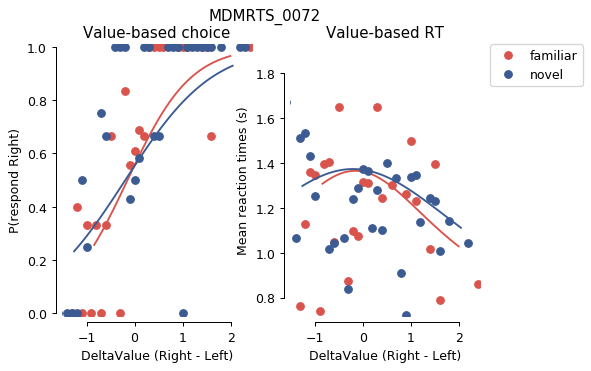

subject: MDMRTS_0074
familiar foodfoptsub: 1069.2272805520588
familiar thetafoodsub: [ 1.03506155  0.5         1.15348183  1.25094571  0.54552011  0.02372273
 -0.2         0.          0.88466775]
novel foodfoptsub: 1047.0621492470257
novel thetafoodsub: [ 1.53173429  0.5         3.38256969  1.88711357  0.5579258   0.02612773
 -0.2         0.          0.91818216]


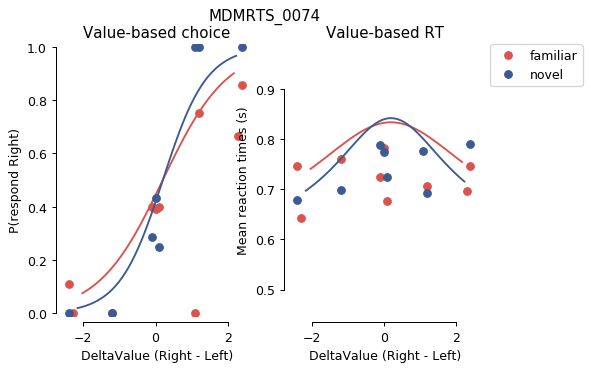

subject: MDMRTS_0075
familiar foodfoptsub: 1135.9783623246456
familiar thetafoodsub: [1.10880494 0.64987349 1.4463955  0.68365268 0.58259512 0.04357603
 0.016433   0.         0.81704778]
novel foodfoptsub: 1121.7639322993177
novel thetafoodsub: [ 0.80791743  0.66902496  3.02816925  0.88745542  0.59164565  0.0448387
 -0.2         0.          0.86861593]


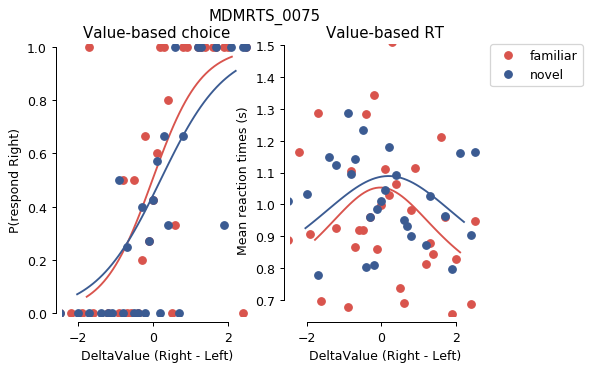

subject: MDMRTS_0077
familiar foodfoptsub: 1110.1788921670482
familiar thetafoodsub: [ 1.42710036  0.53727609  2.44925636  0.1203814   0.64353409  0.05793754
 -0.2         0.          0.75827393]
novel foodfoptsub: 1128.2653285301817
novel thetafoodsub: [ 1.23577149  0.53339206  1.14823072  1.1447863   0.66244696  0.08094609
 -0.19923277  0.          0.61950193]


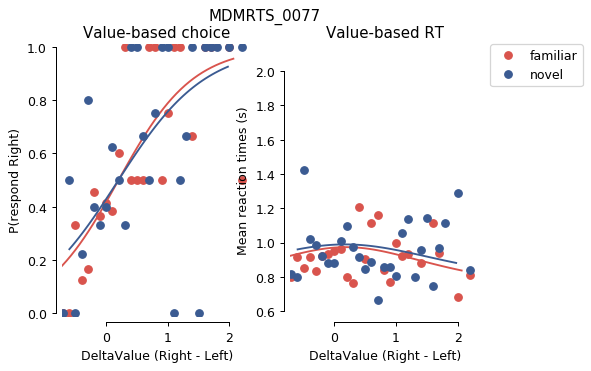

subject: MDMRTS_0081
familiar foodfoptsub: 1113.6496549504354
familiar thetafoodsub: [ 1.99197098  0.52213891  1.84066779  0.01159581  0.91335361  0.2
 -0.16903458  0.          0.70193085]
novel foodfoptsub: 1115.7612320516841
novel thetafoodsub: [ 0.95024461  0.56957247  1.54612522  1.13355167  0.93284872  0.17244352
 -0.04792576  0.          0.91798632]


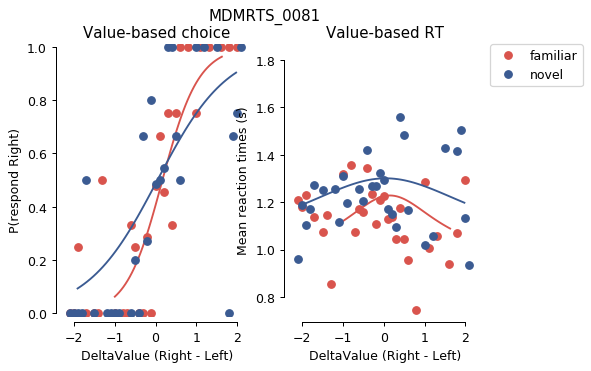

subject: MDMRTS_0082
familiar foodfoptsub: 1170.5553506918104
familiar thetafoodsub: [ 0.92088524  2.44150474  0.14751841  1.1347566   0.32449565  0.04617093
 -0.05035239  0.          0.85398326]
novel foodfoptsub: 1180.3258910709733
novel thetafoodsub: [1.3980706  0.83652434 0.08630296 0.21771458 0.79197282 0.12527969
 0.01331601 0.         0.98310857]


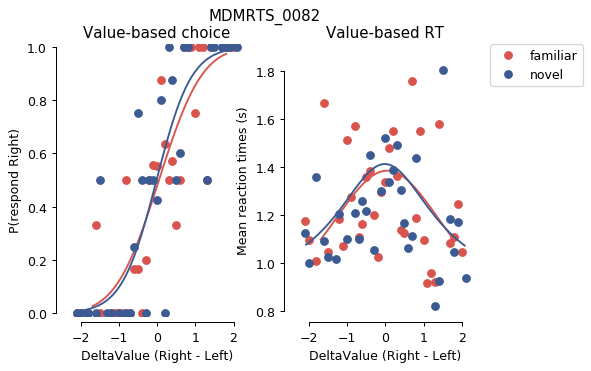

subject: MDMRTS_0083
familiar foodfoptsub: 1159.1714299958603
familiar thetafoodsub: [ 6.65683260e-01  5.31967322e-01  1.11472762e+00  1.56265771e-04
  8.10615457e-01  1.59662006e-01 -2.00000000e-01  0.00000000e+00
  1.29676543e+00]
novel foodfoptsub: 1139.0916204382513
novel thetafoodsub: [ 1.7196231   0.5         3.31776682  0.26185681  0.86289549  0.15276655
 -0.2         0.          1.33103795]


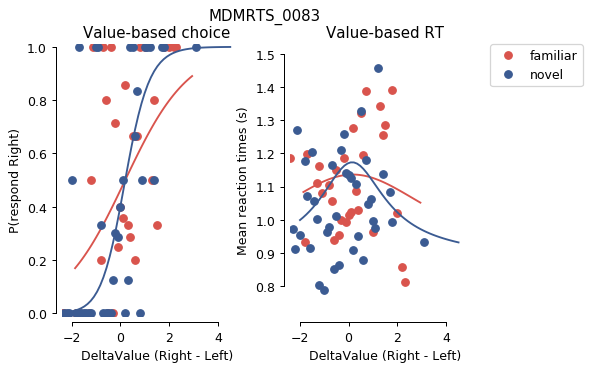

subject: MDMRTS_0084
familiar foodfoptsub: 1152.2928368135522
familiar thetafoodsub: [ 0.62557585  1.43819084  0.28119696  0.87434781  0.60307296  0.06405657
 -0.16658051  0.          0.76909547]
novel foodfoptsub: 2.953193245502917e-14
novel thetafoodsub: [1.00430153e+00 8.22296016e-01 9.65982830e-01 2.39141057e-01
 8.96500000e-01 2.26888852e-10 1.68247220e-01 0.00000000e+00
 1.01735867e+00]


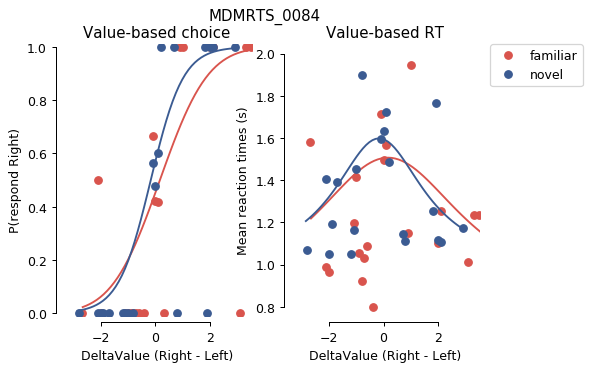

subject: MDMRTS_0085
familiar foodfoptsub: 1145.7753616324521
familiar thetafoodsub: [1.24144365 0.6305496  0.94568239 0.00672399 0.57277343 0.11038776
 0.04497225 0.         1.14736918]
novel foodfoptsub: 1143.7704449033213
novel thetafoodsub: [ 1.38840793  0.66345473  2.08686364  0.03109721  0.52974861  0.04225901
 -0.02785908  0.          0.64767572]


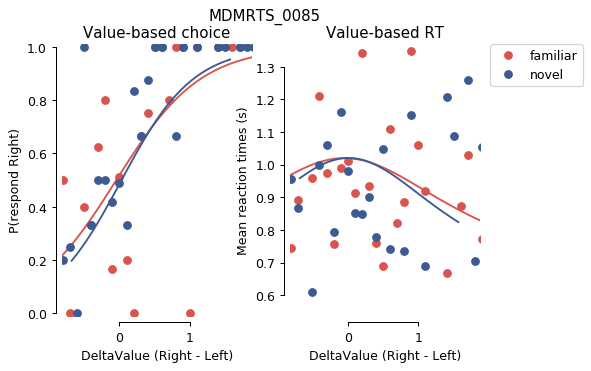

subject: MDMRTS_0086
familiar foodfoptsub: 1159.7535945621817
familiar thetafoodsub: [1.28438126 1.13694754 0.59436083 1.08678496 0.508684   0.01128146
 0.07417963 0.         0.90868395]
novel foodfoptsub: 1183.0007479851831
novel thetafoodsub: [ 1.24118936  1.13832315  0.15247683  0.63175517  0.61456191  0.10740453
 -0.01018048  0.          1.25204197]


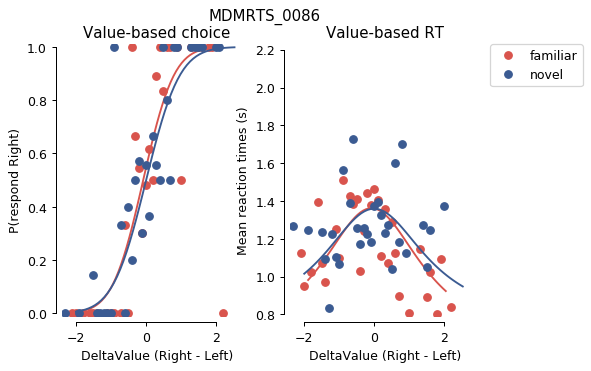

subject: MDMRTS_0087
familiar foodfoptsub: 1141.5607861944075
familiar thetafoodsub: [2.33144894 2.29349805 0.33291812 1.54820448 0.63835224 0.19753811
 0.03818179 0.         0.8853561 ]
novel foodfoptsub: 1150.3852702107279
novel thetafoodsub: [2.09085912 1.13717416 0.42111671 0.7648445  0.84780903 0.06321482
 0.02709876 0.         0.73638572]


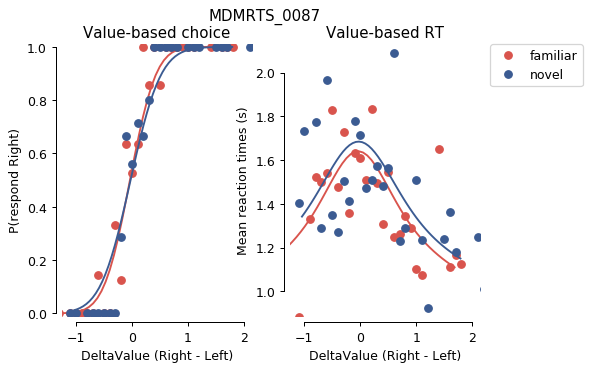

subject: MDMRTS_0090
familiar foodfoptsub: 1156.1341742258667
familiar thetafoodsub: [ 1.1325572   0.79907058  0.93762054  0.63172828  0.82897187  0.09293271
 -0.04805293  0.          0.91481838]
novel foodfoptsub: 1158.3740184665658
novel thetafoodsub: [0.85091381 1.12395364 0.62612613 0.65203451 0.68703162 0.0064304
 0.18340567 0.         1.16121894]


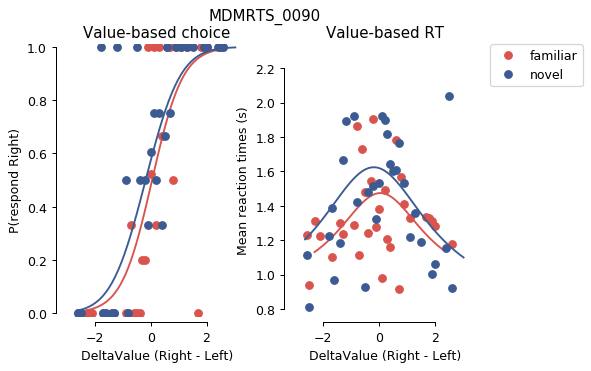

subject: MDMRTS_0092
familiar foodfoptsub: 2.930988785010414e-14
familiar thetafoodsub: [8.34925089e-01 7.74936786e-01 2.76958612e+00 8.22040399e-04
 5.09000000e-01 3.78170728e-10 1.19695576e-01 0.00000000e+00
 1.30126326e+00]
novel foodfoptsub: 1165.2260839057221
novel thetafoodsub: [1.05483194 0.78460862 1.03098373 0.00191759 0.55856716 0.08071173
 0.0069878  0.         1.15923172]


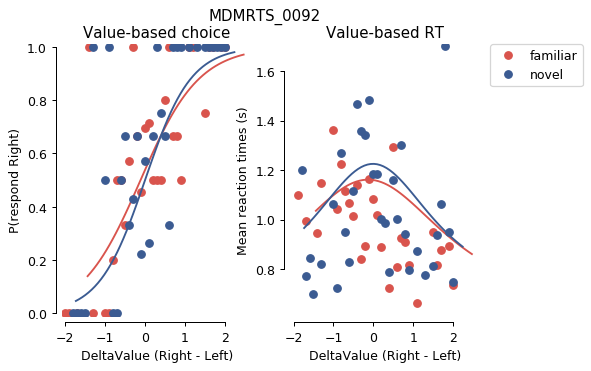

subject: MDMRTS_0093
familiar foodfoptsub: 1128.516955726766
familiar thetafoodsub: [1.4085381  0.5        1.33386788 0.49878323 0.84311649 0.13175943
 0.2        0.         0.77998946]
novel foodfoptsub: 1131.0163883554978
novel thetafoodsub: [ 1.38875802  0.5         2.601231    0.02743348  0.87639331  0.14552609
 -0.2         0.          1.24028165]


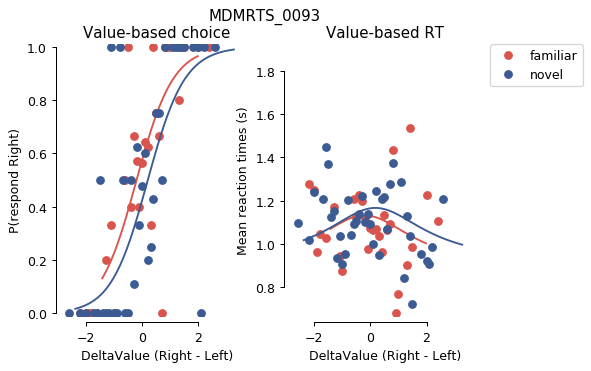

subject: MDMRTS_0095
familiar foodfoptsub: 1233.1745981071629
familiar thetafoodsub: [ 8.00629557e-01  9.13375470e-01  1.56190156e+00  2.40834505e-04
  6.72202904e-01  1.04870853e-01 -6.53725774e-02  0.00000000e+00
  1.07258120e+00]
novel foodfoptsub: 1218.6998265419716
novel thetafoodsub: [ 1.23709091  0.84613066  2.40803965  0.00971158  0.77002019  0.14095996
 -0.13806758  0.          0.8158747 ]


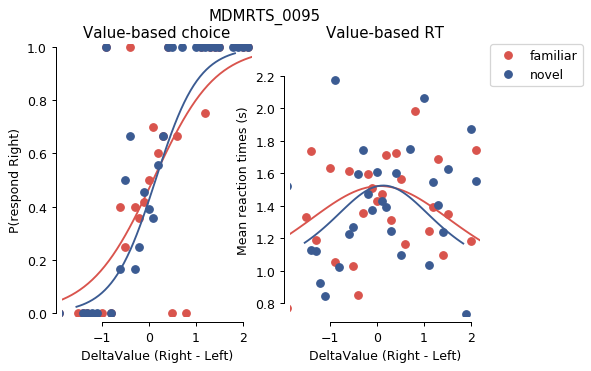

subject: MDMRTS_0096
familiar foodfoptsub: 1160.1288327089846
familiar thetafoodsub: [ 1.69283494  0.69126587  1.47862864  0.04626177  0.75557224  0.09863631
 -0.08780628  0.          1.13905874]
novel foodfoptsub: 1154.9003028723178
novel thetafoodsub: [ 2.06444501e+00  6.78872874e-01  2.70437387e+00  8.58259249e-04
  7.51936968e-01  1.16728130e-01 -1.51080171e-01  0.00000000e+00
  7.92448696e-01]


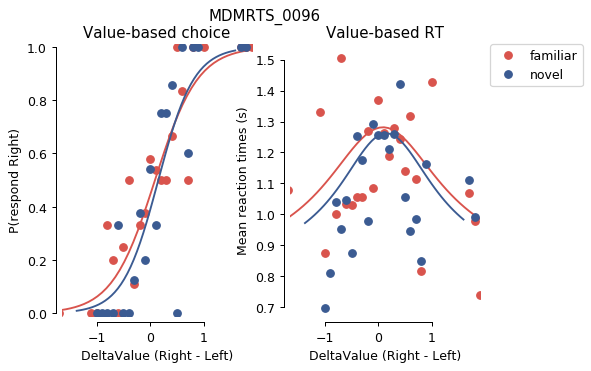

subject: MDMRTS_0097
familiar foodfoptsub: 1126.2689090933202
familiar thetafoodsub: [8.97707143e-01 6.09318953e-01 2.90970990e+00 5.14011356e-02
 4.98845237e-01 4.44471159e-04 4.65716123e-02 0.00000000e+00
 1.00923141e+00]
novel foodfoptsub: 1137.7716861913373
novel thetafoodsub: [0.95684743 0.61368786 0.68343171 0.02331922 0.51899016 0.0370485
 0.15009188 0.         0.96664273]


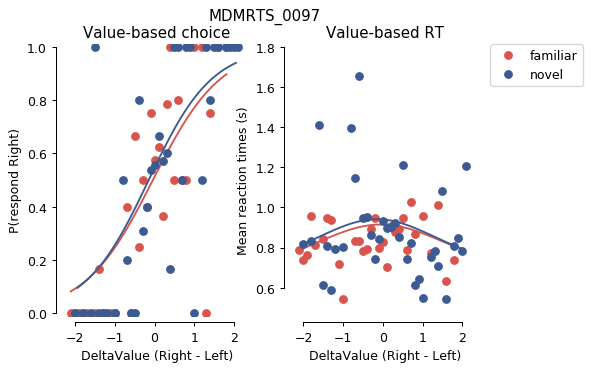

subject: MDMRTS_0099
familiar foodfoptsub: 1115.361367191921
familiar thetafoodsub: [1.73630858 0.50496246 0.87523757 0.05538275 0.60929043 0.09230115
 0.0716159  0.         0.67980721]
novel foodfoptsub: 1109.156628821572
novel thetafoodsub: [1.68467444 0.57006429 1.51165814 0.02120967 0.58083675 0.05584282
 0.07675067 0.         0.95401532]


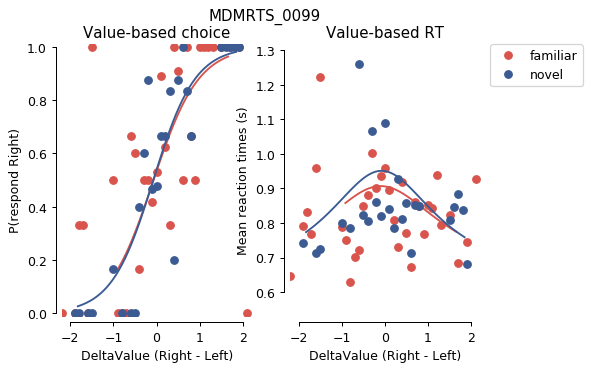

subject: MDMRTS_0100
familiar foodfoptsub: 1046.417956385515
familiar thetafoodsub: [ 2.55399267  0.5         1.37009412  0.15822563  0.57949044  0.05131896
 -0.17887755  0.          0.85079544]
novel foodfoptsub: 1061.7693222324249
novel thetafoodsub: [ 1.72234019  0.5         2.5423907   0.04736215  0.57068275  0.05837883
 -0.19300603  0.          1.05753734]


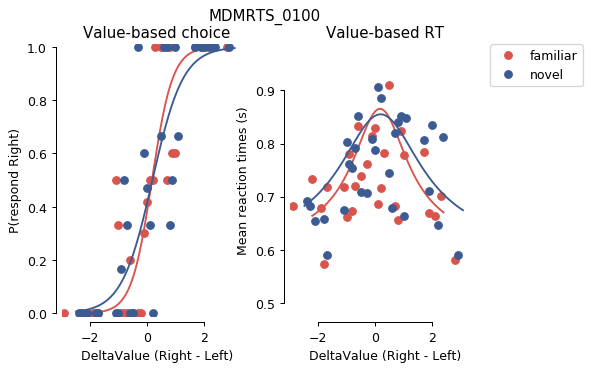

subject: MDMRTS_0104
familiar foodfoptsub: 1135.2139900445484
familiar thetafoodsub: [0.90249742 0.55304692 1.48632539 2.76304212 0.5993069  0.09747915
 0.19025735 0.         1.34010515]
novel foodfoptsub: 1127.5761458721674
novel thetafoodsub: [0.89798263 0.58752677 2.1995408  2.91925345 0.56446312 0.04889147
 0.18870674 0.         0.79124055]


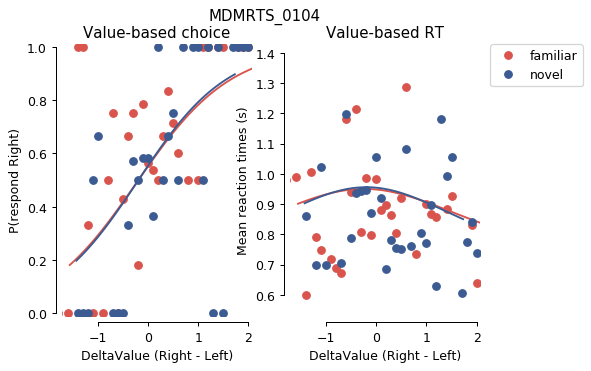

subject: MDMRTS_0106
familiar foodfoptsub: 1184.5216581844738
familiar thetafoodsub: [0.62405323 0.68665809 0.34837082 0.55995155 0.99235767 0.16520214
 0.19949923 0.         1.2816996 ]
novel foodfoptsub: 1187.0042122334728
novel thetafoodsub: [ 0.90198212  0.96495164  0.20141959  0.57454605  0.82044617  0.09720884
 -0.15946982  0.          0.98512379]


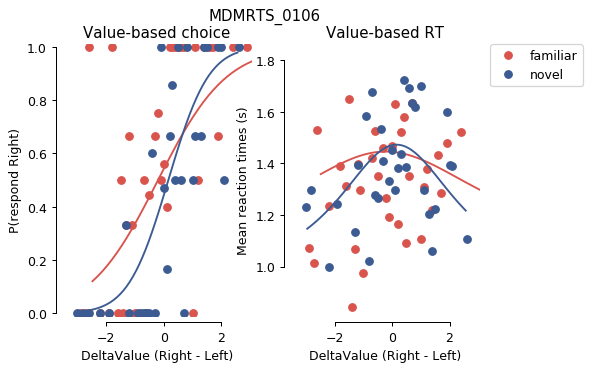

subject: MDMRTS_0108
familiar foodfoptsub: 1158.9459209467122
familiar thetafoodsub: [ 1.63347558  0.74064994  0.04454159  0.25640314  0.95355783  0.18920542
 -0.12030187  0.          1.24770727]
novel foodfoptsub: 1140.2227446202426
novel thetafoodsub: [ 1.1208144   0.73744651  0.47603502  0.27112105  0.91169719  0.14312833
 -0.1145648   0.          0.96481156]


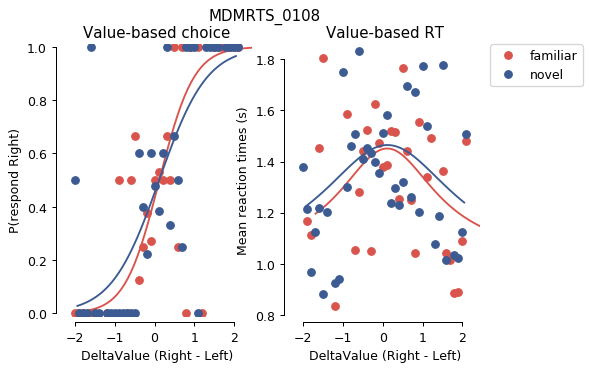

subject: MDMRTS_0109
familiar foodfoptsub: 1149.1520801041395
familiar thetafoodsub: [1.12235309 0.639723   0.86117275 0.00622916 0.62444807 0.07760127
 0.19805217 0.         0.83391244]
novel foodfoptsub: 1118.5857900856379
novel thetafoodsub: [1.15471695 0.55253182 2.58553753 0.44140011 0.70662135 0.12140127
 0.0537277  0.         0.69067885]


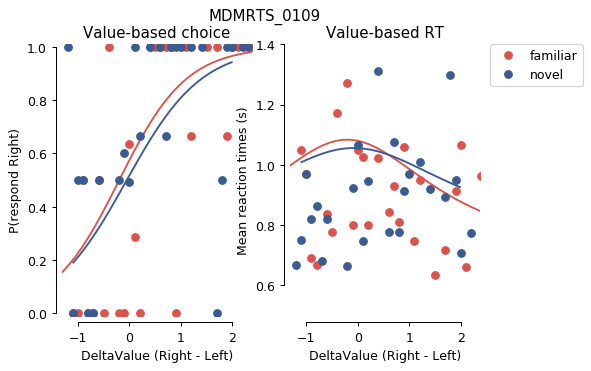

subject: MDMRTS_0111
familiar foodfoptsub: 1173.1449603590495
familiar thetafoodsub: [1.69918704 0.79751201 0.30480064 0.17079508 0.84085431 0.14950216
 0.02316613 0.         0.69121525]
novel foodfoptsub: 1190.8910330014837
novel thetafoodsub: [ 1.10960299  0.88879015  0.31152731  0.37941502  0.87784008  0.11108553
 -0.16090736  0.          0.7008274 ]


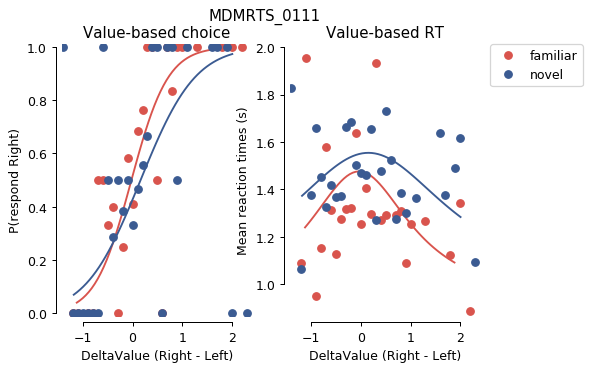

subject: MDMRTS_0112
familiar foodfoptsub: 1087.9707435909836
familiar thetafoodsub: [ 2.34392292  0.5         0.96970757  0.03353415  0.65245028  0.07268031
 -0.05128735  0.          1.36419753]
novel foodfoptsub: 1097.012397270673
novel thetafoodsub: [1.35744167 0.5        1.18517114 0.018406   0.63955974 0.05807534
 0.07043362 0.         0.87477001]


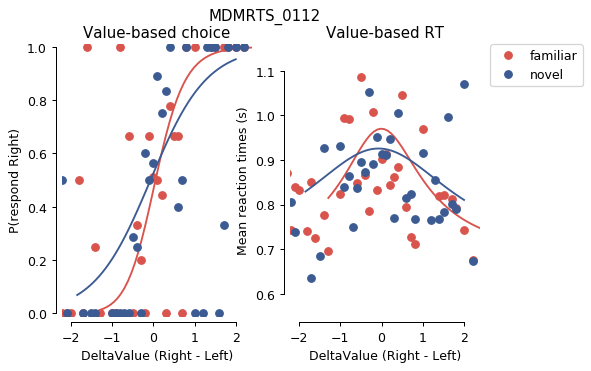

subject: MDMRTS_0113
familiar foodfoptsub: 1088.8017078375117
familiar thetafoodsub: [ 1.14225065  0.50001533  1.08041941  0.11331064  0.55374343  0.04511986
 -0.07844523  0.          0.76280295]
novel foodfoptsub: 1073.6086552281217
novel thetafoodsub: [ 1.06899419  0.50002468  0.21688153  0.04659723  0.5360318   0.03688222
 -0.07826342  0.          0.98973883]


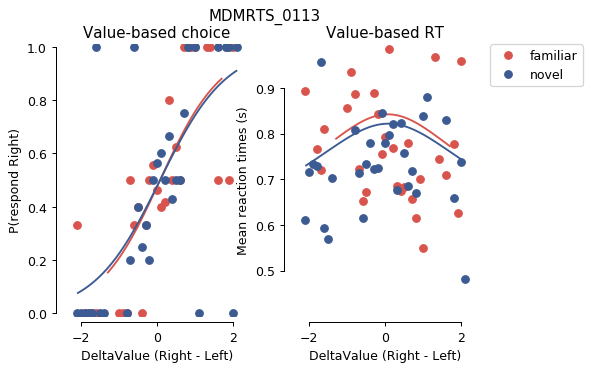

subject: MDMRTS_0114
familiar foodfoptsub: 1035.999818463063
familiar thetafoodsub: [1.07977785e+00 5.07374962e-01 1.26974646e-02 6.09331974e-01
 5.00747927e-01 5.82572806e-04 1.24105470e-01 0.00000000e+00
 1.41285784e+00]
novel foodfoptsub: 1055.7579903032579
novel thetafoodsub: [1.8243285  0.5        3.28165259 0.04898522 0.53800374 0.03214312
 0.2        0.         0.82991535]


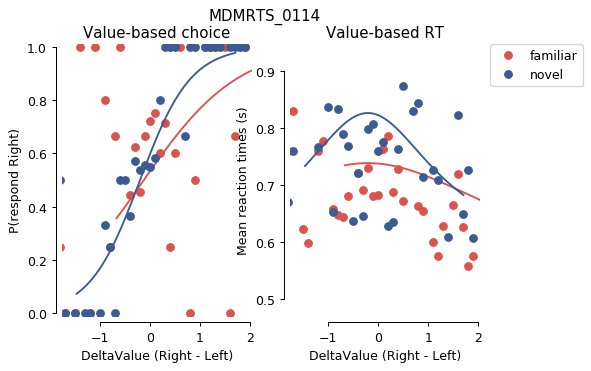

subject: MDMRTS_0117
familiar foodfoptsub: 1113.4575178983798
familiar thetafoodsub: [ 0.86039986  0.57051856  2.76583181  0.02546922  0.70793426  0.06397342
 -0.2         0.          0.95344978]
novel foodfoptsub: 1156.5692341500442
novel thetafoodsub: [ 0.64820222  0.62151304  2.14890003  0.97033134  0.66156971  0.05686284
 -0.2         0.          1.00940893]


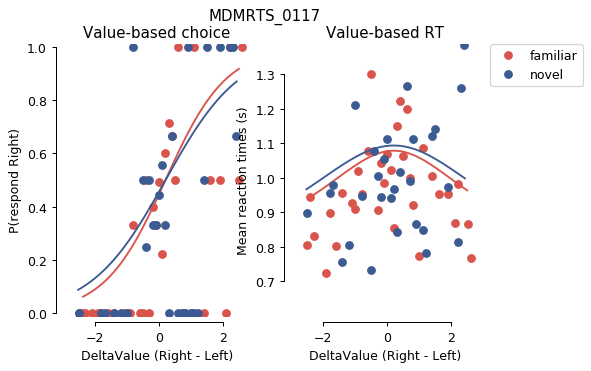

subject: MDMRTS_0118
familiar foodfoptsub: 1198.0087581503042
familiar thetafoodsub: [ 0.74720939  0.8866634   0.96788195  0.27075187  0.58888242  0.01093883
 -0.19968892  0.          0.99763167]
novel foodfoptsub: 1142.1444470840802
novel thetafoodsub: [ 0.92328677  0.71315459  1.51165191  0.94555122  0.71748012  0.11811276
 -0.19693214  0.          0.88856913]


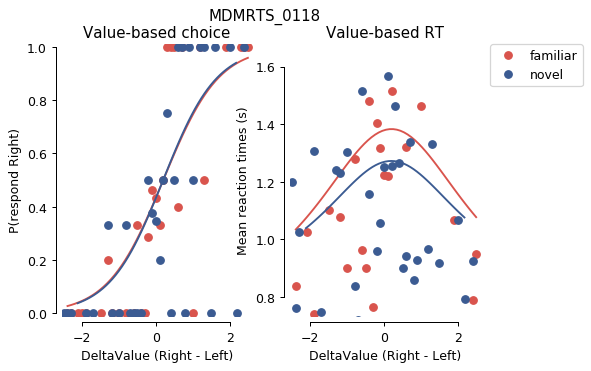

subject: MDMRTS_0119
familiar foodfoptsub: 901.106846981209
familiar thetafoodsub: [1.25194576 0.5        1.71191699 1.03057511 0.64674388 0.06688847
 0.2        0.         0.78750808]
novel foodfoptsub: 930.6577514615788
novel thetafoodsub: [1.76223968 0.50033825 0.03565846 0.20051058 0.6721068  0.07137212
 0.19953792 0.         0.71264491]


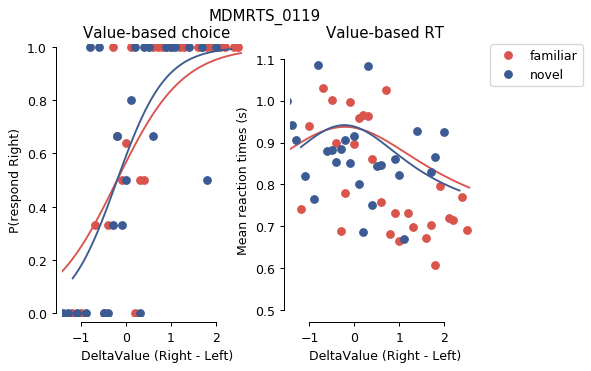

subject: MDMRTS_0120
familiar foodfoptsub: 1143.8299780648802
familiar thetafoodsub: [0.93886142 0.65352048 0.30772114 0.34405053 0.62520984 0.03398071
 0.17436805 0.         0.64513243]
novel foodfoptsub: 3.108624468950439e-14
novel thetafoodsub: [1.64928331e+00 6.62309145e-01 2.24868819e+00 3.99547008e-03
 6.21500000e-01 6.89379476e-10 4.91899063e-02 0.00000000e+00
 1.36011253e+00]


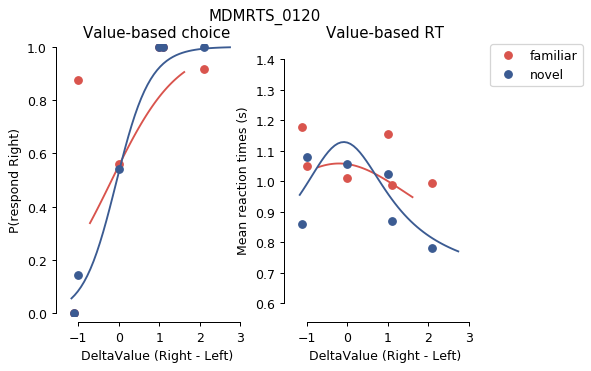

subject: MDMRTS_0121
familiar foodfoptsub: 1082.0650491002802
familiar thetafoodsub: [1.14582996 0.77215936 0.17098625 1.57002419 0.580483   0.00308688
 0.18181742 0.         1.47307703]
novel foodfoptsub: 1102.5996787275965
novel thetafoodsub: [3.36677862e+00 5.00000000e-01 4.65706077e-01 3.11801580e-03
 7.53273815e-01 9.43597143e-02 1.10582072e-01 0.00000000e+00
 1.45048625e+00]


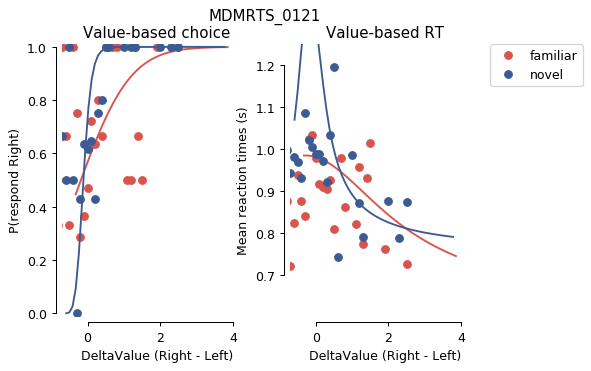

subject: MDMRTS_0122
familiar foodfoptsub: 1135.451743138858
familiar thetafoodsub: [ 1.49529234  0.63609746  0.16477166  0.40379155  0.8689452   0.10812525
 -0.02928021  0.          1.03579308]
novel foodfoptsub: 1139.9153694653328
novel thetafoodsub: [ 2.31109511  0.60004059  0.50640518  0.02343944  0.95498556  0.13342413
 -0.11122457  0.          1.13919625]


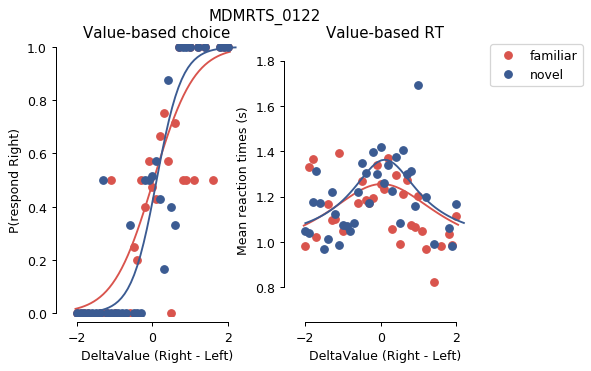

subject: MDMRTS_0125
familiar foodfoptsub: 1153.658836902272
familiar thetafoodsub: [ 1.51673622  0.71296552  2.31964593  0.00255953  0.71279095  0.04978519
 -0.12199832  0.          0.91427738]
novel foodfoptsub: 1156.1560135574
novel thetafoodsub: [1.10255261 0.62737506 1.70838226 0.00271023 0.78932963 0.08876456
 0.02836503 0.         0.77015136]


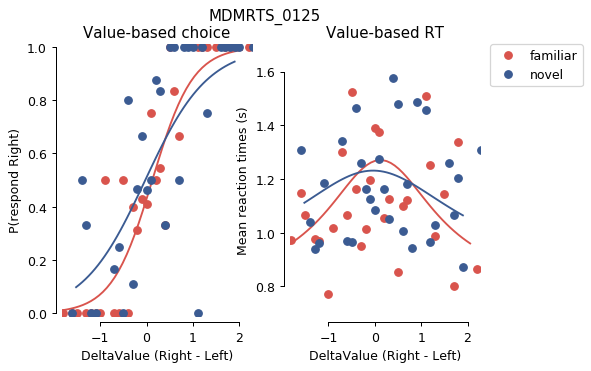

subject: MDMRTS_0127
familiar foodfoptsub: 1172.4796601579778
familiar thetafoodsub: [ 1.30524582  0.67273418  0.47018591  0.00558657  0.78171931  0.1190615
 -0.14686262  0.          1.10004321]
novel foodfoptsub: 1172.6499699679644
novel thetafoodsub: [ 1.33445511  0.52869911  3.21778149  0.0301171   0.87418588  0.2
 -0.19621106  0.          0.98188235]


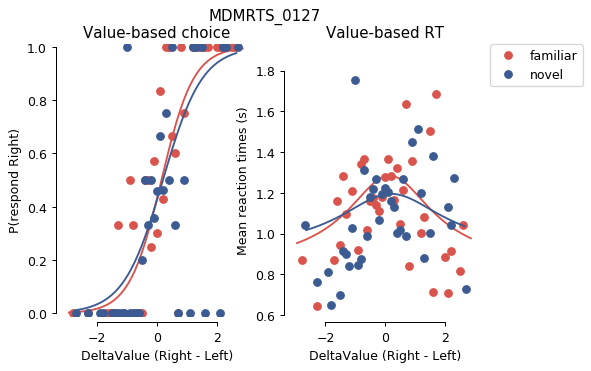

subject: MDMRTS_0128
familiar foodfoptsub: 979.6626626003432
familiar thetafoodsub: [ 0.2         0.58531021  2.76545785  0.61316048  0.3         0.06099988
 -0.2         0.          1.499     ]
novel foodfoptsub: 911.8293537554299
novel thetafoodsub: [0.20000002 0.7311692  1.14682819 0.70256326 0.30000105 0.08552551
 0.1498302  0.         1.49896724]


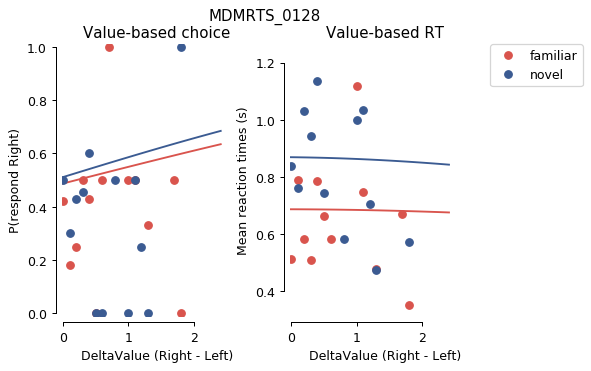

subject: MDMRTS_0129
familiar foodfoptsub: 1178.139574928943
familiar thetafoodsub: [0.20000774 0.69164615 0.64008315 1.74652097 0.8133713  0.10565399
 0.16692354 0.         0.82459924]
novel foodfoptsub: 1175.3969065617125
novel thetafoodsub: [1.10811344 0.67204863 0.29821407 0.01038876 0.79939223 0.08677132
 0.13803698 0.         1.18496738]


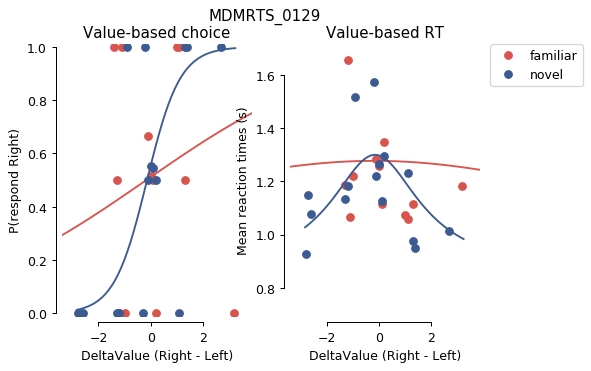

subject: MDMRTS_0130
familiar foodfoptsub: 1119.9002234459506
familiar thetafoodsub: [1.64040631 0.51759766 1.27671724 0.03067979 0.88300558 0.10487991
 0.03612597 0.         0.96814667]
novel foodfoptsub: 1128.4957756055512
novel thetafoodsub: [ 1.33532562  0.51061906  1.64864227  0.16819223  0.88304199  0.10057552
 -0.09235525  0.          0.77431704]


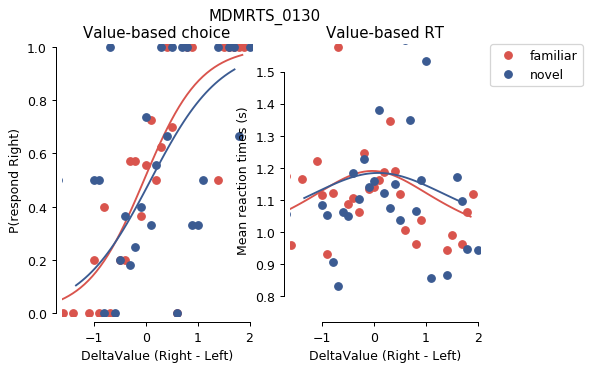

subject: MDMRTS_0131
familiar foodfoptsub: 1200.2001064418928
familiar thetafoodsub: [0.39300399 0.79846316 0.55501373 0.52784909 0.82009597 0.11881935
 0.11893388 0.         1.26414628]
novel foodfoptsub: 1167.1148153720333
novel thetafoodsub: [5.45635776e-01 7.08001908e-01 1.01548347e-01 8.02781475e-09
 8.20682715e-01 1.05010639e-01 1.30180962e-01 0.00000000e+00
 1.28762281e+00]


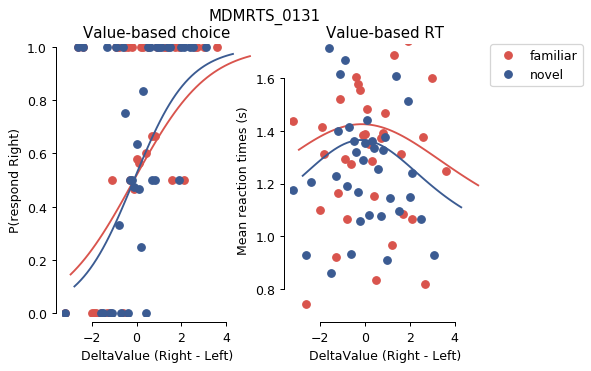

subject: MDMRTS_0132
familiar foodfoptsub: 1176.2742526317677
familiar thetafoodsub: [2.13816248 1.54047673 0.02082061 0.59934808 0.60985503 0.17212951
 0.0450889  0.         0.8124212 ]
novel foodfoptsub: 1166.4986677738475
novel thetafoodsub: [1.62712819 1.77428078 0.34451605 0.78910619 0.43680581 0.02200264
 0.10757737 0.         0.79862662]


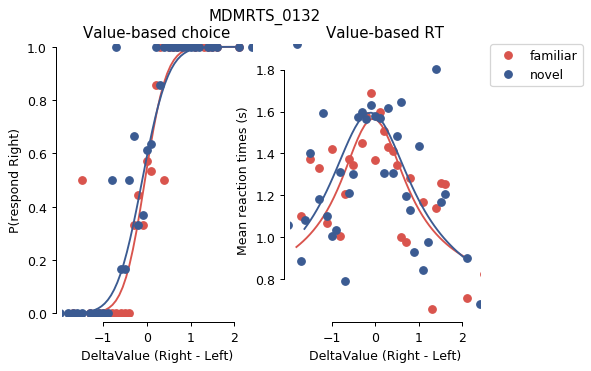

subject: MDMRTS_0133
familiar foodfoptsub: 1174.0322404618134
familiar thetafoodsub: [0.97991205 0.71103746 1.07219822 0.01047351 0.59692859 0.05319756
 0.01796582 0.         1.26979247]
novel foodfoptsub: 1175.2875203682297
novel thetafoodsub: [1.05295758 0.74471839 0.69969924 0.11618567 0.56514776 0.05317798
 0.14376212 0.         0.86324872]


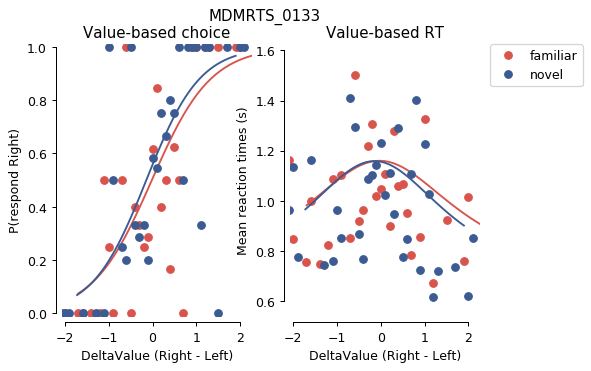

subject: MDMRTS_0134
familiar foodfoptsub: 1096.8050652208867
familiar thetafoodsub: [ 1.96949719  0.69792673  0.34281556  2.56201626  0.94674835  0.12319202
 -0.0816987   0.          0.7378208 ]
novel foodfoptsub: 1120.756818968703
novel thetafoodsub: [ 2.37643201  0.50002115  0.3293959   0.23159092  1.05831211  0.14487063
 -0.06051126  0.          1.30583938]


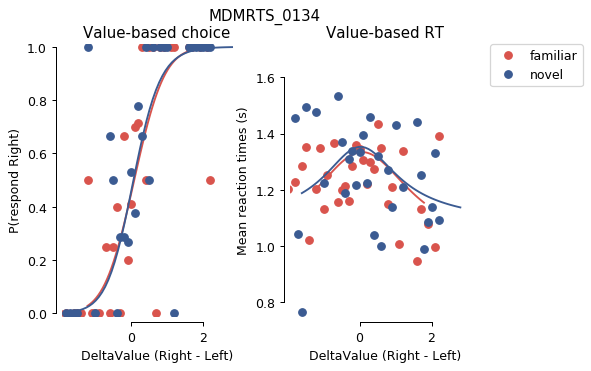

subject: MDMRTS_0135
familiar foodfoptsub: 1068.4209948702155
familiar thetafoodsub: [2.22869128e+00 5.00000000e-01 8.74770846e-01 2.08889361e-04
 5.96482090e-01 7.41926733e-02 1.14871250e-01 0.00000000e+00
 1.06166932e+00]
novel foodfoptsub: 1080.842591021204
novel thetafoodsub: [1.24306925e+00 5.00000000e-01 1.59650367e+00 1.15387082e-03
 5.82029236e-01 6.88133837e-02 1.24851514e-02 0.00000000e+00
 1.15718178e+00]


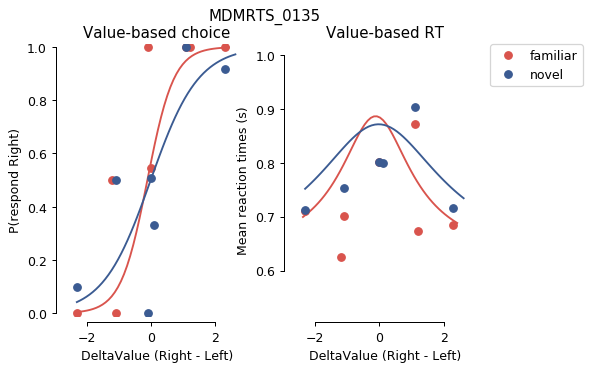

subject: MDMRTS_0137
familiar foodfoptsub: 1132.1888380168523
familiar thetafoodsub: [ 1.64704489  0.59674059  1.19327376  0.77888751  0.85581181  0.17844528
 -0.17015448  0.          0.90482703]
novel foodfoptsub: 1060.9621417067578
novel thetafoodsub: [ 2.52861319  0.56244487  1.68985019  0.20682204  0.87401089  0.18086927
 -0.04327918  0.          0.97178873]


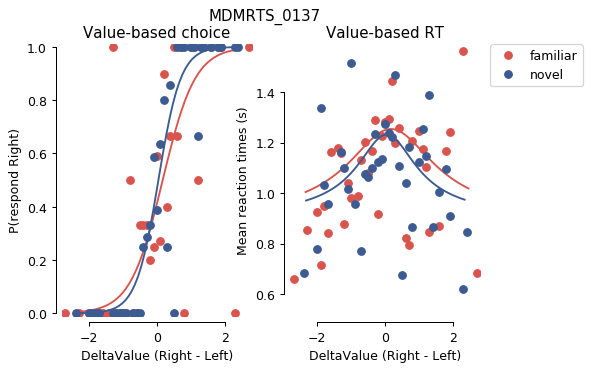

subject: MDMRTS_0139
familiar foodfoptsub: 1173.3563062805379
familiar thetafoodsub: [1.80996122 0.72329544 0.92857763 2.76028161 0.73782586 0.16280136
 0.00900358 0.         0.81769629]
novel foodfoptsub: 1193.8100756077297
novel thetafoodsub: [ 0.76411543  1.02865421  0.37612658  0.62351416  0.50966147  0.00404991
 -0.00878995  0.          0.99177044]


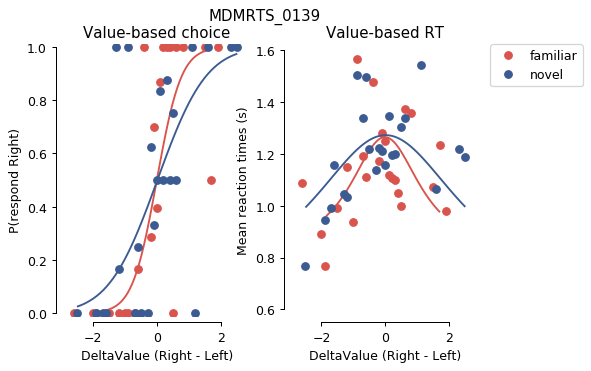

subject: MDMRTS_0140
familiar foodfoptsub: 1008.2119982686047
familiar thetafoodsub: [ 0.64331324  0.5         0.94457669  1.77839925  0.48209127  0.08671558
 -0.17248784  0.          1.26535268]
novel foodfoptsub: 1029.3133766500293
novel thetafoodsub: [0.81848151 0.50035953 0.44625143 0.88052257 0.44879734 0.12760646
 0.10812724 0.         1.02364305]


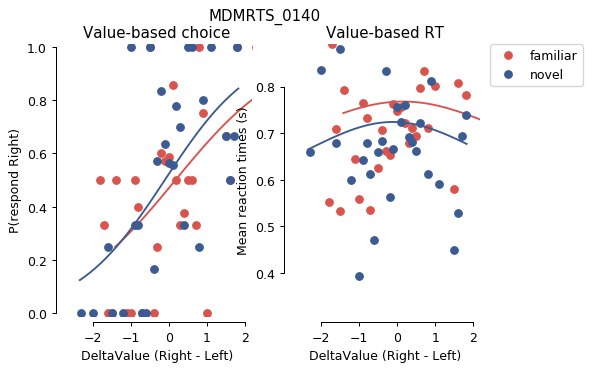

subject: MDMRTS_0143
familiar foodfoptsub: 1051.6001659305339
familiar thetafoodsub: [1.32694928e+00 5.00000000e-01 1.02154630e+00 3.43535629e-02
 4.25461240e-01 4.70062157e-02 9.96301356e-08 0.00000000e+00
 1.22915965e+00]
novel foodfoptsub: 1045.2113241763352
novel thetafoodsub: [ 1.65580149  0.5         1.70880618  0.0859304   0.44372981  0.05029624
 -0.12282868  0.          1.03152945]


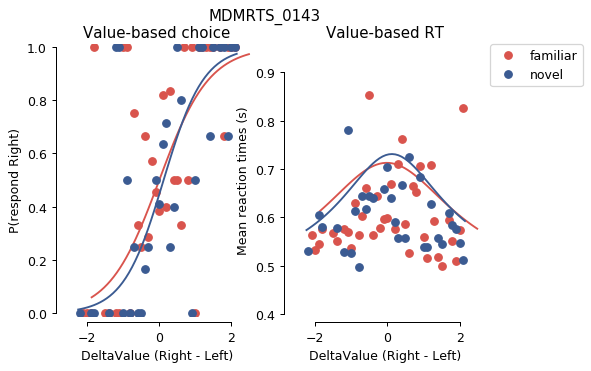

subject: MDMRTS_0144
familiar foodfoptsub: 1130.9731298607453
familiar thetafoodsub: [2.05283796 0.78374232 0.21249356 0.76603689 0.73766332 0.0860303
 0.03073946 0.         1.23354669]
novel foodfoptsub: 1105.7904112999122
novel thetafoodsub: [ 2.67064743  0.51641413  2.69733755  0.68373012  0.92274068  0.11106022
 -0.14043253  0.          1.19600178]


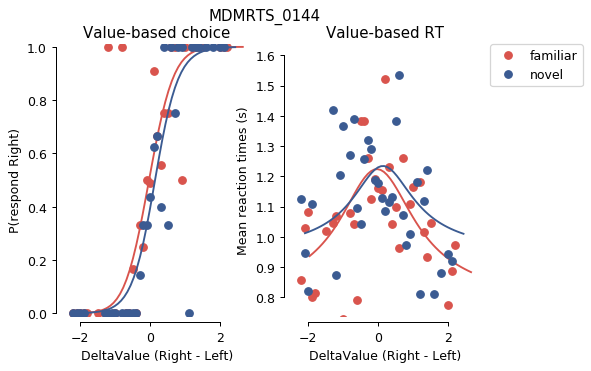

subject: MDMRTS_0146
familiar foodfoptsub: 3.108624468950439e-14
familiar thetafoodsub: [1.59975262e+00 7.17622118e-01 1.32927245e+00 2.65630160e+00
 5.43500000e-01 1.55316326e-10 3.47190011e-02 0.00000000e+00
 7.72642311e-01]
novel foodfoptsub: 1136.6195350094886
novel thetafoodsub: [1.89120263 0.68784833 1.17702714 0.00362775 0.57374533 0.02838139
 0.01369875 0.         1.21535194]


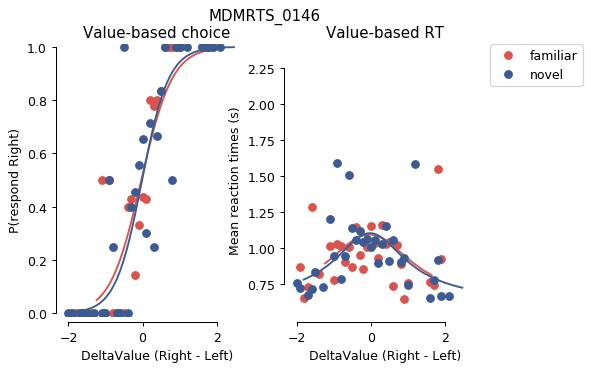

subject: MDMRTS_0147
familiar foodfoptsub: 1039.8019033824144
familiar thetafoodsub: [ 0.96846631  0.50000025  0.98391803  0.42361216  0.54258835  0.03072953
 -0.12110465  0.          1.21992417]
novel foodfoptsub: 1051.3693368728163
novel thetafoodsub: [ 0.90200876  0.5         2.92224565  0.32493584  0.55449392  0.04113976
 -0.16900153  0.          0.94361981]


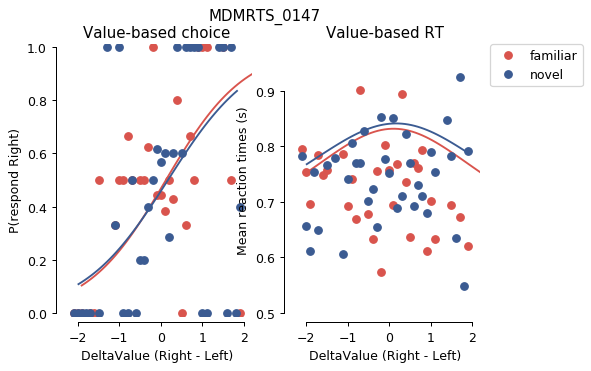

subject: MDMRTS_0149
familiar foodfoptsub: 1093.4790638585343
familiar thetafoodsub: [1.69137502 0.5        1.83938741 0.02367973 0.57782543 0.09549799
 0.02237809 0.         0.71315598]
novel foodfoptsub: 1109.7578433736537
novel thetafoodsub: [1.05443615 0.57198387 1.40219531 1.41787369 0.52160933 0.01413121
 0.13125553 0.         0.81897705]


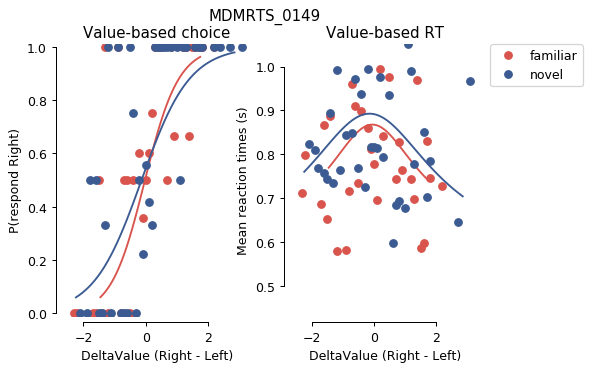

subject: MDMRTS_0150
familiar foodfoptsub: 1103.6905021560474
familiar thetafoodsub: [ 1.63664841e+00  5.54393583e-01  3.10277225e+00  2.96497660e-03
  7.21144231e-01  6.50951605e-02 -2.75406561e-02  0.00000000e+00
  8.87153368e-01]
novel foodfoptsub: 1120.7908110104922
novel thetafoodsub: [ 1.65713998  0.62994358  0.4299582   0.67974349  0.6831656   0.06032023
 -0.16915831  0.          0.95184135]


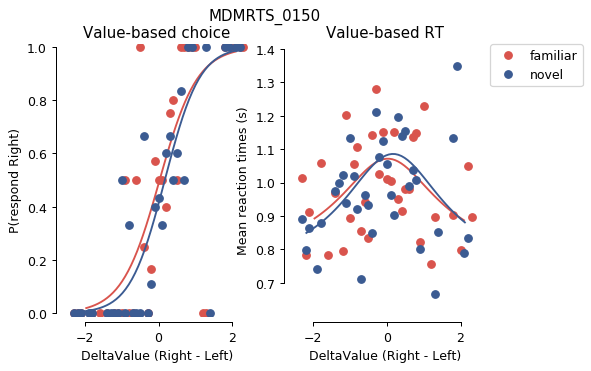

subject: MDMRTS_0151
familiar foodfoptsub: 1160.067321224023
familiar thetafoodsub: [ 1.96881117  1.703007    0.48413619  0.88246839  0.49659151  0.05642195
 -0.03517433  0.          0.81137717]
novel foodfoptsub: 1148.0463306851846
novel thetafoodsub: [2.04209658e+00 2.65909216e+00 1.65428829e-03 1.08829831e+00
 6.29626305e-01 1.95506025e-01 1.37895665e-02 0.00000000e+00
 9.44054936e-01]


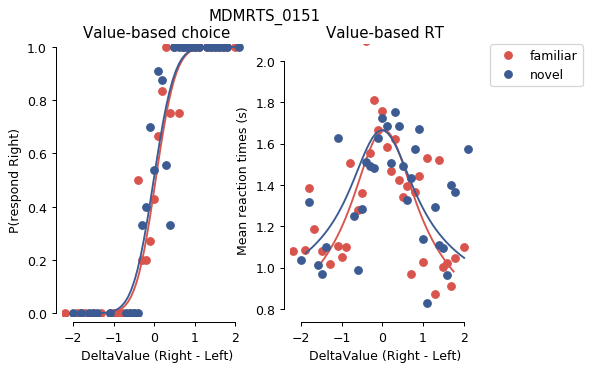

subject: MDMRTS_0152
familiar foodfoptsub: 1119.829882249493
familiar thetafoodsub: [1.0215404  0.53473355 0.19051243 0.52878115 0.65616105 0.09063058
 0.06986406 0.         0.94224963]
novel foodfoptsub: 1124.5907835208839
novel thetafoodsub: [ 1.69819892  0.62302909  1.71813296  0.04959337  0.56571532  0.02411896
 -0.0035584   0.          1.32020792]


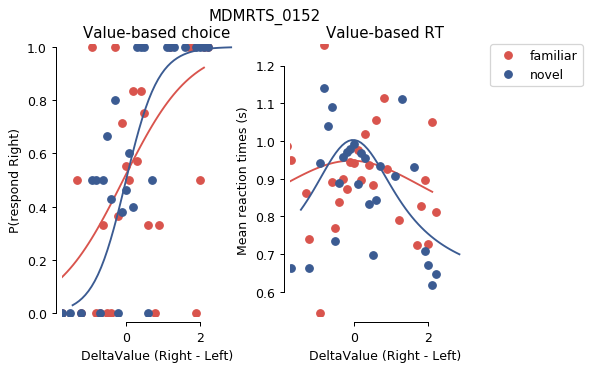

subject: MDMRTS_0153
familiar foodfoptsub: 1196.674368726498
familiar thetafoodsub: [8.26408592e-01 3.38678822e+00 2.18404543e-01 1.04309965e+00
 3.37890660e-01 2.75657765e-03 1.55449981e-01 0.00000000e+00
 8.50576974e-01]
novel foodfoptsub: 1162.9497119637151
novel thetafoodsub: [ 1.6378865   1.01458583  0.70211833  1.54691798  1.03427048  0.11259143
 -0.19999125  0.          0.94393996]


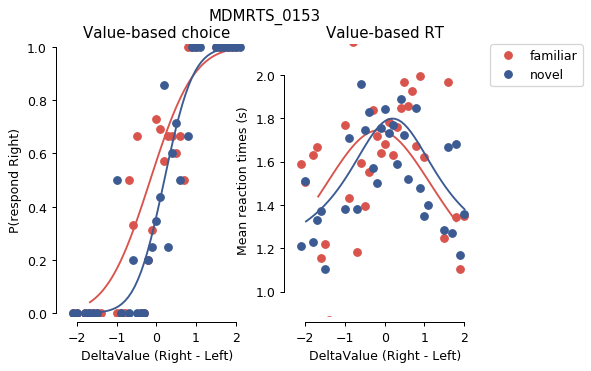

In [35]:
df_sig_pval = get_p_logistic_plots(zscoreRatings=False, printFigs=False)
subjects = df_sig_pval['subjectId'].values
for subject in subjects:
    outputDir = _thisDir + '/output'
    get_fit_data_and_plot(subject, outputDir)

In [13]:
def get_model_params(subjects, type1, type2):
    subs = [] # subject ids for columns
    params = []
    columns = ["subjid", "k", "B0", "Bdel", "B2", "tnd", "tnd_sd", "stim_strength_bias", "y0", "plaw", "fopt"]
    
    names = [type1, type2]
    
    paramsbytype = {}
    
    for i in range(0, len(names)):
        typename = names[i]
        subs = [] # subject ids for columns
        params = []
        for subject in subjects:
            outputDir = _thisDir + '/output'
            subjectDir = outputDir + '/' + subject
            datafoodFile = subjectDir + '/' + subject + '_' + typename + '_datafood.pickle'
            foodfoptFile = subjectDir + '/' + subject + '_' + typename + '_foodfopt.pickle'
            thetafoodFile = subjectDir + '/' + subject + '_' + typename + '_thetafood.pickle'
            if os.path.exists(subjectDir) and os.path.exists(foodfoptFile) and os.path.exists(thetafoodFile):
                with open(datafoodFile, 'rb') as handle:
                    datafoodsub = pickle.load(handle)
                s = subject
                with open(foodfoptFile, 'rb') as handle:
                    foodfoptsub = pickle.load(handle)

                with open(thetafoodFile, 'rb') as handle:
                    thetafoodsub = pickle.load(handle)
                subs.append(s)
                s_params = np.append([s],thetafoodsub)
                s_params = np.append(s_params, foodfoptsub)
                params.append(s_params)
        
        paramsbytype[typename] = params
    
    df1 = pd.DataFrame(data = paramsbytype[type1], columns = columns)
    df2 = pd.DataFrame(data = paramsbytype[type2], columns = columns)
    
    df1 = df1.set_index('subjid')
    df2 = df2.set_index('subjid')
    
    df1_subs = df1.index.values
    df2_subs = df2.index.values
    
    subs = np.intersect1d(df1_subs, df2_subs)
    if len(df1_subs) > len(subs):
        subs = np.setdiff1d(df1_subs, subs)
        df1.drop(subs,axis=0,inplace=True)
    if len(df2_subs) > len(subs):
        subs = np.setdiff1d(df2_subs, subs)
        df2.drop(subs,axis=0,inplace=True)
    
    return df1, df2

In [14]:
def scatter_param_distribution(subjects, type1, type2):
    df1, df2 = get_model_params(subjects, type1, type2)
    
    params = ["k", "B0", "Bdel", "B2", "tnd", "tnd_sd", "stim_strength_bias", "y0", "plaw", "fopt"]
    for param in params:
        fig = plt.figure()
        x = df1[param].values
        y = df2[param].values
        x = x.astype(np.float)
        y = y.astype(np.float)
        plt.scatter(x, y, color = 'grey')
        plt.xlabel(type1)
        plt.ylabel(type2)
        
        minval = max([min(x), min(y)])
        maxval = max([max(x), max(y)])
        
        plt.plot([minval, maxval],[minval, maxval], 'r--', color = 'grey', linewidth = 1)
        
        plt.title(param + ' Scatterplot')
        plt.show()

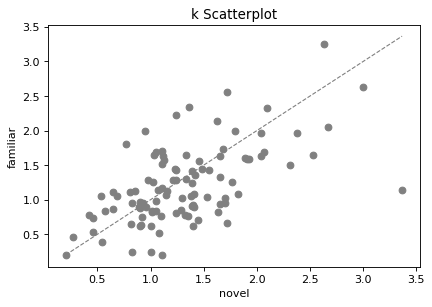

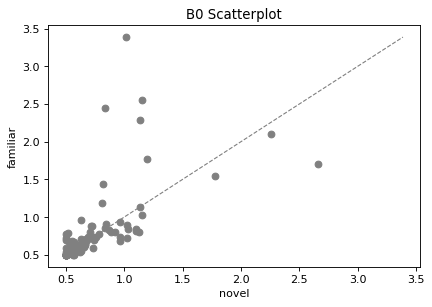

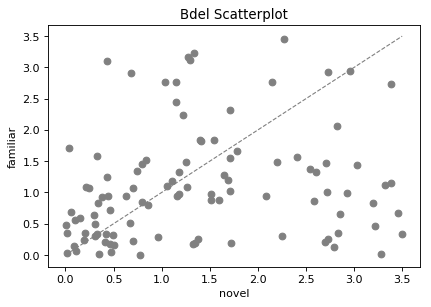

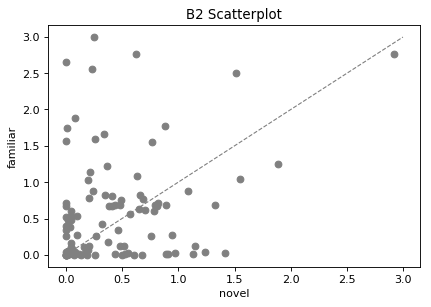

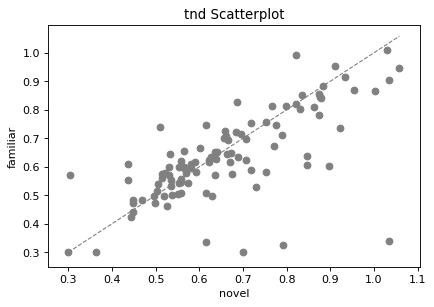

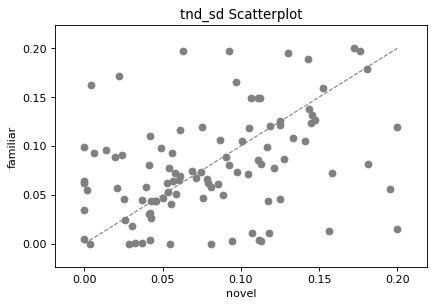

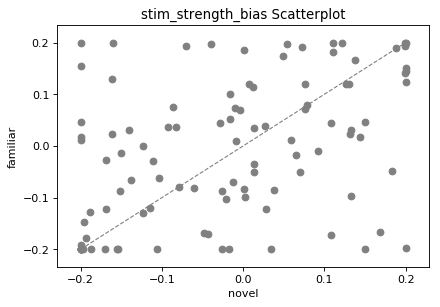

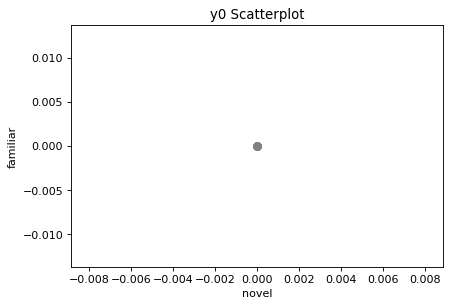

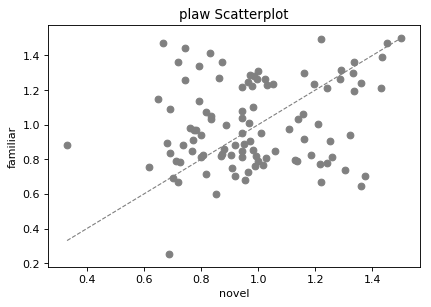

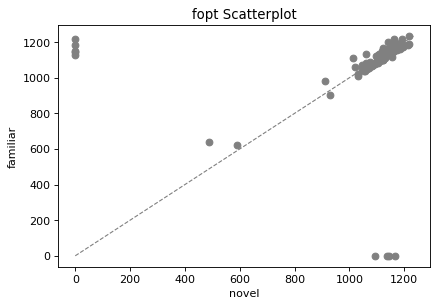

In [16]:
scatter_param_distribution(get_all_subjects(), 'novel', 'familiar')

In [17]:
def plotFoodDataWithFit(f_data, f_theta, n_data, n_theta, dt=.0005):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 3) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    theta : 9 element list or array containing the fitted DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    dt : float, temporal resolution, in seconds, to use when propagating
         the stimulus strengths to visualize (for plotting only)

    Returns
    -------

    """

    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors
    
    plt.rcParams['figure.dpi'] = 90
    fig = plt.figure()
    
    """ Familiar """
    data = f_data
    theta = f_theta
    k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta
    stim_strengths, rt, ci, subj = data[:, 0], data[:, 1], data[:, 2], data[:, 3]

    stim_strengths = stim_strengths.astype("complex") ** plaw
    ustim_strengths = np.unique(stim_strengths)
    stim_strengths_to_propagate = np.linspace(
        np.min(ustim_strengths), np.max(ustim_strengths), 51)

    drifts, t, Bup, Blo, y, yinit = discretize(
        theta, stim_strengths_to_propagate, np.max(rt), dt)

    D = propagate(drifts, t, Bup, Blo, y, yinit)

    df=pd.DataFrame(data,columns=['stim_strength','rt','ci','subj','deltaval'])  
    df['ci']=df['ci'].astype('bool')
    df['rt']=df['rt'].astype('float64')
    
    dfsorted=df.sort_values('deltaval', ascending=True)
    
    #running mean of choices
    meanprop = pd.Series.rolling(dfsorted['ci'],100,min_periods=1).mean()

    # predicted proportions
    predprop = D['up']['p'][:]

    #chose right or chose left
    cr=dfsorted[dfsorted['ci']==1]
    cl=dfsorted[dfsorted['ci']==0]
    
    #running mean of rt
    meanrt_lo = pd.Series.rolling(cl['rt'],50,min_periods=1).mean()
    meanrt_up = pd.Series.rolling(cr['rt'],50,min_periods=1).mean()
    meanrt_both = pd.Series.rolling(dfsorted['rt'],100,min_periods=1).mean()

    predrt_up = D['up']['mean_t'][0] + tnd
    predrt_lo = D['lo']['mean_t'][0] + tnd
    predrt_both = D['both']['mean_t'][0] + tnd
    
    ax_choice = fig.add_subplot(1, 2, 1)
    plt.title('Value-based choice')
    ax_choice.add_line(
        plt.Line2D(dfsorted['deltaval'], meanprop, color='xkcd:pale red', label='familiar'))
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate, predprop, color='xkcd:pale red'))

    ax_rt = fig.add_subplot(1, 2, 2)
    plt.title('Value-based RT')
    ax_rt.add_line(
        plt.Line2D(dfsorted['deltaval'], meanrt_both, color='xkcd:pale red'))
    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate, predrt_both,
        color='xkcd:pale red', marker='None'))

    """ Novel """
    data = n_data
    theta = n_theta
    k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta
    stim_strengths, rt, ci, subj = data[:, 0], data[:, 1], data[:, 2], data[:, 3]

    stim_strengths = stim_strengths.astype("complex") ** plaw
    ustim_strengths = np.unique(stim_strengths)
    stim_strengths_to_propagate = np.linspace(
        np.min(ustim_strengths), np.max(ustim_strengths), 51)

    drifts, t, Bup, Blo, y, yinit = discretize(
        theta, stim_strengths_to_propagate, np.max(rt), dt)

    D = propagate(drifts, t, Bup, Blo, y, yinit)

    df=pd.DataFrame(data,columns=['stim_strength','rt','ci','subj','deltaval'])  
    df['ci']=df['ci'].astype('bool')
    df['rt']=df['rt'].astype('float64')
    
    dfsorted=df.sort_values('deltaval', ascending=True)
    
    #running mean of choices
    meanprop = pd.Series.rolling(dfsorted['ci'],100,min_periods=1).mean()

    # predicted proportions
    predprop = D['up']['p'][:]

    #chose right or chose left
    cr=dfsorted[dfsorted['ci']==1]
    cl=dfsorted[dfsorted['ci']==0]
    
    #running mean of rt
    meanrt_lo = pd.Series.rolling(cl['rt'],50,min_periods=1).mean()
    meanrt_up = pd.Series.rolling(cr['rt'],50,min_periods=1).mean()
    meanrt_both = pd.Series.rolling(dfsorted['rt'],100,min_periods=1).mean()

    predrt_up = D['up']['mean_t'][0] + tnd
    predrt_lo = D['lo']['mean_t'][0] + tnd
    predrt_both = D['both']['mean_t'][0] + tnd
    
    #ax_choice = fig.add_subplot(1, 2, 1)
    ax_choice.add_line(
        plt.Line2D(dfsorted['deltaval'], meanprop, color='xkcd:denim blue',label='novel'))
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate, predprop, color='xkcd:denim blue'))

    #ax_rt = fig.add_subplot(1, 2, 2)
    ax_rt.add_line(
        plt.Line2D(dfsorted['deltaval'], meanrt_both, color='xkcd:denim blue'))
    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate, predrt_both,
        color='xkcd:denim blue', marker='None'))

    """ Axis labels and limits"""
    xdata = stim_strengths_to_propagate
    ax_choice.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_choice.set_ylim((-0.01, 1.01))
    ax_choice.set_xlabel('DeltaValue (Right - Left)')
    ax_choice.set_ylabel('P(respond Right)')
    
    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Reaction time (s)')
    
    ax_rt.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_rt.set_ylim(np.nanmin(np.concatenate([meanrt_up, meanrt_lo])) * .75,
                   np.nanmax(np.concatenate([meanrt_up, meanrt_lo])) * 1.1)
    
    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Mean reaction times (s)')

    sns.despine(offset=5, trim=True)
    plt.tight_layout()
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.show()

familiar foodfopt: 119515.3571979113
familiar thetafood: [9.30170486e-01 7.14092737e-01 1.10606349e+00 7.93842325e-10
 5.85113299e-01 1.29825335e-01 2.41592448e-02 0.00000000e+00
 8.07124143e-01]
novel foodfopt: 118866.05602591869
novel thetafood: [ 0.94461552  0.75617215  0.6511274   0.20678559  0.56547857  0.12858765
 -0.00786455  0.          0.861595  ]


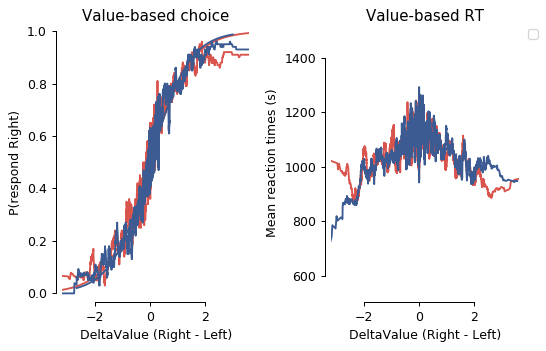

In [18]:
## get outputs of [thetafood,foodfopt]=fitData(datafood, dt=.0005)

outputDir = _thisDir + '/output'

sceneStimulusStatus = 'familiar'
with open(outputDir + '/' + sceneStimulusStatus + '_datafood.pickle', 'rb') as handle:
    f_datafood = pickle.load(handle)

with open(outputDir + '/' + sceneStimulusStatus + '_foodfopt.pickle', 'rb') as handle:
    f_foodfopt = pickle.load(handle)
    print sceneStimulusStatus, "foodfopt:", f_foodfopt

with open(outputDir + '/' + sceneStimulusStatus + '_thetafood.pickle', 'rb') as handle:
    f_thetafood = pickle.load(handle)
    print sceneStimulusStatus, "thetafood:", f_thetafood

sceneStimulusStatus = 'novel'
with open(outputDir + '/' + sceneStimulusStatus + '_datafood.pickle', 'rb') as handle:
    n_datafood = pickle.load(handle)

with open(outputDir + '/' + sceneStimulusStatus + '_foodfopt.pickle', 'rb') as handle:
    n_foodfopt = pickle.load(handle)
    print sceneStimulusStatus, "foodfopt:", n_foodfopt

with open(outputDir + '/' + sceneStimulusStatus + '_thetafood.pickle', 'rb') as handle:
    n_thetafood = pickle.load(handle)
    print sceneStimulusStatus, "thetafood:", n_thetafood

f_food=pd.read_csv(_thisDir + '/output/familiar_food_zscoredratings.csv')
f_food['deltavalrnd'] = f_food['deltaval'].round(1)
food = f_food
f_datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['deltaval']])
    
n_food=pd.read_csv(_thisDir + '/output/novel_food_zscoredratings.csv')
n_food['deltavalrnd'] = n_food['deltaval'].round(1)
food = n_food
n_datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['deltaval']])
    
datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['deltaval']])
plotFoodDataWithFit(f_datafoodplot, f_thetafood, n_datafoodplot, n_thetafood, dt=.0005)

In [7]:
# Look at delta values - not z-scored
food=pd.read_csv(_thisDir + '/output/food.csv')
subs=np.unique(food['subjid'].values)

f_delta=food.loc[food['sceneStimulusStatus']=='familiar'].deltaval
n_delta=food.loc[food['sceneStimulusStatus']=='novel'].deltaval
print 'Mean delta across all trials'
print 'familiar',f_delta.mean()
print 'novel',n_delta.mean()

print ''

print 'Mean delta across participants'
tmp=food.groupby(['subjid','sceneStimulusStatus'],as_index=False)['deltaval'].mean()
print tmp.groupby(['sceneStimulusStatus']).mean()

print len(f_delta)
print len(n_delta)
print scipy.stats.ttest_ind(f_delta,n_delta)

Mean delta across all trials
familiar -0.0407922712254
novel -0.00428168810522

Mean delta across participants
                     deltaval
sceneStimulusStatus          
familiar             -0.04059
novel                -0.00319
13922
13838
Ttest_indResult(statistic=-1.3058034823218636, pvalue=0.1916302171044399)


## Dynamic Trial Analyses

In [22]:
# probability of choosing item if context of last trial with this stim was familiar/novel 
# AND if current trial is familiar/novel AND if item was chosen on previous trial with this stim
food=pd.read_csv(_thisDir + '/output/food_zscoredratings.csv')
subs=np.unique(food['subjid'].values)
df_4dim=pd.DataFrame()

for sub in subs:
    # stimulus name is key, value is index of last trial in which the stimulus was show
    prevStimIndex = {}
    # stimulus name is key, value is boolean that is true if last time item was presented, it was on the right
    prevStimOnRight = {}
    
    subdf=food.loc[food['subjid']==sub]
    trialIndices=subdf.index.values # index in the food df, not actual trial numbers
    #print subdf

    for indexN in trialIndices:
        trial=subdf.loc[indexN,:]
        prevLeftImageIndex=-1
        prevRightImageIndex=-1
        # get trial index of last trial in which image left/right was presented
        if trial['ImageLeft'] in prevStimIndex.keys():
            prevLeftImageIndex = prevStimIndex[trial['ImageLeft']]
        if trial['ImageRight'] in prevStimIndex.keys():
            prevRightImageIndex = prevStimIndex[trial['ImageRight']]

        # check the sceneStimulusStatus of the last trial in which image left/right was presented
        for i in range(0,2):
            checkLeft = True
            prevImageIndex = prevLeftImageIndex
            if i == 1:
                checkLeft = False
                prevImageIndex = prevRightImageIndex
            
            # checking for ImageLeft
            if checkLeft and prevLeftImageIndex != -1:
                prevContext = subdf.loc[prevLeftImageIndex,'sceneStimulusStatus']
                choseItem = subdf.loc[indexN,'choseright'] == False
                choseRightOnPrevTrial = subdf.loc[prevLeftImageIndex,'choseright']
                if choseRightOnPrevTrial and prevStimOnRight[trial['ImageLeft']]: 
                    # chose right on prev trial and image was presented on right
                    choseItemOnPrevTrial = True
                elif not choseRightOnPrevTrial and not prevStimOnRight[trial['ImageLeft']]:
                    # chose left on prev trial and image was presented on left
                    choseItemOnPrevTrial = True
                else:
                    choseItemOnPrevTrial = False
                    
             # checking for ImageRight
            if not checkLeft and prevRightImageIndex != -1:
                prevContext = subdf.loc[prevRightImageIndex,'sceneStimulusStatus']
                choseItem = subdf.loc[indexN,'choseright'] == True
                if choseRightOnPrevTrial and prevStimOnRight[trial['ImageRight']]: 
                    # chose right on prev trial and image was presented on right
                    choseItemOnPrevTrial = True
                elif not choseRightOnPrevTrial and not prevStimOnRight[trial['ImageRight']]:
                    # chose left on prev trial and image was presented on left
                    choseItemOnPrevTrial = True
                else:
                    choseItemOnPrevTrial = False
            
            if prevImageIndex != -1:
                # store info in df_4dim dataframe
                prevDelta = subdf.loc[prevImageIndex,'deltaval']
                currDelta = subdf.loc[indexN,'deltaval']
                currRT = subdf.loc[indexN,'RT']
                trialData = {'subjid':sub,'Prev_context':prevContext, 'Curr_context':trial['sceneStimulusStatus'], 'Chose_item_on_prev_trial':choseItemOnPrevTrial, 'Chose_item_on_curr_trial':choseItem, 'Curr_RT':currRT, 'Prev_deltaval':prevDelta, 'Curr_deltaval':currDelta}
                df_4dim=df_4dim.append(trialData,ignore_index=True)
                

        # set prevStimIndex with value of current index for ImageLeft and ImageRight of current trial
        prevStimIndex[trial['ImageLeft']]=indexN
        prevStimIndex[trial['ImageRight']]=indexN
        
        prevStimOnRight[trial['ImageLeft']]=False
        prevStimOnRight[trial['ImageRight']]=True
        
df_4dim.to_csv(_thisDir + '/output/dynamic_trial_data.csv')

In [23]:
print df_4dim.columns

Index([u'Chose item on prev trial', u'Context', u'P(Choosing item)',
       u'Prev deltaval', u'Previous context', u'RT', u'deltaval', u'subjid'],
      dtype='object')


In [25]:
df_4dim.columns = ['Chose_item_on_prev_trial','Curr_context','Chose_item_on_curr_trial','Prev_deltaval','Prev_context','Curr_RT','Curr_deltaval','subjid']
df_4dim.to_csv(_thisDir + '/output/dynamic_trial_data.csv')

In [3]:
dynamic_trial_data = pd.read_csv(_thisDir + '/output/dynamic_trial_data.csv')

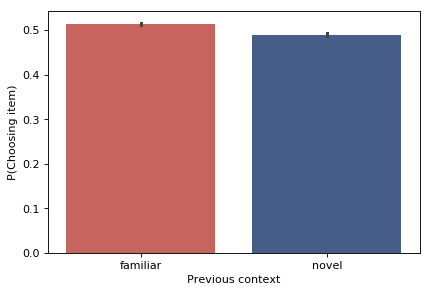

In [18]:
fig = plt.figure()
colors=[sns.xkcd_rgb["pale red"],sns.xkcd_rgb["denim blue"]]
ax = sns.barplot(x="Previous context", y="P(Choosing item)", data=df_4dim, palette=colors, ci=68)
#ax.set_title('')
plt.show()

In [12]:
print 'N trials:'
print df_4dim.groupby(['Previous context'])['P(Choosing item)'].count()

tmp=df_4dim.groupby(['subjid','Previous context'],as_index=False)['P(Choosing item)'].mean()

print tmp.groupby(['Previous context']).mean()
print tmp.groupby(['Previous context']).sem()

N trials:
Previous context
familiar    23684
novel       23678
Name: P(Choosing item), dtype: int64
                  P(Choosing item)
Previous context                  
familiar                  0.513781
novel                     0.489289
                  P(Choosing item)  subjid
Previous context                          
familiar                  0.002445     NaN
novel                     0.002301     NaN


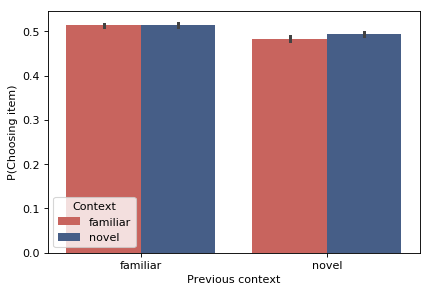

In [47]:
fig = plt.figure()
colors=[sns.xkcd_rgb["pale red"],sns.xkcd_rgb["denim blue"]]
ax = sns.barplot(x="Previous context", y="P(Choosing item)", hue="Context", hue_order=['familiar','novel'], data=df_4dim, palette=colors, ci=68)
#ax.set_title('')
plt.show()

In [14]:
print 'N trials:'
print df_4dim.groupby(['Previous context','Context'])['P(Choosing item)'].count()

tmp=df_4dim.groupby(['subjid','Previous context','Context'],as_index=False)['P(Choosing item)'].mean()

print tmp.groupby(['Previous context','Context']).mean()
print tmp.groupby(['Previous context','Context']).sem()

N trials:
Previous context  Context 
familiar          familiar    14523
                  novel        9161
novel             familiar     9207
                  novel       14471
Name: P(Choosing item), dtype: int64
                           P(Choosing item)
Previous context Context                   
familiar         familiar          0.513491
                 novel             0.514400
novel            familiar          0.482305
                 novel             0.493686
                           P(Choosing item)  subjid
Previous context Context                           
familiar         familiar          0.002889     NaN
                 novel             0.004619     NaN
novel            familiar          0.004313     NaN
                 novel             0.002786     NaN


<Figure size 480x320 with 0 Axes>

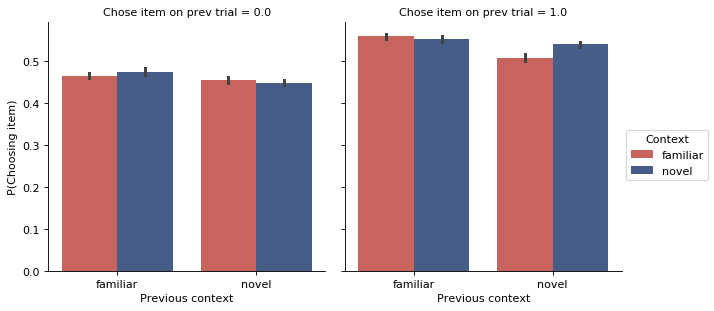

In [15]:
plt.rcParams['figure.dpi'] = 80
fig = plt.figure()
colors=[sns.xkcd_rgb["pale red"],sns.xkcd_rgb["denim blue"]]
ax = sns.factorplot(kind="bar", x="Previous context", y="P(Choosing item)", hue="Context", hue_order=['familiar','novel'], col="Chose item on prev trial", data=df_4dim, palette=colors, ci=68)
#ax.set_title('')
plt.show()

In [16]:
print 'N trials:'
print df_4dim.groupby(['Previous context','Context','Chose item on prev trial'])['P(Choosing item)'].count()

tmp=df_4dim.groupby(['subjid','Previous context','Context','Chose item on prev trial'],as_index=False)['P(Choosing item)'].mean()

print tmp.groupby(['Previous context','Context','Chose item on prev trial']).mean()
print tmp.groupby(['Previous context','Context','Chose item on prev trial']).sem()

N trials:
Previous context  Context   Chose item on prev trial
familiar          familiar  0.0                         7152
                            1.0                         7371
                  novel     0.0                         4607
                            1.0                         4554
novel             familiar  0.0                         4533
                            1.0                         4674
                  novel     0.0                         7298
                            1.0                         7173
Name: P(Choosing item), dtype: int64
                                                    P(Choosing item)
Previous context Context  Chose item on prev trial                  
familiar         familiar 0.0                               0.465669
                          1.0                               0.559664
                 novel    0.0                               0.475851
                          1.0                               0.55537

<Figure size 480x320 with 0 Axes>

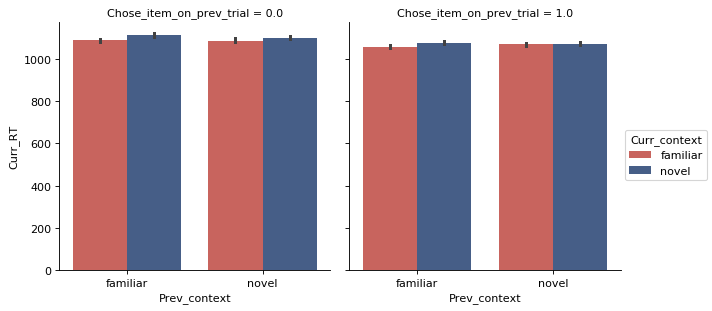

In [25]:
data = dynamic_trial_data.loc[dynamic_trial_data['Chose_item_on_curr_trial']==1]
plt.rcParams['figure.dpi'] = 80
fig = plt.figure()
colors=[sns.xkcd_rgb["pale red"],sns.xkcd_rgb["denim blue"]]
ax = sns.factorplot(kind="bar", x="Prev_context", y="Curr_RT", hue="Curr_context", hue_order=['familiar','novel'], col="Chose_item_on_prev_trial", data=data, palette=colors, ci=68)
plt.show()

In [29]:
print 'N trials:'
print dynamic_trial_data.groupby(['Prev_context','Curr_context','Chose_item_on_prev_trial'])['Curr_RT'].count()

tmp=dynamic_trial_data.groupby(['subjid','Prev_context','Curr_context','Chose_item_on_prev_trial'],as_index=False)['Curr_RT'].mean()

print dynamic_trial_data.groupby(['Prev_context','Curr_context','Chose_item_on_prev_trial'])['Curr_RT'].mean()
print dynamic_trial_data.groupby(['Prev_context','Curr_context','Chose_item_on_prev_trial'])['Curr_RT'].sem()

N trials:
Prev_context  Curr_context  Chose_item_on_prev_trial
familiar      familiar      0.0                         7152
                            1.0                         7371
              novel         0.0                         4607
                            1.0                         4554
novel         familiar      0.0                         4533
                            1.0                         4674
              novel         0.0                         7298
                            1.0                         7173
Name: Curr_RT, dtype: int64
Prev_context  Curr_context  Chose_item_on_prev_trial
familiar      familiar      0.0                         1079.605432
                            1.0                         1062.326714
              novel         0.0                         1102.044740
                            1.0                         1085.107914
novel         familiar      0.0                         1085.967131
                            

In [33]:
%%R -i dynamic_trial_data
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/dynamic_trial_data.csv', sep='')

dynamic_trial_data=read.table(foodFileName,header=T,sep=",")
#dynamic_trial_data$absdeltaval=abs(dynamic_trial_data$deltaval)

foodchmod=glmer(Chose_item_on_curr_trial ~ Chose_item_on_prev_trial * Prev_context * Curr_context + Curr_deltaval + Prev_deltaval + (1|subjid), family='binomial', data=dynamic_trial_data)
print(summary(foodchmod))

foodrtmod=lmer(Curr_RT ~ Chose_item_on_prev_trial * Prev_context * Curr_context + Curr_deltaval + Prev_deltaval + (1|subjid), data=dynamic_trial_data)
print(summary(foodrtmod))

Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: Chose_item_on_curr_trial ~ Chose_item_on_prev_trial * Prev_context *  
    Curr_context + Curr_deltaval + Prev_deltaval + (1 | subjid)
   Data: dynamic_trial_data

     AIC      BIC   logLik deviance df.resid 
 65315.6  65412.0 -32646.8  65293.6    47351 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-1.1537 -0.9524  0.8804  0.9823  1.1211 

Random effects:
 Groups Name        Variance Std.Dev.
 subjid (Intercept) 0        0       
Number of obs: 47362, groups:  subjid, 102

Fixed effects:
                                                              Estimate
(Intercept)                                                  -0.138477
Chose_item_on_prev_trial                                      0.379140
Prev_contextnovel                                            -0.039783
Curr_contextnovel                                             0.040712
Cur

In [34]:
foodmd = smf.mixedlm('Curr_RT ~ Chose_item_on_prev_trial * Prev_context * Curr_context + Curr_deltaval + Prev_deltaval', dynamic_trial_data, groups=dynamic_trial_data['subjid'])
foodmdf = foodmd.fit()
print(foodmdf.summary())

                                         Mixed Linear Model Regression Results
Model:                                MixedLM                     Dependent Variable:                     Curr_RT     
No. Observations:                     47362                       Method:                                 REML        
No. Groups:                           102                         Scale:                                  105074.8528 
Min. group size:                      194                         Likelihood:                             -341272.5582
Max. group size:                      480                         Converged:                              Yes         
Mean group size:                      464.3                                                                           
----------------------------------------------------------------------------------------------------------------------
                                                                       Coef.   Std.Err. 

In [30]:
print dynamic_trial_data.columns

Index([u'Unnamed: 0', u'Chose_item_on_prev_trial', u'Curr_context',
       u'Chose_item_on_curr_trial', u'Prev_deltaval', u'Prev_context',
       u'Curr_RT', u'Curr_deltaval', u'subjid'],
      dtype='object')


## Revaluation Analyses

In [ ]:
## Calculate revalued values

def fn_reval(delta_v,foodsub):
    # get number of trials
    ntrials=len(foodsub['subjid'])
    # make empty dataframe to populate with revalued values
    revalsub=pd.DataFrame(np.zeros((ntrials,2)),columns=['RevalueLeft','RevalueRight'])
    # get item names placed on left and right side of screen for all trials
    item=foodsub['ImageLeft']
    item=item.append(foodsub['ImageRight'])
    # get initial auction values for items on left and right for all trials
    value=foodsub['bidLeft']
    value=value.append(foodsub['bidRight'])
    # create a dataframe with item names and initial auction values
    tmp=pd.DataFrame({'item':item,'value':value})
    # create dataframe with 60 item names and initial auction values to be updated per trial
    value=tmp.groupby(['item'],as_index=False).mean()
    # go through trials to update values
    for t in range(ntrials):
        # get values for item on left and right from updated value dataframe
        valueleft=value[value['item']==foodsub.iloc[t]['ImageLeft']]['value']
        valueright=value[value['item']==foodsub.iloc[t]['ImageRight']]['value']
        # assign updated value for items on left and right on current trial
        revalsub.iloc[t]['RevalueLeft']= valueleft
        revalsub.iloc[t]['RevalueRight']= valueright
        # if right item chosen, increment value of item on right and decrement value of item on left
        if foodsub.iloc[t]['choseright']:
            value.loc[value['item']==foodsub.iloc[t]['ImageLeft'],'value']= valueleft - delta_v
            value.loc[value['item']==foodsub.iloc[t]['ImageRight'],'value']= valueright + delta_v
        # else if left item chosen, increment value of item on left and decrement value of item on right
        else:
            value.loc[value['item']==foodsub.iloc[t]['ImageLeft'],'value']= valueleft + delta_v
            value.loc[value['item']==foodsub.iloc[t]['ImageRight'],'value']= valueright - delta_v
    # calculate deltaval from revalued values
    revalsub['deltareval']=revalsub['RevalueRight'].values-revalsub['RevalueLeft'].values
    # choices and subject columns in ravalued dataframe
    revalsub['choseright']=foodsub['choseright'].values.astype('bool')
    revalsub['RT']=foodsub['RT'].values
    revalsub['ImageRight']=foodsub['ImageRight'].values
    revalsub['ImageLeft']=foodsub['ImageLeft'].values
    revalsub['subjid']=foodsub['subjid'].values
    # calculate goodness of fit to revalued values and output deviance
    mod=smf.glm('choseright ~ RevalueLeft + RevalueRight', data=revalsub,family = sm.families.Binomial())
    try:
        results = mod.fit()
        devsub=results.deviance
    except:
        pass
        devsub=9999
    return devsub, revalsub

def do_optim(s):
    tlow=-3
    thigh=3
    food=pd.read_csv('food.csv',header=0,index_col=0)
    uni_subj=food['subjid'].unique()
    foodsub=food[food['subjid']==uni_subj[s]]
    fn_fit = lambda x: fn_reval(x, foodsub)[0]
    # eval best delta_v:
    xopt=scipy.optimize.fminbound(func=fn_fit,x1=tlow,x2=thigh,disp=False)
    dev_opt=[uni_subj[s],fn_fit(xopt),xopt]
    return dev_opt

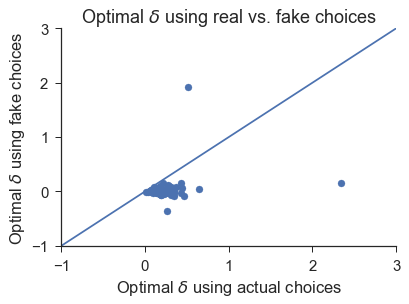

In [14]:
# ran do_optim on habanero
dev_opt=pd.read_csv(_thisDir + '/output/reval/all_dev_opt.csv')
dev_opt_fake=pd.read_csv(_thisDir + '/output/reval/all_dev_opt_fake.csv')
#Plot delta_v from revaluation algorithm output using real vs. fake choices
sns.set(font_scale=1.5)
sns.set_style("white")
sns.set_style("ticks")
plt.figure()
plt.scatter(dev_opt['opt_deltav'],dev_opt_fake['opt_deltav'])
plt.xlabel(r'Optimal $\delta$ using actual choices')
plt.ylabel(r'Optimal $\delta$ using fake choices')
plt.title(r'Optimal $\delta$ using real vs. fake choices')
plt.axis([-1,3, -1, 3])
plt.plot( [-1,3],[-1,3] )
sns.despine()
plt.show()

In [ ]:
## Calculate revalued values

def fn_reval_scene_split(theta,foodsub):
    
    #medianrt=np.median(foodsub.RT)
    
    deltavlo,deltavhi = theta
    # get number of trials
    ntrials=len(foodsub['subjid'])
    # make empty dataframe to populate with revalued values
    revalsub=pd.DataFrame(np.zeros((ntrials,2)),columns=['RevalueLeft','RevalueRight'])
    # get item names placed on left and right side of screen for all trials
    item=foodsub['ImageLeft']
    item=item.append(foodsub['ImageRight'])
    # get initial auction values for items on left and right for all trials
    value=foodsub['bidLeft']
    value=value.append(foodsub['bidRight'])
    # create a dataframe with item names and initial auction values
    tmp=pd.DataFrame({'item':item,'value':value})
    # create dataframe with 60 item names and initial auction values to be updated per trial
    value=tmp.groupby(['item'],as_index=False).mean()
    # go through trials to update values
    for t in range(ntrials):
        # get values for item on left and right from updated value dataframe
        valueleft=value[value['item']==foodsub.iloc[t]['ImageLeft']]['value']
        valueright=value[value['item']==foodsub.iloc[t]['ImageRight']]['value']
        # assign updated value for items on left and right on current trial
        revalsub.iloc[t]['RevalueLeft']= valueleft
        revalsub.iloc[t]['RevalueRight']= valueright
        
        context=foodsub.iloc[t]['sceneStimulusStatus']
        if context == 'familiar':
            delta_v=deltavlo
        else:
            delta_v=deltavhi
            
        # if right item chosen, increment value of item on right and decrement value of item on left
        if foodsub.iloc[t]['choseright']:
            value.loc[value['item']==foodsub.iloc[t]['ImageLeft'],'value']= valueleft - delta_v
            value.loc[value['item']==foodsub.iloc[t]['ImageRight'],'value']= valueright + delta_v
        # else if left item chosen, increment value of item on left and decrement value of item on right
        else:
            value.loc[value['item']==foodsub.iloc[t]['ImageLeft'],'value']= valueleft + delta_v
            value.loc[value['item']==foodsub.iloc[t]['ImageRight'],'value']= valueright - delta_v
    # calculate deltaval from revalued values
    revalsub['deltareval']=revalsub['RevalueRight'].values-revalsub['RevalueLeft'].values
    # choices and subject columns in ravalued dataframe
    revalsub['choseright']=foodsub['choseright'].values.astype('bool')
    revalsub['RT']=foodsub['RT'].values
    revalsub['ImageRight']=foodsub['ImageRight'].values
    revalsub['ImageLeft']=foodsub['ImageLeft'].values
    revalsub['subjid']=foodsub['subjid'].values
    # calculate goodness of fit to revalued values and output deviance
    mod=smf.glm('choseright ~ RevalueLeft + RevalueRight', data=revalsub,family = sm.families.Binomial())
    try:
        results = mod.fit()
        devsub=results.deviance
    except:
        pass
        devsub=9999
    return devsub

def do_optim_scene_split(s):
    tlow=[-0.6,-0.6]
    thigh=[0.6,0.6]
    food=pd.read_csv('./output/food_zscoredratings.csv',header=0,index_col=0)
    uni_subj=food['subjid'].unique()
    foodsub=food[food['subjid']==uni_subj[s]]
    # eval best delta_v:
    theta_init=[0,0]
    theta, xopt = fminbnd.fminbnd(fn_reval_scene_split,theta_init,args=[foodsub],LB=tlow,UB=thigh,disp=False)

    dev_opt=[uni_subj[s],theta[0],theta[1],xopt]
    return dev_opt

"""
food=pd.read_csv('./output/food_zscoredratings.csv',header=0,index_col=0)
# run 30 participants in parallel
inputs = range(len(food['subjid'].unique()))
num_cores = multiprocessing.cpu_count()
results = Parallel(n_jobs=num_cores)(delayed(do_optim_scene_split)(i) for i in inputs)
# convert output to dataframe to make life easier
dev_opt_scene_split=pd.DataFrame(results,columns=['subjid','opt_deltavlo','opt_deltavhi','dev'])
"""

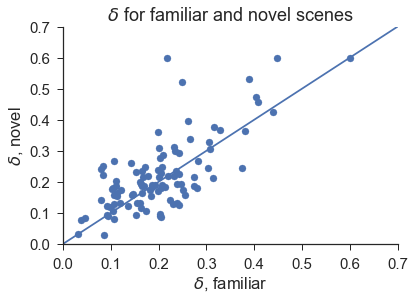

In [23]:
# ran do_optim_scene_split on habanero
dev_opt_scene_split=pd.read_csv(_thisDir + '/output/reval/all_dev_opt_scene_split.csv')
#Plot delta_v from revaluation algorith output using real vs. fake choices
sns.set(font_scale=1.5)
sns.set_style("white")
sns.set_style("ticks")
plt.figure()
plt.scatter(dev_opt_scene_split.opt_deltavlo,dev_opt_scene_split.opt_deltavhi)
plt.xlabel(r'$\delta$, familiar')
plt.ylabel(r'$\delta$, novel')
plt.title(r'$\delta$ for familiar and novel scenes')
plt.axis([0, .7, 0, .7])
plt.plot( [0,.7],[0,.7] )
sns.despine()
plt.show()

In [24]:
scipy.stats.ttest_rel(dev_opt_scene_split.opt_deltavlo,dev_opt_scene_split.opt_deltavhi)

Ttest_relResult(statistic=-2.1565920229032023, pvalue=0.033410600471385395)

In [25]:
dev_opt_scene_split.opt_deltavlo.mean() #familiar

0.20031835665116812

In [26]:
dev_opt_scene_split.opt_deltavhi.mean() #novel

0.21813059283385688

In [27]:
%%R 
library(readr)
library(lme4)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/food_zscoredratings.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
subs=unique(food$subjid)

sceneRevalName <- paste(outputDir, '/reval/all_dev_opt_scene_split.csv', sep='')
dev_opt_scene_split=read.table(sceneRevalName,header=T,sep=",")
familiar_deltav=dev_opt_scene_split$opt_deltavlo
novel_deltav=dev_opt_scene_split$opt_deltavhi

n=(length(novel_deltav))

#foodchmod=glmer(choseright ~ deltaval * sceneStimulusStatus + (1|subjid), family='binomial', data=food)
foodchmod=glmer(choseright ~ deltaval * sceneStimulusStatus + (deltaval|subjid), family='binomial', data=food)
cf=coef(foodchmod)

slopes=cf[[1]]$deltaval


dev_opt_scene_split$slope=slopes
dev_opt_scene_split$familiar_deltav=dev_opt_scene_split$opt_deltavlo
dev_opt_scene_split$novel_deltav=dev_opt_scene_split$opt_deltavhi


chmod=lm(slope ~ familiar_deltav + novel_deltav, data=dev_opt_scene_split)
print(summary(chmod))


Call:
lm(formula = slope ~ familiar_deltav + novel_deltav, data = dev_opt_scene_split)

Residuals:
     Min       1Q   Median       3Q      Max 
-2.09379 -0.29751 -0.00663  0.30409  1.58891 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
(Intercept)       2.3161     0.1302  17.791  < 2e-16 ***
familiar_deltav  -2.3862     0.8386  -2.846  0.00539 ** 
novel_deltav     -1.8198     0.6720  -2.708  0.00797 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.5601 on 99 degrees of freedom
Multiple R-squared:  0.3638,	Adjusted R-squared:  0.351 
F-statistic: 28.31 on 2 and 99 DF,  p-value: 1.891e-10

